In [1]:
import math
import itertools
import numpy as np
import random as ran
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
figure(num=None, figsize=(12,12), facecolor='w', edgecolor='k')
from sympy import reduced_totient
from sympy import totient
from tabulate import tabulate

########## Sets and Setup


def Setadd(set1,set2):
    set3=[]
    if type(set1)==int:
        set1=(set1,)
    if type(set2)==int:
        set2=(set2,)
    for i in set1:
        for j in set2:
            k=i+j
            set3.append(k)
    return(set3)
    
    
def MultiSetadd(set_of_sets):
    super_set=[]
    i=0
    while i in range(len(set_of_sets)):
        if i==0:
            super_set=set_of_sets[i]
            i+=1
        else:
            super_set=Setadd(super_set,set_of_sets[i])
            i+=1
    super_set.sort()
    return(super_set)

def MultiSetaddUnsorted(set_of_sets):
    super_set=[]
    i=0
    while i in range(len(set_of_sets)):
        if i==0:
            super_set=set_of_sets[i]
            i+=1
        else:
            super_set=Setadd(super_set,set_of_sets[i])
            i+=1
    return(super_set)



def SetaddCoord(set1,set2):
    set3=[]
    if type(set1)==int:
        set1=(set1,)
    if type(set2)==int:
        set2=(set2,)
    for i in enumerate(set1):
        for j in enumerate(set2):
            k=([i[0],j[0]],i[-1]+j[-1])
            set3.append(k)
    set3.sort(key= lambda last: last[-1])
    return(set3)

def SetaddCoord2(set1,set2):
    set3=[]
    for i in set1:
        for j in enumerate(set2):
            t=[]
            for m in i[0]:
                t.append(m)
            t.append(j[0])
            k=(t,i[1]+j[1])
            set3.append(k)
    set3.sort(key= lambda last: last[-1])
    return(set3)

def MultiSetaddCoord(set_of_sets):
    super_set=[]
    i=0
    while i in range(len(set_of_sets)):
        if i==0:
            super_set=set_of_sets[i]
            i+=1
        elif i==1:
            super_set=SetaddCoord(super_set,set_of_sets[i])
            i+=1
        else:
            super_set=SetaddCoord2(super_set,set_of_sets[i])
            i+=1
    super_set.sort(key= lambda last: last[-1])
    return(super_set)
    
    
def Union(lst1, lst2):     # union two sets
    final_list = sorted(lst1 + lst2) 
    return final_list 

def Union2(lst1, lst2):     # union two sets
    final_list = lst1 + lst2
    return final_list 
    
    
def AP(N,s,a):     # s<N>+a
    APset=[]
    for i in range(N):
        APset.append(s*i+a)
    return(APset)
    

def gcd(p,q):
# Create the gcd of two positive integers.
    while q != 0:
        p, q = q, p%q
    return p
def is_coprime(x, y):
    return gcd(x, y) == 1    
    
    
######## SD Set up

def F(JOF,l):
    Fset=[]
    runningtotal=1
    for i in range(0,l-1):
        Fset.append(JOF[i][1])
    for k in range(len(Fset)):
        total=runningtotal*Fset[k]
        runningtotal=total
    return(runningtotal)
        
    
def G(JOF,l):
    Gtotal=[]
    if (JOF[l-1][1]% 2) == 0:
        halfeven=int(JOF[l-1][1]/2)
        for i in AP(halfeven,1,1/2):
            Gtotal.append(F(JOF,l)*i)
    else:
        halfodd=int((JOF[l-1][1]-1)/2)
        for i in AP(halfodd,1,1):
            Gtotal.append(F(JOF,l)*i)
    return(Gtotal)


def H(JOF,l):
    Htotal=[]
    half=float((JOF[l-1][1]-1)/2)
    for i in AP(JOF[l-1][1],1,-half):
        Htotal.append(F(JOF,l)*i)
    return(Htotal)
    
    
def JLset(JOF,J):   # Curly L set for j
    Lset=[]
    for i, fset in enumerate(JOF, start=1):
        if J==fset[0]:
            Lset.append((fset,i))
    return(Lset)    


def SumSet(JOF,j):      # Produces the Sum Sets
    sum_set=[]
    for l in JLset(JOF,j):
        sum_set.append(AP(l[0][1],F(JOF,l[1]),0))
    return(MultiSetadd(sum_set))
    
def SumSet(JOF,j):      #Better SumSet code
    sum_set=[0]
    Fp=1
    for l in JOF:
        if l[0]==j:
            new=[]
            for f in range(0,l[1]):
                for s in sum_set:
                    new.append(s+Fp*f)
            sum_set=new
        Fp*=l[1]
    sum_set.sort()
    return(sum_set)
    
    
def SDSet(JOF,J):
    sdset=[]
    sumset=SumSet(JOF,J)
    sslen=len(sumset)
    halfway=int(sslen/2)
    if sslen%2==0:
        for i in range(halfway):
            if (sumset[halfway+i]-sumset[halfway-1-i])%2==0:
                sdset.append(int((sumset[halfway+i]-sumset[halfway-1-i])/2))
            else:
                sdset.append(float((sumset[halfway+i]-sumset[halfway-1-i])/2))
    else:
        for i in range(halfway):
            sdset.append(int((sumset[halfway+1+i]-sumset[halfway-1-i])/2))     
    return(sorted(sdset))
    
    
    
def SDSetBROKEN(JOF,J):    # Produces the Sum and Differance sets
    even_set=[]
    hsets=[]
    mega_hset=[]
    ultraset=[] 
    counting = 0
    for t in range(len(JLset(JOF,J))):
        hsets.append([])
    for k in enumerate(JLset(JOF,J)[::-1]):
        if k[1][0][1]%2==0:                    #  Checks if k is the largest in the index set
            even_set.append(G(JOF,k[1][1]))    #  k[1] is l, the position in the JOF
            for j in JLset(JOF,J)[::-1]:
                if j[1]<k[1][1]:
                    even_set.append(H(JOF,j[1]))
                else:
                    pass
            break   
        else:
            hsets[counting].append(G(JOF,k[1][1]))
            for j in enumerate(JLset(JOF,J)[::-1]):
                if j[0]>k[0]:
                    hsets[counting].append(H(JOF,j[1][1]))
            counting+=1               
    for p in range(counting):
        if len(MultiSetadd(hsets[p]))!=0:
            mega_hset.append(MultiSetadd(hsets[p]))
    for x in range(len(mega_hset)):
        for y in mega_hset[x]:
            ultraset.append(int(y))
    if len(MultiSetadd(even_set))!=0:
        for y in MultiSetadd(even_set):
            ultraset.append(int(y))
    return(sorted(ultraset))





######### Lsets

def LOddSet(JOF,J):
    loddset=[]
    for i in reversed(JLset(JOF,J)):
        if i[0][1]%2!=0:
            loddset.append(i)
        if i[0][1]%2==0:
            break
    loddset.reverse()
    return(loddset)
        
    
def LEvenl(JOF,J):
    le=[]
    for i in reversed(JLset(JOF,J)):
        if i[0][1]%2==0:
            le.append(i)
            break
    return(le)



def Pproduct(JOF,J,l):
    total=1
    for p in JLset(JOF,J):
        if p[1]<l:
            total*=p[0][1]
        else:
            break
    return(total)



# def NumberOfAxis(JOF):
#     list1=[]
#     for i in JOF:
#         list1.append(i[0])
#     return(sorted(list1)[-1])

def NumberOfAxis(JOF):
    set1=set({})
    for i in JOF:
        set1.add(i[0])
    return(len(set1))


def Axislist(JOF):
    axis=AxisSeq(JOF)
    axislist=[]
    for i in axis:
        if i not in axislist:
            axislist.append(i)
    return(sorted(axislist))












######### Summing sets

def SetSum(set):
    Running_total=0
    for i in set:
        Running_total+=i
    if Running_total%1==0:
        return(int(Running_total))
    else:
        return(Running_total)  

    
def SetSumSquare(set):
    Running_total=0
    for i in range(len(set)):
        Running_total+=set[i]*set[i]
    return(Running_total)


def SumSDSet(JOF,J):
    if len(LEvenl(JOF,J))==0:
        evenpart=0
    else:
        evenpart=F(JOF,LEvenl(JOF,J)[0][1])*Pproduct(JOF,J,LEvenl(JOF,J)[0][1])*LEvenl(JOF,J)[0][0][1]*LEvenl(JOF,J)[0][0][1]
    oddpart=0
    for l in LOddSet(JOF,J):
        oddpart+=F(JOF,l[1])*Pproduct(JOF,J,l[1])*(l[0][1]*l[0][1]-1)
    total=0.125*(oddpart+evenpart)
    return(total)













def permutations(iterable, r=None):
    pool = tuple(iterable)
    n = len(pool)
    r = n if r is None else r
    if r > n:
        return
    indices = list(range(n))
    cycles = list(range(n, n-r, -1))   ### say for n=3 and r=2, gives us [3,2] ### if n=r=3 gives [3,2,1]    
    yield tuple(pool[i] for i in indices[:r])
    ### for in in indices[:r]:  <- the :r says up to that point, so indices[:2] gives us [0,1]
    ###    pool[i]  ### take the ith spot of pool which is simply the given set
    while n:
        for i in reversed(range(r)):  ### for i being [2,1,0] for example.
            cycles[i] -= 1
            if cycles[i] == 0:
                indices[i:] = indices[i+1:] + indices[i:i+1]
                cycles[i] = n - i
            else:
                j = cycles[i]
                indices[i], indices[-j] = indices[-j], indices[i]
                yield tuple(pool[i] for i in indices[:r])
                break
        else:
            return

def permutations_no_repeat(iterable, r=None):
    pool = tuple(iterable)
    n = len(pool)
    r = n if r is None else r
    if r > n:
        return
    indices = list(range(n))
    cycles = list(range(n, n-r, -1))
    test1=tuple(pool[i] for i in indices[:r])
    count1=0
    for i in test1:
        try:
            if test1[i-1]==test1[i] or test1[i+1]==test1[i]:
                count1+=1
        except:
            pass
    if count1==0:
        yield test1
    while n:
        for i in reversed(range(r)):
            cycles[i] -= 1
            if cycles[i] == 0:
                indices[i:] = indices[i+1:] + indices[i:i+1]
                cycles[i] = n - i
            else:
                j = cycles[i]
                indices[i], indices[-j] = indices[-j], indices[i]
                test=tuple(pool[i] for i in indices[:r])
                count=0
                for i in range(1,r):
                    try:
                        if test[i-1]==test[i] or test[i+1]==test[i]:
                            count+=1
                    except:
                        pass
                if count==0:
                    if sorted(set(test))[-1]-sorted(set(test))[-2]==1:
                            count3=0
                            for l in range(1,sorted(set(test))[-1]):
                                if l not in test:
                                    count3+=1
                            if count3==0:
                                yield test
                break
        else:
            return
        
        
def permutations_no_repeat2(iterable, r=None):
    final_set=[]
    pool = tuple(iterable)
    n = len(pool)
    r = n if r is None else r
    if r > n:
        return
    indices = list(range(n))
    cycles = list(range(n, n-r, -1))
    test1=tuple(pool[i] for i in indices[:r])
    count1=0
    for i in range(1,len(test1)-1):
        try:
            if test1[i-1]==test1[i] or test1[i+1]==test1[i]:
                count1+=1
        except:
            pass
    if count1==0:
        final_set.append(test1)
    while n:
        for i in reversed(range(r)):
            cycles[i] -= 1
            if cycles[i] == 0:
                indices[i:] = indices[i+1:] + indices[i:i+1]
                cycles[i] = n - i
            else:
                j = cycles[i]
                indices[i], indices[-j] = indices[-j], indices[i]
                test=tuple(pool[i] for i in indices[:r])
                count=0
                for i in range(1,r):
                    try:
                        if test[i-1]==test[i] or test[i+1]==test[i]:
                            count+=1
                    except:
                        pass
                if count==0:
                    if test not in final_set:
                        if sorted(set(test))[-1]-sorted(set(test))[-2]==1:
                            count3=0
                            for l in range(1,sorted(set(test))[-1]):
                                if l not in test:
                                    count3+=1
                            if count3==0:
                                final_set.append(test)
                break
        else:
            break
    return(final_set)




def partition(collection):
    if len(collection) == 1:
        yield [ collection ]
        return
    first = collection[0]
    for smaller in partition(collection[1:]):
        for n, subset in enumerate(smaller):
            yield smaller[:n] + [[ first ] + subset]  + smaller[n+1:]
        yield [ [ first ] ] + smaller

        
        
        
        
        
        
####### Factors
def factors(n):            
    a =[i for i in range(1,int(n/2)+1) if n%i==0]+[n]
    return(a)

from functools import reduce
from math import sqrt
def factors(n):
        step = 2 if n%2 else 1
        return set(reduce(list.__add__,
                    ([i, n//i] for i in range(1, int(sqrt(n))+1, step) if n % i == 0)))


def prime_factors(n):
    i = 2
    factors = []
    while i * i <= n:
        if n % i:
            i += 1
        else:
            n //= i
            factors.append(i)
    if n > 1:
        factors.append(n)
    return factors




def ordered_factors(n):
    paired_list=[]
    part_p_fac=partition(prime_factors(n))
    part_p_fac_simp = []
    for i in part_p_fac:
        if i not in part_p_fac_simp:
            part_p_fac_simp.append(i)
    for i in part_p_fac_simp:
        count=1
        temp_list=[]
        while count<=len(i):
            for j in i:
                if len(j)==1:
                    temp_list.append(j[0])
                else:
                    prod=1
                    for k in j:
                        prod*=k
                    temp_list.append(prod)
                count+=1
        if paired_list.count(temp_list)==0:
            paired_list.append(temp_list)
    return(paired_list)


def unordered_factors(n):
    paired_list=[]
    part_p_fac=partition(prime_factors(n))
    part_p_fac_simp = []
    for i in part_p_fac:
        if sorted(i) not in part_p_fac_simp:
            part_p_fac_simp.append(i)
    for i in part_p_fac_simp:
        count=1
        temp_list=[]
        while count<=len(i):
            for j in i:
                if len(j)==1:
                    temp_list.append(j[0])
                else:
                    prod=1
                    for k in j:
                        prod*=k
                    temp_list.append(prod)
                count+=1
        if paired_list.count(sorted(temp_list))==0:
            paired_list.append(temp_list)
    return(paired_list)













####### JOF Creation

def JOFj(n):   #### Makes base JOF dimensions of n - to then be partitioned
    start=[1]
    final_list=[start]
    count=1
    count2=1
    while count<n:
        running3=[]
        for running in final_list:
            if len(running)!=count2:
                pass
            else:
                for i in range(1,final_list[-1][-1]+2):
                    running2=[]
                    if running[-1]==i:
                        pass
                    elif i>running[-1]+2:
                        pass
                    else:
                        running2.append(running+[i])
                    running3+=running2
        count+=1
        count2+=1
        final_list+=running3
    length=len(final_list)
    total=[]
    for j in final_list:
        temp_set=[]
        for i in j:
            for k in range(1,len(j)+1):
                if i==k:
                    if i<max(j):
                        temp_set.append(i+1)
                    elif i==max(j):
                        temp_set.append(1)
        total.append(temp_set)
    final_list+=total
    while length!=final_list:
        length=final_list
        total=[]
        for j in final_list:
            temp_set=[]
            for i in j:
                for k in range(1,len(j)+1):
                    if i==k:
                        if i<max(j):
                            temp_set.append(i+1)
                        elif i==max(j):
                            temp_set.append(1)
            total.append(temp_set)
        final_list+=total
        
    res = []
    for i in final_list:     
        if i not in res:
            if sorted(set(i))==[x+1 for x in range(sorted(i)[-1])]:
                res.append(i)
                
    for k in res: 
        c=[x for l,x in enumerate(res) if x!=k]
        for m in c:
            if len(k)==len(m):
                if sorted(k)==sorted(m):
                    res.remove(m)
            else:
                pass
    return(res)


    

def orderedJOFlen(n):   #### makess JOF dimensions of specified length
    if n==1:
        yield [(1,)]
        return
    a=JOFj(n)
    for i in a:
        if len(i)==n:
            if sorted(set(i))[-1]-sorted(set(i))[-2]==1:
                yield permutations_no_repeat2(i)
                

def unorderedJOFlenwhat(n):
    if n==1:
        yield [(1,)]
        return
    a=JOFj(n)
    for i in a:
        if len(i)==n:
            if sorted(set(i))[-1]-sorted(set(i))[-2]==1:
                yield i


def orderedJOF(i):
    total=[]
    for i in range(1,i+1):
        yield list(orderedJOFlen(i))


                        
                        
def AllJOF(n):     ##### MAKES ALL JOFs FOR n
    orderedfactors=unordered_factors(n)
    newordfac=[]
    for x in orderedfactors:
        newordfac.append(list(set(permutations(x))))
    for i in newordfac:
        for i2 in i:
            for j in list(orderedJOFlen(len(i2))):
                for k in j:
                    if len(i2)==len(k):
                        yield list(zip(k,i2))
                    
                        
def AllJOFdim(n,dimensions):
    orderedfactors=unordered_factors(n)
    for a in orderedfactors:
        if len(a)<dimensions:
            orderedfactors.remove(a)
    newordfac=[]
    for x in orderedfactors:
        newordfac.append(list(set(permutations(x))))
    for i in newordfac:
        for i2 in i:
            for j in list(orderedJOFlen(len(i2))):
                for k in j:
                    if sorted(k)[-1]==dimensions:
                        if len(i2)==len(k):
                            yield list(zip(k,i2))




def AllJOFsymm(n):     #### gives symmetric JOFs  !!!WARNING!!! NEED TO DOUBLE CHECK THIS
    npfactors=prime_factors(n)
    for p in npfactors:
        if npfactors.count(p)>1:
            pass
        else:
            return([[]])
    A=AllJOF(n)
    stuff_to_remove=[]
    for i in A:
        if len(i)==1:
            stuff_to_remove.append(i)
        else:
            maxj=0
            for t in i:
                if t[0]>maxj:
                    maxj=t[0]
            for j in range(1,maxj):
                if Pproduct(i,j,n*n)!=Pproduct(i,j+1,n*n):
                    stuff_to_remove.append(i)
    for x in stuff_to_remove:
        try: 
            A.remove(x)
        except:
            pass
    return(A)








##################### ALL JOFS AND SD SETS



def AllJOFLocked(n,locked_axis):    ### LOCKS LAST AXIS (used for later code)
    for i in AllJOF(n):
        if i[-1][0]==locked_axis:
            yield i
            
        
def AllSD(n):    ### ALL SUM AND DISTANCE SETS FOR A GIVEN n
    llen=len(unordered_factors(n))
    for i in AllJOF(n):
        print(i)
        for l in range(1,llen+1):
            if len(SDSet(i,l))!=0:
                print("SD {}:".format(l),SDSet(i,l))
        print("")
        
                    
def AllSDLocked(n,locked_axis):    ### ALL SUM AND DISTANCE SETS WITH A LOCKED AXIS
    llen=len(unordered_factors(n))
    for i in AllJOFLocked(n,locked_axis):
        for l in range(1,llen+1):
            if len(SDSet(i,l))!=0:
                print("{} SD {}:".format(i,l),SDSet(i,l))
        print("")
        

def SDsquare(n,numofaxis):    ### GIVES SQUARE SUM DISTANCE SETS - COULD BE MADE FASTER?
    for i in AllJOF(n):
        if len(i)==1:
            pass
        else:
            num = NumberOfAxis(i)
            if num==numofaxis:
                basecase=Pproduct(i,1,100)
                total_set=[basecase]
                for j in range(2,num+2):
                    if Pproduct(i,j,100)==basecase:
                        total_set.append(Pproduct(i,j,100))
                if len(total_set)==num:
                    yield i
                    
                    
                    
#################### Bo JOFS AND SD SETS
                    
                    
def unorderedJOFlen(n):    ### AN UNORDERED LIST OF JOFS WHAT THE FUCK DOES THIS CODE DO?!
    if n==1:
        yield [(1,)]
        return
    a=JOFj(n)
    thelist=[]
    for j in a:
        if len(j)==n:
            if sorted(set(j))[-1]-sorted(set(j))[-2]==1:
                thelist.append(j)
    for i in thelist:
        for x in permutations_no_repeat2(i):
            if x[-1]==sorted(x)[-1]:
                yield x
                
                
def BoUnorderedJOFlen(n):     ############# doesnt spiut out 4142434!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    a = unorderedJOFlen(n)
    for i in a:
        revpool=[i2 for i2 in reversed(range(1,max(i)+1))]
        counter=1
        ticker=0
        for k in range(n):
            if i[-k-1] in revpool[:counter]:
                if k==0:
                    counter+=1
                    ticker+=1
                elif i[-k-1] not in list(i[-k:]):
                    if counter<len(revpool)+1:
                        counter+=1
                    ticker+=1
        if ticker==len(revpool):
            yield i
            

def BoJOF(n):
    orderedfactors=unordered_factors(n)
    newordfac=[]
    for x in orderedfactors:
        newordfac.append(list(set(permutations(x))))
    yield [(1,n)]
    for i in newordfac[1:]:
        for i2 in i:
            for k in list(BoUnorderedJOFlen(len(i2))):
                    if len(i2)==len(k):
                        yield list(zip(k,i2))
                        
                        
def BoJOFLockedDim(n,dim):        ###### ISSUE: FOR N=2^7, DIM=7 IT DOESNT GENERATE (1,4)(1,2)(1,4)(2,2)(1,4)(3,2)(1,4)
    orderedfactors=unordered_factors(n)
    newordfac=[]
    for x in orderedfactors:
        newordfac.append(list(set(permutations(x))))
    if dim==1:
        yield [(1,n)]
    for i in newordfac[1:]:
        for i2 in i:
            for k in list(BoUnorderedJOFlen(len(i2))):
                    if len(i2)==len(k) and k[-1]==dim:
                        yield list(zip(k,i2))
                        
                        
def BoSD(n,numofaxis):
    set1=[]
    for i in BoJOFLockedDim(n,numofaxis):
        set1.append(i)
        for j in range(1,NumberOfAxis(i)+1):
            set1.append(("A{}: {}".format(j,SDSet(i,j)),"Sum A{}: {}".format(j,SumSDSet(i,j))))
        set1.append("")
    return(set1)


def BoSD2D2only(n):
    set0=[]
    set1=[]
    for i in BoJOFLockedDim(n,2):
        set0.append([i,Pproduct(i,2,1000)])
        
    sset0=sorted(set0, key=lambda jof: jof[1])
    
    for i in sset0:
        set1.append(i)
        set1.append((SDSet(i[0],2),"Sum: {}".format(SumSDSet(i[0],2))))
        set1.append("")
    return(set1)


def BoJOFsquareUnsorted(n,numofaxis):
    for i in BoJOFLockedDim(n,numofaxis):
        if len(i)==1:
            pass
        else:
            num = NumberOfAxis(i)
            if num==numofaxis:
                basecase=Pproduct(i,1,100)
                total_set=[basecase]
                for j in range(2,num+2):
                    if Pproduct(i,j,100)==basecase:
                        total_set.append(Pproduct(i,j,100))
                if len(total_set)==num:
                    yield i
                    
                    
def BoSDsquare(n,numofaxis):
    return(sorted(BoJOFsquareUnsorted(n,numofaxis),key=lambda jof: len(jof)))


def BoSDsquareSum(n,numofaxis):
    set1=[]
    for i in BoSDsquare(n,numofaxis):
        for j in range(1,NumberOfAxis(i)+1):
            set1.append((i,j,SumSDSet(i,j)))
        set1.append("")
    return(set1)








########################## OVERLAP MATRICES CODE




def AxisSeq(JOF):
    axisseq=[]
    for i in JOF:
        axisseq.append(i[0])
    return(axisseq)


def PairedAxisSeq(JOF,i,j):
    pairedlist=[]
    for a in AxisSeq(JOF):
        if a==i or a==j:
            pairedlist.append(a)
    return(pairedlist)


def PairedFullAxisSeq(JOF,i,j):
    pairedlist=[]
    for a in JOF:
        if a[0]==i or a[0]==j:
            pairedlist.append(a)
    return(pairedlist)


def ReducedPairedAxisSeq(JOF,i,j):
    redpairedlist=[0]
    for a in AxisSeq(JOF):
        if a==i or a==j:
            if redpairedlist[-1]!=a:
                redpairedlist.append(a)
    redpairedlist.remove(0)
    return(redpairedlist)


def ReducedPairedFullAxisSeq(JOF,i,j):
    lookinglist=PairedFullAxisSeq(JOF,i,j)
    lookinglist.append((0,0))
    redpairedlist=[]
    count=0
    for a in enumerate(lookinglist):
        if count==1:
            count-=1
            pass
        else:
            if a[1][0]==i or a[1][0]==j:
                if lookinglist[a[0]+1][0]==a[1][0]:
                    redpairedlist.append((a[1][0],lookinglist[a[0]+1][1]*a[1][1]))
                    count+=1
                else:
                    redpairedlist.append(a[1])
    return(redpairedlist)


def LastEven(JOF):
    JOF.insert(0,(0,2))
    for i in enumerate(reversed(JOF)):
        if i[1][1]%2==0:
            return(len(JOF)-i[0]-1,i[1][0])


def ParityVector(JOF):
    parity=[]
    for a in range(NumberOfAxis(JOF)):
        parity.append([])
    
    axislist=Axislist(JOF)
    
    for i in axislist:
        for j in JOF:
            if j[0]==i:
                if j[1]%2==0:
                    parity[i-1].append("e")
                else:
                    parity[i-1].append("o")
    return(parity)


def SetsOverLap(JOF,i,j):
    if i==j:
        return(1) 
    list1=sorted([i,j])
    
    
    if len(ReducedPairedFullAxisSeq(JOF,i,j))<=2:
        return(0)
    if LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]==len(ReducedPairedFullAxisSeq(JOF,i,j)):
        return(0)
    
    if i<j:
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[0] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[1]:
            if LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[1]==list1[0] and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=1 and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=2:
                return(1)
            else:
                return(-1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[1] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[0]:
            return(-1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[1] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[1]:
            if LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[1]==list1[1] and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=1 and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=2:
                return(-1)
            else:
                return(1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[0] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[0]:
            return(-1)
    if i>j:
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[0] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[1]:
            return(-1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[1] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[0]:
            if LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[1]==list1[1] and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=1 and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=2:
                return(1)
            else:
                return(-1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[1] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[1]:
            return(-1)
        if ReducedPairedFullAxisSeq(JOF,i,j)[0][0]==list1[0] and ReducedPairedFullAxisSeq(JOF,i,j)[-1][0]==list1[0]:
            if LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[1]==list1[0] and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=1 and LastEven(ReducedPairedFullAxisSeq(JOF,i,j))[0]!=2:
                return(-1)
            else:
                return(1)
            

 
def OverLapMtx(JOF):
    num=NumberOfAxis(JOF)
    numbers=[]
    for a in range(0,num):
        numbers.append([])
    
    for i in range(1,num+1):
        for j in range(1,num+1):
            numbers[i-1].append(SetsOverLap(JOF,i,j))
    return(np.array(numbers))






##############################    COUNTING JOFS
def AllFactors(n):
    list1=[]
    for i in ordered_factors(n):
        for j in permutations(i):
            if j not in list1:
                list1.append(j)
    return(list1)


def AllFactorslen(n,l):
    list1=[]
    for i in ordered_factors(n):
        if len(i)==l:
            for j in permutations(i):
                if j not in list1:
                    list1.append(j)
    return(list1)


def NumPrimeFac(n):
    prime_list=[]
    for j in range(2,math.floor(n/2)+1):
        count=0
        for i in range(2, math.floor(math.sqrt(j))+1): 
            if (j % i) == 0: 
                count+=1
                break
            else: 
                pass
        if count==0:
            prime_list.append(j)
    totalcount=0
    for p in prime_list:
        if n%p==0:
            totalcount+=1
    if totalcount==0:
        return(1)
    else:
        return(totalcount)
    
    
def PrimePowers(n):
    pfac=prime_factors(n)
    list1=[]
    for i in pfac:
        if (i,pfac.count(i)) not in list1:
            list1.append((i,pfac.count(i)))
    return(list1)


def convolution(f1, f2, n):
    total=0
    for i in AllFactorslen(n,2):
        total+=f1(i[0])*f2(i[1])
    return(total)


def selfjconvolution(f,n,j):
    total=0
    for i in AllFactorslen(n,j):
        temp_list=[]
        tottemp=1
        for k in range(j):
            temp_list.append(f(i[k]))
        for m in temp_list:
            tottemp*=m
        total+=tottemp
    return(total)


def e(n):
    if n==1:
        return(1)
    else:
        return(0)
    
def one(n):
    return(1)

def one_minus_e(n):
    return(one(n)-e(n))


def c(j,n):
    return(selfjconvolution(one_minus_e,n,j))


def negbinom(n,k):
    if n>-1 and k>-1:
        return(math.comb(n,k))
    else:
        return((-1)**k * math.comb(-n+k-1,k))


def cjr(j,r,n):
    alist=[]
    for a in PrimePowers(n):
        alist.append(a[1])
    nump=len(alist)
    total=0
    for k in range(0,j+1):
        prod=1
        for l in range(0,nump):
            if alist[l]+r+j-k-1<0:
                prod*=negbinom(alist[l]+r+j-k-1,alist[l])
            else:
                prod*=math.comb(alist[l]+r+j-k-1,alist[l])
        total+=(-1)**k * math.comb(j, k) * prod
    return(total)


def stirling(n,k):
    n1=n
    k1=k
    if n<=0:
        return 1
    elif k<=0:
        return 0
    elif (n==0 and k==0):
        return -1
    elif n!=0 and n==k:
        return 1
    elif n<k:
        return 0
    else:
        temp1=stirling(n1-1,k1)
        temp1=k1*temp1
        return (k1*(stirling(n1-1,k1)))+stirling(n1-1,k1-1)

    

    
    
    
def NumberOfJOFs(n):
    total=0
    for m in range(1,len(prime_factors(n))+1):
        for L in range(m,len(prime_factors(n))+1):
            if cjr(L,-L,n)!=0:
                total+=math.factorial(m) * stirling(L,m) * cjr(L,-L,n)
    return(total)


def NumberOfmJOFs(n,m):
    total=0
    for L in range(m,len(prime_factors(n))+1):
        if cjr(L,-L,n)!=0:
            total+=math.factorial(m) * stirling(L,m) * cjr(L,-L,n)
    return(total)

def NumberOfBOJFs(n):
    total=0
    for m in range(1,len(prime_factors(n))+1):
        for L in range(m,len(prime_factors(n))+1):
            if cjr(L,-L,n)!=0:
                total+= stirling(L,m) * cjr(L,-L,n)
    return(total)

def NumberOfmBOJFs(n,m):   ### Number of BOJFs for fixed dimension
    total=0
    for L in range(m,len(prime_factors(n))+1):
        if cjr(L,-L,n)!=0:
            total+= stirling(L,m) * cjr(L,-L,n)
    return(total)



#################################################### Spacing


def Spacing(JOF):
    SDsets=[]
    for i in range(1,NumberOfAxis(JOF)+1):
        SDsets.append(SDSet(JOF,i))
    spacing=[]
    for s in SDsets:
        if len(s)==1:
            spacing.append([0])
        else:
            current=[int(s[0])]
            
            for j in range(len(s)-1):
                current.append(int(s[j+1]-s[j]))
            spacing.append(current)
    return(spacing)



def SetSpacing(set1):
    current=[]
    for j in range(len(set1)-1):
        current.append(int(set1[j+1]-set1[j]))
    return(current)









#################################################### ORBITS



def FindCoordinate(JOF,n):
    numofaxis=NumberOfAxis(JOF)
    sumsets=[]
    for i in range(1,numofaxis+1):
        sumsets.append(SumSet(JOF,i))
    totalset=MultiSetaddCoord(sumsets)
    for t in totalset:
        if t[-1]==n:
            return(t[0])
            break


def CoordinateResult(JOF,coord):
    numofaxis=NumberOfAxis(JOF)
    sumsets=[]
    for i in range(1,numofaxis+1):
        sumsets.append(SumSet(JOF,i))
    coordterm=0
    for a in enumerate(coord):
        coordterm+=sumsets[a[0]][a[1]]
    return(coordterm)


def OrbitnSet(JOF1,JOF2,n):
    currentn=n
    currentcoord=FindCoordinate(JOF1,currentn)
    orbitnset=[currentn]
    orbitcoordset=[currentcoord]
    count=0
    while count==0:
        currentn=CoordinateResult(JOF2,currentcoord)
        if currentn==n:
            count+=1
            break
        else:
            currentcoord=FindCoordinate(JOF1,currentn)
            orbitnset.append(currentn)
            orbitcoordset.append(currentcoord)
    return(orbitnset,orbitcoordset)


def OrbitSets(JOF1,JOF2):
    totalnumbers=[]
    target=1
    for i in JOF1:
        target=target*i[1]
    for i in range(target):
        count=0
        for j in OrbitnSet(JOF1,JOF2,i)[0]:
            if j not in totalnumbers:
                totalnumbers.append(j)
                count+=1
        if count>0:
            yield OrbitnSet(JOF1,JOF2,i)

            
def Orbits(JOF1,JOF2):
    totalnumbers=[]
    target=1
    for i in JOF1:
        target=target*i[1]
    for i in range(target):
        count=0
        for j in OrbitnSet(JOF1,JOF2,i)[0]:
            if j not in totalnumbers:
                totalnumbers.append(j)
                count+=1
        if count>0:
            yield OrbitnSet(JOF1,JOF2,i)[0]


def OrbitsSimplist(n1,n2):
    N=n1*n2
    OGset=[b for b in range(N)]
    AllOrb=[[0]]
    done=[0]
    for c in range(1,N):
        if c not in done:
            orb=[c]
            new=(c*n2)%(N-1)
            if new==0:
                AllOrb.append(orb)
                done.append(c)
                break
            while new!=orb[0]:
                orb.append(new)
                new=(orb[-1]*n2)%(N-1)
            for d in orb:
                done.append(d)
            AllOrb.append(orb)
    yield(AllOrb)
            

def OrbitPictures(JOF1,JOF2,size=9):
    ax1size=1
    ax2size=1
    for i in JOF1:
        if i[0]==1:
            ax1size*=i[1]
        if i[0]==2:
            ax2size*=i[1]
#    norbits=[]
    coordorbits=[]
    for i in list(OrbitSets(JOF1,JOF2)):
        coordorbits.append(i[1])
#         norbits.append(i[0])
    for j in coordorbits:
        if len(j)==1:
            plt.plot([j[0][0]],[j[0][1]],'bo')
        else:
            xplot=[]
            yplot=[]
            for k in j:
                xplot.append(k[0])
                yplot.append(k[1])
            xplot.append(j[0][0])
            yplot.append(j[0][1])
            plt.plot(xplot,yplot, linewidth=4,)
    xscale=[]
    for a in range(ax1size):
        xscale.append(a)
    yscale=[]
    for a in range(ax2size):
        yscale.append(a)
    plt.grid(which='both', color='#666666')
   # plt.gca().set_aspect('equal', adjustable='box')
    plt.axis([0, ax1size-1, 0, ax2size-1])
    plt.xticks(xscale)
    plt.yticks(yscale)
    plt.show()

    
def PermutationViaCode(collection,code): 
    newcode=[]
    for x in code:
        if len(x)==1:
            newcode.append([x[0],x[0]])
        else:
            temp=[]
            for y in x:
                if y!=x[-1]:
                    newcode.append([y,x[x.index(y)+1]])
                else:
                    newcode.append([y,x[0]])
    done=[]
    for a in collection:
        if a==0:
            done.append(0)
        elif a==len(collection)-1:
            done.append(a)
        else:
            for b in newcode:
                if a==b[0]:
                    done.append(b[1])
    return(done)


def CodeViaPermutation(perm):
    base=[i for i in range(len(perm))]
    code=[]
    done=[]
    for a in enumerate(perm):
        if a[1] not in done:
            if a[1]==base[a[0]]:
                code.append([a[1]])
                done.append(a[1])
            else:
                temp=[]
                count=0
                current=base[a[0]]
                while count==0:
                    temp.append(current)
                    current=perm[base.index(temp[-1])]
                    if current==temp[0]:
                        count+=1
                for t in temp:
                    done.append(t)
                code.append(temp)

    return(code)


def InverseCode(code):
    invcode=[]
    for i in code:
        if len(i)==1 or len(i)==2:
            invcode.append(i)
        else:
            temp=[i[0]]
            for a in reversed(i[1:]):
                temp.append(a)
            invcode.append(temp)
    return(invcode)    
    
    
    
def PermutationViaPermVsPerm(perm1,perm2):
    cycle=[]
    done=[]
    perm1_cycle=CodeViaPermutation(perm1)
    perm2_cycle=CodeViaPermutation(perm2)
    
    for a in range(len(perm1)):
        if a not in done:
            temp=[]
            currentn=a
            count=0
            while count==0:
                temp.append(currentn)
                done.append(currentn)
                currentn=perm2[perm1[currentn]]
                if currentn==a:
                    count+=1
            cycle.append(temp)
    return(PermutationViaCode([i for i in range(len(perm1))],cycle))

def CodeViaPermVsPerm(perm1,perm2):
    cycle=[]
    done=[]
    perm1_cycle=CodeViaPermutation(perm1)
    perm2_cycle=CodeViaPermutation(perm2)
    
    for a in range(len(perm1)):
        if a not in done:
            temp=[]
            currentn=a
            count=0
            while count==0:
                temp.append(currentn)
                done.append(currentn)
                currentn=perm2[perm1[currentn]]
                if currentn==a:
                    count+=1
            cycle.append(temp)
    return(cycle)
    
    
    
def CodeViaCodeVsCode(code1,code2):
    cycle=[]
    done=[]
    length=0
    for i in code1:
        length+=len(i)
    perm1=PermutationViaCode([j for j in range(length)],code1)
    perm2=PermutationViaCode([j for j in range(length)],code2)
    for a in range(length):
        if a not in done:
            temp=[]
            currentn=a
            count=0
            while count==0:
                temp.append(currentn)
                done.append(currentn)
                currentn=perm2[perm1[currentn]]
                if currentn==a:
                    count+=1
            cycle.append(temp)
    return(cycle)
    
    
    
    
    
    
def MoveOp(jof):      #### Only moves lowest factor of last pair, so if it was (3,6) it owuld move (3,2) then (3,3)
    lastaxis=jof[-1][0]
    lastf=jof[-1][1]
    lastfprime=prime_factors(lastf)
    newjof=[]
    if len(lastfprime)==1:
        if jof[0][0]!=lastaxis:
            newjof.append((lastaxis,lastfprime[0]))
            for j in jof[:-1]:
                newjof.append((j[0],j[1]))
        else:
            newjof.append((lastaxis, lastfprime[0]*jof[0][1]))
            for j in jof[1:-1]:
                newjof.append((j[0],j[1]))
    else:
        if jof[0][0]!=lastaxis:
            newjof.append((lastaxis,lastfprime[0]))
            for j in jof[:-1]:
                newjof.append((j[0],j[1]))
            newjof.append((lastaxis,int(lastf/lastfprime[0])))
        else:
            newjof.append((lastaxis, lastfprime[0]*jof[0][1]))
            for j in jof[1:-1]:
                newjof.append((j[0],j[1]))
            newjof.append((lastaxis,int(lastf/lastfprime[0])))
    return(newjof)

def ReverseBackwardOrder(JOF):
    numax=NumberOfAxis(JOF)
    newjof=[]
    joflen=len(JOF)
    axislist=[]
    for a in JOF:
        axislist.append(a[0])
    permcode=[]
    for x in range(numax):
        permcode.append([])
    done=[]
    counter=numax
    for b in axislist:
        if b not in done:
            permcode[b-1].append(counter)
            counter-=1
            done.append(b)
    for i in JOF:
        newjof.append((permcode[i[0]-1][0],i[1]))
    return(newjof)


def ForwardOrder(JOF):
    numax=NumberOfAxis(JOF)
    newjof=[]
    joflen=len(JOF)
    axislist=[]
    for a in JOF:
        axislist.append(a[0])
    permcode=[]
    for x in range(numax):
        permcode.append([])
    done=[]
    counter=1
    for b in axislist:
        if b not in done:
            permcode[b-1].append(counter)
            counter+=1
            done.append(b)
    for i in JOF:
        newjof.append((permcode[i[0]-1][0],i[1]))
    return(newjof)


def BackwardOrder(JOF):
    numax=NumberOfAxis(JOF)
    newjof=[]
    joflen=len(JOF)
    axislist=[]
    for a in JOF:
        axislist.append(a[0])
    permcode=[]
    for x in range(numax):
        permcode.append([])
    done=[]
    counter=numax
    for b in reversed(axislist):
        if b not in done:
            permcode[b-1].append(counter)
            counter-=1
            done.append(b)
    for i in JOF:
        newjof.append((permcode[i[0]-1][0],i[1]))
    return(newjof)

def ReverseForwardOrder(JOF):
    numax=NumberOfAxis(JOF)
    newjof=[]
    joflen=len(JOF)
    axislist=[]
    for a in JOF:
        axislist.append(a[0])
    permcode=[]
    for x in range(numax):
        permcode.append([])
    done=[]
    counter=1
    for b in reversed(axislist):
        if b not in done:
            permcode[b-1].append(counter)
            counter+=1
            done.append(b)
    for i in JOF:
        newjof.append((permcode[i[0]-1][0],i[1]))
    return(newjof)

def ChainList(collection):      #######    Only works for pure powers of primes, not for f values like 6.
    
    newcollection=collection
    chains=[]
    while len(newcollection)!=0:
#        for i in newcollection:
        i=newcollection[0]
        runninglist=[i]
        current=BackwardOrder(MoveOp(i))
        while current!=i:
            runninglist.append(current)
            current=BackwardOrder(MoveOp(current))
        #chains.append(runninglist)
        yield runninglist
        for x in runninglist:
            try:
                newcollection.remove(x)
            except:
                pass
#            break
    #print(chains)
    
    
def LatexFrac(set):
    newset=[]
    for i in set:
        if isinstance(i, int):
            newset.append(i)
        else:
            newset.append("$\\frac{{{}}}{{{}}}$".format(int(i*2),2))
    return(newset)










##########################################   MATRIX PICTURES

def Sum2dimMatrix(JOF):
    rows=[]
    numofrows=len(SumSet(JOF,2))
    numofcol=len(SumSet(JOF,1))
    for i in range(numofrows):
        rows.append([])
    rows[0]=SumSet(JOF,1)
    for j in enumerate(rows):
        if j[0]==0:
            pass
        else:
            for t in SumSet(JOF,1):
                rows[j[0]].append(SumSet(JOF,2)[j[0]]+t)
    return(np.array(rows))


def JOFPjList(JOF,j):
    jpair=[]
    for a in JOF:
        if a[0]==j:
            jpair.append(a)
    Pjlist=[]
    runningtotal=1
    for b in jpair:
        Pjlist.append(runningtotal)
        runningtotal*=b[1]
    return(Pjlist)

def AllJOFPjList(JOF):
    totals=[]
    for a in range(1,NumberOfAxis(JOF)+1):
        totals.append(JOFPjList(JOF,a))
    return(totals)

def FullJOFPjList(JOF):
    pjlist=AllJOFPjList(JOF)
    runningtots=[]
    allpj=[]
    for a in range(NumberOfAxis(JOF)):
        runningtots.append([0])
    
    for b in JOF:
        currentnum=runningtots[b[0]-1][0]
        allpj.append(pjlist[b[0]-1][currentnum])
        runningtots[b[0]-1][0]+=1
    print(allpj)

def weakcompositions(n,k):
    if n < 0 or k < 0:
        return
    elif k == 0:
        if n == 0:
            yield []
        return
    elif k == 1:
        yield [n]
        return
    else:
        for i in range(0,n+1):
            for comp in weakcompositions(n-i,k-1):
                yield [i] + comp

def compositions(n,k):
    for c in weakcompositions(n,k):
        if 0 not in c:
            yield c
            

def jCoordinateAsPj(JOF,n,j):
    coord=FindCoordinate(JOF,n)[j-1]
    pjlist=JOFPjList(JOF,j)
    compofcoord=[]
    for a in list(weakcompositions(coord,len(pjlist))):
        compofcoord.append(a)
    newlen=0
    while len(compofcoord)!=newlen:
        newlen=len(compofcoord)
        for d in compofcoord:
            
            copy=[]
            for e in d:
                copy.append(e)
            newcopy=[]
            count=0
            for f in copy:
                if f==0:
                    newcopy.append(0)
                    pass
                else:
                    if count==0:
                        newcopy.append(f-1)
                        count+=1
                    else:
                        newcopy.append(f)
            if newcopy not in compofcoord:
                compofcoord.append(newcopy)
    upper=[]
    for k in JOF:
        if k[0]==j:
            upper.append(k[1])
    remove=[]
    for h in compofcoord:
        count=0
        for i in enumerate(h):
            if i[1]>=upper[i[0]]:
                count+=1
        if count>0:
            remove.append(h)
    for l in remove:
        compofcoord.remove(l)
    for b in compofcoord:
        numb=0
        for c in range(len(pjlist)):
            numb+=b[c]*pjlist[c]
        if numb==coord:
            return(b)

        
def FullCoordinateAsPj(JOF,n):
    indfullist=[]
    runningtots=[]
    allpj=[]
    for a in range(NumberOfAxis(JOF)):
        runningtots.append([0])
    for b in range(1,NumberOfAxis(JOF)+1):
        indfullist.append(jCoordinateAsPj(JOF,n,b))
        
    for b in JOF:
        currentnum=runningtots[b[0]-1][0]
        allpj.append(indfullist[b[0]-1][currentnum])
        runningtots[b[0]-1][0]+=1
    
    return(allpj)




def Coord_map_2D(p1, p2, start1,start2,length):
    
    beta=0
    while p2-beta*p1>0:
        beta+=1
    beta-=1
    alpha=p2-beta*p1
    pot=[np.array([[start1],[start2]])]
    a=np.array([[alpha,1],[beta,0]])
    count=0
    for b in pot:
        pot.append(a.dot(b))
        count+=1
        if count==length:
            break

    x=np.array([[-p1],[1]])
    y=np.array([[1],[-p2]])
    xval=[0]
    for i in pot:
        copy=np.array(i)
        xcount=0
        while not (copy[0][0]>-1 and copy[0][0]<p1) or not (copy[1][0]>-1 and copy[1][0]<p2):
            copy+=xval[-1]*y
            while copy[0][0]<0 or copy[0][0]>p1-1:
                if copy[0][0]<0:
                    copy-=x
                    xcount-=1
                if copy[0][0]>p1-1:
                    copy+=x
                    xcount+=1
        xval.append(xcount)
    return(xval)







### Gamma finder
def GammaFinder_2D(p1,p2,n):
    beta=0
    while p2-beta*p1>0:
        beta+=1
    beta-=1
    alpha=p2-beta*p1
    pot=[]
    a=np.array([[alpha,1],[beta,0]])


    for i in Orbits([(1,p1),(2,p2)],[(2,p2),(1,p1)]):
        if n in i:
            for j in i:
                    pot.append(FullCoordinateAsPj([(1,p1),(2,p2)],j))


    x=np.array([-p1,1])
    xval=[]
    for i in enumerate(pot):
        try:
            copy=np.array(i[1])
            xcount=0
            copy=np.dot(a,copy)
            while not np.array_equal(copy,np.array(pot[i[0]+1])):

                copy+=x
                xcount+=1
            xval.append(xcount)
        except:
            xval.append(0)
    print(xval)
    
    
    
    
    
    
    
def OrbitSinglenSet(JOF1,JOF2,n):
    currentcoord=FindCoordinate(JOF1,n)
    if n==CoordinateResult(JOF2,currentcoord):
#         return([n],[currentcoord])
        return(n)
    else:
        return("no")


def OrbitSingleSets(JOF1,JOF2):
    totalnumbers=[]
    target=1
    for i in JOF1:
        target=target*i[1]
    for i in range(target):
        count=0

        if OrbitSinglenSet(JOF1,JOF2,i) not in totalnumbers:
            if OrbitSinglenSet(JOF1,JOF2,i)!="no":
                totalnumbers.append(OrbitSinglenSet(JOF1,JOF2,i))
                count+=1
        if count>0:
            yield OrbitSinglenSet(JOF1,JOF2,i)

        


def OrbitSinglePictures(JOF1,JOF2):
    ax1size=1
    ax2size=1
    for i in JOF1:
        if i[0]==1:
            ax1size*=i[1]
        if i[0]==2:
            ax2size*=i[1]
    coordorbits=[]
    for i in list(OrbitSingleSets(JOF1,JOF2)):
        coordorbits.append(FindCoordinate(JOF1,i))
    for j in coordorbits:
        plt.plot([j[0]],[j[1]],'bo')
        
    
    
    xscale=[]
    for a in range(ax1size):
        xscale.append(a)
    yscale=[]
    for a in range(ax2size):
        yscale.append(a)
        
    
    plt.grid(which='both', color='#666666')
   # plt.gca().set_aspect('equal', adjustable='box')
    plt.axis([0, ax1size-1, 0, ax2size-1])
    plt.xticks(xscale)
    plt.yticks(yscale)
    plt.show()
    
    
    
def OrbitSinglePicturesBoxesForp1p2p3(p1,p2,p3):      #### (1,p1)(2,p2)(1,p3) vs (1,p3)(2,p2)(1,p1)
    JOF1=[(1,p1),(2,p2),(1,p3)]
    JOF2=[(1,p3),(2,p2),(1,p1)]
    ax1size=p1*p3
    ax2size=p2
    coordorbits=[]
    for i in list(OrbitSingleSets(JOF1,JOF2)):
        coordorbits.append(FindCoordinate(JOF1,i))
    for j in coordorbits:
        plt.plot([j[0]],[j[1]],'bo')
        
    
    
    ### Make the boxes
    p1boxcoordOG=[[0-0.5,0],[p1-1+0.5,0],[p1-1+0.5,p2-1],[0-0.5,p2-1],[0-0.5,0]]
    p1boxcoord=  [[0-0.5,0],[p1-1+0.5,0],[p1-1+0.5,p2-1],[0-0.5,p2-1],[0-0.5,0]]
    p3scale=[i for i in range(1,p3)]
    for a in p3scale:
        for b in p1boxcoordOG:
            p1boxcoord.append([b[0]+a*(p1),b[1]])
    
    s=0.05
    
    p3boxcoordOG=[[s-0.5,s],[p3-1+0.5+s,s],[p3-1+0.5+s,p2-1+s],[s-0.5,p2-1+s],[s-0.5,s]]
    p3boxcoord=  [[s-0.5,s],[p3-1+0.5+s,s],[p3-1+0.5+s,p2-1+s],[s-0.5,p2-1+s],[s-0.5,s]]
    p1scale=[i for i in range(1,p1)]
    for a in p1scale:
        for b in p3boxcoordOG:
            p3boxcoord.append([b[0]+a*(p3),b[1]])
            
    
    xplot=[]
    yplot=[]
    for c in p1boxcoord:
        xplot.append(c[0])
        yplot.append(c[1])
    plt.plot(xplot,yplot,'k', linewidth=4)
    
    
    xplot=[]
    yplot=[]
    for c in p3boxcoord:
        xplot.append(c[0])
        yplot.append(c[1])
    plt.plot(xplot,yplot, 'r', linewidth=4)
    
    
    xscale=[]                        ### Scale stuff
    for a in range(ax1size):
        xscale.append(a)
    yscale=[]
    for a in range(ax2size):
        yscale.append(a)
        
    
    plt.grid(which='both', color='#666666')                  ### Stuff to make it look good
   # plt.gca().set_aspect('equal', adjustable='box')
    plt.axis([-0.5, ax1size-1+0.2, 0, ax2size-1+0.2])
    plt.xticks(xscale)
    plt.yticks(yscale)
    plt.show()
    
    
    
    
def OrbitsSimplist(n1,n2):
    N=n1*n2
    OGset=[b for b in range(N)]
    AllOrb=[[0]]
    done=[0]
    for c in range(1,N):
        if c not in done:
            orb=[c]
            new=(c*n2)%(N-1)
            if new==0:
                AllOrb.append(orb)
                done.append(c)
                break
            while new!=orb[0]:
                orb.append(new)
                new=(orb[-1]*n2)%(N-1)
            for d in orb:
                done.append(d)
            AllOrb.append(orb)
    yield(AllOrb)
    
def AllOrbits(n1,n2,line_width=0.1,size=9.8,dpi_val=100):
    orb=list(OrbitsSimplist(n1,n2))[0]
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    plt.title('((1,{}),(2,{})),     {}'.format(n1,n2,len(orb)-2))
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(n1*n2-1)) for x in i], [np.sin(2*np.pi*y/(n1*n2-1)) for y in i])
            count+=1
            
def GivenOrbits(orbit,line_width=0.1,size=9.8,dpi_val=100):
    orb=orbit
    N=0
    for a in orb:
        N+=len(a)
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    plt.title('Number of Orbits={}'.format(len(orb)))
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(N)) for x in i], [np.sin(2*np.pi*y/(N)) for y in i])
            count+=1

def GivenOrbitsWithN(orbit,N,line_width=0.1,size=9.8,dpi_val=100):
    orb=orbit
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    plt.title('Number of Orbits={}'.format(len(orb)))
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(N)) for x in i], [np.sin(2*np.pi*y/(N)) for y in i])
            count+=1
            


<Figure size 864x864 with 0 Axes>

In [51]:
import sys
!{sys.executable} -m pip install pygraphviz

  Running setup.py clean for pygraphviz
Failed to build pygraphviz
    Running setup.py install for pygraphviz: started
    Running setup.py install for pygraphviz: finished with status 'error'


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Jillian\anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Jillian\\AppData\\Local\\Temp\\pip-install-cl52d2nr\\pygraphviz_db2efd3b1556449194160b991b881fa6\\setup.py'"'"'; __file__='"'"'C:\\Users\\Jillian\\AppData\\Local\\Temp\\pip-install-cl52d2nr\\pygraphviz_db2efd3b1556449194160b991b881fa6\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\Jillian\AppData\Local\Temp\pip-wheel-xtolwr6_'
       cwd: C:\Users\Jillian\AppData\Local\Temp\pip-install-cl52d2nr\pygraphviz_db2efd3b1556449194160b991b881fa6\
  Complete output (46 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.8
  creating build\lib.win-amd64-3.8\pygraphviz
  copying pygraphviz\agraph.py -> build\lib.wi

In [5]:
import sys
!{sys.executable} -m pip install --upgrade pip

  Found existing installation: pip 19.2.3
    Uninstalling pip-19.2.3:
      Successfully uninstalled pip-19.2.3


In [ ]:
pip install colorama

In [6]:
def cyclic_i_shift(targ,i):
    if i>=len(targ):
        i=i%len(targ)
    return(targ[-i:]+targ[:-i])

In [7]:
for i in range(0,8):
    print(cyclic_i_shift(((1,2),(1,2),(2,2),(2,2),(3,2),(2,2),(3,3)),i))

((1, 2), (1, 2), (2, 2), (2, 2), (3, 2), (2, 2), (3, 3))
((3, 3), (1, 2), (1, 2), (2, 2), (2, 2), (3, 2), (2, 2))
((2, 2), (3, 3), (1, 2), (1, 2), (2, 2), (2, 2), (3, 2))
((3, 2), (2, 2), (3, 3), (1, 2), (1, 2), (2, 2), (2, 2))
((2, 2), (3, 2), (2, 2), (3, 3), (1, 2), (1, 2), (2, 2))
((2, 2), (2, 2), (3, 2), (2, 2), (3, 3), (1, 2), (1, 2))
((1, 2), (2, 2), (2, 2), (3, 2), (2, 2), (3, 3), (1, 2))
((1, 2), (1, 2), (2, 2), (2, 2), (3, 2), (2, 2), (3, 3))


In [119]:
def R_n_e(n,e):
    efac=list(factors(e))
    efac.sort()
    efac.reverse()
    totals=[]
    for d in efac:
        if mobius(int(e/d))!=0:
            sig=list(factors(n**d-1))
            sig.sort()
            for s in sig:
                if s not in totals:
                    totals.append(s)
                else:
                    totals.remove(s)
    return(totals)
print(R_n_e(3,4))
print(R_n_e(5,6))

[5, 10, 16, 20, 40, 80]
[7, 9, 14, 18, 21, 28, 36, 42, 56, 63, 72, 84, 93, 126, 168, 186, 217, 248, 252, 279, 372, 434, 504, 558, 651, 744, 868, 1116, 1302, 1736, 1953, 2232, 2604, 3906, 5208, 7812, 15624]


In [42]:
jof=[(1,2),(2,3),(1,3)]
A1=SumSet(jof,1)

k=4
kcurrent=1

A1k=[]
A1ktotal=[]
for x in A1:
    A1k.append(x)
    A1ktotal.append(x)
while kcurrent!=k:
    
    A1ktotal=Setadd(A1ktotal,A1)
    

    kcurrent+=1
A1ktotal.sort()
for a in A1ktotal:
    if a not in A1k:
        A1k.append(a)
A1k.sort()
print(A1)
print(A1k)
#print(A1ktotal)

[0, 1, 6, 7, 12, 13]
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52]


In [48]:
def k_Fold_Sum(Mset,k):
    kcurrent=1
    kMset=[]
    for x in Mset:
        kMset.append(x)
    while kcurrent!=k:
        kMset=Setadd(kMset,Mset)
        kcurrent+=1
    k_M=[]
    for a in kMset:
        if a not in k_M:
            k_M.append(a)
    k_M.sort()
    return(k_M)

In [55]:
jof=[(1,2),(2,3),(1,3)]
A1=SumSet(jof,1)
k=6
kA1=k_Fold_Sum(A1,k)
km1A1=k_Fold_Sum(A1,k-1)
for a in km1A1:
    kA1.remove(a)
print(kA1)

# A1mod=[]
# for a in kA1:
#     A1mod.append(a%13)
# A1mod.sort()
# print(A1mod)

[66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]


In [44]:
A13=[0, 1, 2, 3, 6, 7, 8, 9, 12, 13, 14, 15, 18, 19, 20, 21, 24, 25, 26, 27, 30, 31, 32, 33, 36, 37, 38, 39]
A14=[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52]
rem=[]
for a in A13:
    A14.remove(a)
A14mod13=[]
for a in A14:
    A14mod13.append(a%13)
A14mod13.sort()
print(A14mod13)

[0, 1, 2, 3, 3, 4, 4, 5, 6, 7, 8, 9, 9, 10, 10, 11, 12]


In [37]:
N=10
Nfac=1
for a in range(1,N+1):
    Nfac*=a
jof=[]
for a in enumerate(range(1,N+1)):
    jof.append([a[0]+1,a[1]])
print(jof)
print("")
for j in range(1,N+1):
    print(SumSet(jof,j))
    
print("")
for j in range(1,N+1):
    
    print(SDSet(jof,j))

[[1, 1], [2, 2], [3, 3], [4, 4], [5, 5], [6, 6], [7, 7], [8, 8], [9, 9], [10, 10]]

[0]
[0, 1]
[0, 2, 4]
[0, 6, 12, 18]
[0, 24, 48, 72, 96]
[0, 120, 240, 360, 480, 600]
[0, 720, 1440, 2160, 2880, 3600, 4320]
[0, 5040, 10080, 15120, 20160, 25200, 30240, 35280]
[0, 40320, 80640, 120960, 161280, 201600, 241920, 282240, 322560]
[0, 362880, 725760, 1088640, 1451520, 1814400, 2177280, 2540160, 2903040, 3265920]

[]
[0.5]
[2]
[3, 9]
[24, 48]
[60, 180, 300]
[720, 1440, 2160]
[2520, 7560, 12600, 17640]
[40320, 80640, 120960, 161280]
[181440, 544320, 907200, 1270080, 1632960]


In [2]:
A=[0,1,2,6,7,8,24,25,26,30,31,32]
all_sums=[]
for a in A:
    for b in A:
        all_sums.append([a+b,a,b])
all_sums.sort()
for a in all_sums:
    print(a)

[0, 0, 0]
[1, 0, 1]
[1, 1, 0]
[2, 0, 2]
[2, 1, 1]
[2, 2, 0]
[3, 1, 2]
[3, 2, 1]
[4, 2, 2]
[6, 0, 6]
[6, 6, 0]
[7, 0, 7]
[7, 1, 6]
[7, 6, 1]
[7, 7, 0]
[8, 0, 8]
[8, 1, 7]
[8, 2, 6]
[8, 6, 2]
[8, 7, 1]
[8, 8, 0]
[9, 1, 8]
[9, 2, 7]
[9, 7, 2]
[9, 8, 1]
[10, 2, 8]
[10, 8, 2]
[12, 6, 6]
[13, 6, 7]
[13, 7, 6]
[14, 6, 8]
[14, 7, 7]
[14, 8, 6]
[15, 7, 8]
[15, 8, 7]
[16, 8, 8]
[24, 0, 24]
[24, 24, 0]
[25, 0, 25]
[25, 1, 24]
[25, 24, 1]
[25, 25, 0]
[26, 0, 26]
[26, 1, 25]
[26, 2, 24]
[26, 24, 2]
[26, 25, 1]
[26, 26, 0]
[27, 1, 26]
[27, 2, 25]
[27, 25, 2]
[27, 26, 1]
[28, 2, 26]
[28, 26, 2]
[30, 0, 30]
[30, 6, 24]
[30, 24, 6]
[30, 30, 0]
[31, 0, 31]
[31, 1, 30]
[31, 6, 25]
[31, 7, 24]
[31, 24, 7]
[31, 25, 6]
[31, 30, 1]
[31, 31, 0]
[32, 0, 32]
[32, 1, 31]
[32, 2, 30]
[32, 6, 26]
[32, 7, 25]
[32, 8, 24]
[32, 24, 8]
[32, 25, 7]
[32, 26, 6]
[32, 30, 2]
[32, 31, 1]
[32, 32, 0]
[33, 1, 32]
[33, 2, 31]
[33, 7, 26]
[33, 8, 25]
[33, 25, 8]
[33, 26, 7]
[33, 31, 2]
[33, 32, 1]
[34, 2, 32]
[34, 8, 26]
[34, 

In [5]:
A=[0,1,2,6,7,8,24,25,26,30,31,32]
total=0
for x in range(0,2*A[-1]+1):
    temp=0
    for a in A:
        if a<=x:
            for b in A:
                if b<=x:
                    if a+b==x:
                        temp+=1
                        
    total+=temp**2
print(total)

684


In [7]:
A=[0,1,2,6,7,8,24,25,26,30,31,32]
BmB=[-15,-12,-9,-3,0,3,9,12,15]
XpBmB=[]
for a in A:
    for b in BmB:
        XpBmB.append(a+b)
XpBmB.sort()
print(XpBmB)

[-15, -14, -13, -12, -11, -10, -9, -9, -8, -8, -7, -7, -6, -5, -4, -3, -3, -2, -2, -1, -1, 0, 1, 2, 3, 3, 4, 4, 5, 5, 6, 7, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 15, 15, 16, 16, 16, 16, 17, 17, 17, 18, 18, 19, 19, 20, 21, 21, 21, 22, 22, 22, 23, 23, 24, 25, 26, 27, 27, 28, 28, 29, 30, 31, 33, 33, 34, 34, 35, 36, 37, 38, 39, 39, 40, 40, 41, 42, 43, 45, 46]


In [2]:
def permutations(elements):
    if len(elements) <= 1:
        yield elements
        return
    for perm in permutations(elements[1:]):
        for i in range(len(elements)):
            yield perm[:i] + elements[0:1] + perm[i:]

In [3]:
def bojf_axis_permutation_checker(perm):
    num_axis=max(perm)
    perm_copy=[]
    for a in perm:
        perm_copy.append(a)
    perm_copy.reverse()
    count=0
    current=num_axis
    while current!=1:
        for p in enumerate(perm_copy[:-1]):
            if p[1]==perm_copy[p[0]+1]:
                count+=1
                break
            if p[1]!=perm_copy[p[0]+1]:
                if p[1]==current:
                    current-=1
                if p[1]<current:
                    count+=1
                    break
        if count>0:
            return(False)
        if count==0:
            return(True)
def BOJF_checker(JOF,m):
    L=len(JOF)
    current=m
    for ell in range(1,L+1):
        if JOF[-ell][0] == current:
            current-=1
        elif JOF[-ell][0] < current:
            return(False)
    return(True)

In [2]:
def All_JOFs_for_vector_n(vector,Print=False):
    all_facs=[]
    
    for n in enumerate(vector):
        axis=n[0]+1
        p_facs=prime_factors(n[1])
        for p in p_facs:
            all_facs.append([axis,p])

    perms=list(permutations(all_facs))
    all_jofs=[]
    for a in perms:
        temp=[]
        current=[1,1]
        current[0]*=a[0][0]
        current[1]*=a[0][1]
        for b in a[1:]:
            if b[0]==current[0]:
                current=[b[0],current[1]*b[1]]
            if b[0]!=current[0]:
                temp.append(current)
                current=b
        temp.append(current)
        if temp not in all_jofs:
            all_jofs.append(temp)
    if Print==True:
        for j in all_jofs:
            print(j)
    if Print==False:
        return(all_jofs)

In [6]:
All_JOFs_for_vector_n([6,6,6])

[[[1, 6], [2, 6], [3, 6]],
 [[1, 6], [2, 2], [3, 2], [2, 3], [3, 3]],
 [[1, 6], [2, 2], [3, 6], [2, 3]],
 [[1, 6], [2, 2], [3, 3], [2, 3], [3, 2]],
 [[1, 6], [2, 3], [3, 2], [2, 2], [3, 3]],
 [[1, 6], [2, 3], [3, 6], [2, 2]],
 [[1, 6], [2, 3], [3, 3], [2, 2], [3, 2]],
 [[1, 6], [3, 2], [2, 6], [3, 3]],
 [[1, 6], [3, 2], [2, 2], [3, 3], [2, 3]],
 [[1, 6], [3, 2], [2, 3], [3, 3], [2, 2]],
 [[1, 6], [3, 6], [2, 6]],
 [[1, 6], [3, 3], [2, 6], [3, 2]],
 [[1, 6], [3, 3], [2, 2], [3, 2], [2, 3]],
 [[1, 6], [3, 3], [2, 3], [3, 2], [2, 2]],
 [[1, 2], [2, 2], [1, 3], [2, 3], [3, 6]],
 [[1, 2], [2, 2], [1, 3], [3, 2], [2, 3], [3, 3]],
 [[1, 2], [2, 2], [1, 3], [3, 6], [2, 3]],
 [[1, 2], [2, 2], [1, 3], [3, 3], [2, 3], [3, 2]],
 [[1, 2], [2, 6], [1, 3], [3, 6]],
 [[1, 2], [2, 6], [3, 2], [1, 3], [3, 3]],
 [[1, 2], [2, 6], [3, 6], [1, 3]],
 [[1, 2], [2, 6], [3, 3], [1, 3], [3, 2]],
 [[1, 2], [2, 2], [3, 2], [1, 3], [2, 3], [3, 3]],
 [[1, 2], [2, 2], [3, 2], [1, 3], [3, 3], [2, 3]],
 [[1, 2], [2, 2]

In [7]:
from operator import mul
from functools import reduce

def cyclic_i_shift(targ,i):
    if i>=len(targ):
        i=i%len(targ)
    return(targ[-i:]+targ[:-i])

def JOF_Condenser(jof):
    reduced=[]
    L=len(jof)
    current_j=jof[0][0]
    current_f=jof[0][1]
    for l in range(1,L):
        if jof[l][0]==current_j:
            current_f*=jof[l][1]
        if jof[l][0]!=current_j:
            reduced.append([current_j,current_f])
            current_j=jof[l][0]
            current_f=jof[l][1]
        if l==L-1:
            reduced.append([current_j,current_f])
    return(reduced)

def JOF_Extender(jof):
    ext=[]
    len_tracker=[]
    for l in jof:
        p_fac=prime_factors(l[1])
        len_tracker.append(len(p_fac))
        temp=[]
        for p in p_fac:
            temp.append([l[0],p])
        temp_perm_set=permutations(temp)
        temp_perm_list=[]
        for t in temp_perm_set:
            temp_perm_list.append(list(t))
        ext.append(temp_perm_list)

    ranges=[]
    for r in ext:
        ranges.append([0,len(r)])
    all_exts=[]
    operations=reduce(mul,(p[1]-p[0] for p in ranges))-1
    result=[i[0] for i in ranges]
    pos=len(ranges)-1
    increments=0
    temp=[]
    for ls in ext:
        for ls2 in ls[0]:
            temp.append(ls2)
    all_exts.append(temp)
    while increments < operations:
        if result[pos]==ranges[pos][1]-1:
            result[pos]=ranges[pos][0]
            pos-=1
        else:
            result[pos]+=1
            increments+=1
            pos=len(ranges)-1 #increment the innermost loop
            temp=[]
            zipper=list(zip(result,ext))
            for z in zipper:
                temp.append(z[1][z[0]])
            temp_done=[]
            for t in temp:
                for t2 in t:
                    temp_done.append(t2)
            if temp_done not in all_exts:
                all_exts.append(temp_done)
    return(all_exts)
                
    

JOF_Extender([[1,30],[2,30]])

[[[1, 2], [1, 3], [1, 5], [2, 2], [2, 3], [2, 5]],
 [[1, 2], [1, 3], [1, 5], [2, 3], [2, 2], [2, 5]],
 [[1, 2], [1, 3], [1, 5], [2, 3], [2, 5], [2, 2]],
 [[1, 2], [1, 3], [1, 5], [2, 2], [2, 5], [2, 3]],
 [[1, 2], [1, 3], [1, 5], [2, 5], [2, 2], [2, 3]],
 [[1, 2], [1, 3], [1, 5], [2, 5], [2, 3], [2, 2]],
 [[1, 3], [1, 2], [1, 5], [2, 2], [2, 3], [2, 5]],
 [[1, 3], [1, 2], [1, 5], [2, 3], [2, 2], [2, 5]],
 [[1, 3], [1, 2], [1, 5], [2, 3], [2, 5], [2, 2]],
 [[1, 3], [1, 2], [1, 5], [2, 2], [2, 5], [2, 3]],
 [[1, 3], [1, 2], [1, 5], [2, 5], [2, 2], [2, 3]],
 [[1, 3], [1, 2], [1, 5], [2, 5], [2, 3], [2, 2]],
 [[1, 3], [1, 5], [1, 2], [2, 2], [2, 3], [2, 5]],
 [[1, 3], [1, 5], [1, 2], [2, 3], [2, 2], [2, 5]],
 [[1, 3], [1, 5], [1, 2], [2, 3], [2, 5], [2, 2]],
 [[1, 3], [1, 5], [1, 2], [2, 2], [2, 5], [2, 3]],
 [[1, 3], [1, 5], [1, 2], [2, 5], [2, 2], [2, 3]],
 [[1, 3], [1, 5], [1, 2], [2, 5], [2, 3], [2, 2]],
 [[1, 2], [1, 5], [1, 3], [2, 2], [2, 3], [2, 5]],
 [[1, 2], [1, 5], [1, 3], [2, 3

In [55]:
def expanded_bojf_permutation_checker(jof):   # says [1,1,2,1,2,2,3] is good
    num_axis=1
    jof_axis_seq=[]
    for a in jof:
        jof_axis_seq.append(a[0])
        if a[0]>num_axis:
            num_axis=a[0]
    jof_axis_seq.reverse()
    current=num_axis
    for p in jof_axis_seq:
        if p==current:
            current-=1
        if p<current:
            return(False)
    return(True)
        
def BOJF_checker(JOF,m):
    L=len(JOF)
    current=m
    for ell in range(1,L+1):
        if JOF[-ell][0] == current:
            current-=1
        elif JOF[-ell][0] < current:
            return(False)
    return(True)

def BO_seq_checker(seq,m):
    L=len(seq)
    current=m
    for ell in range(1,L+1):
        if seq[-ell] == current:
            current-=1
        elif seq[-ell] < current:
            return(False)
    return(True)

print(BO_seq_checker([1,1,2,1,2,2,3,4,1,2,1,2,2,3],4))
print(expanded_bojf_permutation_checker([[1],[1],[2],[1],[2],[2],[3]]))

False
True


In [171]:
m=5
jseq=[]
for i in range(1,m+1):
    jseq.append(i)
    jseq.append(i)
valids=set(())
all_jseq_5=permutations(jseq)
for seq in all_jseq_5:
    if BO_seq_checker(seq,m)==True:
        cur=seq[0]
        bad=False
        for j in seq[1:]:
            if j==cur:
                bad=True
                break
            if j!=cur:
                cur=j
        if bad==False:
            valids.add(tuple(seq))
print(len(valids))
# print(valids)

329


In [37]:
BOJF_checker([[1],[2],[3],[4],[4],[5],[5]],5)

True

In [68]:
def All_BOJFs_for_vector_n(vector):
    all_facs=[]
    if len(vector)==1:
        return([[1,vector[0]]])
    for n in enumerate(vector):
        axis=n[0]+1
        p_facs=prime_factors(n[1])
        for p in p_facs:
            all_facs.append([axis,p])
    m=len(vector)
    perms=list(permutations(all_facs))
    all_jofs=[]
    for a in perms:
        if BOJF_checker(a,m)==True:
            temp=[]
            current=[1,1]
            current[0]*=a[0][0]
            current[1]*=a[0][1]
            for b in a[1:]:
                if b[0]==current[0]:
                    current=[b[0],current[1]*b[1]]
                if b[0]!=current[0]:
                    temp.append(current)
                    current=b
            temp.append(current)
            if temp not in all_jofs:
                all_jofs.append(temp)
    return(all_jofs)

def All_BOJFs_for_vector_n_set(vector):
    all_facs=[]
    if len(vector)==1:
        return(((1,vector[0])))
    for n in enumerate(vector):
        axis=n[0]+1
        p_facs=prime_factors(n[1])
        for p in p_facs:
            all_facs.append((axis,p))
    m=len(vector)
    perms=list(permutations(all_facs))
    all_jofs=set(())
    for a in perms:
        if BOJF_checker(a,m)==True:
            temp=()
            current=(a[0][0],a[0][1])
            for b in a[1:]:
                if b[0]==current[0]:
                    current=(b[0],current[1]*b[1])
                if b[0]!=current[0]:
                    temp+=current
                    current=b
            temp+=current
            all_jofs.add(temp)
    return(all_jofs)

In [153]:
vec=[6,6,6,6,6]
lis=All_BOJFs_for_vector_n(vec)
print(len(lis))
# print(Num_BOJFs(vec))
# lis.sort(key=lambda x:[len(x),x[-1],x[-2],x[-3],x[-4],x[-5]])
# for a in lis:
#     print(a)

18089


In [154]:
L10count=0
for l in lis:
    if len(l)==10:
        L10count+=1
print(L10count)

10528


In [107]:
for a in lis:
    temp=[]
    for l in a:
        if l[0]!=5:
            temp.append(l)
    print(a,"  ",temp)

[[1, 2], [2, 2], [3, 2], [4, 6], [5, 6]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[5, 3], [1, 2], [2, 2], [3, 2], [4, 6], [5, 2]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [5, 3], [2, 2], [3, 2], [4, 6], [5, 2]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [2, 2], [5, 3], [3, 2], [4, 6], [5, 2]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [2, 2], [3, 2], [5, 3], [4, 6], [5, 2]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[5, 2], [1, 2], [2, 2], [3, 2], [4, 6], [5, 3]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [5, 2], [2, 2], [3, 2], [4, 6], [5, 3]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [2, 2], [5, 2], [3, 2], [4, 6], [5, 3]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[1, 2], [2, 2], [3, 2], [5, 2], [4, 6], [5, 3]]    [[1, 2], [2, 2], [3, 2], [4, 6]]
[[4, 3], [1, 2], [2, 2], [3, 2], [4, 2], [5, 6]]    [[4, 3], [1, 2], [2, 2], [3, 2], [4, 2]]
[[1, 2], [4, 3], [2, 2], [3, 2], [4, 2], [5, 6]]    [[1, 2], [4, 3], [2, 2], [3, 2], [4, 2]]
[[1, 2], [2, 2], [4, 3], [3, 2], [4, 2], [5, 6]]    [[1, 

1
2
[1, 6]


In [24]:
for jof in All_BOJFs_for_vector_n([4,4,4,4]):
    if BOJF_checker(jof,4)!=True:
        print(jof)

In [39]:
print(len(All_BOJFs_for_vector_n([6,6])))

7


In [29]:
bojf_n888=[[[1, 8], [2, 8], [3, 8]],  [[1, 4], [2, 2], [1, 2], [2, 4], [3, 8]],  [[1, 4], [2, 4], [1, 2], [2, 2], [3, 8]],  [[1, 2], [2, 2], [1, 4], [2, 4], [3, 8]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 8]],  [[1, 2], [2, 4], [1, 4], [2, 2], [3, 8]],  [[2, 2], [1, 8], [2, 4], [3, 8]],  [[2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 8]],  [[2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 8]],  [[2, 4], [1, 8], [2, 2], [3, 8]],  [[1, 8], [2, 4], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 4], [1, 2], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 4], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 4], [1, 8], [3, 2], [2, 2], [3, 4]],  [[2, 4], [1, 4], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 4], [1, 2], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 4], [3, 2], [1, 8], [2, 2], [3, 4]],  [[1, 8], [2, 4], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 2], [1, 2], [2, 2], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 4], [1, 2], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 4], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 4], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [2, 2], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 4], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [2, 2], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [1, 2], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 4], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 4], [1, 8], [3, 4], [2, 2], [3, 2]],  [[2, 4], [1, 4], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 4], [1, 4], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 8], [3, 2], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 4], [3, 4], [1, 8], [2, 2], [3, 2]],  [[1, 8], [2, 2], [3, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [1, 2], [3, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [3, 2], [1, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 4]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 4]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 4]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [1, 8], [3, 2], [2, 4], [3, 4]],  [[2, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 4]],  [[2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 4]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [3, 2], [1, 8], [2, 4], [3, 4]],  [[2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [3, 2], [2, 2], [1, 8], [2, 2], [3, 4]],  [[1, 8], [2, 2], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 8], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [3, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [2, 2], [3, 4], [2, 4], [3, 2]],  [[1, 4], [2, 2], [1, 2], [3, 4], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 4], [1, 2], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [3, 4], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 4], [1, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 4], [1, 4], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 4], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [3, 4], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 4], [1, 2], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 4], [1, 4], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 4], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 8], [3, 2], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 4], [1, 8], [2, 4], [3, 2]],  [[2, 2], [3, 4], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 4], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 4], [2, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 2], [2, 8], [3, 4]],  [[1, 4], [3, 2], [1, 2], [2, 8], [3, 4]],  [[1, 4], [3, 2], [2, 2], [1, 2], [2, 4], [3, 4]],  [[1, 4], [3, 2], [2, 4], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [1, 4], [2, 8], [3, 4]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 4], [3, 4]],  [[1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [2, 2], [1, 4], [2, 4], [3, 4]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [2, 4], [1, 4], [2, 2], [3, 4]],  [[3, 2], [1, 8], [2, 8], [3, 4]],  [[3, 2], [1, 4], [2, 2], [1, 2], [2, 4], [3, 4]],  [[3, 2], [1, 4], [2, 4], [1, 2], [2, 2], [3, 4]],  [[3, 2], [1, 2], [2, 2], [1, 4], [2, 4], [3, 4]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[3, 2], [1, 2], [2, 4], [1, 4], [2, 2], [3, 4]],  [[3, 2], [2, 2], [1, 8], [2, 4], [3, 4]],  [[3, 2], [2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 4]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[3, 2], [2, 4], [1, 8], [2, 2], [3, 4]],  [[1, 8], [3, 2], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [1, 2], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [2, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 8], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 4], [3, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 2], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [1, 2], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [2, 2], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 8], [3, 2], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 8], [2, 4], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [2, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 4], [2, 8], [3, 2]],  [[1, 4], [3, 2], [1, 2], [3, 2], [2, 8], [3, 2]],  [[1, 4], [3, 4], [1, 2], [2, 8], [3, 2]],  [[1, 4], [3, 4], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 4], [3, 4], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [3, 2], [2, 8], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 8], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [1, 4], [2, 8], [3, 2]],  [[1, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 4], [1, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [2, 2], [1, 4], [2, 4], [3, 2]],  [[1, 2], [3, 4], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [3, 2], [2, 8], [3, 2]],  [[3, 2], [1, 4], [3, 2], [1, 2], [2, 8], [3, 2]],  [[3, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [3, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 4], [2, 8], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 4], [1, 8], [2, 8], [3, 2]],  [[3, 4], [1, 4], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 4], [1, 4], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 4], [1, 2], [2, 2], [1, 4], [2, 4], [3, 2]],  [[3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 4], [1, 2], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 4], [2, 2], [1, 8], [2, 4], [3, 2]],  [[3, 4], [2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 4], [2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 4], [2, 4], [1, 8], [2, 2], [3, 2]]]
bojf_n888.sort(key=lambda x: [len(x),x[-1],x[-2]])
print(len(bojf_n888))
for b in bojf_n888:
#     print(b)
    if b[0][0]!=3:
        if b[0]!=[1,8]:
            if b[0][0]==2:
                if b[-1][1]==8:
                    print(b)
            else:
                temp=[]
                for bb in b:
                    temp.append(bb)
                temp.reverse()
                run=1
                for t in temp:
                    if t[0]==1:
                        break
                    else:
                        run*=t[1]
                if run==8:
                    print(b)

280
[[2, 4], [1, 8], [2, 2], [3, 8]]
[[2, 2], [1, 8], [2, 4], [3, 8]]
[[1, 4], [2, 2], [3, 4], [1, 2], [2, 4], [3, 2]]
[[1, 2], [2, 2], [3, 4], [1, 4], [2, 4], [3, 2]]
[[1, 4], [3, 4], [2, 2], [1, 2], [2, 4], [3, 2]]
[[1, 2], [3, 4], [2, 2], [1, 4], [2, 4], [3, 2]]
[[1, 4], [2, 4], [3, 2], [1, 2], [2, 2], [3, 4]]
[[1, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 4]]
[[1, 4], [3, 2], [2, 4], [1, 2], [2, 2], [3, 4]]
[[1, 2], [3, 2], [2, 4], [1, 4], [2, 2], [3, 4]]
[[2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 8]]
[[2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 8]]
[[1, 4], [2, 4], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]]
[[1, 2], [2, 4], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]]
[[1, 4], [3, 2], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]]
[[1, 2], [3, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 2]]
[[1, 2], [2, 2], [1, 2], [3, 4], [1, 2], [2, 4], [3, 2]]
[[1, 4], [3, 2], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]]
[[1, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 2]]
[[1, 2], [3, 4], [1, 2], [2, 2], [1, 2], 

In [67]:
bojf_n888=[[[1, 8], [2, 8], [3, 8]],  [[1, 4], [2, 2], [1, 2], [2, 4], [3, 8]],  [[1, 4], [2, 4], [1, 2], [2, 2], [3, 8]],  [[1, 2], [2, 2], [1, 4], [2, 4], [3, 8]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 8]],  [[1, 2], [2, 4], [1, 4], [2, 2], [3, 8]],  [[2, 2], [1, 8], [2, 4], [3, 8]],  [[2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 8]],  [[2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 8]],  [[2, 4], [1, 8], [2, 2], [3, 8]],  [[1, 8], [2, 4], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 4], [1, 2], [3, 2], [2, 2], [3, 4]],  [[1, 4], [2, 4], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 4], [1, 8], [3, 2], [2, 2], [3, 4]],  [[2, 4], [1, 4], [3, 2], [1, 2], [2, 2], [3, 4]],  [[2, 4], [1, 2], [3, 2], [1, 4], [2, 2], [3, 4]],  [[2, 4], [3, 2], [1, 8], [2, 2], [3, 4]],  [[1, 8], [2, 4], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 2], [1, 2], [2, 2], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 4], [1, 2], [3, 4], [2, 2], [3, 2]],  [[1, 4], [2, 4], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 4], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [2, 2], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [2, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 4], [3, 4], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [1, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 4], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [2, 2], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [1, 2], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [2, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 4], [3, 4], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [1, 2], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [2, 2], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 4], [1, 8], [3, 4], [2, 2], [3, 2]],  [[2, 4], [1, 4], [3, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 4], [1, 4], [3, 4], [1, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 4], [1, 2], [3, 4], [1, 4], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 8], [3, 2], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 4], [3, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 4], [3, 4], [1, 8], [2, 2], [3, 2]],  [[1, 8], [2, 2], [3, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [1, 2], [3, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [3, 2], [1, 2], [2, 4], [3, 4]],  [[1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 4]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 4]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 4]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [1, 8], [3, 2], [2, 4], [3, 4]],  [[2, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 4]],  [[2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 4]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [3, 2], [1, 8], [2, 4], [3, 4]],  [[2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 4]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[2, 2], [3, 2], [2, 2], [1, 8], [2, 2], [3, 4]],  [[1, 8], [2, 2], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [2, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [3, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 4], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 8], [3, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [2, 2], [3, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [2, 2], [3, 4], [2, 4], [3, 2]],  [[1, 4], [2, 2], [1, 2], [3, 4], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 4], [1, 2], [2, 4], [3, 2]],  [[1, 4], [2, 2], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [1, 4], [3, 4], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 4], [1, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [1, 2], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 4], [1, 4], [2, 4], [3, 2]],  [[1, 2], [2, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [2, 2], [3, 4], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [1, 8], [3, 4], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 4], [1, 2], [2, 4], [3, 2]],  [[2, 2], [1, 4], [3, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 4], [1, 4], [2, 4], [3, 2]],  [[2, 2], [1, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [1, 2], [3, 4], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 8], [3, 2], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 4], [1, 8], [2, 4], [3, 2]],  [[2, 2], [3, 4], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[2, 2], [3, 4], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[2, 2], [3, 4], [2, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 2], [2, 8], [3, 4]],  [[1, 4], [3, 2], [1, 2], [2, 8], [3, 4]],  [[1, 4], [3, 2], [2, 2], [1, 2], [2, 4], [3, 4]],  [[1, 4], [3, 2], [2, 4], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [1, 4], [2, 8], [3, 4]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 4], [3, 4]],  [[1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [2, 2], [1, 4], [2, 4], [3, 4]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[1, 2], [3, 2], [2, 4], [1, 4], [2, 2], [3, 4]],  [[3, 2], [1, 8], [2, 8], [3, 4]],  [[3, 2], [1, 4], [2, 2], [1, 2], [2, 4], [3, 4]],  [[3, 2], [1, 4], [2, 4], [1, 2], [2, 2], [3, 4]],  [[3, 2], [1, 2], [2, 2], [1, 4], [2, 4], [3, 4]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 4]],  [[3, 2], [1, 2], [2, 4], [1, 4], [2, 2], [3, 4]],  [[3, 2], [2, 2], [1, 8], [2, 4], [3, 4]],  [[3, 2], [2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 4]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 4]],  [[3, 2], [2, 4], [1, 8], [2, 2], [3, 4]],  [[1, 8], [3, 2], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [1, 2], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 4], [3, 2], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [2, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [2, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 4], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 4], [2, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [1, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 4], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 8], [2, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 8], [3, 2], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 4], [3, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 4], [1, 2], [3, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 4], [3, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 2], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [1, 2], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 4], [3, 2], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [2, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [2, 2], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [1, 2], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [2, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 4], [3, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [2, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 8], [3, 2], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 4], [3, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 8], [2, 4], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 2], [2, 2], [3, 2], [2, 2], [1, 8], [2, 2], [3, 2]],  [[1, 8], [3, 4], [2, 8], [3, 2]],  [[1, 4], [3, 2], [1, 2], [3, 2], [2, 8], [3, 2]],  [[1, 4], [3, 4], [1, 2], [2, 8], [3, 2]],  [[1, 4], [3, 4], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 4], [3, 4], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 2], [1, 4], [3, 2], [2, 8], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [1, 2], [2, 8], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 2], [1, 2], [3, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [1, 4], [2, 8], [3, 2]],  [[1, 2], [3, 4], [1, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[1, 2], [3, 4], [1, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [2, 2], [1, 4], [2, 4], [3, 2]],  [[1, 2], [3, 4], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[1, 2], [3, 4], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 2], [1, 8], [3, 2], [2, 8], [3, 2]],  [[3, 2], [1, 4], [3, 2], [1, 2], [2, 8], [3, 2]],  [[3, 2], [1, 4], [3, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 4], [3, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 4], [2, 8], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 2], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 2], [1, 2], [3, 2], [1, 2], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 2], [1, 4], [2, 4], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 2], [1, 2], [3, 2], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 4], [1, 8], [2, 8], [3, 2]],  [[3, 4], [1, 4], [2, 2], [1, 2], [2, 4], [3, 2]],  [[3, 4], [1, 4], [2, 4], [1, 2], [2, 2], [3, 2]],  [[3, 4], [1, 2], [2, 2], [1, 4], [2, 4], [3, 2]],  [[3, 4], [1, 2], [2, 2], [1, 2], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 4], [1, 2], [2, 4], [1, 4], [2, 2], [3, 2]],  [[3, 4], [2, 2], [1, 8], [2, 4], [3, 2]],  [[3, 4], [2, 2], [1, 4], [2, 2], [1, 2], [2, 2], [3, 2]],  [[3, 4], [2, 2], [1, 2], [2, 2], [1, 4], [2, 2], [3, 2]],  [[3, 4], [2, 4], [1, 8], [2, 2], [3, 2]]]
bojf_n888.sort(key=lambda x: [len(x),x[-1],x[-2]])
count=0
r=7
for b in bojf_n888:
#     print(b)
    if b[0][0]!=3:            
        j1=b[0][0]
        temp=[]
        for bb in b:
            temp.append(bb)
        temp.reverse()
        run=1
        for t in temp:
            if t[0]==j1:
                break
            else:
                run*=t[1]
        if run==2**r:
#             print(b)
            count+=1
print(count)
Num_BDS(3,3,r)

0


0

In [74]:
n4444=[[[1,4],[2,4],[3,4],[4,4]],[[1,2],[2,2],[1,2],[2,2],[3,4],[4,4]],[[2,2],[1,4],[2,2],[3,4],[4,4]],[[1,4],[2,2],[3,2],[2,2],[3,2],[4,4]],[[1,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,4]],[[1,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,4]],[[2,2],[1,4],[3,2],[2,2],[3,2],[4,4]],[[2,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,4]],[[2,2],[3,2],[1,4],[2,2],[3,2],[4,4]],[[1,4],[3,2],[2,4],[3,2],[4,4]],[[1,2],[3,2],[1,2],[2,4],[3,2],[4,4]],[[1,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,4]],[[3,2],[1,4],[2,4],[3,2],[4,4]],[[3,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,4]],[[3,2],[2,2],[1,4],[2,2],[3,2],[4,4]],[[1,4],[2,4],[3,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[2,2],[3,2],[4,2],[3,2],[4,2]],[[2,2],[1,4],[2,2],[3,2],[4,2],[3,2],[4,2]],[[1,4],[2,2],[3,2],[2,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[3,2],[2,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[1,4],[3,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[3,2],[1,4],[2,2],[4,2],[3,2],[4,2]],[[1,4],[2,2],[3,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[3,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[1,4],[3,2],[4,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[1,4],[4,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[1,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[4,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[3,2],[2,4],[4,2],[3,2],[4,2]],[[1,2],[3,2],[1,2],[2,4],[4,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[3,2],[1,4],[2,4],[4,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[3,2],[2,2],[1,4],[2,2],[4,2],[3,2],[4,2]],[[1,4],[3,2],[2,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[1,2],[2,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[1,4],[2,2],[4,2],[2,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[1,4],[4,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[1,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[4,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[3,2],[4,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[1,2],[4,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[4,2],[1,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[4,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[1,4],[4,2],[2,4],[3,2],[4,2]],[[3,2],[1,2],[4,2],[1,2],[2,4],[3,2],[4,2]],[[3,2],[1,2],[4,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[4,2],[1,4],[2,4],[3,2],[4,2]],[[3,2],[4,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[4,2],[2,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[2,4],[4,2],[3,4],[4,2]],[[1,2],[2,2],[1,2],[2,2],[4,2],[3,4],[4,2]],[[2,2],[1,4],[2,2],[4,2],[3,4],[4,2]],[[1,4],[2,2],[4,2],[2,2],[3,4],[4,2]],[[1,2],[2,2],[1,2],[4,2],[2,2],[3,4],[4,2]],[[1,2],[2,2],[4,2],[1,2],[2,2],[3,4],[4,2]],[[2,2],[1,4],[4,2],[2,2],[3,4],[4,2]],[[2,2],[1,2],[4,2],[1,2],[2,2],[3,4],[4,2]],[[2,2],[4,2],[1,4],[2,2],[3,4],[4,2]],[[1,4],[2,2],[4,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[4,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[4,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[4,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[1,4],[4,2],[3,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[4,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[4,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[1,4],[3,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[3,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[4,2],[2,4],[3,4],[4,2]],[[1,2],[4,2],[1,2],[2,4],[3,4],[4,2]],[[1,2],[4,2],[2,2],[1,2],[2,2],[3,4],[4,2]],[[4,2],[1,4],[2,4],[3,4],[4,2]],[[4,2],[1,2],[2,2],[1,2],[2,2],[3,4],[4,2]],[[4,2],[2,2],[1,4],[2,2],[3,4],[4,2]],[[1,4],[4,2],[2,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[1,2],[2,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[1,4],[2,2],[3,2],[2,2],[3,2],[4,2]],[[4,2],[1,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[4,2],[1,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[1,4],[3,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[3,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[4,2],[3,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[1,2],[3,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[3,2],[1,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[1,4],[3,2],[2,4],[3,2],[4,2]],[[4,2],[1,2],[3,2],[1,2],[2,4],[3,2],[4,2]],[[4,2],[1,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[3,2],[1,4],[2,4],[3,2],[4,2]],[[4,2],[3,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[3,2],[2,2],[1,4],[2,2],[3,2],[4,2]]]
n4444.sort(key=lambda x: (len(x),x[-1],x[-2]))
count=0
r=7
for b in n4444:
    if b[0][0]!=4:            
        j1=b[0][0]
        temp=[]
        for bb in b:
            temp.append(bb)
        temp.reverse()
        run=1
        for t in temp:
            if t[0]==j1:
                break
            else:
                run*=t[1]
        if run==2**r:
#             print(b)
            count+=1
print(count)
Num_BDS(4,2,r)

0


0

In [43]:
def compositions(n,k):
    if n < 0 or k < 0:
        return
    elif k == 0:
        if n == 0:
            yield []
        return
    elif k == 1:
        yield [n]
        return
    else:
        for i in range(0,n+1):
            for comp in compositions(n-i,k-1):
                yield [i] + comp

def strongcompositions(n,k):
    for c in compositions(n,k):
        if 0 not in c:
            yield c
                
def Xset(t,r,nu):
    allset=list(strongcompositions(r,nu))
    final=[]
    for u in allset:
        if max(u)<=t:
            final.append(u)
    return(final)


In [180]:
def Num_BDS(m,t,r):
    rt=math.ceil(r/t)
    top=min([m-1,r])
    final_total=0
#     print("nu between:",rt,"",top)
#     print("")
    for nu in range(rt,top+1):
#         print("nu={}".format(nu))
        mnu=m-nu
        prod= (t-1) / ( mnu*t-1 )
        multi= math.factorial(mnu*t) / (math.factorial(mnu) *( (math.factorial(t))**mnu ))
#         print("fraction={}\tmultinomial={}".format(prod,multi))
        if r==0:
            run_tot=1
        else:
            run_tot=0
            for x in Xset(t,r,nu):
                pvec=[]
                for u in x:
                    pvec.append(2**u)
                bjofcount=len(All_BOJFs_for_vector_n(pvec))

                xvec=x_bar(t,x)
                eta=len(xvec)
                prod_tot=1
                sumtot=0
                for u in range(0,eta):
                    sumtot+=xvec[u]
                    mul=math.comb( mnu*t-2+ sumtot,xvec[u])
                    prod_tot*=mul
                run_tot+=bjofcount*prod_tot
        final_total+=prod * multi * run_tot
#         print("Subsum Total={}".format(run_tot))
#         print("final added=",prod * multi * run_tot)
#         print("")
    

    return(final_total)

def Num_BDS2(m,t,r):
    rt=math.ceil(r/t)
    top=min([m-1,r])
    final_total=0
    for nu in range(rt,top+1):
        mnu=m-nu
        prod= (t-1) / ( mnu*t-1 )
        multi= math.factorial(mnu*t) / (math.factorial(mnu) *( (math.factorial(t))**mnu ))
        if r==0:
            run_tot=1
        else:
            run_tot=0
            for x in Xset(t,r,nu):
                bjofcount=Num_BOJFs_p_powers(x)
                prod_tot=1
                sumtot=0
                for u in range(0,nu):
                    sumtot+=t-x[u]
                    mul=math.comb( mnu*t-2+ sumtot,t-x[u])
                    prod_tot*=mul
                run_tot+=bjofcount*prod_tot
        final_total+=prod * multi * run_tot

    return(final_total)

print(Num_BDS(5,2,4))
print(Num_BDS2(4,2,3))

105.0
15.0


In [86]:
Num_BDS(2,3,0)

4.0

In [111]:
def Num_BOJFs_p_powers(x):     ### Faster apparently
    if len(x)==1:
        return(1)
    else:
        binom=math.comb(sum(x)-1,x[-1]-1)
        total=binom*Num_BOJFs_p_powers(x[:-1])
    return(total)

def Num_BOJFs_p_powers2(x):
    prod=1
    m=len(x)
    for u in range(0,m):
        prod*= math.comb( sum(x[:u+1])-1, x[u]-1 )
    return(prod)


print(len(All_BOJFs_for_vector_n([27,9,9,4])))
print(Num_BOJFs_p_powers([3,2,2,2]))
print(Num_BOJFs_p_powers2([3,2,2,2]))

192
192
192


In [133]:
def prime_factor_counter(n):
    i = 2
    count=0
    while i * i <= n:
        if n % i:
            i += 1
        else:
            n //= i
            count+=1
    if n > 1:
        count+=1
    return count

def cjr(j,r,n):
    alist=[]
    for a in PrimePowers(n):
        alist.append(a[1])
    nump=len(alist)
    total=0
    for k in range(0,j+1):
        prod=1
        for l in range(0,nump):
            if alist[l]+r+j-k-1<0:
                prod*=negbinom(alist[l]+r+j-k-1,alist[l])
            else:
                prod*=math.comb(alist[l]+r+j-k-1,alist[l])
        total+=(-1)**k * math.comb(j, k) * prod
    return(total)

def Num_BOJFs(n):
    if len(n)==1:
        return(1)
#         return(cjr(prime_factor_counter(n[0]),0,n[0]))
    else:
        n_facs=[prime_factor_counter(nn) for nn in n]
        sum_tot=0
        for i in range(0,n_facs[-1]):
            sum_tot+= math.comb( sum(n_facs[:-1]),i )*cjr(i+1,0,n[-1])
        total=sum_tot*Num_BOJFs(n[:-1])
    return(total)

def Num_BOJFs_fix(n):
    if len(n)==1:
        return(1)
#         return(cjr(prime_factor_counter(n[0]),0,n[0]))
    else:
        n_facs=[prime_factor_counter(nn) for nn in n]
        sum_tot=0
        for i in range(0,n_facs[-1]):
            sum_tot+= math.comb( sum(n_facs[:-1]),i )*cjr(i+1,0,n[-1])
        total=sum_tot*Num_BOJFs(n[:-1])
    total+=
    return(total)

Num_BOJFs([2,2,2,2,2])

1

In [152]:
vec=[6,30,6]
lis=All_BOJFs_for_vector_n(vec)
print(len(lis))
# print(Num_BOJFs(vec))
# for a in lis:
#     print(a)

399


In [147]:
cjr(2,0,30)

6

In [175]:
import itertools

def Xset_prod(above,r):
    r_facs=list(factors(r))
    above_got_facs=[]
    for a in above:
        a_facs=list(factors(a))
        temp=[]
        for aa in a_facs:
            if aa in r_facs:
                temp.append(aa)
        above_got_facs.append(temp)    
    X_set=[]
    for element in itertools.product(*above_got_facs):
        tot=1
        for e in list(element):
            tot*=e
        if tot==r:
            X_set.append(list(element))
    return(X_set)


def Xset_prod(above,r):
    Omega_above=[prime_factor_counter(a) for a in above]
    allset=list(strongcompositions(r,len(above)))
    final=[]
    for u in allset:
        bad=0
        for uu in range(0,len(above)):
            if u[uu]>Omega_above[uu]:
                bad+=1
                break
        if bad==0:
            final.append(u)
    return(final)
        
    
Xset_prod([6,25,12],4)

[[1, 1, 2], [1, 2, 1], [2, 1, 1]]

In [161]:
def Num_BOJFs_Gen(n):
    m=len(n)
    Omega_n=[prime_factor_counter(n[j]) for j in range(0,m)]
    run_prod=1
    for j in range(1,m):
        run_sum=0
        for i in range(1,Omega_n[j]+1):
            binom=math.comb( sum(Omega_n[:j]),i-1 )
            cj=cjr(i,0,n[j])
            run_sum+=binom*cj
        run_prod*=run_sum
    return(run_prod)

Num_BOJFs_Gen([2,6])

3

In [173]:
def Num_BDS_Gen(n,r):
    running_total=0
    m=len(n)
    Omega_n=[prime_factor_counter(n[j]) for j in range(0,m)]
    
    for nu in range(1,m):
        mnu=m-nu-1
        if mnu==0:
            part2=1
        else:
            fac1=Num_BOJFs_Gen(n[:mnu])
            fac2=0
            for i in range(0,Omega_n[mnu]-2):
                bin1=math.comb( sum(Omega_n[:mnu])-1,i )
                bin2=cjr(i+2,0,n[mnu])
                fac2+=bin1*bin2
            part2=fac1*fac2
        
        print("nu=",nu)
        print("part2=",part2)
        
        part2=0
        sum_Om=sum(Omega_n[:mnu+1])
        Xsetprod=Xset_prod(n[mnu+1:],r)
        print(Xsetprod)
        for x in Xsetprod:
            print(x)
            Omega_x=[prime_factor_counter(n[mnu+j]/x[j-1]) for j in range(1,nu)]
            run_tot=0
            fac3=Num_BOJFs_Gen(x)
            fac4=0
            
            for i in range(1,Omega_x[0]):
                fac4+=math.comb( sum_Om-1,i )*cjr(i,Omega_x[0])
            for j in range(1,nu):
                sum_tot=0
                for i in range(1,Omega_x[j]):
                    bin3=math.comb( sum_Om-1+ sum(Omega_x[:j]),i )
                    bin4=cjr(i,Omega_x[j])
                    sum_tot+=bin3*bin4
                fac4*=sum_tot
            part2+=fac3*fac4
        running_total+=part2*part2
    return(running_total)

Num_BDS_Gen([8,8],3)

nu= 1
part2= 1
[]


0

In [167]:
asd=[0,1,2,3,4]
print(asd[2:])

[2, 3, 4]


4

In [220]:
n4444=[[[1,4],[2,4],[3,4],[4,4]],[[1,2],[2,2],[1,2],[2,2],[3,4],[4,4]],[[2,2],[1,4],[2,2],[3,4],[4,4]],[[1,4],[2,2],[3,2],[2,2],[3,2],[4,4]],[[1,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,4]],[[1,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,4]],[[2,2],[1,4],[3,2],[2,2],[3,2],[4,4]],[[2,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,4]],[[2,2],[3,2],[1,4],[2,2],[3,2],[4,4]],[[1,4],[3,2],[2,4],[3,2],[4,4]],[[1,2],[3,2],[1,2],[2,4],[3,2],[4,4]],[[1,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,4]],[[3,2],[1,4],[2,4],[3,2],[4,4]],[[3,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,4]],[[3,2],[2,2],[1,4],[2,2],[3,2],[4,4]],[[1,4],[2,4],[3,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[2,2],[3,2],[4,2],[3,2],[4,2]],[[2,2],[1,4],[2,2],[3,2],[4,2],[3,2],[4,2]],[[1,4],[2,2],[3,2],[2,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[3,2],[2,2],[4,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[1,4],[3,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[2,2],[3,2],[1,4],[2,2],[4,2],[3,2],[4,2]],[[1,4],[2,2],[3,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[3,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[3,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[1,4],[3,2],[4,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[3,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[1,4],[4,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[1,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[3,2],[4,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[3,2],[2,4],[4,2],[3,2],[4,2]],[[1,2],[3,2],[1,2],[2,4],[4,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[3,2],[1,4],[2,4],[4,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[1,2],[2,2],[4,2],[3,2],[4,2]],[[3,2],[2,2],[1,4],[2,2],[4,2],[3,2],[4,2]],[[1,4],[3,2],[2,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[1,2],[2,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[1,2],[3,2],[2,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[1,4],[2,2],[4,2],[2,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[1,2],[4,2],[2,2],[3,2],[4,2]],[[3,2],[1,2],[2,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[1,4],[4,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[1,2],[4,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[2,2],[4,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[3,2],[4,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[1,2],[4,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[4,2],[1,2],[2,4],[3,2],[4,2]],[[1,2],[3,2],[4,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[1,4],[4,2],[2,4],[3,2],[4,2]],[[3,2],[1,2],[4,2],[1,2],[2,4],[3,2],[4,2]],[[3,2],[1,2],[4,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[4,2],[1,4],[2,4],[3,2],[4,2]],[[3,2],[4,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[3,2],[4,2],[2,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[2,4],[4,2],[3,4],[4,2]],[[1,2],[2,2],[1,2],[2,2],[4,2],[3,4],[4,2]],[[2,2],[1,4],[2,2],[4,2],[3,4],[4,2]],[[1,4],[2,2],[4,2],[2,2],[3,4],[4,2]],[[1,2],[2,2],[1,2],[4,2],[2,2],[3,4],[4,2]],[[1,2],[2,2],[4,2],[1,2],[2,2],[3,4],[4,2]],[[2,2],[1,4],[4,2],[2,2],[3,4],[4,2]],[[2,2],[1,2],[4,2],[1,2],[2,2],[3,4],[4,2]],[[2,2],[4,2],[1,4],[2,2],[3,4],[4,2]],[[1,4],[2,2],[4,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[1,2],[4,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[4,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[2,2],[4,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[1,4],[4,2],[3,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[4,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[2,2],[1,2],[4,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[1,4],[3,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[2,2],[4,2],[3,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[4,2],[2,4],[3,4],[4,2]],[[1,2],[4,2],[1,2],[2,4],[3,4],[4,2]],[[1,2],[4,2],[2,2],[1,2],[2,2],[3,4],[4,2]],[[4,2],[1,4],[2,4],[3,4],[4,2]],[[4,2],[1,2],[2,2],[1,2],[2,2],[3,4],[4,2]],[[4,2],[2,2],[1,4],[2,2],[3,4],[4,2]],[[1,4],[4,2],[2,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[1,2],[2,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[1,2],[4,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[1,4],[2,2],[3,2],[2,2],[3,2],[4,2]],[[4,2],[1,2],[2,2],[1,2],[3,2],[2,2],[3,2],[4,2]],[[4,2],[1,2],[2,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[1,4],[3,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[1,2],[3,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[2,2],[3,2],[1,4],[2,2],[3,2],[4,2]],[[1,4],[4,2],[3,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[1,2],[3,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[3,2],[1,2],[2,4],[3,2],[4,2]],[[1,2],[4,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[1,4],[3,2],[2,4],[3,2],[4,2]],[[4,2],[1,2],[3,2],[1,2],[2,4],[3,2],[4,2]],[[4,2],[1,2],[3,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[3,2],[1,4],[2,4],[3,2],[4,2]],[[4,2],[3,2],[1,2],[2,2],[1,2],[2,2],[3,2],[4,2]],[[4,2],[3,2],[2,2],[1,4],[2,2],[3,2],[4,2]]]
n4444.sort(key=lambda x: (x[-1],len(x),x[-2]))
rows=[]
headers=["BOJFs","SumA1","SumA2","SumA3","SumA4"]
for j in n4444:
    rows.append([j,SetSum(SDSet(j,1)),SetSum(SDSet(j,2)),SetSum(SDSet(j,3)),SetSum(SDSet(j,4))])
print(tabulate(rows, headers,tablefmt="pretty"))

+------------------------------------------------------------------+-------+-------+-------+-------+
|                              BOJFs                               | SumA1 | SumA2 | SumA3 | SumA4 |
+------------------------------------------------------------------+-------+-------+-------+-------+
|             [[1, 4], [2, 4], [4, 2], [3, 4], [4, 2]]             |   2   |   8   |  64   |  128  |
|             [[1, 4], [4, 2], [2, 4], [3, 4], [4, 2]]             |   2   |  16   |  64   |  128  |
|             [[4, 2], [1, 4], [2, 4], [3, 4], [4, 2]]             |   4   |  16   |  64   |  128  |
|         [[1, 4], [2, 4], [3, 2], [4, 2], [3, 2], [4, 2]]         |   2   |   8   |  64   |  128  |
|         [[1, 4], [3, 2], [2, 4], [4, 2], [3, 2], [4, 2]]         |   2   |  16   |  64   |  128  |
|         [[3, 2], [1, 4], [2, 4], [4, 2], [3, 2], [4, 2]]         |   4   |  16   |  64   |  128  |
|         [[1, 4], [3, 2], [4, 2], [2, 4], [3, 2], [4, 2]]         |   2   |  32   |  64   

In [224]:
def E3tLx(t,L,x):
    allbo=All_BOJFs_for_vector_n([2**t,2**t,2**t])
    got=[]
    for j in allbo:
        if len(j)==L:
            if j[-1][1]==2**x:
                got.append(j)
    return(len(got))

In [226]:
for L in range(1,10):
    print(E3tLx(2,L,2))

0
0
1
1
1
0
0
0
0


In [237]:
lis=[]
for a in range(2,9):
    for b in range(a,10):
        for c in range(b,10):
            lis.append([a,b,c])
for j in lis:
    print("n={}\t\t#jofs={}\t\tBOJFs={}".format(j,Number_Of_JOFs_for_vector_n(j,8),len(All_BOJFs_for_vector_n(j))))

n=[2, 2, 2]		#jofs=6		BOJFs=1
n=[2, 2, 3]		#jofs=6		BOJFs=1
n=[2, 2, 4]		#jofs=12		BOJFs=3
n=[2, 2, 5]		#jofs=6		BOJFs=1
n=[2, 2, 6]		#jofs=18		BOJFs=5
n=[2, 2, 7]		#jofs=6		BOJFs=1
n=[2, 2, 8]		#jofs=20		BOJFs=6
n=[2, 2, 9]		#jofs=12		BOJFs=3
n=[2, 3, 3]		#jofs=6		BOJFs=1
n=[2, 3, 4]		#jofs=12		BOJFs=3
n=[2, 3, 5]		#jofs=6		BOJFs=1
n=[2, 3, 6]		#jofs=18		BOJFs=5
n=[2, 3, 7]		#jofs=6		BOJFs=1
n=[2, 3, 8]		#jofs=20		BOJFs=6
n=[2, 3, 9]		#jofs=12		BOJFs=3
n=[2, 4, 4]		#jofs=30		BOJFs=8
n=[2, 4, 5]		#jofs=12		BOJFs=2
n=[2, 4, 6]		#jofs=48		BOJFs=14
n=[2, 4, 7]		#jofs=12		BOJFs=2
n=[2, 4, 8]		#jofs=60		BOJFs=20
n=[2, 4, 9]		#jofs=30		BOJFs=8
n=[2, 5, 5]		#jofs=6		BOJFs=1
n=[2, 5, 6]		#jofs=18		BOJFs=5
n=[2, 5, 7]		#jofs=6		BOJFs=1
n=[2, 5, 8]		#jofs=20		BOJFs=6
n=[2, 5, 9]		#jofs=12		BOJFs=3
n=[2, 6, 6]		#jofs=78		BOJFs=23
n=[2, 6, 7]		#jofs=18		BOJFs=3
n=[2, 6, 8]		#jofs=100		BOJFs=34
n=[2, 6, 9]		#jofs=48		BOJFs=13
n=[2, 7, 7]		#jofs=6		BOJFs=1
n=[2, 7, 8]		#jofs=20		BOJFs=6
n=[2, 7, 9]	

In [147]:
Number_Of_JOFs_for_vector_n((6,6,6,6),10)

24024

In [37]:
alljofs=[[(1,10),(2,18),(3,12)],[(3,2),(1,10),(2,18),(3,6)],[(3,3),(1,10),(2,18),(3,4)],[(3,4),(1,10),(2,18),(3,3)],[(3,6),(1,10),(2,18),(3,2)],[(1,12),(2,10),(3,18)],[(3,2),(1,12),(2,10),(3,9)],[(3,3),(1,12),(2,10),(3,6)],[(3,6),(1,12),(2,10),(3,3)],[(3,9),(1,12),(2,10),(3,2)],[(1,18),(2,12),(3,10)],[(3,2),(1,18),(2,12),(3,5)],[(3,5),(1,18),(2,12),(3,2)]]

for a in alljofs:
    print("{} & {} & {} ".format(SDSet(a,1),SDSet(a,2),SDSet(a,3)))
    

[0.5, 1.5, 2.5, 3.5, 4.5] & [5, 15, 25, 35, 45, 55, 65, 75, 85] & [90, 270, 450, 630, 810, 990] 
[1, 3, 5, 7, 9] & [10, 30, 50, 70, 90, 110, 130, 150, 170] & [179.5, 180.5, 539.5, 540.5, 899.5, 900.5] 
[1.5, 4.5, 7.5, 10.5, 13.5] & [15, 45, 75, 105, 135, 165, 195, 225, 255] & [269, 270, 271, 809, 810, 811] 
[2, 6, 10, 14, 18] & [20, 60, 100, 140, 180, 220, 260, 300, 340] & [0.5, 1.5, 718.5, 719.5, 720.5, 721.5] 
[3, 9, 15, 21, 27] & [30, 90, 150, 210, 270, 330, 390, 450, 510] & [537.5, 538.5, 539.5, 540.5, 541.5, 542.5] 
[0.5, 1.5, 2.5, 3.5, 4.5, 5.5] & [6, 18, 30, 42, 54] & [60, 180, 300, 420, 540, 660, 780, 900, 1020] 
[1, 3, 5, 7, 9, 11] & [12, 36, 60, 84, 108] & [0.5, 239.5, 240.5, 479.5, 480.5, 719.5, 720.5, 959.5, 960.5] 
[1.5, 4.5, 7.5, 10.5, 13.5, 16.5] & [18, 54, 90, 126, 162] & [179, 180, 181, 539, 540, 541, 899, 900, 901] 
[3, 9, 15, 21, 27, 33] & [36, 108, 180, 252, 324] & [0.5, 1.5, 2.5, 717.5, 718.5, 719.5, 720.5, 721.5, 722.5] 
[4.5, 13.5, 22.5, 31.5, 40.5, 49.5] & [54, 

In [13]:
def multinomial(n,k):
    kprod=1
    for c in k:
        kprod*=math.factorial(c)
    return(int(math.factorial(n)/kprod))

In [14]:
def multibinomial(n,k):
    total=1
    length=len(n)
    if length!=len(k):
        return("Error, n and k has to be same length")
    for j in range(0,length):
        total*=binom(n[j],k[j])
    return(total)

In [15]:
multinomial(3,(2,0,1))

3

In [16]:
def Number_Of_JOFs_for_vector_n(n,l_limit=5):
    m=len(n)
    total=0
    ell=[]
    for l in range(m):
        ell.append(1)
    all_adding=[]
    for l in range(m):
        all_adding.append(list([0 for _ in range(l)])+[1]+list([0 for _ in range(m-l-1)]))
    
    all_ell=[ell]
    for vec in all_ell:
        for add in all_adding:
            new_vec=[a+b for a, b in zip(vec,add)]
            if new_vec not in all_ell and max(new_vec)<l_limit:
                all_ell.append(new_vec)
    all_ell.sort()

    for l in all_ell:
        mod_l=0
        for d in l:
            mod_l+=d
        temp=multinomial(mod_l,l)
        info=[l,multinomial(mod_l,l)]
        for j in range(0,m):
            temp*=cjr(l[j],-l[j],n[j])
            info.append(cjr(l[j],-l[j],n[j]))
#         if temp!=0:
#             print(info)
        total+=temp
                
    return(total)

In [19]:
Number_Of_JOFs_for_vector_n((6,6),5)

14

In [12]:
print(Number_Of_JOFs_for_vector_n((2,9,10),5))
alljofs=list(AllJOFdim(180,3))
n2910=[]
for J in alljofs:
    n1=1
    n2=1
    n3=1
    for l in J:
        if l[0]==1:
            n1*=l[1]
        if l[0]==2:
            n2*=l[1]
        if l[0]==3:
            n3*=l[1]
    if n1==2 and n2==9 and n3==10:
        n2910.append(J)
print(len(n2910))
print(n2910)

48
48
[[(1, 2), (3, 10), (2, 9)], [(2, 9), (3, 10), (1, 2)], [(3, 10), (1, 2), (2, 9)], [(1, 2), (2, 9), (3, 10)], [(3, 10), (2, 9), (1, 2)], [(2, 9), (1, 2), (3, 10)], [(2, 9), (3, 5), (1, 2), (3, 2)], [(3, 5), (1, 2), (2, 9), (3, 2)], [(3, 5), (2, 9), (1, 2), (3, 2)], [(3, 5), (2, 9), (3, 2), (1, 2)], [(1, 2), (3, 5), (2, 9), (3, 2)], [(3, 5), (1, 2), (3, 2), (2, 9)], [(3, 2), (1, 2), (2, 9), (3, 5)], [(1, 2), (3, 2), (2, 9), (3, 5)], [(3, 2), (1, 2), (3, 5), (2, 9)], [(3, 2), (2, 9), (3, 5), (1, 2)], [(3, 2), (2, 9), (1, 2), (3, 5)], [(2, 9), (3, 2), (1, 2), (3, 5)], [(2, 3), (1, 2), (2, 3), (3, 10)], [(3, 10), (2, 3), (1, 2), (2, 3)], [(2, 3), (1, 2), (3, 10), (2, 3)], [(2, 3), (3, 10), (1, 2), (2, 3)], [(1, 2), (2, 3), (3, 10), (2, 3)], [(2, 3), (3, 10), (2, 3), (1, 2)], [(2, 3), (3, 5), (1, 2), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 2), (2, 3), (3, 5)], [(2, 3), (3, 2), (1, 2), (2, 3), (3, 5)], [(2, 3), (3, 5), (1, 2), (3, 2), (2, 3)], [(3, 5), (2, 3), (1, 2), (2, 3), (3, 2)], [(3

In [16]:
n2910=[[(1, 2), (3, 10), (2, 9)], [(2, 9), (3, 10), (1, 2)], [(3, 10), (1, 2), (2, 9)], [(1, 2), (2, 9), (3, 10)], [(3, 10), (2, 9), (1, 2)], [(2, 9), (1, 2), (3, 10)], [(2, 9), (3, 5), (1, 2), (3, 2)], [(3, 5), (1, 2), (2, 9), (3, 2)], [(3, 5), (2, 9), (1, 2), (3, 2)], [(3, 5), (2, 9), (3, 2), (1, 2)], [(1, 2), (3, 5), (2, 9), (3, 2)], [(3, 5), (1, 2), (3, 2), (2, 9)], [(3, 2), (1, 2), (2, 9), (3, 5)], [(1, 2), (3, 2), (2, 9), (3, 5)], [(3, 2), (1, 2), (3, 5), (2, 9)], [(3, 2), (2, 9), (3, 5), (1, 2)], [(3, 2), (2, 9), (1, 2), (3, 5)], [(2, 9), (3, 2), (1, 2), (3, 5)], [(2, 3), (1, 2), (2, 3), (3, 10)], [(3, 10), (2, 3), (1, 2), (2, 3)], [(2, 3), (1, 2), (3, 10), (2, 3)], [(2, 3), (3, 10), (1, 2), (2, 3)], [(1, 2), (2, 3), (3, 10), (2, 3)], [(2, 3), (3, 10), (2, 3), (1, 2)], [(2, 3), (3, 5), (1, 2), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 2), (2, 3), (3, 5)], [(2, 3), (3, 2), (1, 2), (2, 3), (3, 5)], [(2, 3), (3, 5), (1, 2), (3, 2), (2, 3)], [(3, 5), (2, 3), (1, 2), (2, 3), (3, 2)], [(3, 5), (2, 3), (3, 2), (2, 3), (1, 2)], [(2, 3), (3, 2), (2, 3), (1, 2), (3, 5)], [(1, 2), (3, 5), (2, 3), (3, 2), (2, 3)], [(3, 5), (2, 3), (1, 2), (3, 2), (2, 3)], [(3, 5), (2, 3), (3, 2), (1, 2), (2, 3)], [(1, 2), (2, 3), (3, 5), (2, 3), (3, 2)], [(3, 2), (2, 3), (3, 5), (2, 3), (1, 2)], [(2, 3), (3, 5), (2, 3), (1, 2), (3, 2)], [(2, 3), (3, 5), (2, 3), (3, 2), (1, 2)], [(1, 2), (3, 2), (2, 3), (3, 5), (2, 3)], [(3, 2), (1, 2), (2, 3), (3, 5), (2, 3)], [(3, 2), (2, 3), (3, 5), (1, 2), (2, 3)], [(3, 5), (1, 2), (2, 3), (3, 2), (2, 3)], [(3, 2), (2, 3), (1, 2), (3, 5), (2, 3)], [(2, 3), (3, 2), (1, 2), (3, 5), (2, 3)], [(2, 3), (1, 2), (3, 5), (2, 3), (3, 2)], [(2, 3), (3, 2), (2, 3), (3, 5), (1, 2)], [(1, 2), (2, 3), (3, 2), (2, 3), (3, 5)], [(3, 2), (2, 3), (1, 2), (2, 3), (3, 5)]]

bojfn2910=[]
for J in n2910:
    if J[-1][0]==3 and J[-2][0]==2:
        bojfn2910.append(J)
print(bojfn2910)

[[(1, 2), (2, 9), (3, 10)], [(3, 5), (1, 2), (2, 9), (3, 2)], [(1, 2), (3, 5), (2, 9), (3, 2)], [(3, 2), (1, 2), (2, 9), (3, 5)], [(1, 2), (3, 2), (2, 9), (3, 5)], [(2, 3), (1, 2), (2, 3), (3, 10)], [(2, 3), (3, 5), (1, 2), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 2), (2, 3), (3, 5)], [(2, 3), (3, 2), (1, 2), (2, 3), (3, 5)], [(3, 5), (2, 3), (1, 2), (2, 3), (3, 2)], [(1, 2), (2, 3), (3, 5), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 5), (2, 3), (3, 2)], [(1, 2), (2, 3), (3, 2), (2, 3), (3, 5)], [(3, 2), (2, 3), (1, 2), (2, 3), (3, 5)]]


In [20]:
bojfn2910=[[(1, 2), (2, 9), (3, 10)], [(3, 5), (1, 2), (2, 9), (3, 2)], [(1, 2), (3, 5), (2, 9), (3, 2)], [(3, 2), (1, 2), (2, 9), (3, 5)], [(1, 2), (3, 2), (2, 9), (3, 5)], [(2, 3), (1, 2), (2, 3), (3, 10)], [(2, 3), (3, 5), (1, 2), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 2), (2, 3), (3, 5)], [(2, 3), (3, 2), (1, 2), (2, 3), (3, 5)], [(3, 5), (2, 3), (1, 2), (2, 3), (3, 2)], [(1, 2), (2, 3), (3, 5), (2, 3), (3, 2)], [(2, 3), (1, 2), (3, 5), (2, 3), (3, 2)], [(1, 2), (2, 3), (3, 2), (2, 3), (3, 5)], [(3, 2), (2, 3), (1, 2), (2, 3), (3, 5)]]
print(len(bojfn2910))
print("")
bojfn2910.sort(key=lambda j: (len(j),j[-1][1]))
for J in bojfn2910:
    print(J)

14

[(1, 2), (2, 9), (3, 10)]
[(3, 5), (1, 2), (2, 9), (3, 2)]
[(1, 2), (3, 5), (2, 9), (3, 2)]
[(3, 2), (1, 2), (2, 9), (3, 5)]
[(1, 2), (3, 2), (2, 9), (3, 5)]
[(2, 3), (1, 2), (2, 3), (3, 10)]
[(2, 3), (3, 5), (1, 2), (2, 3), (3, 2)]
[(3, 5), (2, 3), (1, 2), (2, 3), (3, 2)]
[(1, 2), (2, 3), (3, 5), (2, 3), (3, 2)]
[(2, 3), (1, 2), (3, 5), (2, 3), (3, 2)]
[(2, 3), (1, 2), (3, 2), (2, 3), (3, 5)]
[(2, 3), (3, 2), (1, 2), (2, 3), (3, 5)]
[(1, 2), (2, 3), (3, 2), (2, 3), (3, 5)]
[(3, 2), (2, 3), (1, 2), (2, 3), (3, 5)]


In [21]:
print(Number_Of_JOFs_for_vector_n((8,8,8),6))
alljofs=list(AllJOFdim(512,3))
n888=[]
for J in alljofs:
    n1=1
    n2=1
    n3=1
    for l in J:
        if l[0]==1:
            n1*=l[1]
        if l[0]==2:
            n2*=l[1]
        if l[0]==3:
            n3*=l[1]
    if n1==8 and n2==8 and n3==8:
        n888.append(J)
print(len(n888))
print(n888)

1680


KeyboardInterrupt: 

In [135]:
def Number_Of_JOFs_for_vector_n2(n,l_limit=5):
    m=len(n)
    total=0
    ell=[]
    for l in range(m):
        ell.append(1)
    all_adding=[]
    for l in range(m):
        all_adding.append(list([0 for _ in range(l)])+[1]+list([0 for _ in range(m-l-1)]))
    
    all_ell=[ell]
    for vec in all_ell:
        for add in all_adding:
            new_vec=[a+b for a, b in zip(vec,add)]
            if new_vec not in all_ell and max(new_vec)<l_limit:
                all_ell.append(new_vec)
    all_ell.sort()

    for l in all_ell:
        mod_l=0
        for d in l:
            mod_l+=d
        temp=multinomial(mod_l,l)
        info=[l,multinomial(mod_l,l)]
        for j in range(0,m):
            temp*=cjr(l[j],-l[j],n[j])
            info.append(cjr(l[j],-l[j],n[j]))
#         if temp!=0:
#             print(info)
        total+=temp
    p_facs_tot=0
    for nj in n:
        p_facs_tot+=len(prime_factors(nj))
    
    
    return(total*p_facs_tot)

In [137]:
print(Number_Of_JOFs_for_vector_n2([8,8],l_limit=5)/2)

60.0


In [20]:
jofs=[[[(1, 10), (2, 10)],[(2, 10), (1, 10)]],[[(1, 5), (2, 10), (1, 2)],[(2, 5), (1, 10), (2, 2)]],[[(1, 2), (2, 10), (1, 5)],[(2, 2), (1, 10), (2, 5)]],[[(1, 5), (2, 5), (1, 2), (2, 2)],[(2, 5), (1, 5), (2, 2), (1, 2)]],[[(1, 2), (2, 5), (1, 5), (2, 2)],[(2, 2), (1, 5), (2, 5), (1, 2)]],[[(1, 5), (2, 2), (1, 2), (2, 5)],[(2, 5), (1, 2), (2, 2), (1, 5)]],[[(1, 2), (2, 2), (1, 5), (2, 5)],[(2, 2), (1, 2), (2, 5), (1, 5)]]]

for j in jofs:
    print("& {},{},\quad  {},{},".format(SDSet(j[0],1),SDSet(j[0],2),SDSet(j[1],1),SDSet(j[1],2)))


& [0.5, 1.5, 2.5, 3.5, 4.5],[5, 15, 25, 35, 45],\quad  [5, 15, 25, 35, 45],[0.5, 1.5, 2.5, 3.5, 4.5],
& [23, 24, 25, 26, 27],[2.5, 7.5, 12.5, 17.5, 22.5],\quad  [2.5, 7.5, 12.5, 17.5, 22.5],[23, 24, 25, 26, 27],
& [0.5, 19.5, 20.5, 39.5, 40.5],[1, 3, 5, 7, 9],\quad  [1, 3, 5, 7, 9],[0.5, 19.5, 20.5, 39.5, 40.5],
& [10.5, 11.5, 12.5, 13.5, 14.5],[15, 20, 25, 30, 35],\quad  [15, 20, 25, 30, 35],[10.5, 11.5, 12.5, 13.5, 14.5],
& [0.5, 9.5, 10.5, 19.5, 20.5],[21, 23, 25, 27, 29],\quad  [21, 23, 25, 27, 29],[0.5, 9.5, 10.5, 19.5, 20.5],
& [3, 4, 5, 6, 7],[2.5, 17.5, 22.5, 37.5, 42.5],\quad  [2.5, 17.5, 22.5, 37.5, 42.5],[3, 4, 5, 6, 7],
& [0.5, 3.5, 4.5, 7.5, 8.5],[1, 19, 21, 39, 41],\quad  [1, 19, 21, 39, 41],[0.5, 3.5, 4.5, 7.5, 8.5],


In [22]:
def compositions(n,k):
    if n < 0 or k < 0:
        return
    elif k == 0:
        if n == 0:
            yield []
        return
    elif k == 1:
        yield [n]
        return
    else:
        for i in range(0,n+1):
            for comp in compositions(n-i,k-1):
                yield [i] + comp

In [28]:
asd=list(compositions(5,3))
usable=[]
t=3
for a in asd:
    if max(a)<=t and 0 not in a:
        usable.append(a)
print(usable)

[[1, 1, 3], [1, 2, 2], [1, 3, 1], [2, 1, 2], [2, 2, 1], [3, 1, 1]]


In [78]:
def Position_Placement(m,t,comp,working_axis,shift=0):
    if working_axis==[]:
        return(1)
    if len(working_axis)!=1:
        work_ax_reduced=working_axis[1:]
        run_tot=0
        for s in range(0,t-comp[working_axis[0]]):
            fac1=math.comb( (m-len(comp))*t+shift , s+1 )
            fac2=math.comb( t-comp[working_axis[0]]-1 , s )
            fac3=Position_Placement(m,t,comp,work_ax_reduced,shift+s+1)
            run_tot+=fac1*fac2*fac3
        return(run_tot)
            
    if len(working_axis)==1:
        run_tot2=0
        for s in range(0,t-comp[working_axis[0]]):
            fac1=math.comb( (m-len(comp))*t+shift , s+1 )
            fac2=math.comb( t-comp[working_axis[0]]-1 , s )
            run_tot2+=fac1*fac2
        return(run_tot2)

In [79]:
Position_Placement(4,3,[2,2],[])

1

In [100]:
def All_BOJFs_Ending_In_x(m,t,x):
    x_comp=[]
    for i in range(1,min([m-1,x])+1):
        asd=list(compositions(x,i))
        usable=[]
        for a in asd:
            if max(a)<=t and 0 not in a:
                usable.append(a)
        if len(usable)!=0:
            for use in usable:
                x_comp.append(use)
    print(x_comp)
    total=0
    for comp in x_comp:
        working_axis=[]
        for num in range(0,len(comp)):
            if comp[num]==t:
                pass
            else:
                working_axis.append(num)
        SUM=Position_Placement(m,t,comp,working_axis,0)

        under=[2**t for _ in range(0,m-len(comp))]
        B_under=len(All_BOJFs_for_vector_n(under))

        over=[2**r for r in comp]
        B_over=len(All_BOJFs_for_vector_n(over))
        print(SUM,B_under,B_over)
        total += SUM*B_under*B_over
    return(total)

In [101]:
All_BOJFs_Ending_In_x(4,3,4)

[[1, 3], [2, 2], [3, 1], [1, 1, 2], [1, 2, 1], [2, 1, 1]]
21 10 3
42 10 3
21 10 1
468 1 3
495 1 2
558 1 1


5052

In [2]:
def isPrime(n) :
    if (n < 2) :
        return False
    for i in range(2, n + 1) :
        if (i * i <= n and n % i == 0) :
            return False
    return True
 
def mobius(N) :
    if (N == 1) :
        return 1
    p = 0
    for i in range(1, N + 1) :
        if (N % i == 0 and
                isPrime(i)) :
            if (N % (i * i) == 0) :
                return 0
            else :
                p = p + 1
    if(p % 2 != 0) :
        return -1
    else :
        return 1

    
from sympy import reduced_totient
from sympy import totient

def A002322(n):
    return reduced_totient(n)
    
    
def Mqm(q,m):
    total=0
    for d in range(1,m+1):
        if m%d==0:
            total+=mobius(d)*q**(m/d)
    return(int(total/m))


def S2nd(n,k):
    n1=n
    k1=k
    if n<=0:
        return 1
    elif k<=0:
        return 0
    elif (n==0 and k==0):
        return -1
    elif n!=0 and n==k:
        return 1
    elif n<k:
        return 0
    else:
        temp1=stirling(n1-1,k1)
        temp1=k1*temp1
        return (k1*(stirling(n1-1,k1)))+stirling(n1-1,k1-1)

In [46]:
print(list(Orbits([(1,12),(2,3)],[(2,3),(1,12)])))

[[0], [1, 3, 9, 27, 11, 33, 29, 17, 16, 13, 4, 12], [2, 6, 18, 19, 22, 31, 23, 34, 32, 26, 8, 24], [5, 15, 10, 30, 20, 25], [7, 21, 28, 14], [35]]


In [6]:
print(int("22",5))

12


In [15]:
def base_repr(number, base=2, padding=0):
    digits = '0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ'
    if base > len(digits):
        raise ValueError("Bases greater than 36 not handled in base_repr.")
    elif base < 2:
        raise ValueError("Bases less than 2 not handled in base_repr.")

    num = abs(number)
    res = []
    while num:
        res.append(digits[num % base])
        num //= base
    if padding:
        res.append('0' * padding)
    if number < 0:
        res.append('-')
    return ''.join(reversed(res or '0'))

In [43]:
n1=3
n2=5
N=n1*n2
base_orb_N=[]
base_orb_n1=[]
base_orb_n2=[]

power_n1=1
while n1**(power_n1+1)<N:
    power_n1+=1
power_n2=1
while n2**(power_n2+1)<N:
    power_n2+=1

for orb in list(OrbitsSimplist(n1,n2))[0]:
    temp_orb_N=[]
    temp_orb_n1=[]
    temp_orb_n2=[]
    for ele in orb:
        temp_orb_N.append(base_repr(ele, N))
        
        temp_orb_n1.append(base_repr(ele, n1,power_n1-len(base_repr(ele, n1))+1))
        
        temp_orb_n2.append(base_repr(ele, n2,power_n2-len(base_repr(ele, n2))+1))
    base_orb_N.append(temp_orb_N)
    base_orb_n1.append(temp_orb_n1)
    base_orb_n2.append(temp_orb_n2)
    
print("(1,{})(2,{}) \t\t {}".format(n1,n2,list(OrbitsSimplist(n1,n2))[0]))
print("")
print("Base {} \t {}".format(N,base_orb_N))
print("Base {} \t\t {}".format(n1,base_orb_n1))
print("Base {} \t\t {}".format(n2,base_orb_n2))

(1,3)(2,5) 		 [[0], [1, 5, 11, 13, 9, 3], [2, 10, 8, 12, 4, 6], [7], [14]]

Base 15 	 [['0'], ['1', '5', 'B', 'D', '9', '3'], ['2', 'A', '8', 'C', '4', '6'], ['7'], ['E']]
Base 3 		 [['00'], ['001', '012', '102', '111', '100', '010'], ['002', '101', '022', '110', '011', '020'], ['021'], ['112']]
Base 5 		 [['0'], ['01', '10', '21', '23', '14', '03'], ['02', '20', '13', '22', '04', '11'], ['12'], ['24']]


In [112]:
def isPrime(n) :
    if (n < 2) :
        return False
    for i in range(2, n + 1) :
        if (i * i <= n and n % i == 0) :
            return False
    return True

def mobius(N) :
    if (N == 1) :
        return 1
    p = 0
    for i in range(1, N + 1) :
        if (N % i == 0 and
                isPrime(i)) :
            if (N % (i * i) == 0) :
                return 0
            else :
                p = p + 1
    if(p % 2 != 0) :
        return -1
    else :
        return 1

def All_Divisors(N):
    tops=int(N**0.5)+1
    
    divs=[1]
    if N!=1:
        divs.append(N)
    a=2
    while a<divs[-1]:
        if N%a==0:
            divs.append(a)
            if int(N/a)!=a:
                divs.append(int(N/a))
        a+=1
    divs.sort()
    return(divs)

In [7]:
def Number_of_Orbits(n1,n2):
    run_tot=0
    run_ratio=[]
    alldivs=All_Divisors(n1*n2-1)
    for e in alldivs:
        order=1
        while (n1**order-1)%(e)!=0:
            order+=1
        run_tot+=totient(e)/order
#        run_ratio.append([e,totient(e),order,int(totient(e)/order)])
#    print(run_ratio)
    return(int(run_tot+1))

In [8]:
def Number_of_Orbits2(n1,Nm1):
    run_tot=0
    run_ratio=[]
    alldivs=All_Divisors(Nm1)
    for e in alldivs:
        order=1
        while (n1**order-1)%(e)!=0:
            order+=1
        run_tot+=totient(e)/order
    return(int(run_tot+1))

In [54]:
for n1 in range(2,20):
    for n2 in range(2,20):
        print("n1={}, n2={}\t Num_orb= {}\tCalc= {}".format(n1,n2,len(list(OrbitsSimplist(n1,n2))[0]),Number_of_Orbits(n1,n2)))

[[1, 1, 1, 1], [3, 2, 2, 1]]
n1=2, n2=2	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [5, 4, 4, 1]]
n1=2, n2=3	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [7, 6, 3, 2]]
n1=2, n2=4	 Num_orb= 4	Calc= 4
[[1, 1, 1, 1], [3, 2, 2, 1], [9, 6, 6, 1]]
n1=2, n2=5	 Num_orb= 4	Calc= 4
[[1, 1, 1, 1], [11, 10, 10, 1]]
n1=2, n2=6	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [13, 12, 12, 1]]
n1=2, n2=7	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [3, 2, 2, 1], [5, 4, 4, 1], [15, 8, 4, 2]]
n1=2, n2=8	 Num_orb= 6	Calc= 6
[[1, 1, 1, 1], [17, 16, 8, 2]]
n1=2, n2=9	 Num_orb= 4	Calc= 4
[[1, 1, 1, 1], [19, 18, 18, 1]]
n1=2, n2=10	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [3, 2, 2, 1], [7, 6, 3, 2], [21, 12, 6, 2]]
n1=2, n2=11	 Num_orb= 7	Calc= 7
[[1, 1, 1, 1], [23, 22, 11, 2]]
n1=2, n2=12	 Num_orb= 4	Calc= 4
[[1, 1, 1, 1], [5, 4, 4, 1], [25, 20, 20, 1]]
n1=2, n2=13	 Num_orb= 4	Calc= 4
[[1, 1, 1, 1], [3, 2, 2, 1], [9, 6, 6, 1], [27, 18, 18, 1]]
n1=2, n2=14	 Num_orb= 5	Calc= 5
[[1, 1, 1, 1], [29, 28, 28, 1]]
n1=2, n2=15	 Num_orb= 3	Calc= 3
[[1, 1, 1, 1], [

In [13]:
def Order(n,m):
    toti=totient(m)
    ord_vals=All_Divisors(toti)
    count=0
    order=ord_vals[count]
    while (n**order-1)%m!=0:
        count+=1
        order=ord_vals[count]
    return(order)    

In [63]:
import math

n1=9
done=[]
allcounter=[]
for power in range(2,9):
    print("Legnth of {}".format(power))
    counter=0
    for n in range(2,n1**power+10):
        x=math.floor((n1**power-1)/(n1*n-1))
        if n1**power-x*(n1*n-1)==1 and n not in done:
            print("n1={}\tn2={}\t mod{}".format(n1,n,n1*n-1))
            done.append(n)
            counter+=1
    print(counter)
    allcounter.append([power,counter])
    print("")
print(allcounter)

Legnth of 2
n1=9	n2=9	 mod80
1

Legnth of 3
n1=9	n2=3	 mod26
n1=9	n2=81	 mod728
2

Legnth of 4
n1=9	n2=73	 mod656
n1=9	n2=729	 mod6560
2

Legnth of 5
n1=9	n2=5	 mod44
n1=9	n2=27	 mod242
n1=9	n2=6561	 mod59048
3

Legnth of 6
n1=9	n2=4	 mod35
n1=9	n2=29	 mod260
n1=9	n2=65	 mod584
n1=9	n2=211	 mod1898
n1=9	n2=284	 mod2555
n1=9	n2=649	 mod5840
n1=9	n2=809	 mod7280
n1=9	n2=2109	 mod18980
n1=9	n2=5905	 mod53144
n1=9	n2=59049	 mod531440
10

Legnth of 7
n1=9	n2=243	 mod2186
n1=9	n2=531441	 mod4782968
2

Legnth of 8
n1=9	n2=2	 mod17
n1=9	n2=19	 mod170
n1=9	n2=43	 mod386
n1=9	n2=121	 mod1088
n1=9	n2=155	 mod1394
n1=9	n2=429	 mod3860
n1=9	n2=1549	 mod13940
n1=9	n2=3517	 mod31652
n1=9	n2=5833	 mod52496
n1=9	n2=35169	 mod316520
n1=9	n2=58329	 mod524960
n1=9	n2=74734	 mod672605
n1=9	n2=478297	 mod4304672
n1=9	n2=4782969	 mod43046720
14

[[2, 1], [3, 2], [4, 2], [5, 3], [6, 10], [7, 2], [8, 14]]


In [3]:
import math

n1=3
done=[]
allcounter=[]
for power in range(2,9):
    print("Legnth of {}".format(power))
    counter=0
    
    largest=n1**power
    All_Divisors(largest)
    
    for n in range(2,n1**power+10):
        if (n1**power)%(n1*n-1)==1 and n not in done:
            print("n1={}\tn2={}\t mod{}".format(n1,n,n1*n-1))
            done.append(n)
            counter+=1
    print(counter)
    allcounter.append([power,counter])
    print("")
print(allcounter)

Legnth of 2
n1=3	n2=3	 mod8
1

Legnth of 3
n1=3	n2=9	 mod26
1

Legnth of 4
n1=3	n2=2	 mod5
n1=3	n2=7	 mod20
n1=3	n2=27	 mod80
3

Legnth of 5
n1=3	n2=4	 mod11
n1=3	n2=81	 mod242
2

Legnth of 6
n1=3	n2=5	 mod14
n1=3	n2=19	 mod56
n1=3	n2=35	 mod104
n1=3	n2=61	 mod182
n1=3	n2=243	 mod728
5

Legnth of 7
n1=3	n2=729	 mod2186
1

Legnth of 8
n1=3	n2=11	 mod32
n1=3	n2=14	 mod41
n1=3	n2=55	 mod164
n1=3	n2=137	 mod410
n1=3	n2=219	 mod656
n1=3	n2=547	 mod1640
n1=3	n2=2187	 mod6560
7

[[2, 1], [3, 1], [4, 3], [5, 2], [6, 5], [7, 1], [8, 7]]


In [13]:
def Nkn(k,n):
    run_tot=0
    for d in range(1,n+1):
        if n%d==0:
            run_tot+=totient(d)*k**(int(n/d))
    return(int(run_tot*(1/n)))


def Lkn(k,n):
    run_tot=0
    for d in range(1,n+1):
        if n%d==0:
            run_tot+=totient(d)*S2nd(int(n/d),k)
    fac=1
    for a in range(1,k+1):
        fac*=a
    return(int(run_tot*(fac/n)))

def Bkn(k,n):
    if n%2==0:
        return(int( (1/2)*Nkn(n,k)+0.25*(k+1)*(k**(n/2)) ))
    else:
        return(int( (1/2)*Nkn(n,k)+0.5*(k**((n+1)/2)) ))
    
def FastLenNormal(n1,n2):
    N=n1*n2
    mult_ord=0
    divisor=[]
    
    for x in range(2,N):
        if (n1**x) % (N - 1) == 1:
            mult_ord=x
  #          print("x is", x)
            break
            
    for y in range(1,mult_ord+1):
        if mult_ord%y==0:
            divisor.append(y)
  #          print("a divisor: ",y)
    
  #  print("")
  #  print("-------------")
    
    tally=[[x,0] for x in divisor]
    allnum=[x for x in range(0,N)]
    
    for c in allnum:
        for d in enumerate(divisor):
            if (c*n1**d[1])%(N-1)==c:
                tally[d[0]][1]+=1
     #           print("c = {},\t ord = {}".format(c,d[1]))
                break
            else:
                pass
   # print(tally)
    total=1
    for e in tally:
        total+=int(e[1]/e[0])
    return(total)

In [4]:
def digit_sum(x: int, b: int) -> int:
    total = 0
    while x > 0:
        total = total + (x % b)
        x = x // b
    return total

def digital_root(x: int, b: int) -> int:
    seen = set()
    while x not in seen:
        seen.add(x)
        x = digit_sum(x, b)
    return x

def additive_persistence(x: int, b: int) -> int:
    seen = set()
    while x not in seen:
        seen.add(x)
        x = digit_sum(x, b)
    return len(seen) - 1

In [55]:
digit_sum(53,45)

9

In [84]:
def OrbitPictures(JOF1,JOF2,size=6):
    fig = plt.subplots(figsize=(size,size))
    ax1size=1
    ax2size=1
    for i in JOF1:
        if i[0]==1:
            ax1size*=i[1]
        if i[0]==2:
            ax2size*=i[1]
#    norbits=[]
    coordorbits=[]
    for i in list(OrbitSets(JOF1,JOF2)):
        coordorbits.append(i[1])
#         norbits.append(i[0])
    for j in coordorbits:
        if len(j)==1:
            plt.plot([j[0][0]],[j[0][1]],'ko',ms=10)
        else:
            xplot=[]
            yplot=[]
            for k in j:
                xplot.append(k[0])
                yplot.append(k[1])
            xplot.append(j[0][0])
            yplot.append(j[0][1])
            plt.plot(xplot,yplot, linewidth=4,)
    xscale=[]
    for a in range(ax1size):
        xscale.append(a)
    yscale=[]
    for a in range(ax2size):
        yscale.append(a)
    plt.grid(which='both', color='#666666')
   # plt.gca().set_aspect('equal', adjustable='box')
    plt.axis([0, ax1size-1, 0, ax2size-1])
    plt.xticks(xscale)
    plt.yticks(yscale)
    plt.show()

In [40]:
Sum2dimMatrix([(1,5),(2,3)])

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14]])

[[0], [1], [2, 6, 18, 26, 22, 10], [3, 7, 19, 27, 23, 11], [4, 12, 8, 24, 16, 20], [5, 13, 9, 25, 17, 21], [14], [15], [28], [29]]


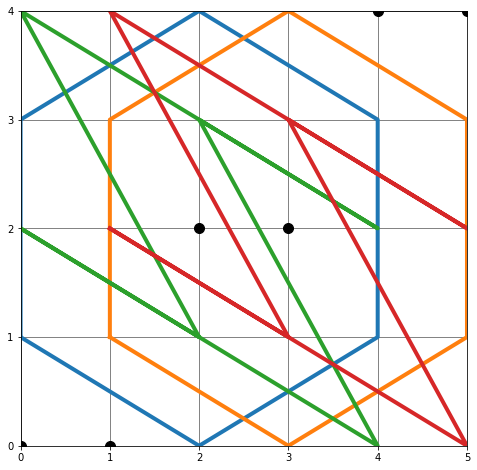

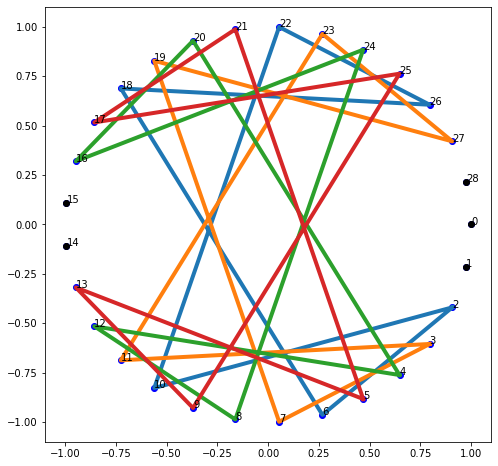

In [88]:
print(list(Orbits([(1,2),(2,5),(1,3)],[(1,6),(2,5)])))
OrbitPictures([(1,2),(2,5),(1,3)],[(1,6),(2,5)],size=8)
RingPictures([(1,2),(2,5),(1,3)],[(1,6),(2,5)],size=8)

[[0], [1, 11, 121, 181, 151, 51, 101, 191, 31, 111, 71, 91, 81, 201, 141, 171, 41, 221, 131, 61, 211, 21], [2, 22, 12, 132, 72, 102, 202, 152, 62, 222, 142, 182, 162, 172, 52, 112, 82, 212, 32, 122, 192, 42], [3, 33, 133, 83, 223, 153, 73, 113, 93, 103, 213, 43, 13, 143, 193, 53, 123, 203, 163, 183, 173, 63], [4, 44, 24, 34, 144, 204, 174, 74, 124, 214, 54, 134, 94, 114, 104, 224, 164, 194, 64, 14, 154, 84], [5, 55, 145, 215, 65, 25, 45, 35, 155, 95, 125, 225, 175, 85, 15, 165, 205, 185, 195, 75, 135, 105], [6, 66, 36, 166, 216, 76, 146, 226, 186, 206, 196, 86, 26, 56, 156, 106, 16, 176, 96, 136, 116, 126], [7, 77, 157, 117, 137, 127, 17, 187, 217, 87, 37, 177, 107, 27, 67, 47, 57, 167, 227, 197, 97, 147], [8, 88, 48, 68, 58, 178, 118, 148, 18, 198, 108, 38, 188, 228, 208, 218, 98, 158, 128, 28, 78, 168], [9, 99, 169, 19, 209, 229, 219, 109, 49, 79, 179, 129, 39, 199, 119, 159, 139, 149, 29, 89, 59, 189], [10, 110, 60, 200, 130, 50, 90, 70, 80, 190, 20, 220, 120, 170, 30, 100, 180, 140

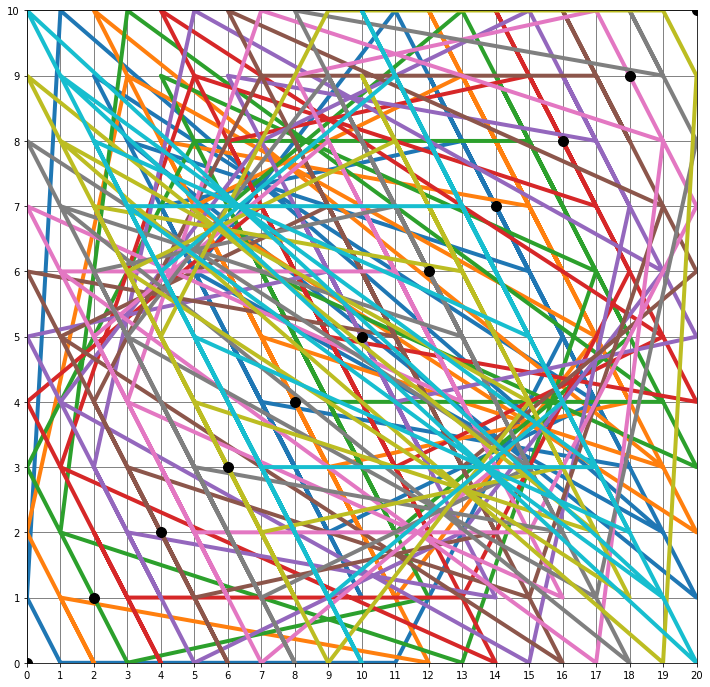

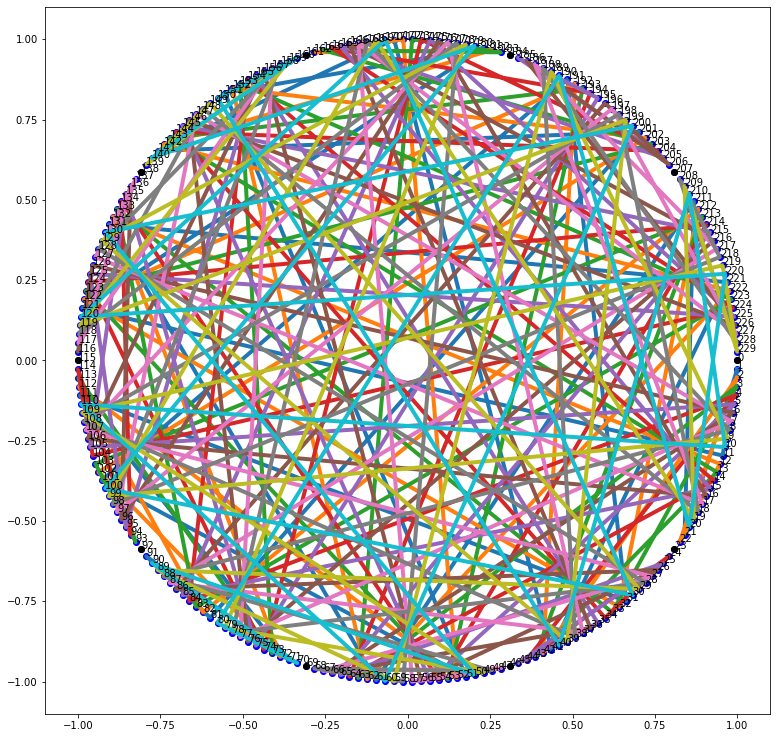

In [36]:
print(list(Orbits([(1,21),(2,11)],[(2,11),(1,21)])))
OrbitPictures([(1,21),(2,11)],[(2,11),(1,21)],size=12)
RingPictures([(1,21),(2,11)],[(2,11),(1,21)],size=13)

In [86]:
def RingPictures(JOF1,JOF2,size=9,nice=False):
    import numpy as np
    import pylab as plt
    n=1
    for a in JOF1:
        n*=a[1]
    n-=1
    roots = np.roots( [1,] + [0,]*(n-1) + [-1,] )
    bottomroots=[]
    toproots=[]
    xroots=[]
    for r in roots:
        if r.imag<0:
            bottomroots.append(r)
        if r.imag>0:
            toproots.append(r)
        if r.imag==0:
            xroots.append(r)
    botrootsort=reversed(sorted(bottomroots))
    toprootsort=sorted(toproots)
    xrootsort=sorted(xroots)
    allroots=[1+0.j,]
    for bs in botrootsort:
        allroots.append(bs)
    if len(xroots)==2:
        allroots.append(-1+0.j)
    for ts in toprootsort:
        allroots.append(ts)
        
    #plt.figure(figsize=(size,size))

    fig, ax = plt.subplots(figsize=(size,size))
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    if nice==True:
        plt.style.use('seaborn-bright')
        ax.set_facecolor('xkcd:black')
    if nice==False:
        count=0
        for root in allroots:
            plt.plot(root.real,root.imag,'bo')
            plt.text(root.real,root.imag, count)
            count+=1
    orb=Orbits(JOF1,JOF2)
    
    for o in orb:
        if len(o)!=1:
            orbline=[]
            for op in o:
                for p in enumerate(allroots):
                    if p[0]==op:
                        orbline.append(p[1])
                        break
            xplot=[]
            yplot=[]
            for q in orbline:
                xplot.append(q.real)
                yplot.append(q.imag)
            xplot.append(orbline[0].real)
            yplot.append(orbline[0].imag)
            plt.plot(xplot,yplot, linewidth=4)
            
            
        else:
            for p in enumerate(allroots):
                if p[0]==o[0]:
                    plt.plot(p[1].real,p[1].imag, 'ko')
                    break
    plt.show()
    
    
import networkx as nx
import matplotlib.pyplot as plt


def CycleSpacing(cyc):
    spacing=[]
    for i in enumerate(cyc):
        try:
            spacing.append(cyc[i[0]+1]-cyc[i[0]])
        except:
            spacing.append(cyc[0]-cyc[-1])
    return(spacing)

def OrbitSpacing(orbit):
    orbspacing=[]
    for orb in orbit:
        orbspacing.append(CycleSpacing(orb))
    return(orbspacing)



def DirectedGraph(orb):
    orbspa=OrbitSpacing(orb)
#    print(orb)
#    print(orbspa)
    
    mod=orb[-1][0]
    modspa=[]
    for a in orbspa[0:len(orbspa)-1]:
        modcyc=[]
        for b in a:
            modcyc.append(b%mod)
        modspa.append(modcyc)
#    print(modspa)
    
    sortedmodspa=[]
    for c in modspa:
        sortedmodcyc=[]
        smallest=sorted(c)[0]
        for e in c[c.index(smallest):]:
            sortedmodcyc.append(e)
        for e in c[:c.index(smallest)]:
            sortedmodcyc.append(e)
        sortedmodspa.append(sortedmodcyc)
#    print(sortedmodspa)
    
    shortspacings=[]
    for f in sortedmodspa:
        if len(f)==1:
            shortspacings.append(f)
        else:
            shortcyc=[]
            if f.count(f[0])!=1:
                for g in f:
                    if g not in shortcyc:
                        shortcyc.append(g)
            else:
                for g in f:
                    shortcyc.append(g)
            shortspacings.append(shortcyc)
#    print(shortspacings)
    
    mininumorb=[]
    for h in orb[0:len(orb)-1]:
        mininumorb.append(h[0])
    minshortspa=[]
    for i in shortspacings:
        minshortspa.append(i[0])
    

    
    g=nx.DiGraph()
    g.add_nodes_from(mininumorb)
    for j in mininumorb:
        g.add_edge(j,minshortspa[mininumorb.index(j)])
    
    plt.figure(figsize =(8, 8))

    

    pos = nx.planar_layout(g) # best so far
    nx.draw_networkx(g,pos,with_labels=True)
    plt.draw()
    plt.show()
    
    
    
    
def DirectedGraphWLen(orb):
    orbspa=OrbitSpacing(orb)
    mod=orb[-1][0]
    modspa=[]
    for a in orbspa[0:len(orbspa)-1]:
        modcyc=[]
        for b in a:
            modcyc.append(b%mod)
        modspa.append(modcyc)    
    sortedmodspa=[]
    for c in modspa:
        sortedmodcyc=[]
        smallest=sorted(c)[0]
        for e in c[c.index(smallest):]:
            sortedmodcyc.append(e)
        for e in c[:c.index(smallest)]:
            sortedmodcyc.append(e)
        sortedmodspa.append(sortedmodcyc)
    shortspacings=[]
    for f in sortedmodspa:
        if len(f)==1:
            shortspacings.append(f)
        else:
            shortcyc=[]
            if f.count(f[0])!=1:
                for g in f:
                    if g not in shortcyc:
                        shortcyc.append(g)
            else:
                for g in f:
                    shortcyc.append(g)
            shortspacings.append(shortcyc)
    minshortspa=[]
    for i in shortspacings:
        minshortspa.append(i[0])
    cyclen=[]
    for k in orb[0:len(orb)-1]:
        cyclen.append((k[0],len(k)))
    g=nx.DiGraph()
    g.add_nodes_from(cyclen)
    for j in cyclen:
        for l in cyclen:
            if l[0]==minshortspa[cyclen.index(j)]:
                m=l
                break
        g.add_edge(j,m)
    plt.figure(figsize =(8, 8))
    pos = nx.planar_layout(g) # best so far
    nx.draw_networkx(g,pos,with_labels=True)
    plt.draw()
    plt.show()
    
    
    
    
def DirectedGraphAll(orb):
    orbspa=OrbitSpacing(orb)
    
    mod=orb[-1][0]
    modspa=[]
    for a in orbspa[0:len(orbspa)-1]:
        modcyc=[]
        for b in a:
            modcyc.append(b%mod)
        modspa.append(modcyc)
    
    fulllistWspa=[]
    fulllistnospa=[]
    for c in range(0,mod):
        for d in orb:
            if c in d:
                fulllistWspa.append((c,modspa[orb.index(d)][d.index(c)],d[0]))
                fulllistnospa.append((c,d[0]))
                break

    
    g=nx.DiGraph()
    g.add_nodes_from(fulllistnospa)
    for j in fulllistWspa:
        g.add_edge((j[0],j[2]),(j[1],fulllistWspa[j[1]][2]))
    
    plt.figure(figsize =(18, 18))
    pos = nx.planar_layout(g) # best so far
    nx.draw_networkx(g,pos,with_labels=True)
    plt.draw()
    plt.show()

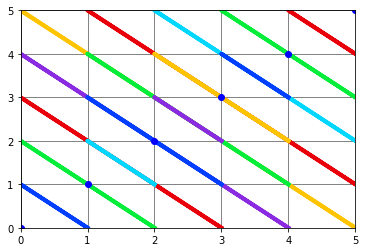

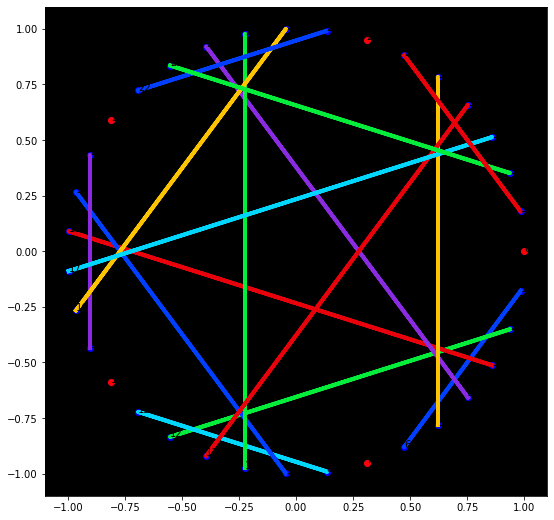

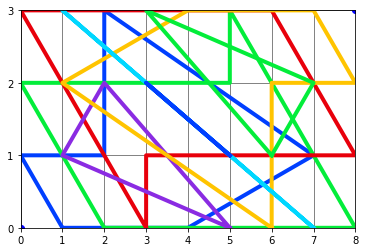

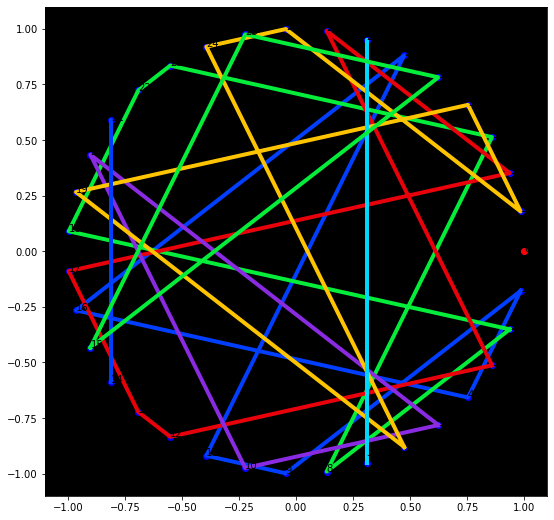

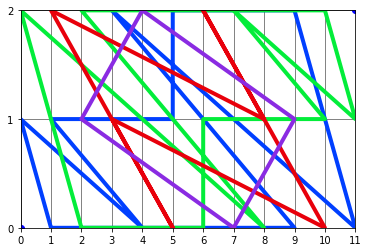

...

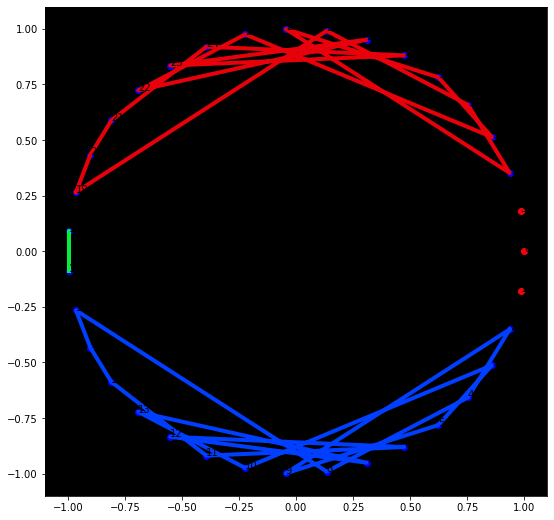

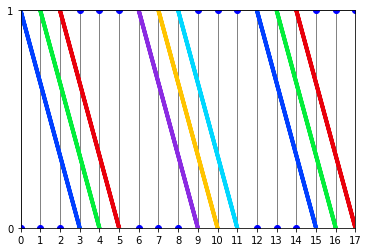

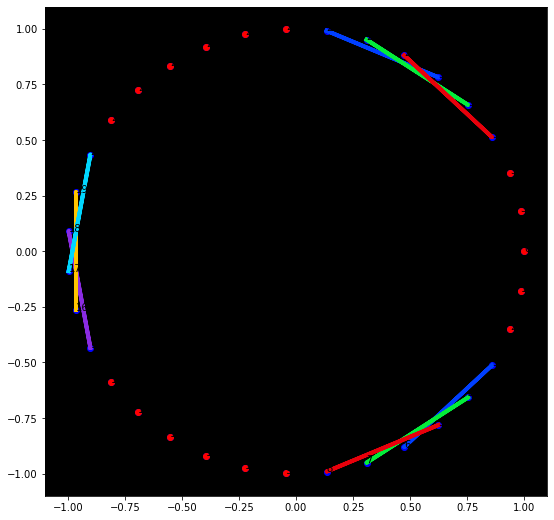

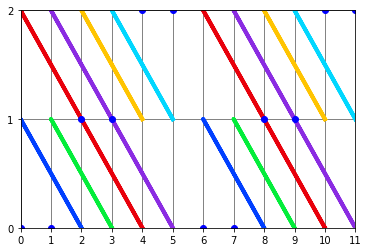

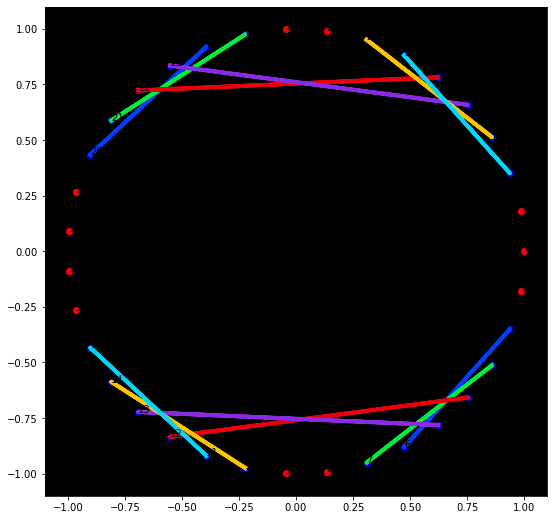

In [9]:
OrbitPictures([(1,6),(2,6)],[(2,6),(1,6)])
RingPictures([(1,6),(2,6)],[(2,6),(1,6)])
print("")
print("")
OrbitPictures([(1,9),(2,4)],[(2,4),(1,9)])
RingPictures([(1,9),(2,4)],[(2,4),(1,9)])
print("")
print("")
OrbitPictures([(1,12),(2,3)],[(2,3),(1,12)])
RingPictures([(1,12),(2,3)],[(2,3),(1,12)])
print("")
print("")
OrbitPictures([(1,18),(2,2)],[(2,2),(1,18)])
RingPictures([(1,18),(2,2)],[(2,2),(1,18)])
print("")
print("")
OrbitPictures([(1,9),(2,2),(1,2)],[(1,2),(2,2),(1,9)])
RingPictures([(1,9),(2,2),(1,2)],[(1,2),(2,2),(1,9)])
print("")
print("")
OrbitPictures([(1,6),(2,2),(1,3)],[(1,3),(2,2),(1,6)])
RingPictures([(1,6),(2,2),(1,3)],[(1,3),(2,2),(1,6)])
print("")
print("")
OrbitPictures([(1,6),(2,3),(1,2)],[(1,2),(2,3),(1,6)])
RingPictures([(1,6),(2,3),(1,2)],[(1,2),(2,3),(1,6)])

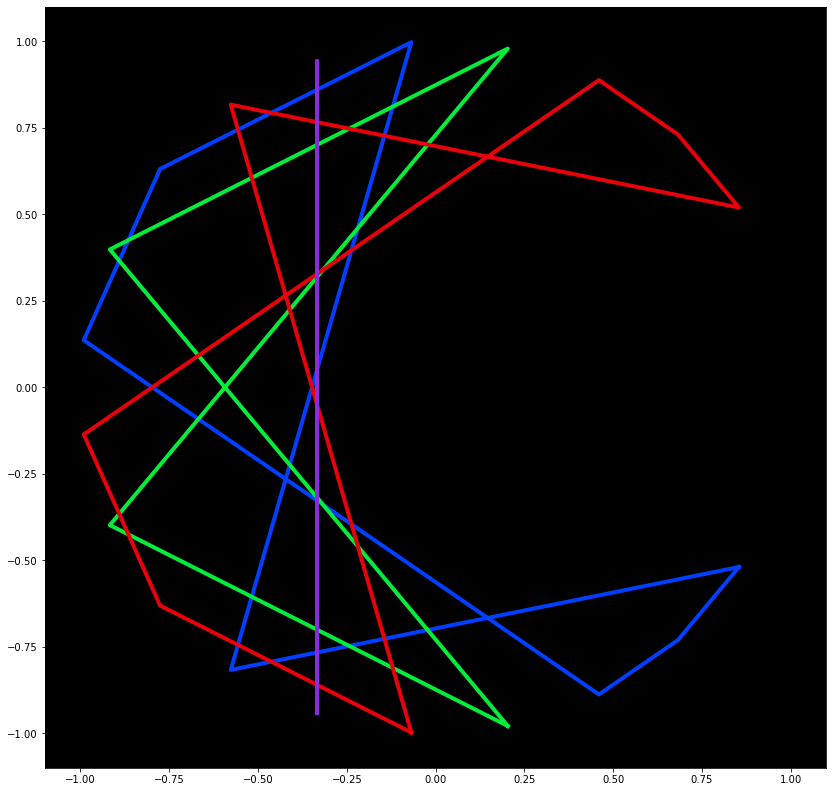

In [46]:
RingPictures([(1,2),(2,4),(1,3)],[(1,3),(2,2),(1,2),(2,2)],size=14,nice=True)

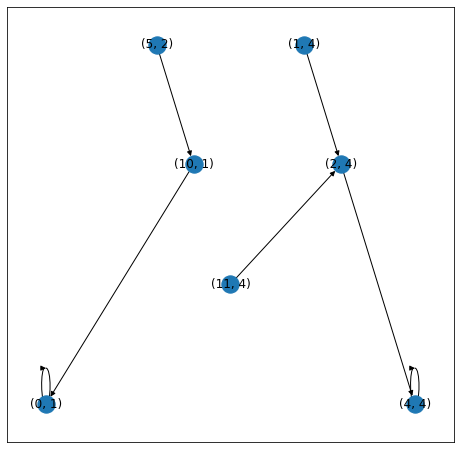

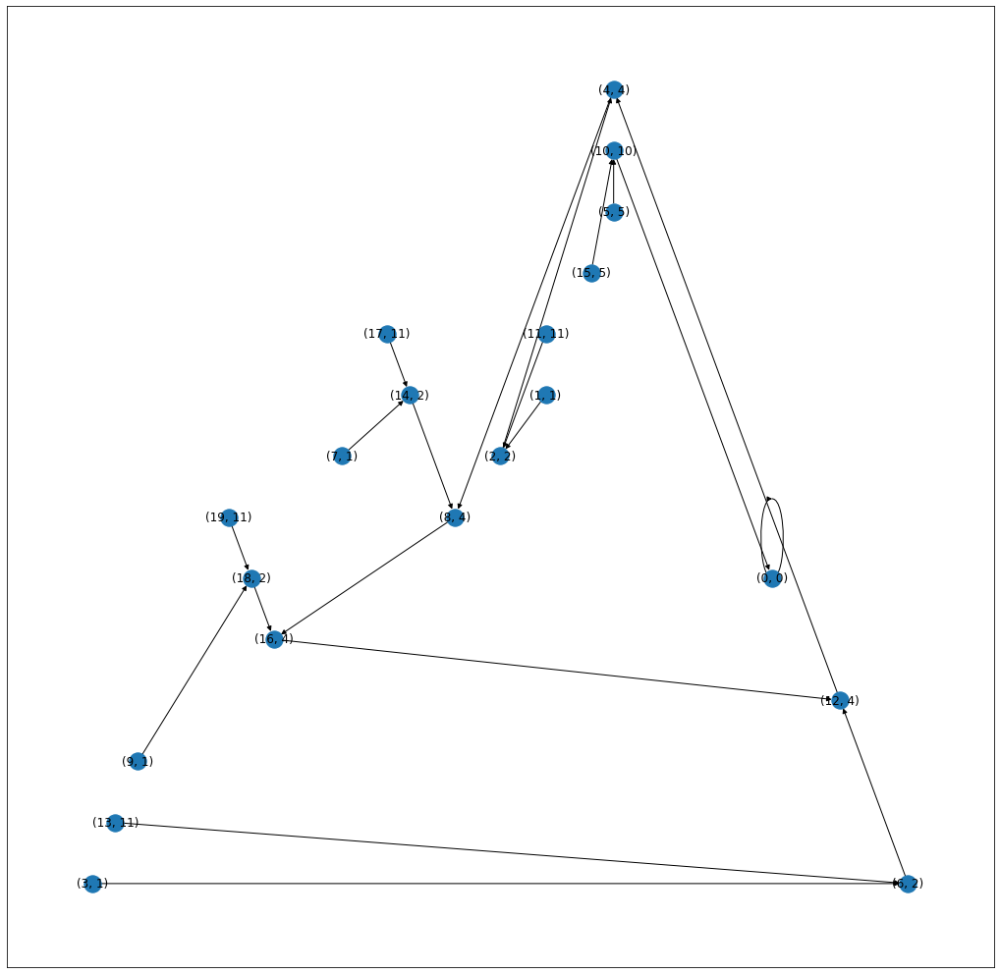

In [63]:
DirectedGraphWLen([[0], [1, 3, 9, 7], [2, 6, 18, 14], [4, 12, 16, 8], [5, 15], [10], [11, 13, 19, 17], [20]])
DirectedGraphAll([[0], [1, 3, 9, 7], [2, 6, 18, 14], [4, 12, 16, 8], [5, 15], [10], [11, 13, 19, 17], [20]])

[[0], [1, 5, 25, 17, 31, 47, 19, 41, 43, 53, 49, 29, 37, 23, 7, 35, 13, 11], [2, 10, 50, 34, 8, 40, 38, 28, 32, 52, 44, 4, 20, 46, 14, 16, 26, 22], [3, 15, 21, 51, 39, 33], [6, 30, 42, 48, 24, 12], [9, 45], [18, 36], [27], [54]]


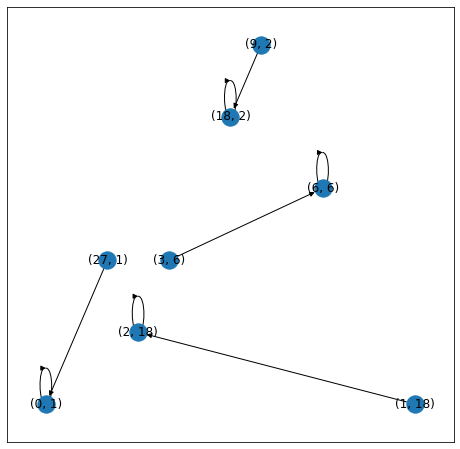


[[0], [1, 25, 31, 19, 43, 49, 37, 7, 13], [2, 50, 8, 38, 32, 44, 20, 14, 26], [3, 21, 39], [4, 46, 16, 22, 10, 34, 40, 28, 52], [5, 17, 47, 41, 53, 29, 23, 35, 11], [6, 42, 24], [9], [12, 30, 48], [15, 51, 33], [18], [27], [36], [45], [54]]


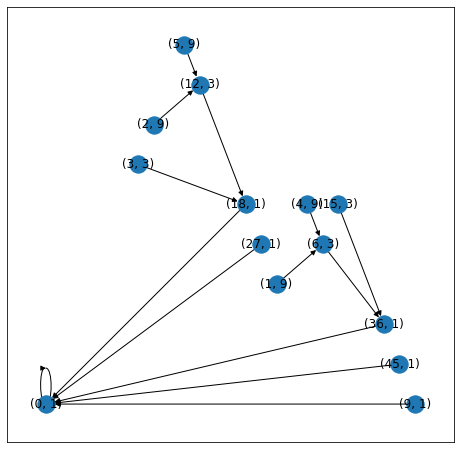


[[0], [1, 17, 19, 53, 37, 35], [2, 34, 38, 52, 20, 16], [3, 51], [4, 14, 22, 50, 40, 32], [5, 31, 41, 49, 23, 13], [6, 48], [7, 11, 25, 47, 43, 29], [8, 28, 44, 46, 26, 10], [9, 45], [12, 42], [15, 39], [18, 36], [21, 33], [24, 30], [27], [54]]


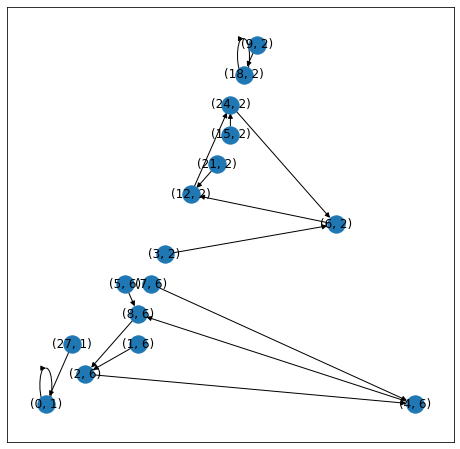


[[0], [1, 31, 43, 37, 13, 25, 19, 49, 7], [2, 8, 32, 20, 26, 50, 38, 44, 14], [3, 39, 21], [4, 16, 10, 40, 52, 46, 22, 34, 28], [5, 47, 53, 23, 11, 17, 41, 29, 35], [6, 24, 42], [9], [12, 48, 30], [15, 33, 51], [18], [27], [36], [45], [54]]


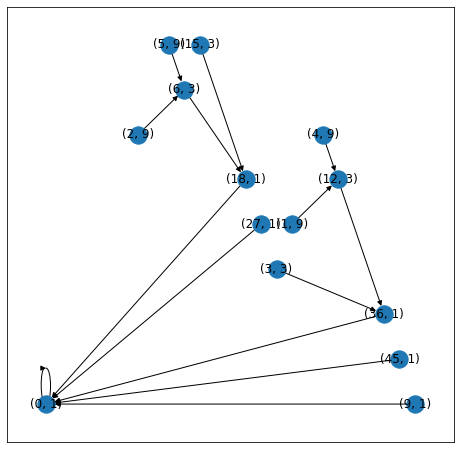


[[0], [1, 47, 49, 35, 25, 41, 37, 11, 31, 53, 7, 5, 19, 29, 13, 17, 43, 23], [2, 40, 44, 16, 50, 28, 20, 22, 8, 52, 14, 10, 38, 4, 26, 34, 32, 46], [3, 33, 39, 51, 21, 15], [6, 12, 24, 48, 42, 30], [9, 45], [18, 36], [27], [54]]


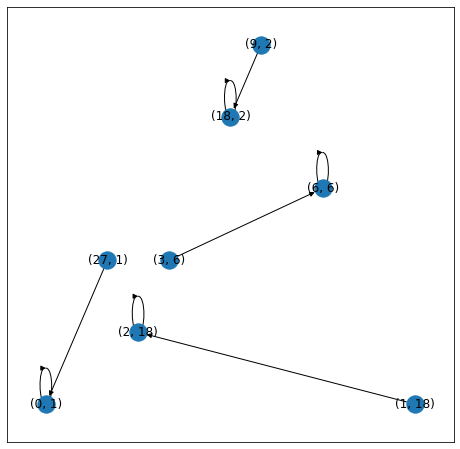


[[0], [1, 19, 37], [2, 38, 20], [3], [4, 22, 40], [5, 41, 23], [6], [7, 25, 43], [8, 44, 26], [9], [10, 28, 46], [11, 47, 29], [12], [13, 31, 49], [14, 50, 32], [15], [16, 34, 52], [17, 53, 35], [18], [21], [24], [27], [30], [33], [36], [39], [42], [45], [48], [51], [54]]


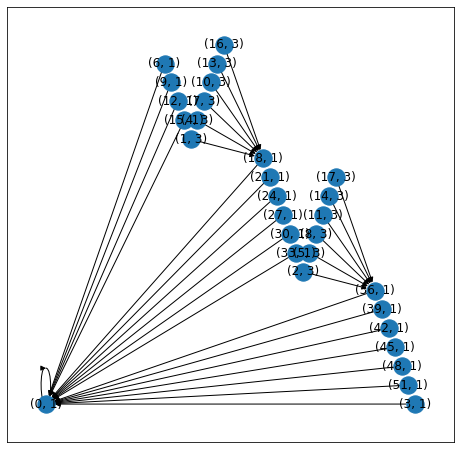


[[0], [1, 41, 7, 17, 49, 11, 19, 23, 25, 53, 13, 47, 37, 5, 43, 35, 31, 29], [2, 28, 14, 34, 44, 22, 38, 46, 50, 52, 26, 40, 20, 10, 32, 16, 8, 4], [3, 15, 21, 51, 39, 33], [6, 30, 42, 48, 24, 12], [9, 45], [18, 36], [27], [54]]


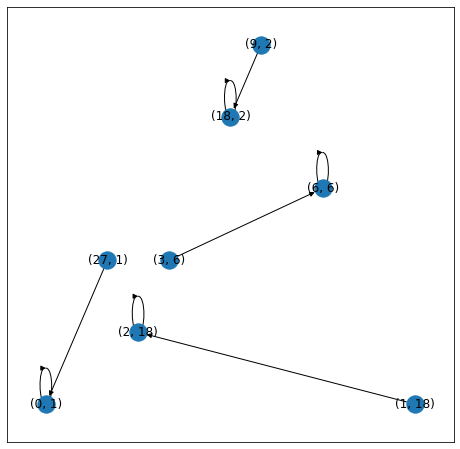


[[0], [1, 43, 13, 19, 7, 31, 37, 25, 49], [2, 32, 26, 38, 14, 8, 20, 50, 44], [3, 21, 39], [4, 10, 52, 22, 28, 16, 40, 46, 34], [5, 53, 11, 41, 35, 47, 23, 17, 29], [6, 42, 24], [9], [12, 30, 48], [15, 51, 33], [18], [27], [36], [45], [54]]


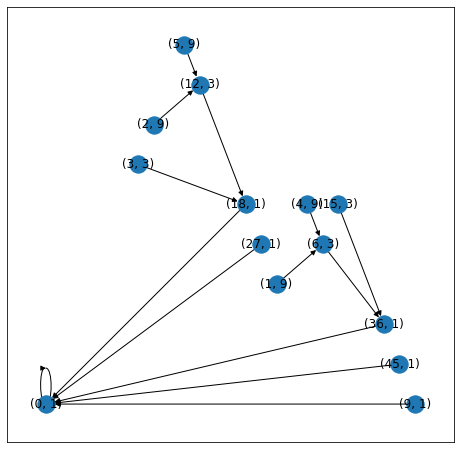


[[0], [1, 53], [2, 52], [3, 51], [4, 50], [5, 49], [6, 48], [7, 47], [8, 46], [9, 45], [10, 44], [11, 43], [12, 42], [13, 41], [14, 40], [15, 39], [16, 38], [17, 37], [18, 36], [19, 35], [20, 34], [21, 33], [22, 32], [23, 31], [24, 30], [25, 29], [26, 28], [27], [54]]


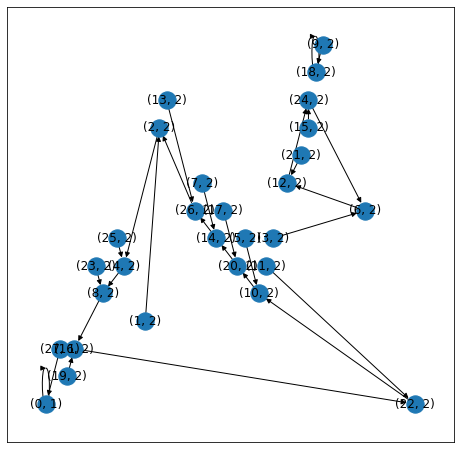


[[0], [1, 49, 25, 37, 31, 7, 19, 13, 43], [2, 44, 50, 20, 8, 14, 38, 26, 32], [3, 39, 21], [4, 34, 46, 40, 16, 28, 22, 52, 10], [5, 29, 17, 23, 47, 35, 41, 11, 53], [6, 24, 42], [9], [12, 48, 30], [15, 33, 51], [18], [27], [36], [45], [54]]


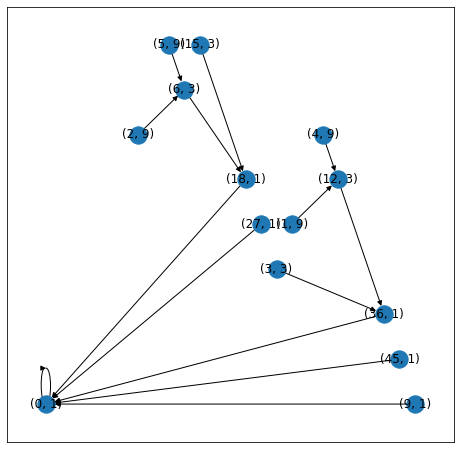


[[0], [1, 29, 31, 35, 43, 5, 37, 47, 13, 53, 25, 23, 19, 11, 49, 17, 7, 41], [2, 4, 8, 16, 32, 10, 20, 40, 26, 52, 50, 46, 38, 22, 44, 34, 14, 28], [3, 33, 39, 51, 21, 15], [6, 12, 24, 48, 42, 30], [9, 45], [18, 36], [27], [54]]


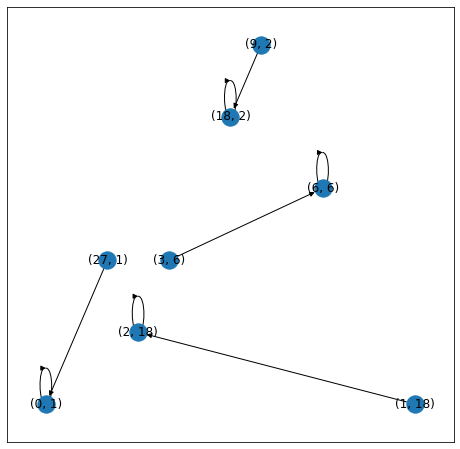


[[0], [1, 37, 19], [2, 20, 38], [3], [4, 40, 22], [5, 23, 41], [6], [7, 43, 25], [8, 26, 44], [9], [10, 46, 28], [11, 29, 47], [12], [13, 49, 31], [14, 32, 50], [15], [16, 52, 34], [17, 35, 53], [18], [21], [24], [27], [30], [33], [36], [39], [42], [45], [48], [51], [54]]


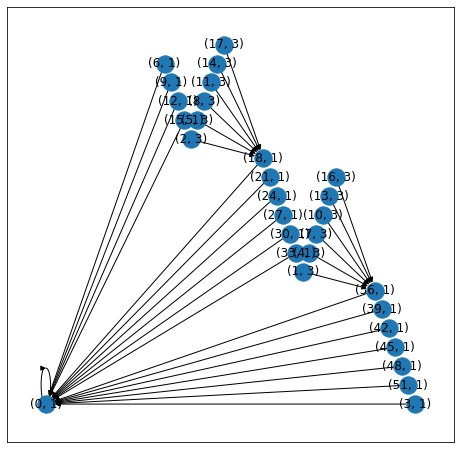


[[0], [1, 23, 43, 17, 13, 29, 19, 5, 7, 53, 31, 11, 37, 41, 25, 35, 49, 47], [2, 46, 32, 34, 26, 4, 38, 10, 14, 52, 8, 22, 20, 28, 50, 16, 44, 40], [3, 15, 21, 51, 39, 33], [6, 30, 42, 48, 24, 12], [9, 45], [18, 36], [27], [54]]


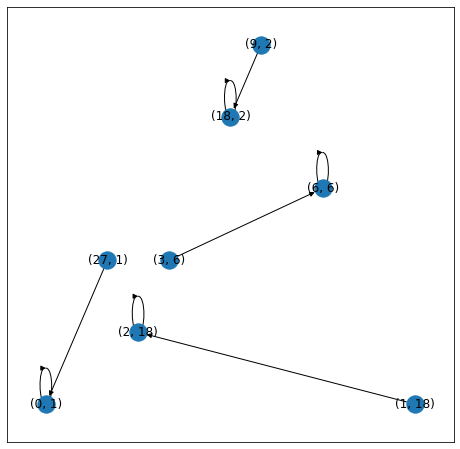


[[0], [1, 7, 49, 19, 25, 13, 37, 43, 31], [2, 14, 44, 38, 50, 26, 20, 32, 8], [3, 21, 39], [4, 28, 34, 22, 46, 52, 40, 10, 16], [5, 35, 29, 41, 17, 11, 23, 53, 47], [6, 42, 24], [9], [12, 30, 48], [15, 51, 33], [18], [27], [36], [45], [54]]


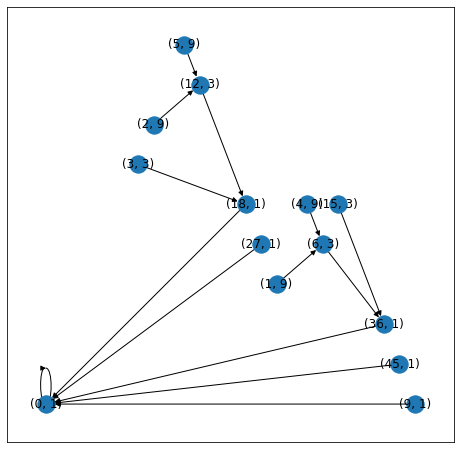


[[0], [1, 35, 37, 53, 19, 17], [2, 16, 20, 52, 38, 34], [3, 51], [4, 32, 40, 50, 22, 14], [5, 13, 23, 49, 41, 31], [6, 48], [7, 29, 43, 47, 25, 11], [8, 10, 26, 46, 44, 28], [9, 45], [12, 42], [15, 39], [18, 36], [21, 33], [24, 30], [27], [54]]


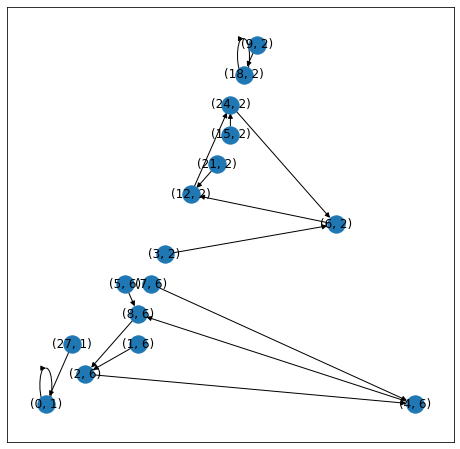


[[0], [1, 13, 7, 37, 49, 43, 19, 31, 25], [2, 26, 14, 20, 44, 32, 38, 8, 50], [3, 39, 21], [4, 52, 28, 40, 34, 10, 22, 16, 46], [5, 11, 35, 23, 29, 53, 41, 47, 17], [6, 24, 42], [9], [12, 48, 30], [15, 33, 51], [18], [27], [36], [45], [54]]


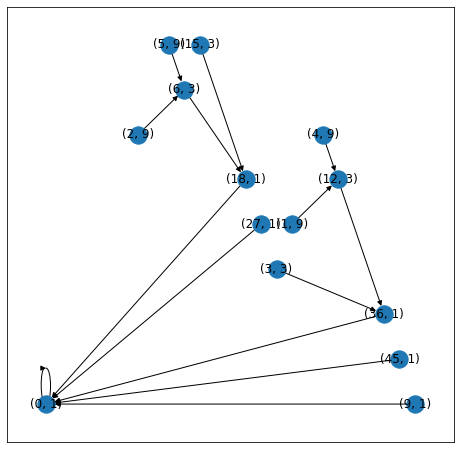


[[0], [1, 11, 13, 35, 7, 23, 37, 29, 49, 53, 43, 41, 19, 47, 31, 17, 25, 5], [2, 22, 26, 16, 14, 46, 20, 4, 44, 52, 32, 28, 38, 40, 8, 34, 50, 10], [3, 33, 39, 51, 21, 15], [6, 12, 24, 48, 42, 30], [9, 45], [18, 36], [27], [54]]


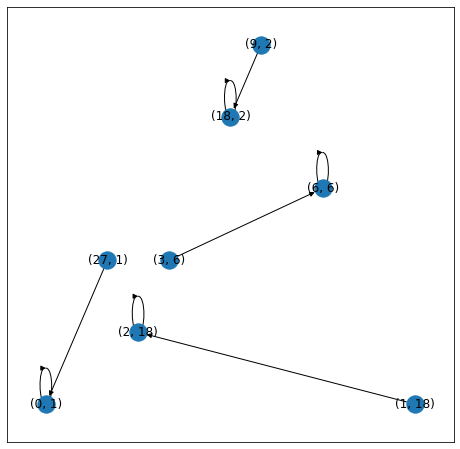


[[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20], [21], [22], [23], [24], [25], [26], [27], [28], [29], [30], [31], [32], [33], [34], [35], [36], [37], [38], [39], [40], [41], [42], [43], [44], [45], [46], [47], [48], [49], [50], [51], [52], [53], [54]]


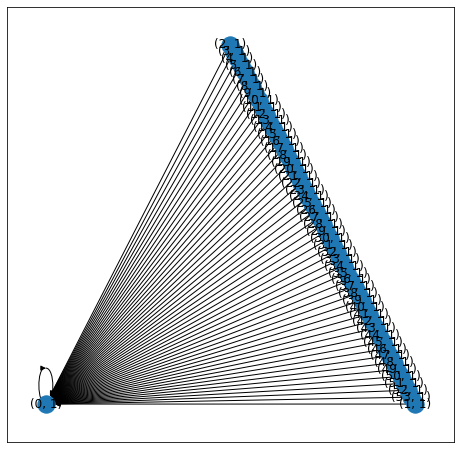

In [40]:
########### Code  that generates the groups

a=[[0], [1, 5, 25, 17, 31, 47, 19, 41, 43, 53, 49, 29, 37, 23, 7, 35, 13, 11], [2, 10, 50, 34, 8, 40, 38, 28, 32, 52, 44, 4, 20, 46, 14, 16, 26, 22], [3, 15, 21, 51, 39, 33], [6, 30, 42, 48, 24, 12], [9, 45], [18, 36], [27], [54]]


collection=[a]

# for t in collection:
#     print(t)

the_set=[]
collen=len(collection)
newcollen=0
while collen!=newcollen:
    collen=len(collection)
    for x1 in enumerate(collection):
        if len(collection)==3840:
            break
        else:
            for y1 in enumerate(collection):
#                print(x1[0],y1[0])
    #            if y[0]>x[0]:
                if CodeViaCodeVsCode(x1[1],y1[1]) not in collection:
                    collection.append(CodeViaCodeVsCode(x1[1],y1[1]))
#                    print(CodeViaCodeVsCode(x1[1],y1[1]))
        newcollen=len(collection)
#print(len(collection))
for i1 in collection:
    print(i1)
    DirectedGraphWLen(i1)
    print("")
# print(collection)
                

[[0], [1, 3, 9, 27, 17, 19, 25, 11], [2, 6, 18, 22], [4, 12], [5, 15, 13, 7, 21, 31, 29, 23], [8, 24], [10, 30, 26, 14], [16], [20, 28], [32]]


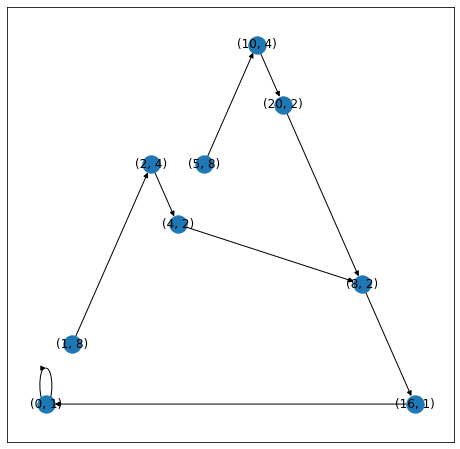


[[0], [1, 19, 9, 11, 17, 3, 25, 27], [2, 6, 18, 22], [4, 12], [5, 31, 13, 23, 21, 15, 29, 7], [8, 24], [10, 30, 26, 14], [16], [20, 28], [32]]


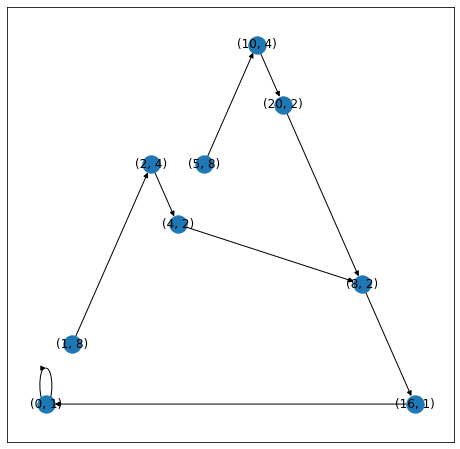


[[0], [1, 27, 25, 3, 17, 11, 9, 19], [2, 22, 18, 6], [4, 12], [5, 7, 29, 15, 21, 23, 13, 31], [8, 24], [10, 14, 26, 30], [16], [20, 28], [32]]


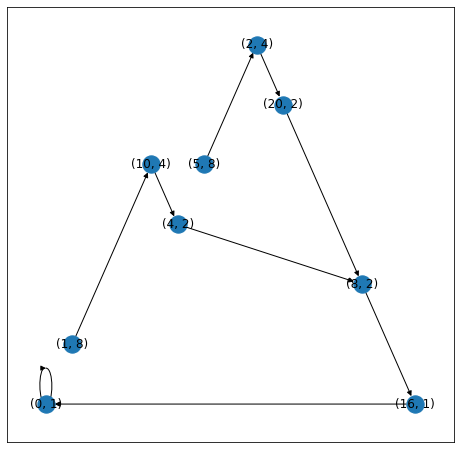


[[0], [1, 11, 25, 19, 17, 27, 9, 3], [2, 22, 18, 6], [4, 12], [5, 23, 29, 31, 21, 7, 13, 15], [8, 24], [10, 14, 26, 30], [16], [20, 28], [32]]


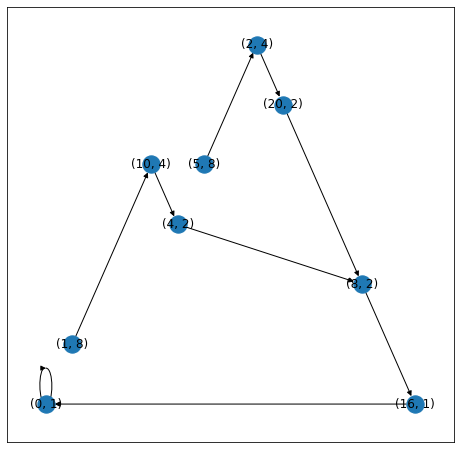


[[0], [1, 9, 17, 25], [2, 18], [3, 27, 19, 11], [4], [5, 13, 21, 29], [6, 22], [7, 31, 23, 15], [8], [10, 26], [12], [14, 30], [16], [20], [24], [28], [32]]


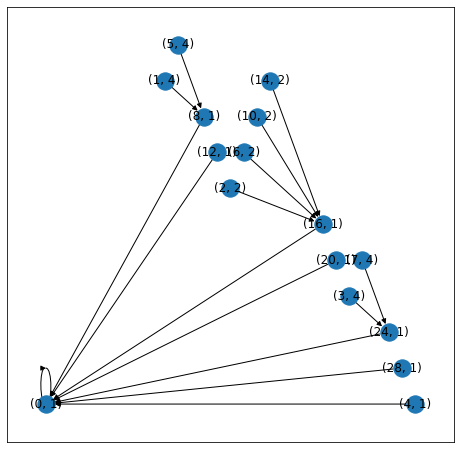


[[0], [1, 25, 17, 9], [2, 18], [3, 11, 19, 27], [4], [5, 29, 21, 13], [6, 22], [7, 15, 23, 31], [8], [10, 26], [12], [14, 30], [16], [20], [24], [28], [32]]


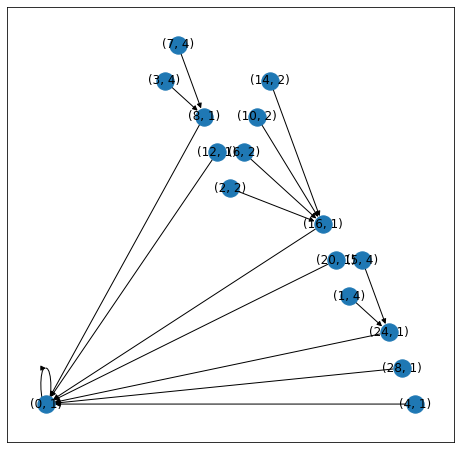


[[0], [1, 17], [2], [3, 19], [4], [5, 21], [6], [7, 23], [8], [9, 25], [10], [11, 27], [12], [13, 29], [14], [15, 31], [16], [18], [20], [22], [24], [26], [28], [30], [32]]


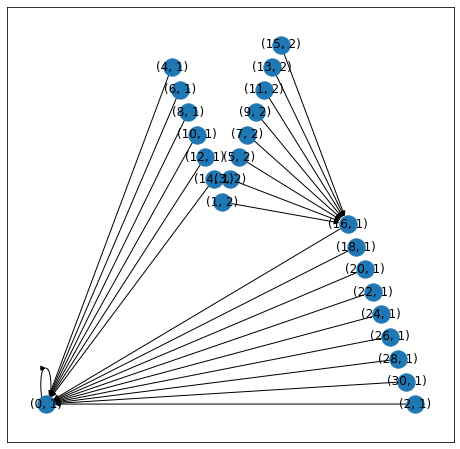


[[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20], [21], [22], [23], [24], [25], [26], [27], [28], [29], [30], [31], [32]]


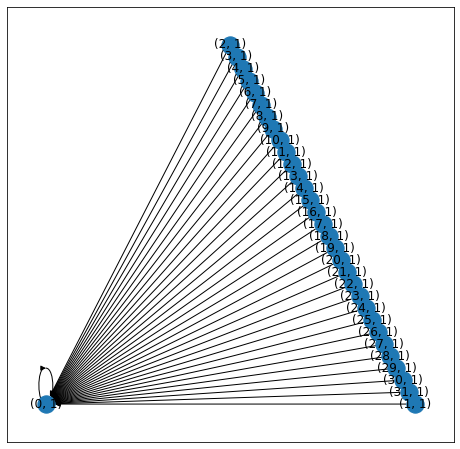

In [37]:
a1=[[0], [1, 3, 9, 27, 17, 19, 25, 11], [2, 6, 18, 22], [4, 12], [5, 15, 13, 7, 21, 31, 29, 23], [8, 24], [10, 30, 26, 14], [16], [20, 28], [32]]
a2=[[0], [1, 9, 17, 25], [2, 18], [3, 27, 19, 11], [4], [5, 13, 21, 29], [6, 22], [7, 31, 23, 15], [8], [10, 26], [12], [14, 30], [16], [20], [24], [28], [32]]
a3=[[0], [1, 27, 25, 3, 17, 11, 9, 19], [2, 22, 18, 6], [4, 12], [5, 7, 29, 15, 21, 23, 13, 31], [8, 24], [10, 14, 26, 30], [16], [20, 28], [32]]
a4=[[0], [1, 17], [2], [3, 19], [4], [5, 21], [6], [7, 23], [8], [9, 25], [10], [11, 27], [12], [13, 29], [14], [15, 31], [16], [18], [20], [22], [24], [26], [28], [30], [32]]
a5=[[0], [1, 19, 9, 11, 17, 3, 25, 27], [2, 6, 18, 22], [4, 12], [5, 31, 13, 23, 21, 15, 29, 7], [8, 24], [10, 30, 26, 14], [16], [20, 28], [32]]
a6=[[0], [1, 25, 17, 9], [2, 18], [3, 11, 19, 27], [4], [5, 29, 21, 13], [6, 22], [7, 15, 23, 31], [8], [10, 26], [12], [14, 30], [16], [20], [24], [28], [32]]
a7=[[0], [1, 11, 25, 19, 17, 27, 9, 3], [2, 22, 18, 6], [4, 12], [5, 23, 29, 31, 21, 7, 13, 15], [8, 24], [10, 14, 26, 30], [16], [20, 28], [32]]
a8=[[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20], [21], [22], [23], [24], [25], [26], [27], [28], [29], [30], [31], [32]]


print(a1)
DirectedGraphWLen(a1)
print("")
print(a5)
DirectedGraphWLen(a5)
print("")
print(a3)
DirectedGraphWLen(a3)
print("")
print(a7)
DirectedGraphWLen(a7)
print("")
print(a2)
DirectedGraphWLen(a2)
print("")
print(a6)
DirectedGraphWLen(a6)
print("")
print(a4)
DirectedGraphWLen(a4)
print("")
print(a8)
DirectedGraphWLen(a8)

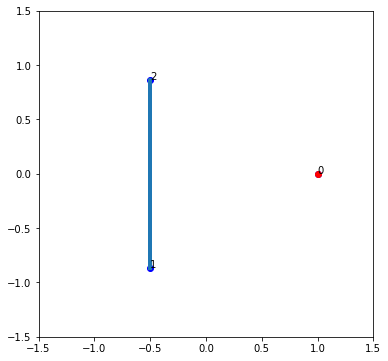

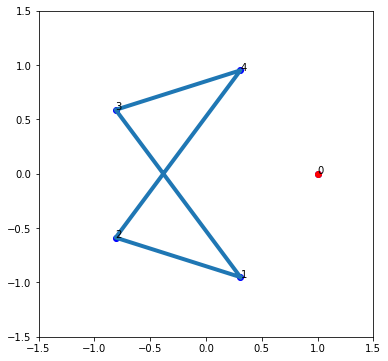

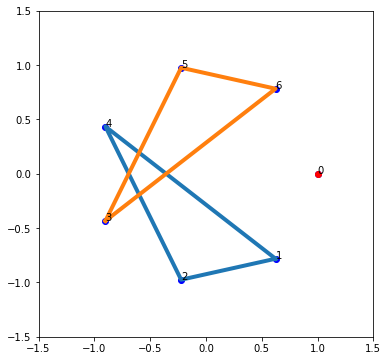

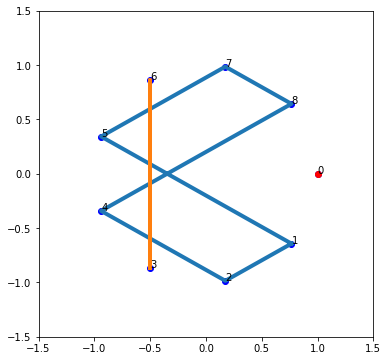

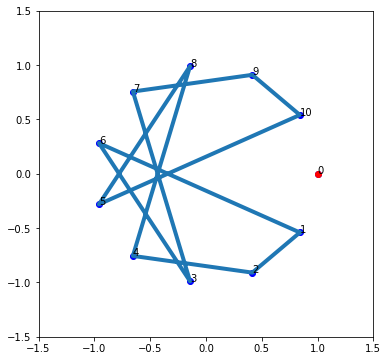

...

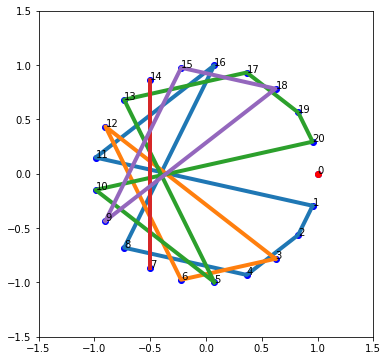

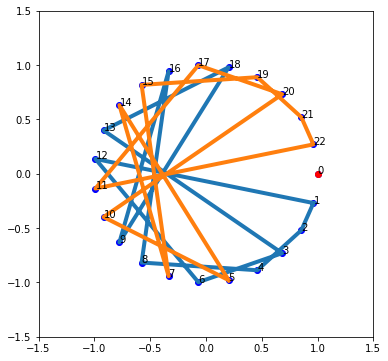

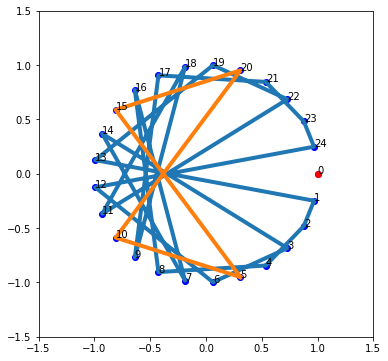

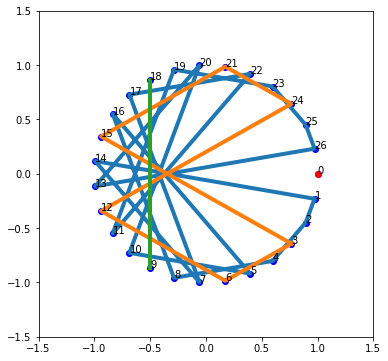

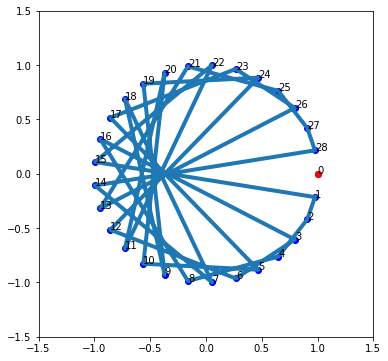

In [3]:
a=2
for b in range(2,16):
    #print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,b,b,a))
    #print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
#    print("")
#    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(b,a,a,b))
#    print(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
#    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
#    DirectedGraph(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
#    DirectedGraph(list(Orbits([(2,a),(1,b)],[(1,b),(2,a)])))
    print("")

[(1,3),(2,2)],[(2,2),(1,3)]
[[0], [1, 2, 4, 3], [5]]

[(1,2),(2,3)],[(2,3),(1,2)]
[[0], [1, 3, 4, 2], [5]]


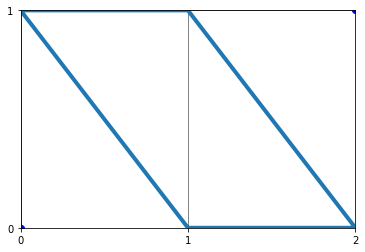

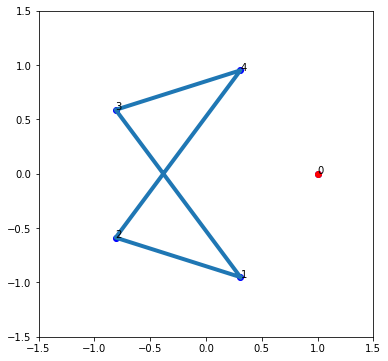


[(1,3),(2,3)],[(2,3),(1,3)]
[[0], [1, 3], [2, 6], [4], [5, 7], [8]]

[(1,3),(2,3)],[(2,3),(1,3)]
[[0], [1, 3], [2, 6], [4], [5, 7], [8]]


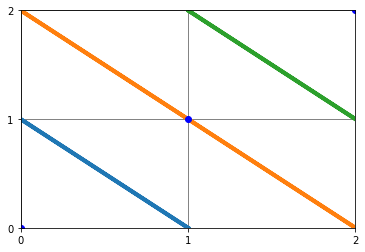

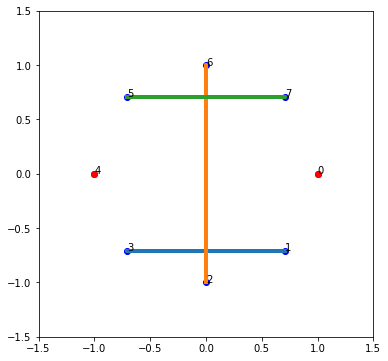


[(1,3),(2,4)],[(2,4),(1,3)]
[[0], [1, 4, 5, 9, 3], [2, 8, 10, 7, 6], [11]]

[(1,4),(2,3)],[(2,3),(1,4)]
[[0], [1, 3, 9, 5, 4], [2, 6, 7, 10, 8], [11]]


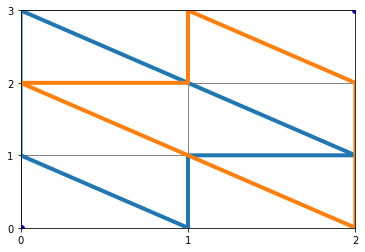

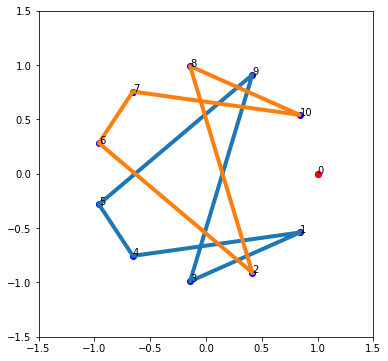


[(1,3),(2,5)],[(2,5),(1,3)]
[[0], [1, 5, 11, 13, 9, 3], [2, 10, 8, 12, 4, 6], [7], [14]]

[(1,5),(2,3)],[(2,3),(1,5)]
[[0], [1, 3, 9, 13, 11, 5], [2, 6, 4, 12, 8, 10], [7], [14]]


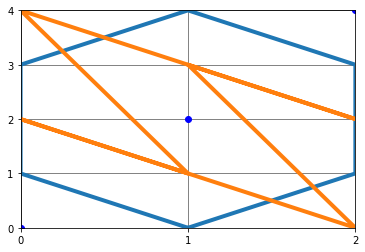

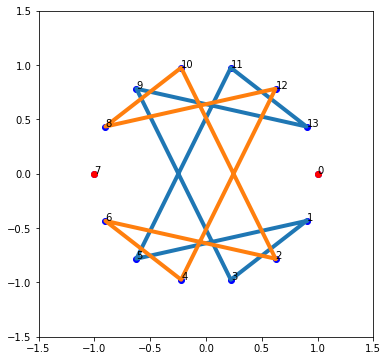


[(1,3),(2,6)],[(2,6),(1,3)]
[[0], [1, 6, 2, 12, 4, 7, 8, 14, 16, 11, 15, 5, 13, 10, 9, 3], [17]]

[(1,6),(2,3)],[(2,3),(1,6)]
[[0], [1, 3, 9, 10, 13, 5, 15, 11, 16, 14, 8, 7, 4, 12, 2, 6], [17]]


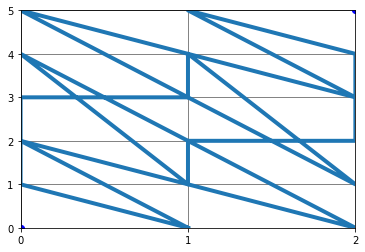

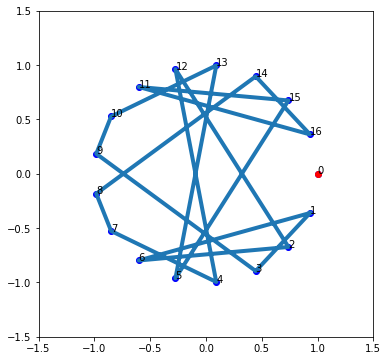


[(1,3),(2,7)],[(2,7),(1,3)]
[[0], [1, 7, 9, 3], [2, 14, 18, 6], [4, 8, 16, 12], [5, 15], [10], [11, 17, 19, 13], [20]]

[(1,7),(2,3)],[(2,3),(1,7)]
[[0], [1, 3, 9, 7], [2, 6, 18, 14], [4, 12, 16, 8], [5, 15], [10], [11, 13, 19, 17], [20]]


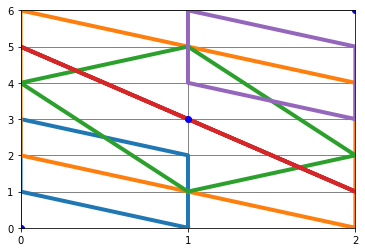

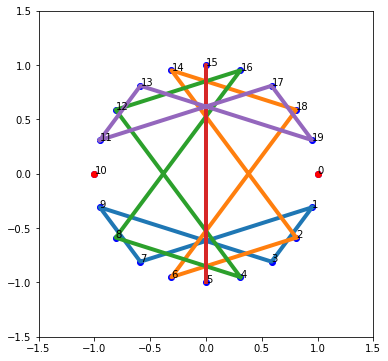


[(1,3),(2,8)],[(2,8),(1,3)]
[[0], [1, 8, 18, 6, 2, 16, 13, 12, 4, 9, 3], [5, 17, 21, 7, 10, 11, 19, 14, 20, 22, 15], [23]]

[(1,8),(2,3)],[(2,3),(1,8)]
[[0], [1, 3, 9, 4, 12, 13, 16, 2, 6, 18, 8], [5, 15, 22, 20, 14, 19, 11, 10, 7, 21, 17], [23]]


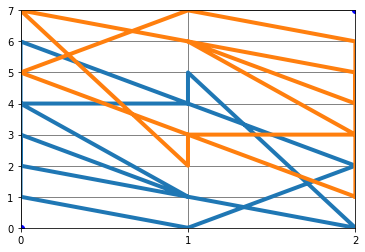

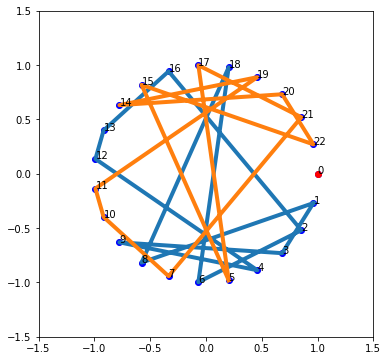


[(1,3),(2,9)],[(2,9),(1,3)]
[[0], [1, 9, 3], [2, 18, 6], [4, 10, 12], [5, 19, 15], [7, 11, 21], [8, 20, 24], [13], [14, 22, 16], [17, 23, 25], [26]]

[(1,9),(2,3)],[(2,3),(1,9)]
[[0], [1, 3, 9], [2, 6, 18], [4, 12, 10], [5, 15, 19], [7, 21, 11], [8, 24, 20], [13], [14, 16, 22], [17, 25, 23], [26]]


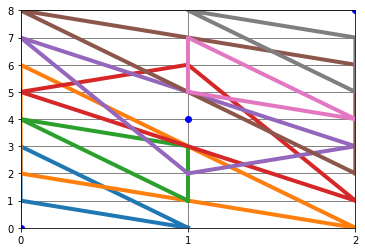

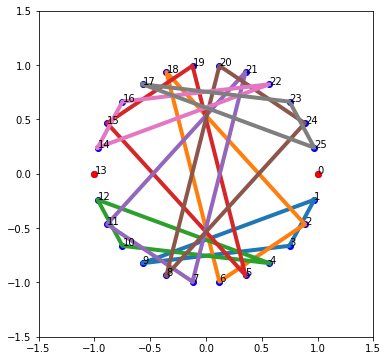


[(1,3),(2,10)],[(2,10),(1,3)]
[[0], [1, 10, 13, 14, 24, 8, 22, 17, 25, 18, 6, 2, 20, 26, 28, 19, 16, 15, 5, 21, 7, 12, 4, 11, 23, 27, 9, 3], [29]]

[(1,10),(2,3)],[(2,3),(1,10)]
[[0], [1, 3, 9, 27, 23, 11, 4, 12, 7, 21, 5, 15, 16, 19, 28, 26, 20, 2, 6, 18, 25, 17, 22, 8, 24, 14, 13, 10], [29]]


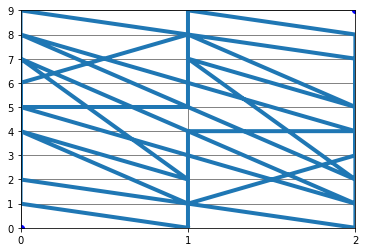

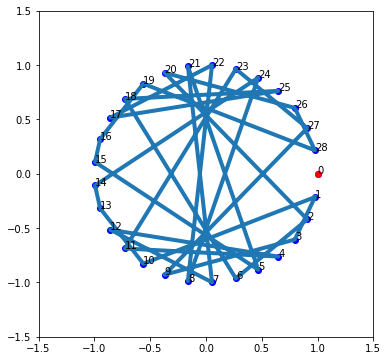


[(1,3),(2,11)],[(2,11),(1,3)]
[[0], [1, 11, 25, 19, 17, 27, 9, 3], [2, 22, 18, 6], [4, 12], [5, 23, 29, 31, 21, 7, 13, 15], [8, 24], [10, 14, 26, 30], [16], [20, 28], [32]]

[(1,11),(2,3)],[(2,3),(1,11)]
[[0], [1, 3, 9, 27, 17, 19, 25, 11], [2, 6, 18, 22], [4, 12], [5, 15, 13, 7, 21, 31, 29, 23], [8, 24], [10, 30, 26, 14], [16], [20, 28], [32]]


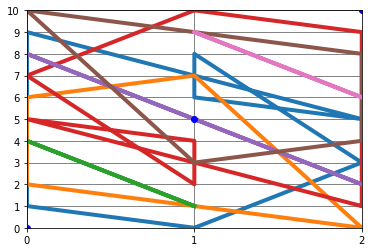

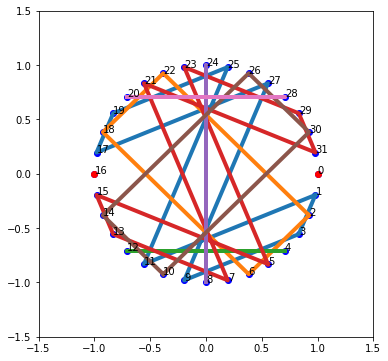


[(1,3),(2,12)],[(2,12),(1,3)]
[[0], [1, 12, 4, 13, 16, 17, 29, 33, 11, 27, 9, 3], [2, 24, 8, 26, 32, 34, 23, 31, 22, 19, 18, 6], [5, 25, 20, 30, 10, 15], [7, 14, 28, 21], [35]]

[(1,12),(2,3)],[(2,3),(1,12)]
[[0], [1, 3, 9, 27, 11, 33, 29, 17, 16, 13, 4, 12], [2, 6, 18, 19, 22, 31, 23, 34, 32, 26, 8, 24], [5, 15, 10, 30, 20, 25], [7, 21, 28, 14], [35]]


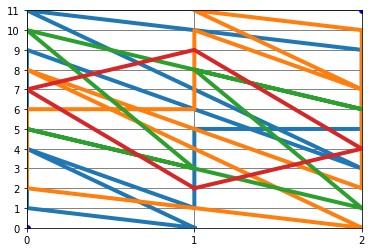

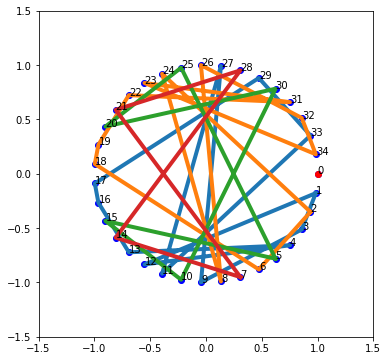


[(1,3),(2,13)],[(2,13),(1,3)]
[[0], [1, 13, 17, 31, 23, 33, 11, 29, 35, 37, 25, 21, 7, 15, 5, 27, 9, 3], [2, 26, 34, 24, 8, 28, 22, 20, 32, 36, 12, 4, 14, 30, 10, 16, 18, 6], [19], [38]]

[(1,13),(2,3)],[(2,3),(1,13)]
[[0], [1, 3, 9, 27, 5, 15, 7, 21, 25, 37, 35, 29, 11, 33, 23, 31, 17, 13], [2, 6, 18, 16, 10, 30, 14, 4, 12, 36, 32, 20, 22, 28, 8, 24, 34, 26], [19], [38]]


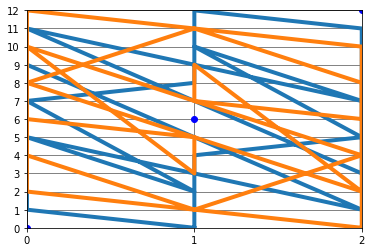

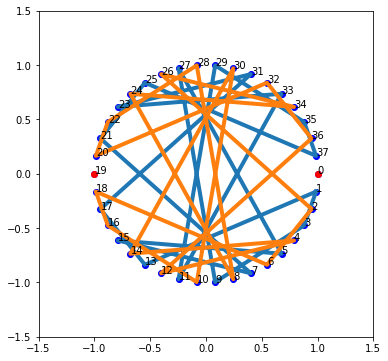


[(1,3),(2,14)],[(2,14),(1,3)]
[[0], [1, 14, 32, 38, 40, 27, 9, 3], [2, 28, 23, 35, 39, 13, 18, 6], [4, 15, 5, 29, 37, 26, 36, 12], [7, 16, 19, 20, 34, 25, 22, 21], [8, 30, 10, 17, 33, 11, 31, 24], [41]]

[(1,14),(2,3)],[(2,3),(1,14)]
[[0], [1, 3, 9, 27, 40, 38, 32, 14], [2, 6, 18, 13, 39, 35, 23, 28], [4, 12, 36, 26, 37, 29, 5, 15], [7, 21, 22, 25, 34, 20, 19, 16], [8, 24, 31, 11, 33, 17, 10, 30], [41]]


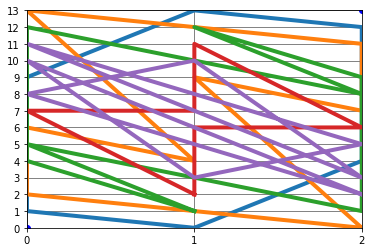

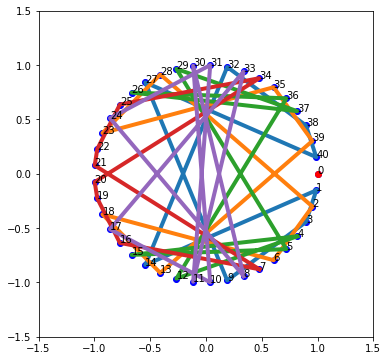


[(1,3),(2,15)],[(2,15),(1,3)]
[[0], [1, 15, 5, 31, 25, 23, 37, 27, 9, 3], [2, 30, 10, 18, 6], [4, 16, 20, 36, 12], [7, 17, 35, 41, 43, 29, 39, 13, 19, 21], [8, 32, 40, 28, 24], [11, 33], [14, 34, 26, 38, 42], [22], [44]]

[(1,15),(2,3)],[(2,3),(1,15)]
[[0], [1, 3, 9, 27, 37, 23, 25, 31, 5, 15], [2, 6, 18, 10, 30], [4, 12, 36, 20, 16], [7, 21, 19, 13, 39, 29, 43, 41, 35, 17], [8, 24, 28, 40, 32], [11, 33], [14, 42, 38, 26, 34], [22], [44]]


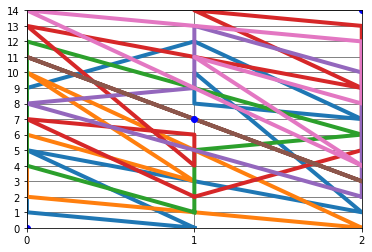

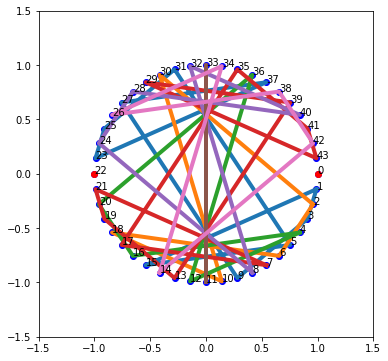

In [4]:
a=3
for b in range(2,16):
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,b,b,a))
    print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    print("")
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(b,a,a,b))
    print(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
    #DirectedGraphWLen(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    #DirectedGraphWLen(list(Orbits([(2,a),(1,b)],[(1,b),(2,a)])))
    print("")

[(1,2),(2,4)],[(2,2),(1,4)]
[(1,2),(2,4)]: A1= [0, 1] A2= [0, 2, 4, 6]
[(2,4),(1,2)]: A1= [0, 4] A2= [0, 1, 2, 3]
[[0], [1, 4, 2], [3, 5, 6], [7]]


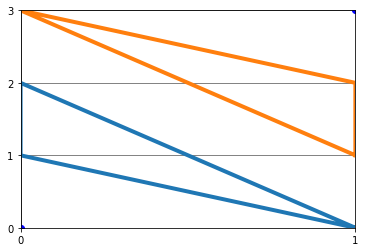

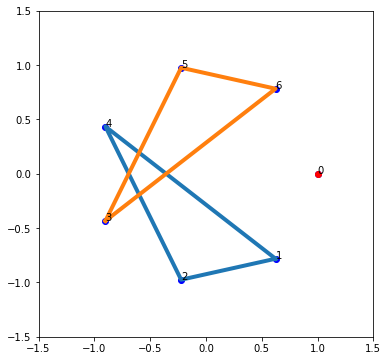


[(1,3),(2,4)],[(2,3),(1,4)]
[(1,3),(2,4)]: A1= [0, 1, 2] A2= [0, 3, 6, 9]
[(2,4),(1,3)]: A1= [0, 4, 8] A2= [0, 1, 2, 3]
[[0], [1, 4, 5, 9, 3], [2, 8, 10, 7, 6], [11]]


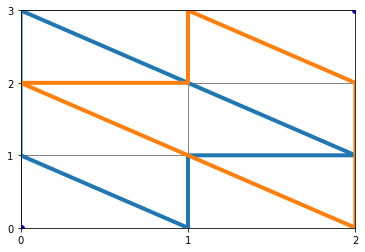

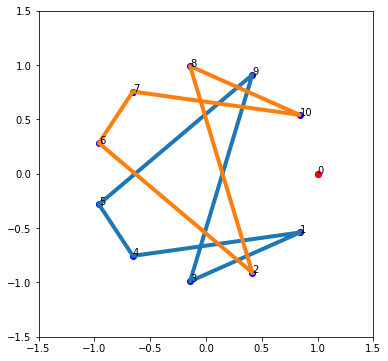


[(1,4),(2,4)],[(2,4),(1,4)]
[(1,4),(2,4)]: A1= [0, 1, 2, 3] A2= [0, 4, 8, 12]
[(2,4),(1,4)]: A1= [0, 4, 8, 12] A2= [0, 1, 2, 3]
[[0], [1, 4], [2, 8], [3, 12], [5], [6, 9], [7, 13], [10], [11, 14], [15]]


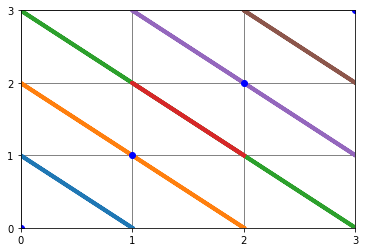

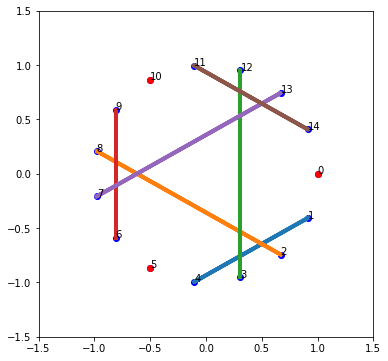


[(1,5),(2,4)],[(2,5),(1,4)]
[(1,5),(2,4)]: A1= [0, 1, 2, 3, 4] A2= [0, 5, 10, 15]
[(2,4),(1,5)]: A1= [0, 4, 8, 12, 16] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 7, 9, 17, 11, 6, 5], [2, 8, 13, 14, 18, 15, 3, 12, 10], [19]]


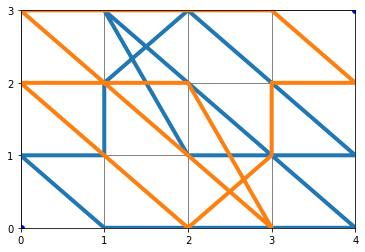

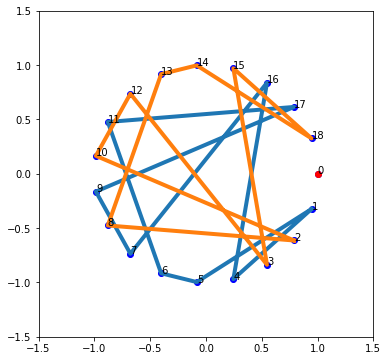


[(1,6),(2,4)],[(2,6),(1,4)]
[(1,6),(2,4)]: A1= [0, 1, 2, 3, 4, 5] A2= [0, 6, 12, 18]
[(2,4),(1,6)]: A1= [0, 4, 8, 12, 16, 20] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 18, 3, 12, 2, 8, 9, 13, 6], [5, 20, 11, 21, 15, 14, 10, 17, 22, 19, 7], [23]]


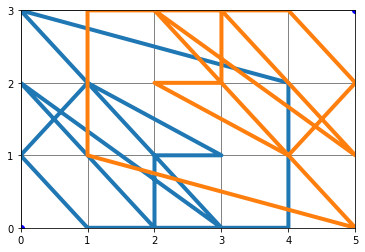

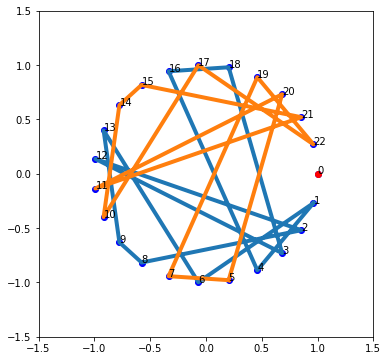


[(1,7),(2,4)],[(2,7),(1,4)]
[(1,7),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6] A2= [0, 7, 14, 21]
[(2,4),(1,7)]: A1= [0, 4, 8, 12, 16, 20, 24] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 10, 13, 25, 19, 22, 7], [2, 8, 5, 20, 26, 23, 11, 17, 14], [3, 12, 21], [6, 24, 15], [9], [18], [27]]


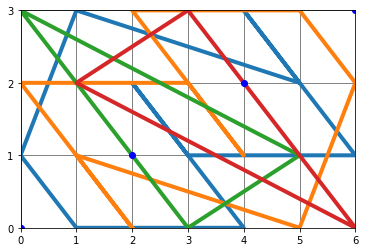

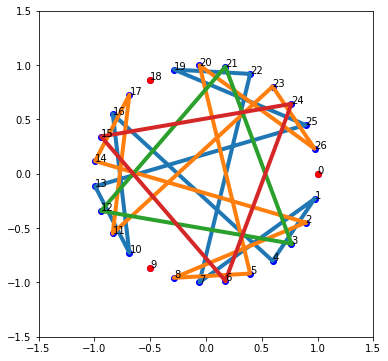


[(1,8),(2,4)],[(2,8),(1,4)]
[(1,8),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7] A2= [0, 8, 16, 24]
[(2,4),(1,8)]: A1= [0, 4, 8, 12, 16, 20, 24, 28] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 2, 8], [3, 12, 17, 6, 24], [5, 20, 18, 10, 9], [7, 28, 19, 14, 25], [11, 13, 21, 22, 26], [15, 29, 23, 30, 27], [31]]


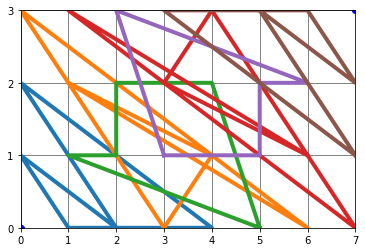

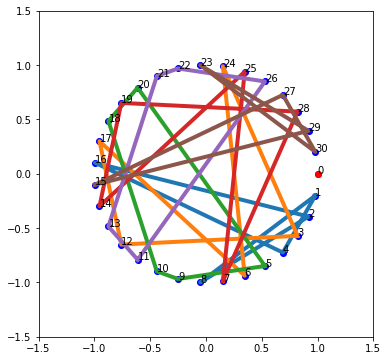


[(1,9),(2,4)],[(2,9),(1,4)]
[(1,9),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8] A2= [0, 9, 18, 27]
[(2,4),(1,9)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 29, 11, 9], [2, 8, 32, 23, 22, 18], [3, 12, 13, 17, 33, 27], [5, 20, 10], [6, 24, 26, 34, 31, 19], [7, 28], [14, 21], [15, 25, 30], [35]]


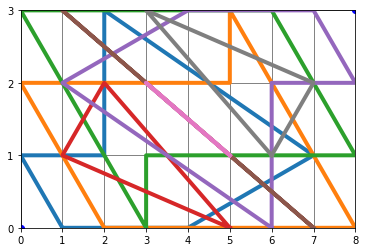

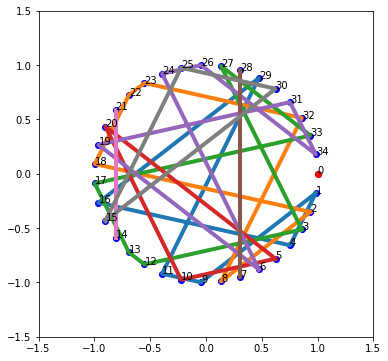


[(1,10),(2,4)],[(2,10),(1,4)]
[(1,10),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] A2= [0, 10, 20, 30]
[(2,4),(1,10)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 25, 22, 10], [2, 8, 32, 11, 5, 20], [3, 12, 9, 36, 27, 30], [6, 24, 18, 33, 15, 21], [7, 28, 34, 19, 37, 31], [13], [14, 17, 29, 38, 35, 23], [26], [39]]


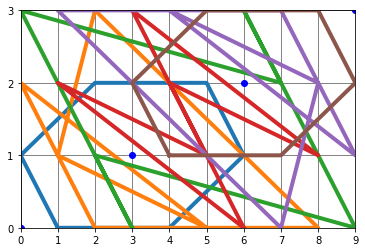

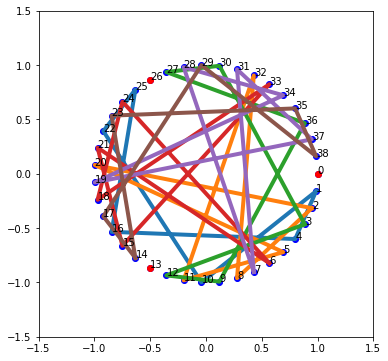


[(1,11),(2,4)],[(2,11),(1,4)]
[(1,11),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] A2= [0, 11, 22, 33]
[(2,4),(1,11)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 21, 41, 35, 11], [2, 8, 32, 42, 39, 27, 22], [3, 12, 5, 20, 37, 19, 33], [6, 24, 10, 40, 31, 38, 23], [7, 28, 26, 18, 29, 30, 34], [9, 36, 15, 17, 25, 14, 13], [43]]


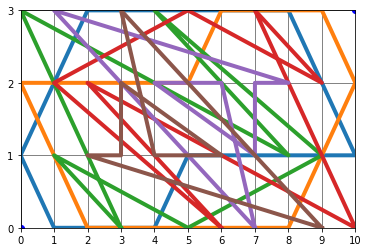

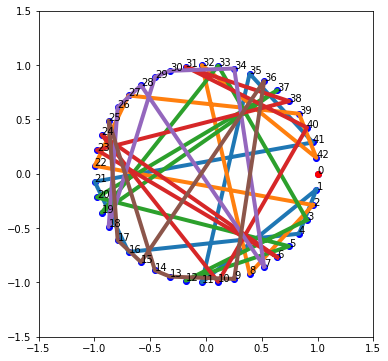


[(1,12),(2,4)],[(2,12),(1,4)]
[(1,12),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] A2= [0, 12, 24, 36]
[(2,4),(1,12)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 17, 21, 37, 7, 28, 18, 25, 6, 24, 2, 8, 32, 34, 42, 27, 14, 9, 36, 3, 12], [5, 20, 33, 38, 11, 44, 35, 46, 43, 31, 30, 26, 10, 40, 19, 29, 22, 41, 23, 45, 39, 15, 13], [47]]


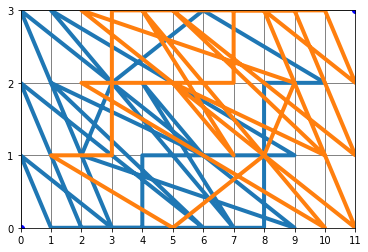

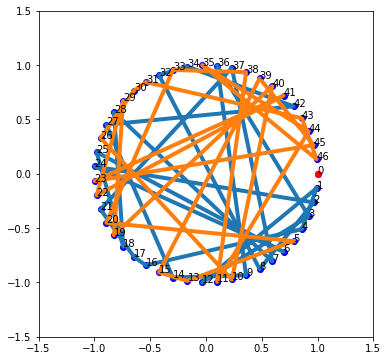


[(1,13),(2,4)],[(2,13),(1,4)]
[(1,13),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] A2= [0, 13, 26, 39]
[(2,4),(1,13)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 13], [2, 8, 32, 26], [3, 12, 48, 39], [5, 20, 29, 14], [6, 24, 45, 27], [7, 28, 10, 40], [9, 36, 42, 15], [11, 44, 23, 41], [17], [18, 21, 33, 30], [19, 25, 49, 43], [22, 37, 46, 31], [34], [35, 38, 50, 47], [51]]


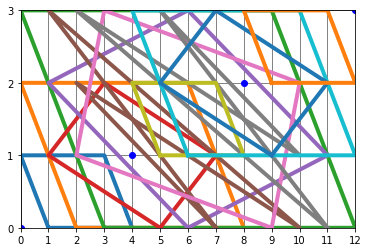

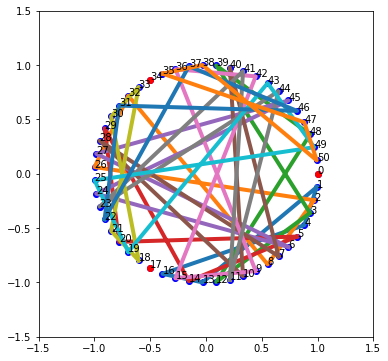


[(1,14),(2,4)],[(2,14),(1,4)]
[(1,14),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] A2= [0, 14, 28, 42]
[(2,4),(1,14)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 9, 36, 34, 26, 49, 31, 14], [2, 8, 32, 18, 17, 13, 52, 43, 7, 28], [3, 12, 48, 27, 53, 47, 23, 37, 38, 42], [5, 20, 25, 45, 15], [6, 24, 41, 54, 51, 39, 46, 19, 21, 29], [10, 40, 50, 35, 30], [11, 44], [22, 33], [55]]


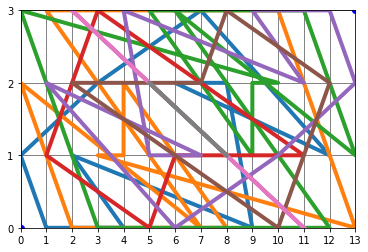

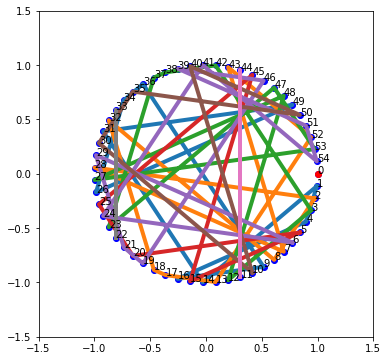


[(1,15),(2,4)],[(2,15),(1,4)]
[(1,15),(2,4)]: A1= [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14] A2= [0, 15, 30, 45]
[(2,4),(1,15)]: A1= [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56] A2= [0, 1, 2, 3]
[[0], [1, 4, 16, 5, 20, 21, 25, 41, 46, 7, 28, 53, 35, 22, 29, 57, 51, 27, 49, 19, 17, 9, 36, 26, 45, 3, 12, 48, 15], [2, 8, 32, 10, 40, 42, 50, 23, 33, 14, 56, 47, 11, 44, 58, 55, 43, 54, 39, 38, 34, 18, 13, 52, 31, 6, 24, 37, 30], [59]]


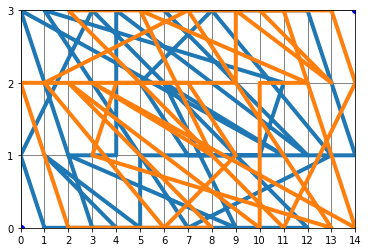

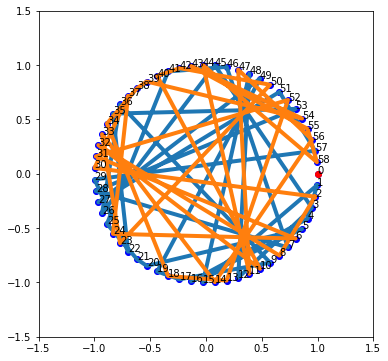

In [6]:
b=4
for a in range(2,16):
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,b,a,b))
    print("[(1,{}),(2,{})]:".format(a,b),"A1=",SumSet([(1,a),(2,b)],1),"A2=",SumSet([(1,a),(2,b)],2))
    print("[(2,{}),(1,{})]:".format(b,a),"A1=",SumSet([(2,b),(1,a)],1),"A2=",SumSet([(2,b),(1,a)],2))
    print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
    
    #DirectedGraphWLen(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    #DirectedGraphWLen(list(Orbits([(2,a),(1,b)],[(1,b),(2,a)])))
    print("")

[(1,2),(2,5)],[(2,5),(1,2)]
[[0], [1, 5, 7, 8, 4, 2], [3, 6], [9]]

[(1,5),(2,2)],[(2,2),(1,5)]
[[0], [1, 2, 4, 8, 7, 5], [3, 6], [9]]


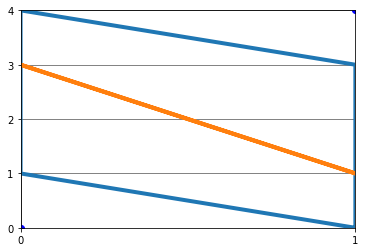

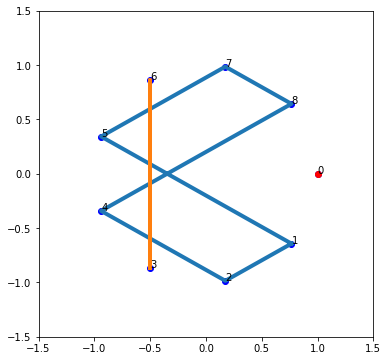

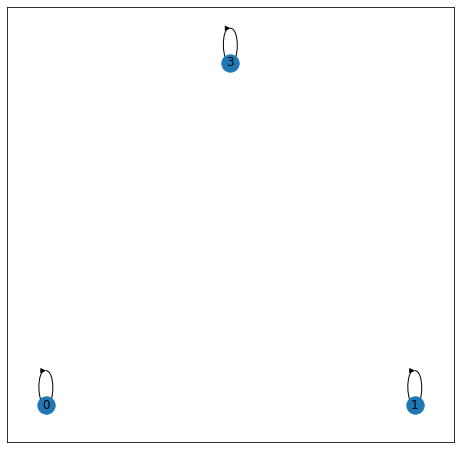

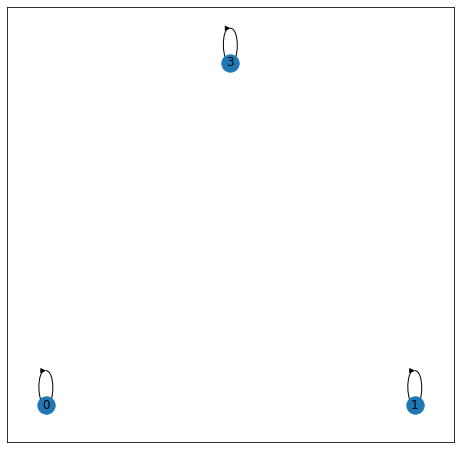


[(1,3),(2,5)],[(2,5),(1,3)]
[[0], [1, 5, 11, 13, 9, 3], [2, 10, 8, 12, 4, 6], [7], [14]]

[(1,5),(2,3)],[(2,3),(1,5)]
[[0], [1, 3, 9, 13, 11, 5], [2, 6, 4, 12, 8, 10], [7], [14]]


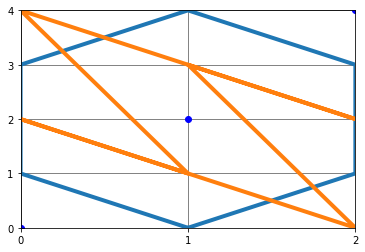

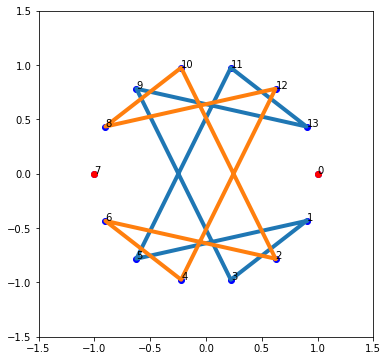

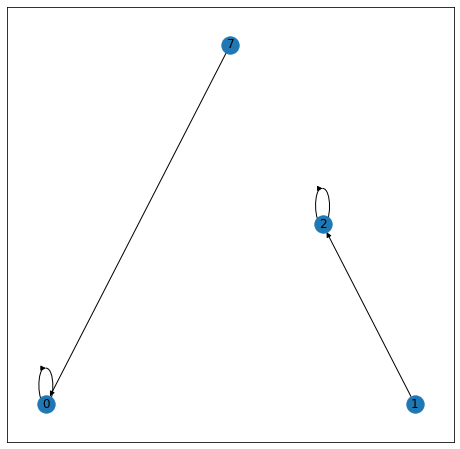

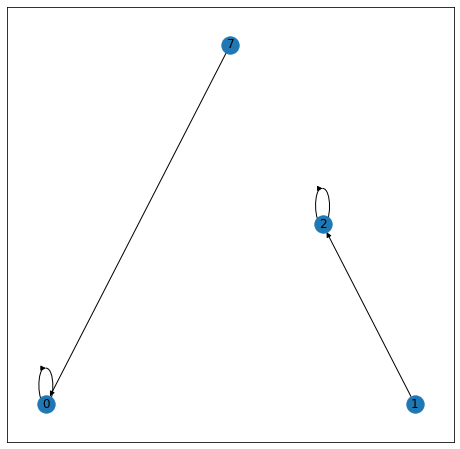


[(1,4),(2,5)],[(2,5),(1,4)]
[[0], [1, 5, 6, 11, 17, 9, 7, 16, 4], [2, 10, 12, 3, 15, 18, 14, 13, 8], [19]]

[(1,5),(2,4)],[(2,4),(1,5)]
[[0], [1, 4, 16, 7, 9, 17, 11, 6, 5], [2, 8, 13, 14, 18, 15, 3, 12, 10], [19]]


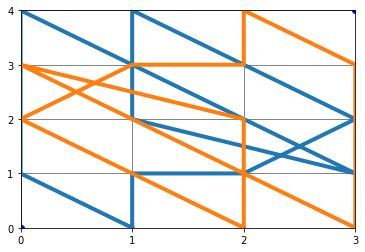

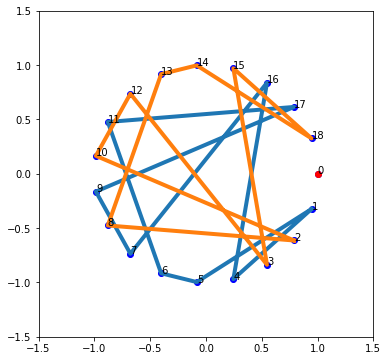

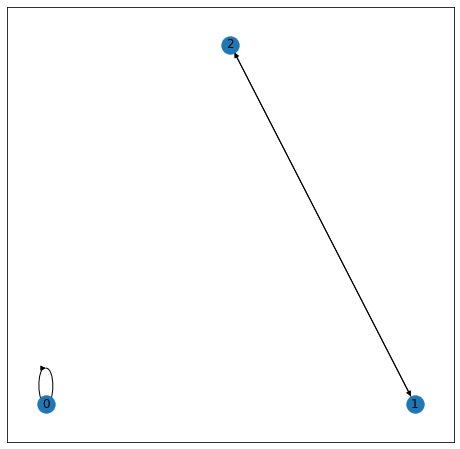

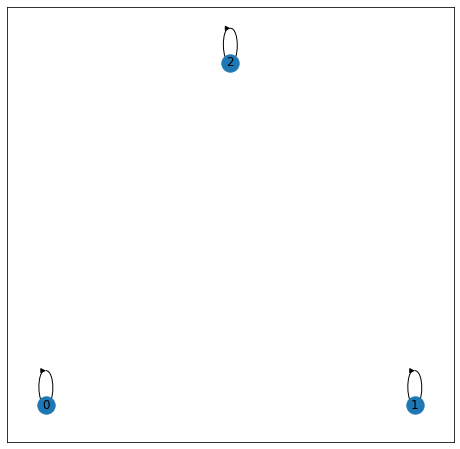


[(1,5),(2,5)],[(2,5),(1,5)]
[[0], [1, 5], [2, 10], [3, 15], [4, 20], [6], [7, 11], [8, 16], [9, 21], [12], [13, 17], [14, 22], [18], [19, 23], [24]]

[(1,5),(2,5)],[(2,5),(1,5)]
[[0], [1, 5], [2, 10], [3, 15], [4, 20], [6], [7, 11], [8, 16], [9, 21], [12], [13, 17], [14, 22], [18], [19, 23], [24]]


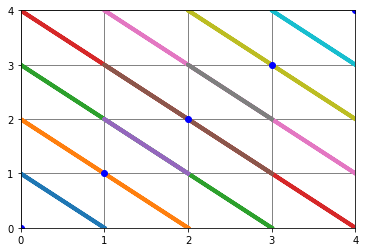

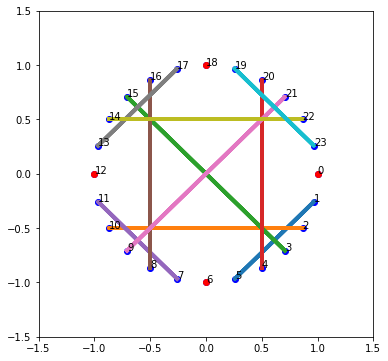

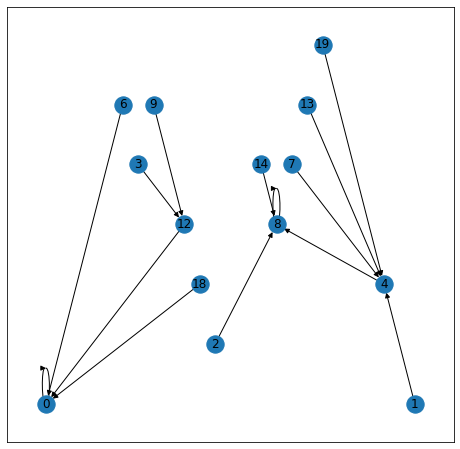

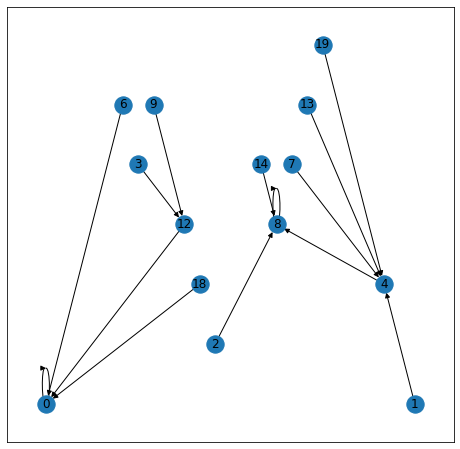


[(1,6),(2,5)],[(2,5),(1,6)]
[[0], [1, 5, 25, 9, 16, 22, 23, 28, 24, 4, 20, 13, 7, 6], [2, 10, 21, 18, 3, 15, 17, 27, 19, 8, 11, 26, 14, 12], [29]]

[(1,5),(2,6)],[(2,6),(1,5)]
[[0], [1, 6, 7, 13, 20, 4, 24, 28, 23, 22, 16, 9, 25, 5], [2, 12, 14, 26, 11, 8, 19, 27, 17, 15, 3, 18, 21, 10], [29]]


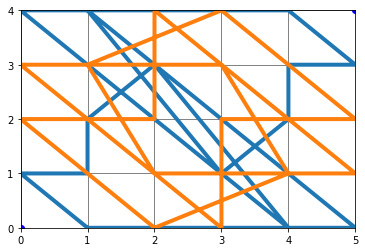

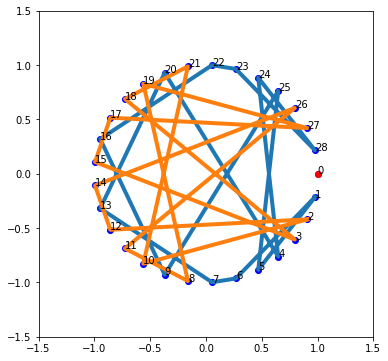

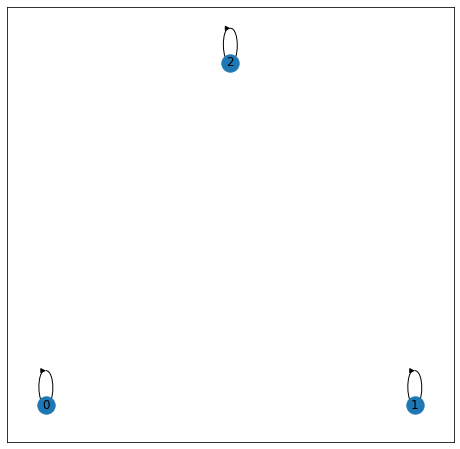

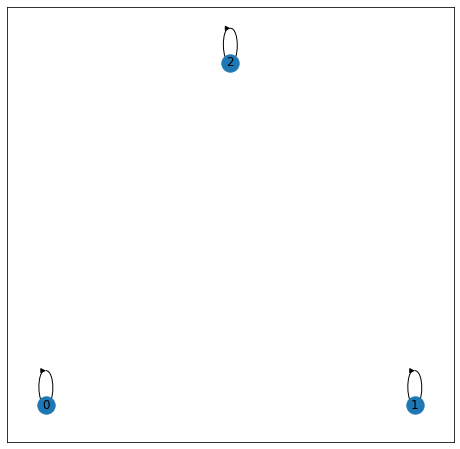


[(1,7),(2,5)],[(2,5),(1,7)]
[[0], [1, 5, 25, 23, 13, 31, 19, 27, 33, 29, 9, 11, 21, 3, 15, 7], [2, 10, 16, 12, 26, 28, 4, 20, 32, 24, 18, 22, 8, 6, 30, 14], [17], [34]]

[(1,5),(2,7)],[(2,7),(1,5)]
[[0], [1, 7, 15, 3, 21, 11, 9, 29, 33, 27, 19, 31, 13, 23, 25, 5], [2, 14, 30, 6, 8, 22, 18, 24, 32, 20, 4, 28, 26, 12, 16, 10], [17], [34]]


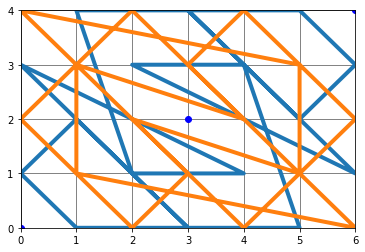

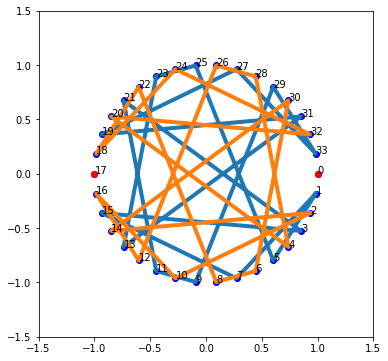

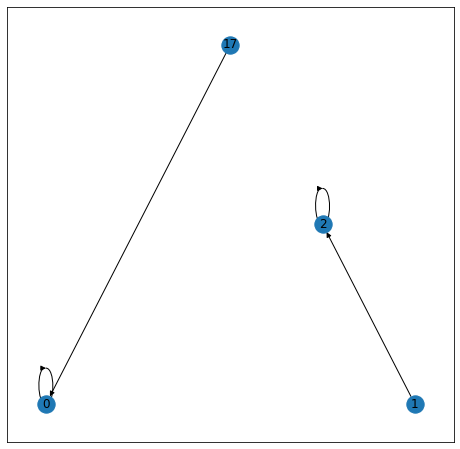

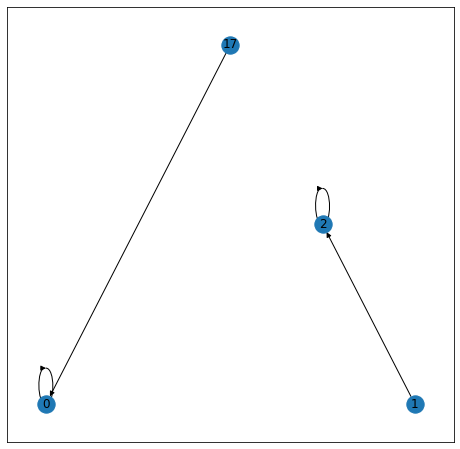


[(1,8),(2,5)],[(2,5),(1,8)]
[[0], [1, 5, 25, 8], [2, 10, 11, 16], [3, 15, 36, 24], [4, 20, 22, 32], [6, 30, 33, 9], [7, 35, 19, 17], [12, 21, 27, 18], [13, 26], [14, 31, 38, 34], [23, 37, 29, 28], [39]]

[(1,5),(2,8)],[(2,8),(1,5)]
[[0], [1, 8, 25, 5], [2, 16, 11, 10], [3, 24, 36, 15], [4, 32, 22, 20], [6, 9, 33, 30], [7, 17, 19, 35], [12, 18, 27, 21], [13, 26], [14, 34, 38, 31], [23, 28, 29, 37], [39]]


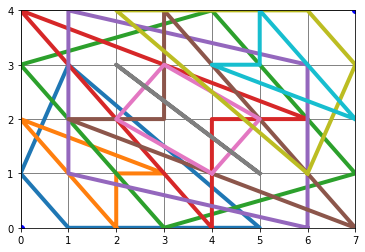

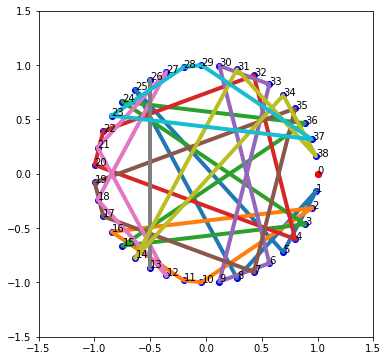

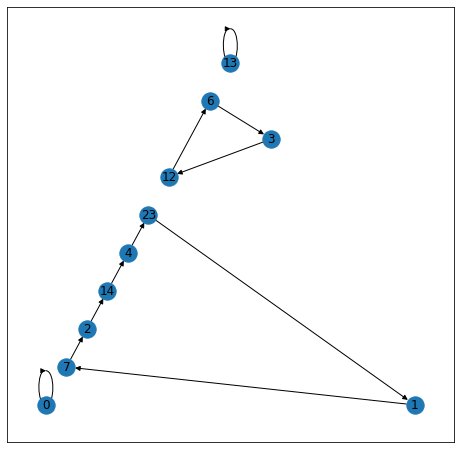

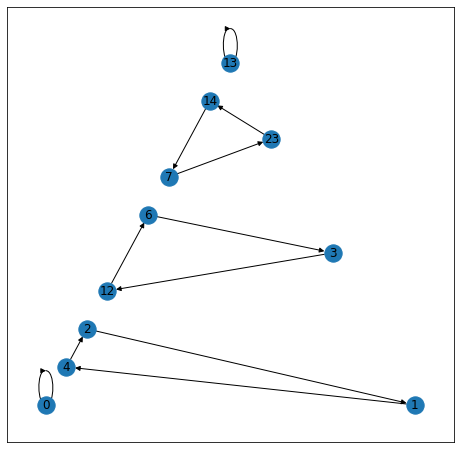


[(1,9),(2,5)],[(2,5),(1,9)]
[[0], [1, 5, 25, 37, 9], [2, 10, 6, 30, 18], [3, 15, 31, 23, 27], [4, 20, 12, 16, 36], [7, 35, 43, 39, 19], [8, 40, 24, 32, 28], [11], [13, 21, 17, 41, 29], [14, 26, 42, 34, 38], [22], [33], [44]]

[(1,5),(2,9)],[(2,9),(1,5)]
[[0], [1, 9, 37, 25, 5], [2, 18, 30, 6, 10], [3, 27, 23, 31, 15], [4, 36, 16, 12, 20], [7, 19, 39, 43, 35], [8, 28, 32, 24, 40], [11], [13, 29, 41, 17, 21], [14, 38, 34, 42, 26], [22], [33], [44]]


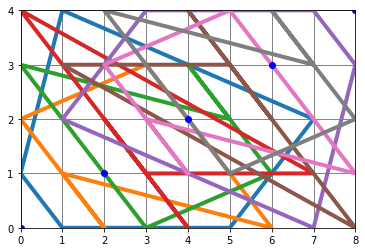

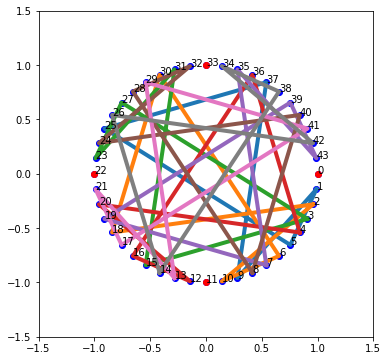

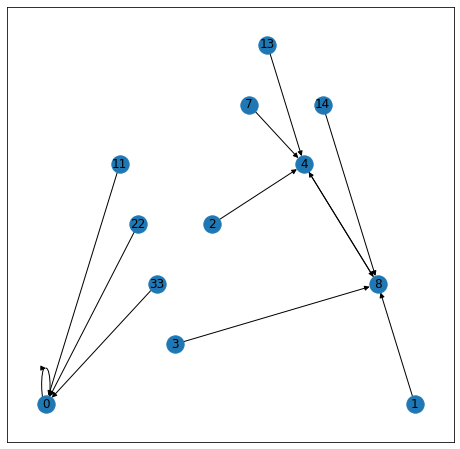

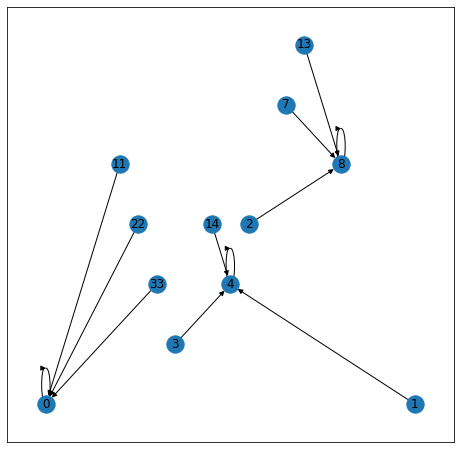


[(1,10),(2,5)],[(2,5),(1,10)]
[[0], [1, 5, 25, 27, 37, 38, 43, 19, 46, 34, 23, 17, 36, 33, 18, 41, 9, 45, 29, 47, 39, 48, 44, 24, 22, 12, 11, 6, 30, 3, 15, 26, 32, 13, 16, 31, 8, 40, 4, 20, 2, 10], [7, 35, 28, 42, 14, 21], [49]]

[(1,5),(2,10)],[(2,10),(1,5)]
[[0], [1, 10, 2, 20, 4, 40, 8, 31, 16, 13, 32, 26, 15, 3, 30, 6, 11, 12, 22, 24, 44, 48, 39, 47, 29, 45, 9, 41, 18, 33, 36, 17, 23, 34, 46, 19, 43, 38, 37, 27, 25, 5], [7, 21, 14, 42, 28, 35], [49]]


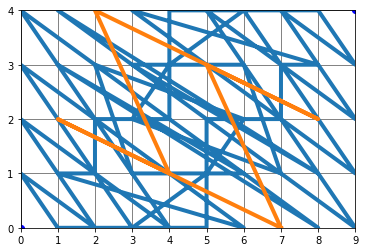

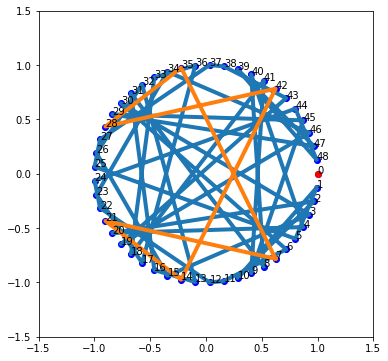

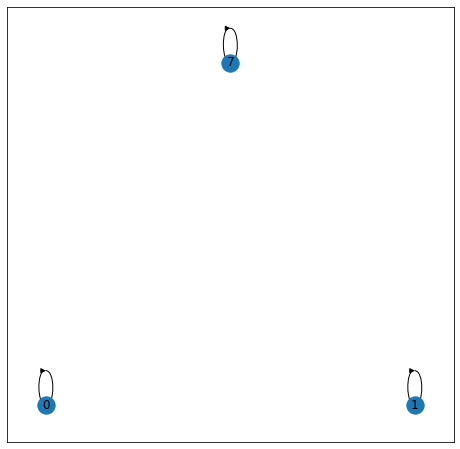

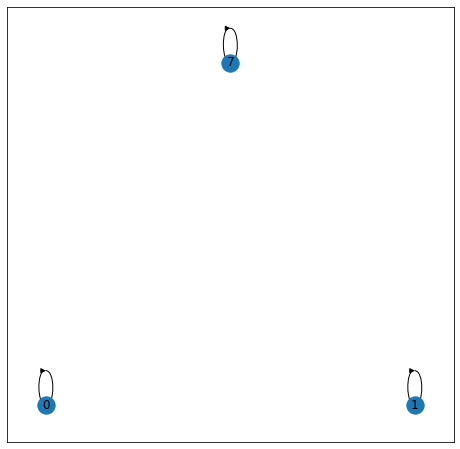


[(1,11),(2,5)],[(2,5),(1,11)]
[[0], [1, 5, 25, 17, 31, 47, 19, 41, 43, 53, 49, 29, 37, 23, 7, 35, 13, 11], [2, 10, 50, 34, 8, 40, 38, 28, 32, 52, 44, 4, 20, 46, 14, 16, 26, 22], [3, 15, 21, 51, 39, 33], [6, 30, 42, 48, 24, 12], [9, 45], [18, 36], [27], [54]]

[(1,5),(2,11)],[(2,11),(1,5)]
[[0], [1, 11, 13, 35, 7, 23, 37, 29, 49, 53, 43, 41, 19, 47, 31, 17, 25, 5], [2, 22, 26, 16, 14, 46, 20, 4, 44, 52, 32, 28, 38, 40, 8, 34, 50, 10], [3, 33, 39, 51, 21, 15], [6, 12, 24, 48, 42, 30], [9, 45], [18, 36], [27], [54]]


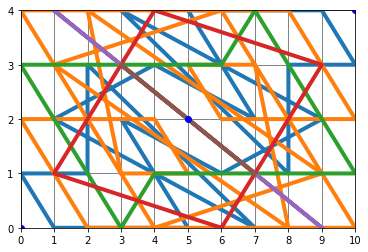

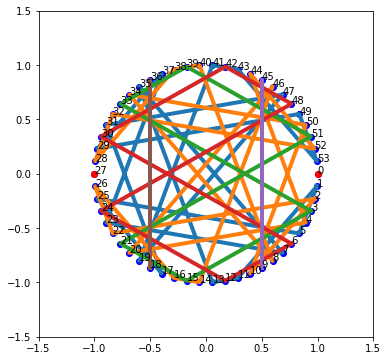

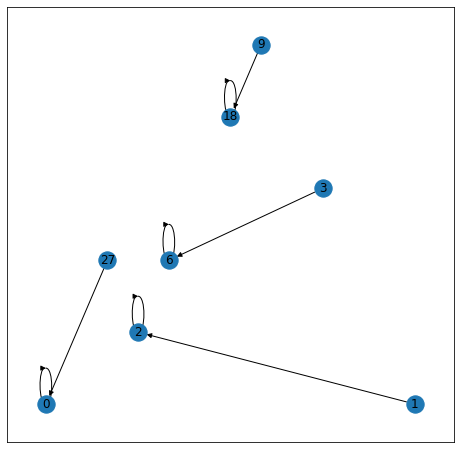

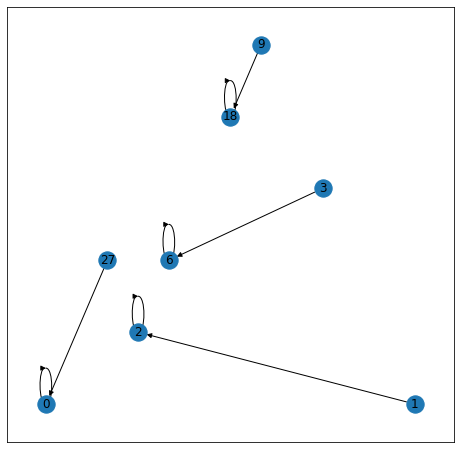


[(1,12),(2,5)],[(2,5),(1,12)]
[[0], [1, 5, 25, 7, 35, 57, 49, 9, 45, 48, 4, 20, 41, 28, 22, 51, 19, 36, 3, 15, 16, 21, 46, 53, 29, 27, 17, 26, 12], [2, 10, 50, 14, 11, 55, 39, 18, 31, 37, 8, 40, 23, 56, 44, 43, 38, 13, 6, 30, 32, 42, 33, 47, 58, 54, 34, 52, 24], [59]]

[(1,5),(2,12)],[(2,12),(1,5)]
[[0], [1, 12, 26, 17, 27, 29, 53, 46, 21, 16, 15, 3, 36, 19, 51, 22, 28, 41, 20, 4, 48, 45, 9, 49, 57, 35, 7, 25, 5], [2, 24, 52, 34, 54, 58, 47, 33, 42, 32, 30, 6, 13, 38, 43, 44, 56, 23, 40, 8, 37, 31, 18, 39, 55, 11, 14, 50, 10], [59]]


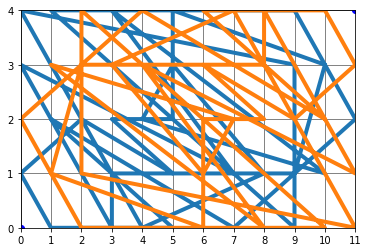

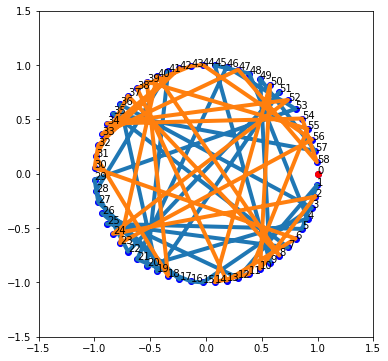

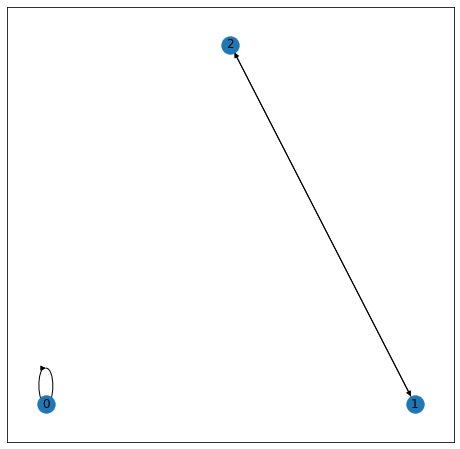

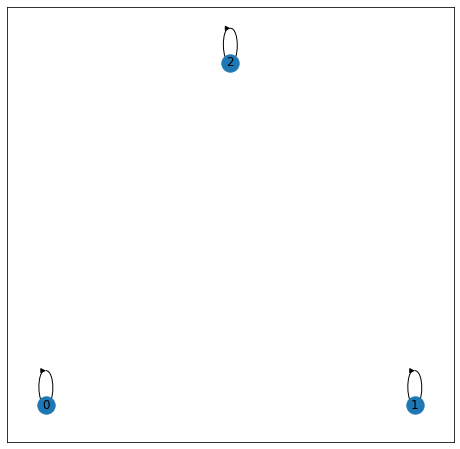


[(1,13),(2,5)],[(2,5),(1,13)]
[[0], [1, 5, 25, 61, 49, 53, 9, 45, 33, 37, 57, 29, 17, 21, 41, 13], [2, 10, 50, 58, 34, 42, 18, 26], [3, 15, 11, 55, 19, 31, 27, 7, 35, 47, 43, 23, 51, 63, 59, 39], [4, 20, 36, 52], [6, 30, 22, 46, 38, 62, 54, 14], [8, 40], [12, 60, 44, 28], [16], [24, 56], [32], [48], [64]]

[(1,5),(2,13)],[(2,13),(1,5)]
[[0], [1, 13, 41, 21, 17, 29, 57, 37, 33, 45, 9, 53, 49, 61, 25, 5], [2, 26, 18, 42, 34, 58, 50, 10], [3, 39, 59, 63, 51, 23, 43, 47, 35, 7, 27, 31, 19, 55, 11, 15], [4, 52, 36, 20], [6, 14, 54, 62, 38, 46, 22, 30], [8, 40], [12, 28, 44, 60], [16], [24, 56], [32], [48], [64]]


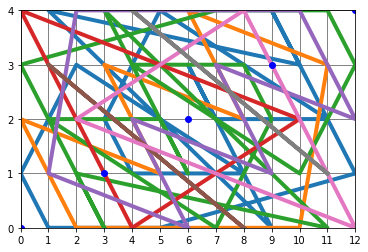

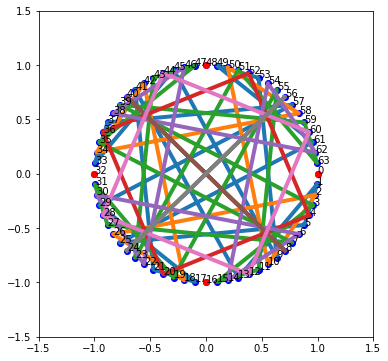

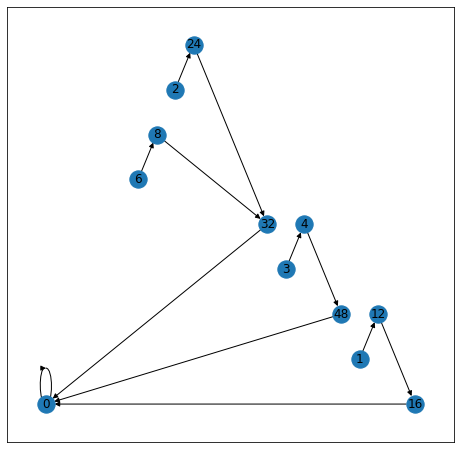

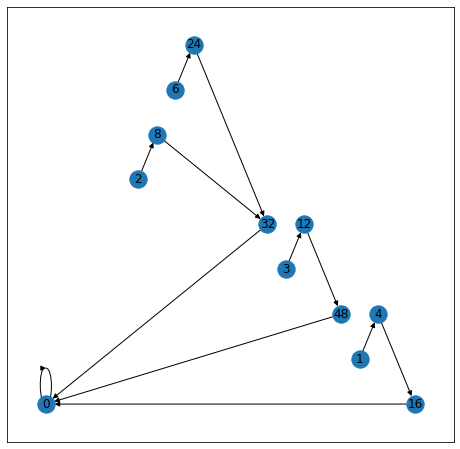


[(1,14),(2,5)],[(2,5),(1,14)]
[[0], [1, 5, 25, 56, 4, 20, 31, 17, 16, 11, 55, 68, 64, 44, 13, 65, 49, 38, 52, 53, 58, 14], [2, 10, 50, 43, 8, 40, 62, 34, 32, 22, 41, 67, 59, 19, 26, 61, 29, 7, 35, 37, 47, 28], [3, 15, 6, 30, 12, 60, 24, 51, 48, 33, 27, 66, 54, 63, 39, 57, 9, 45, 18, 21, 36, 42], [23, 46], [69]]

[(1,5),(2,14)],[(2,14),(1,5)]
[[0], [1, 14, 58, 53, 52, 38, 49, 65, 13, 44, 64, 68, 55, 11, 16, 17, 31, 20, 4, 56, 25, 5], [2, 28, 47, 37, 35, 7, 29, 61, 26, 19, 59, 67, 41, 22, 32, 34, 62, 40, 8, 43, 50, 10], [3, 42, 36, 21, 18, 45, 9, 57, 39, 63, 54, 66, 27, 33, 48, 51, 24, 60, 12, 30, 6, 15], [23, 46], [69]]


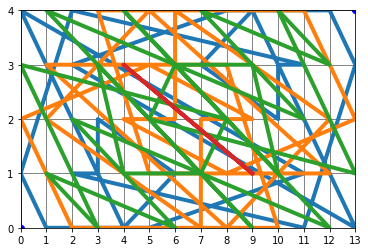

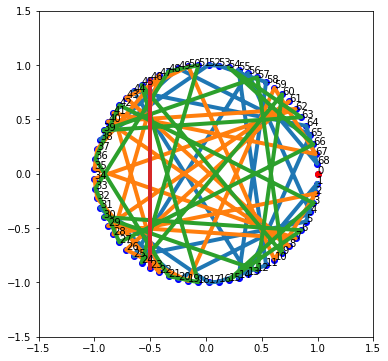

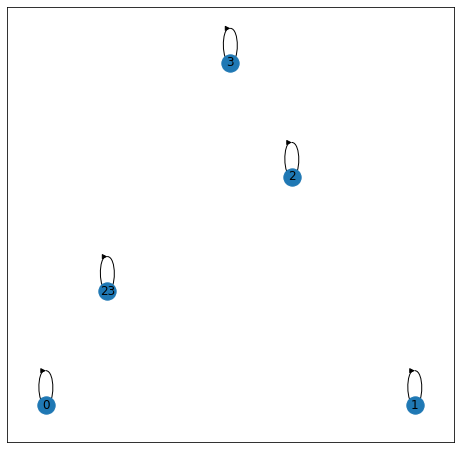

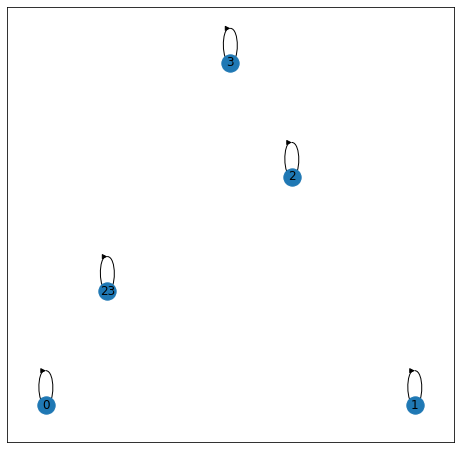


[(1,15),(2,5)],[(2,5),(1,15)]
[[0], [1, 5, 25, 51, 33, 17, 11, 55, 53, 43, 67, 39, 47, 13, 65, 29, 71, 59, 73, 69, 49, 23, 41, 57, 63, 19, 21, 31, 7, 35, 27, 61, 9, 45, 3, 15], [2, 10, 50, 28, 66, 34, 22, 36, 32, 12, 60, 4, 20, 26, 56, 58, 68, 44, 72, 64, 24, 46, 8, 40, 52, 38, 42, 62, 14, 70, 54, 48, 18, 16, 6, 30], [37], [74]]

[(1,5),(2,15)],[(2,15),(1,5)]
[[0], [1, 15, 3, 45, 9, 61, 27, 35, 7, 31, 21, 19, 63, 57, 41, 23, 49, 69, 73, 59, 71, 29, 65, 13, 47, 39, 67, 43, 53, 55, 11, 17, 33, 51, 25, 5], [2, 30, 6, 16, 18, 48, 54, 70, 14, 62, 42, 38, 52, 40, 8, 46, 24, 64, 72, 44, 68, 58, 56, 26, 20, 4, 60, 12, 32, 36, 22, 34, 66, 28, 50, 10], [37], [74]]


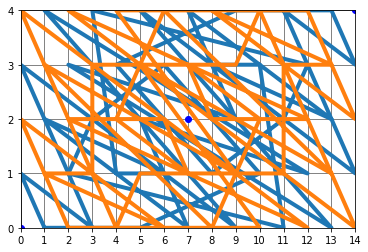

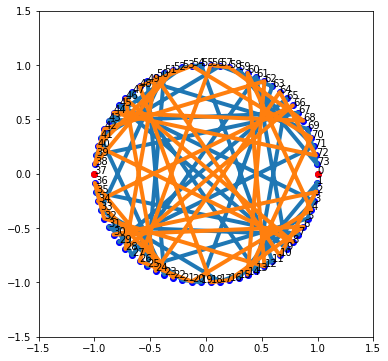

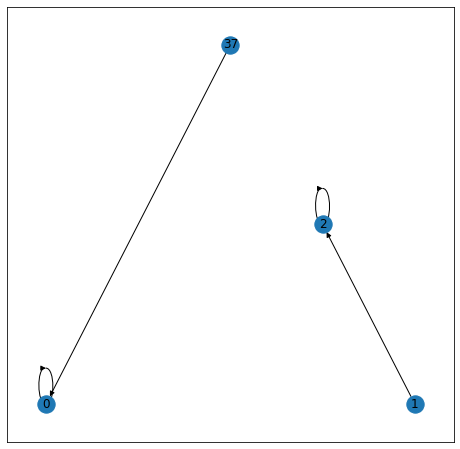

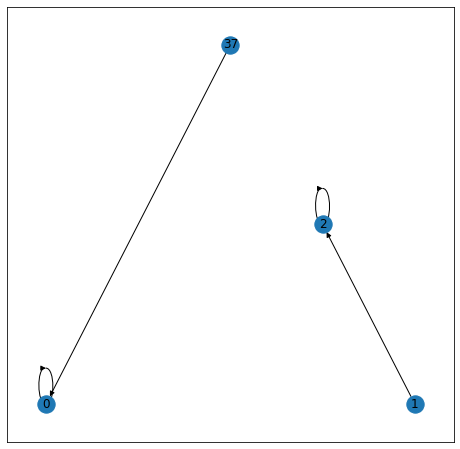

In [10]:
b=5
for a in range(2,16):
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,b,b,a))
    print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    print("")
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(b,a,a,b))
    print(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
    DirectedGraphWLen(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    DirectedGraphWLen(list(Orbits([(2,a),(1,b)],[(1,b),(2,a)])))
    print("")

[(1,2),(2,7)],[(2,7),(1,2)]
[[0], [1, 7, 10, 5, 9, 11, 12, 6, 3, 8, 4, 2], [13]]

[(1,7),(2,2)],[(2,2),(1,7)]
[[0], [1, 2, 4, 8, 3, 6, 12, 11, 9, 5, 10, 7], [13]]


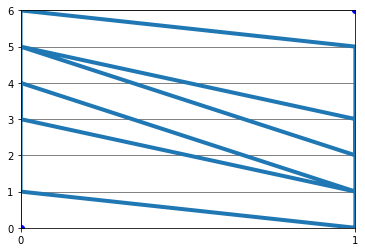

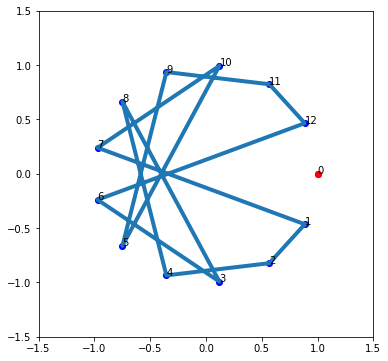

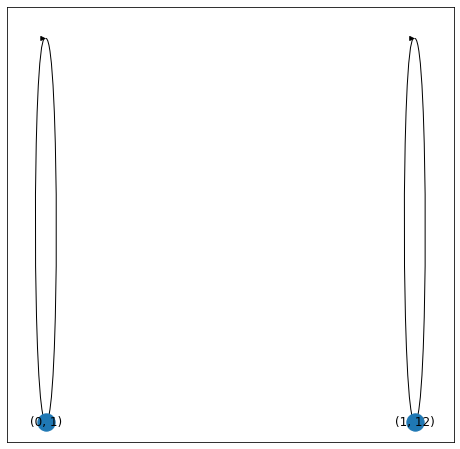

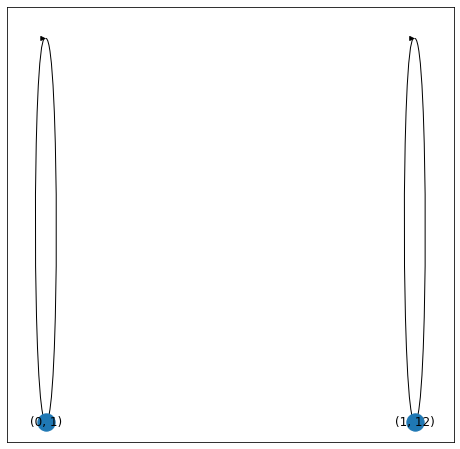


[(1,3),(2,7)],[(2,7),(1,3)]
[[0], [1, 7, 9, 3], [2, 14, 18, 6], [4, 8, 16, 12], [5, 15], [10], [11, 17, 19, 13], [20]]

[(1,7),(2,3)],[(2,3),(1,7)]
[[0], [1, 3, 9, 7], [2, 6, 18, 14], [4, 12, 16, 8], [5, 15], [10], [11, 13, 19, 17], [20]]


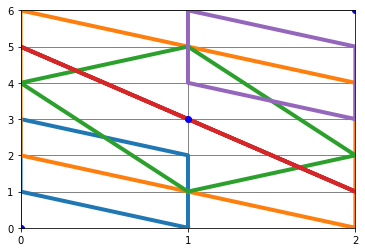

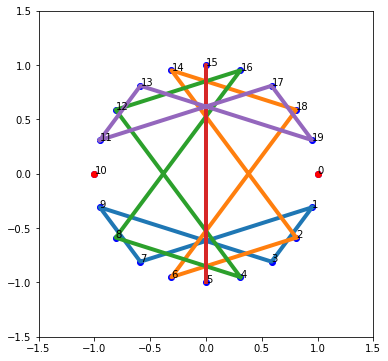

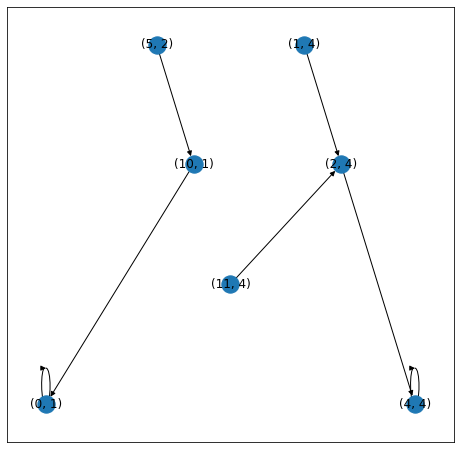

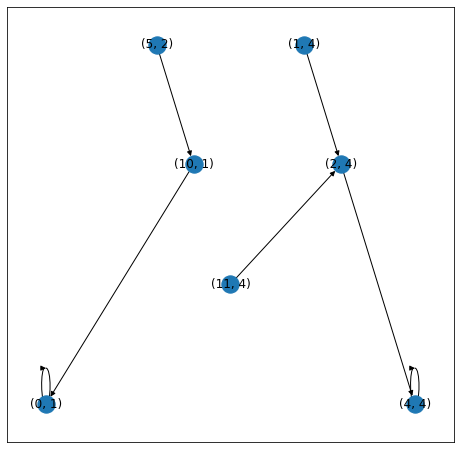


[(1,4),(2,7)],[(2,7),(1,4)]
[[0], [1, 7, 22, 19, 25, 13, 10, 16, 4], [2, 14, 17, 11, 23, 26, 20, 5, 8], [3, 21, 12], [6, 15, 24], [9], [18], [27]]

[(1,7),(2,4)],[(2,4),(1,7)]
[[0], [1, 4, 16, 10, 13, 25, 19, 22, 7], [2, 8, 5, 20, 26, 23, 11, 17, 14], [3, 12, 21], [6, 24, 15], [9], [18], [27]]


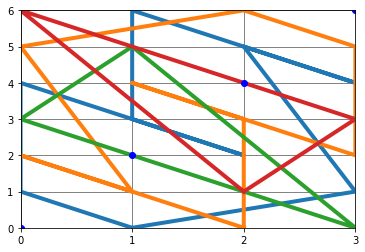

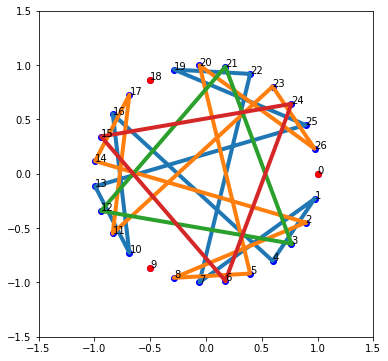

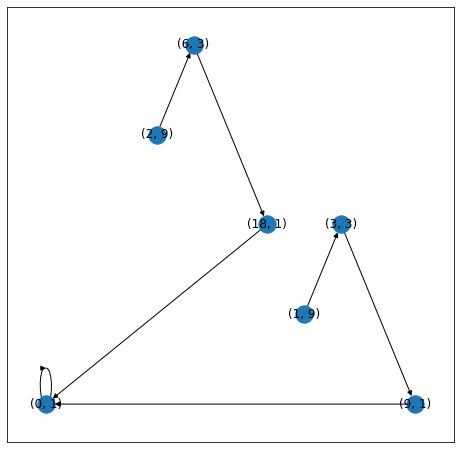

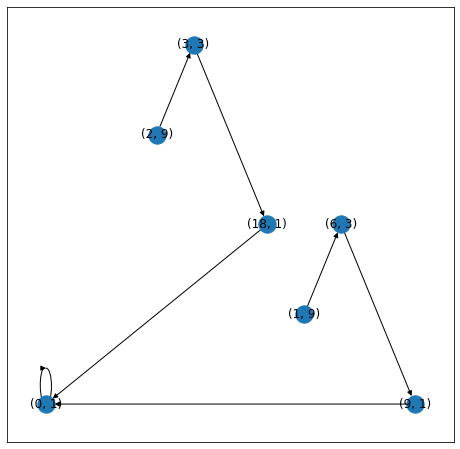


[(1,5),(2,7)],[(2,7),(1,5)]
[[0], [1, 7, 15, 3, 21, 11, 9, 29, 33, 27, 19, 31, 13, 23, 25, 5], [2, 14, 30, 6, 8, 22, 18, 24, 32, 20, 4, 28, 26, 12, 16, 10], [17], [34]]

[(1,7),(2,5)],[(2,5),(1,7)]
[[0], [1, 5, 25, 23, 13, 31, 19, 27, 33, 29, 9, 11, 21, 3, 15, 7], [2, 10, 16, 12, 26, 28, 4, 20, 32, 24, 18, 22, 8, 6, 30, 14], [17], [34]]


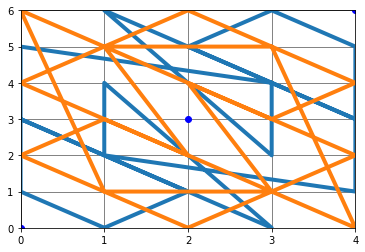

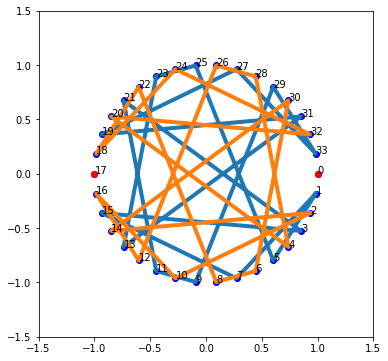

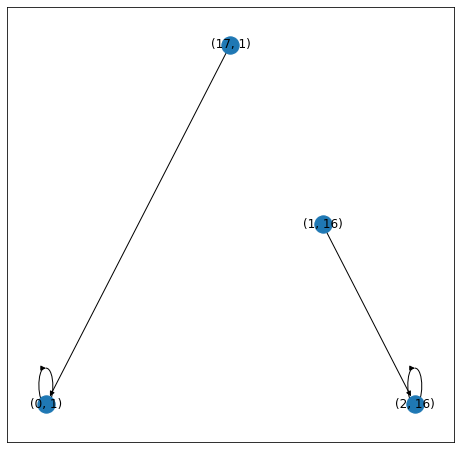

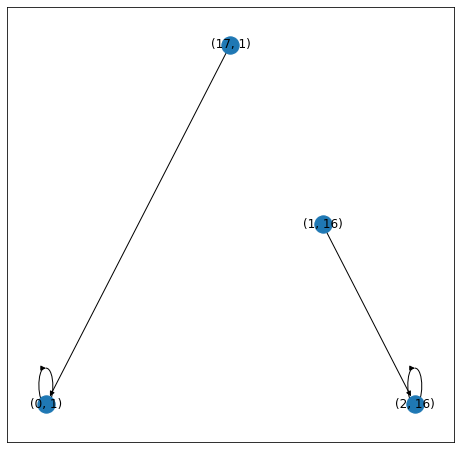


[(1,6),(2,7)],[(2,7),(1,6)]
[[0], [1, 7, 8, 15, 23, 38, 20, 17, 37, 13, 9, 22, 31, 12, 2, 14, 16, 30, 5, 35, 40, 34, 33, 26, 18, 3, 21, 24, 4, 28, 32, 19, 10, 29, 39, 27, 25, 11, 36, 6], [41]]

[(1,7),(2,6)],[(2,6),(1,7)]
[[0], [1, 6, 36, 11, 25, 27, 39, 29, 10, 19, 32, 28, 4, 24, 21, 3, 18, 26, 33, 34, 40, 35, 5, 30, 16, 14, 2, 12, 31, 22, 9, 13, 37, 17, 20, 38, 23, 15, 8, 7], [41]]


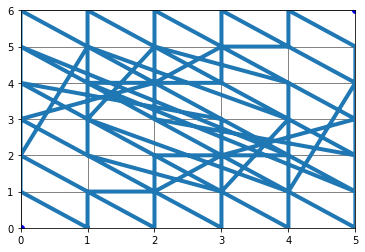

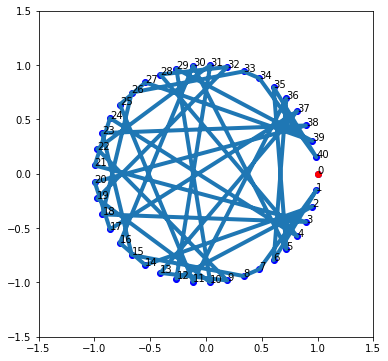

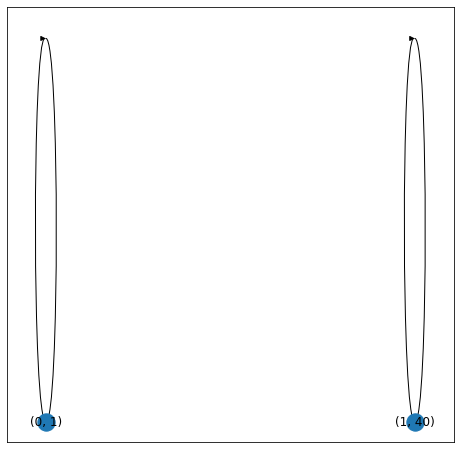

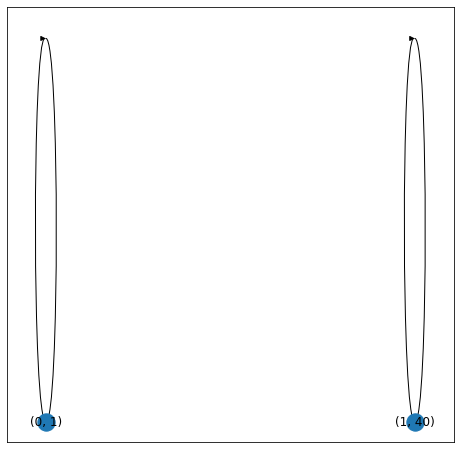


[(1,7),(2,7)],[(2,7),(1,7)]
[[0], [1, 7], [2, 14], [3, 21], [4, 28], [5, 35], [6, 42], [8], [9, 15], [10, 22], [11, 29], [12, 36], [13, 43], [16], [17, 23], [18, 30], [19, 37], [20, 44], [24], [25, 31], [26, 38], [27, 45], [32], [33, 39], [34, 46], [40], [41, 47], [48]]

[(1,7),(2,7)],[(2,7),(1,7)]
[[0], [1, 7], [2, 14], [3, 21], [4, 28], [5, 35], [6, 42], [8], [9, 15], [10, 22], [11, 29], [12, 36], [13, 43], [16], [17, 23], [18, 30], [19, 37], [20, 44], [24], [25, 31], [26, 38], [27, 45], [32], [33, 39], [34, 46], [40], [41, 47], [48]]


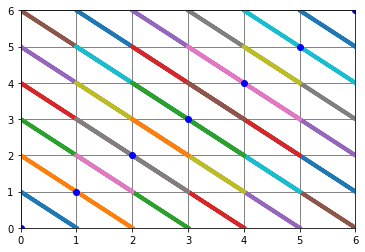

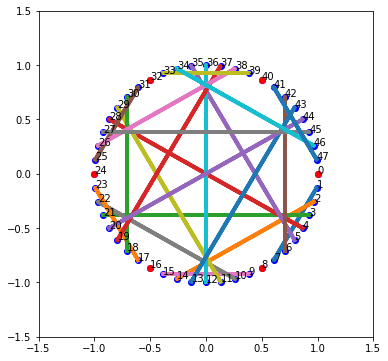

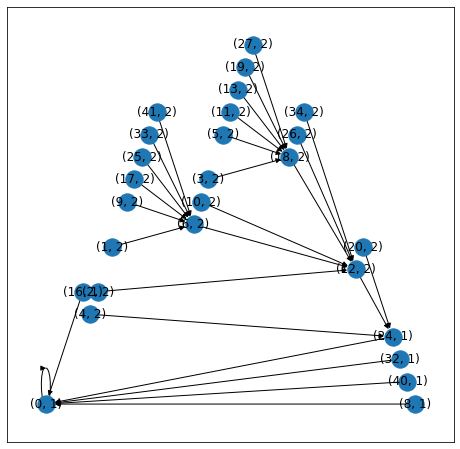

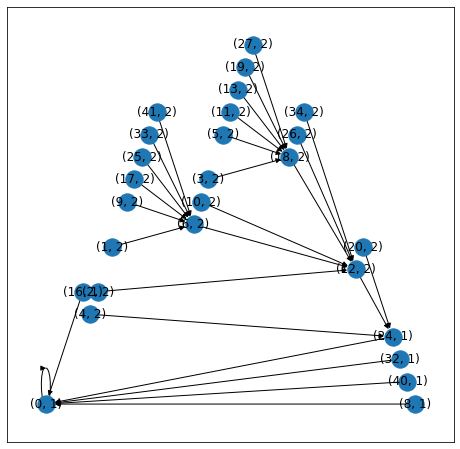


[(1,8),(2,7)],[(2,7),(1,8)]
[[0], [1, 7, 49, 13, 36, 32, 4, 28, 31, 52, 34, 18, 16, 2, 14, 43, 26, 17, 9, 8], [3, 21, 37, 39, 53, 41, 12, 29, 38, 46, 47, 54, 48, 6, 42, 19, 23, 51, 27, 24], [5, 35, 25, 10, 15, 50, 20, 30, 45, 40], [11, 22, 44, 33], [55]]

[(1,7),(2,8)],[(2,8),(1,7)]
[[0], [1, 8, 9, 17, 26, 43, 14, 2, 16, 18, 34, 52, 31, 28, 4, 32, 36, 13, 49, 7], [3, 24, 27, 51, 23, 19, 42, 6, 48, 54, 47, 46, 38, 29, 12, 41, 53, 39, 37, 21], [5, 40, 45, 30, 20, 50, 15, 10, 25, 35], [11, 33, 44, 22], [55]]


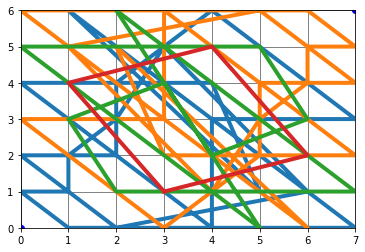

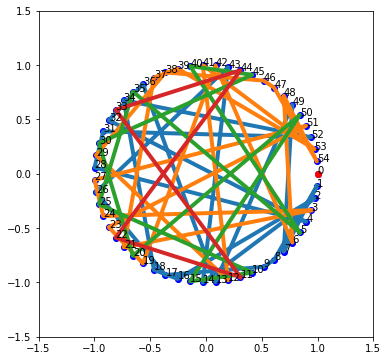

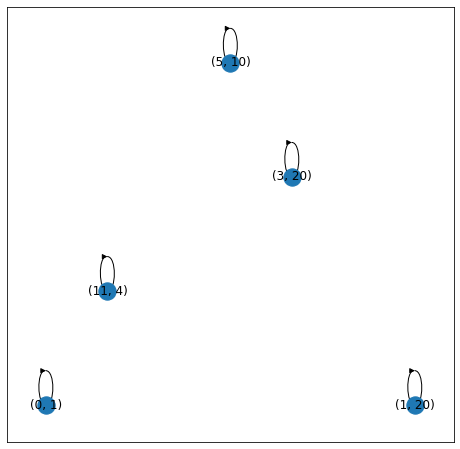

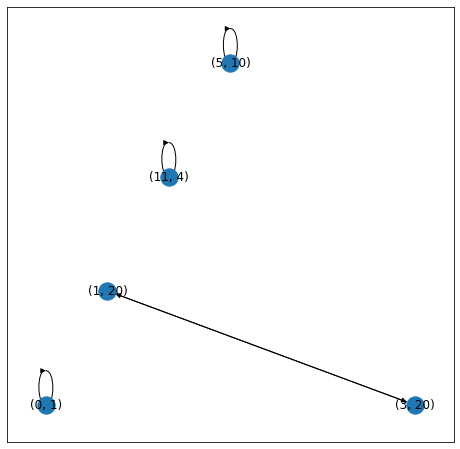


[(1,9),(2,7)],[(2,7),(1,9)]
[[0], [1, 7, 49, 33, 45, 5, 35, 59, 41, 39, 25, 51, 47, 19, 9], [2, 14, 36, 4, 28, 10, 8, 56, 20, 16, 50, 40, 32, 38, 18], [3, 21, 23, 37, 11, 15, 43, 53, 61, 55, 13, 29, 17, 57, 27], [6, 42, 46, 12, 22, 30, 24, 44, 60, 48, 26, 58, 34, 52, 54], [31], [62]]

[(1,7),(2,9)],[(2,9),(1,7)]
[[0], [1, 9, 19, 47, 51, 25, 39, 41, 59, 35, 5, 45, 33, 49, 7], [2, 18, 38, 32, 40, 50, 16, 20, 56, 8, 10, 28, 4, 36, 14], [3, 27, 57, 17, 29, 13, 55, 61, 53, 43, 15, 11, 37, 23, 21], [6, 54, 52, 34, 58, 26, 48, 60, 44, 24, 30, 22, 12, 46, 42], [31], [62]]


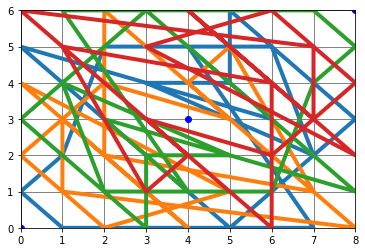

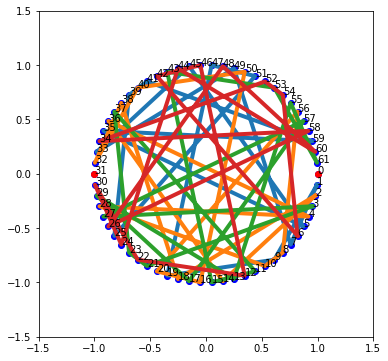

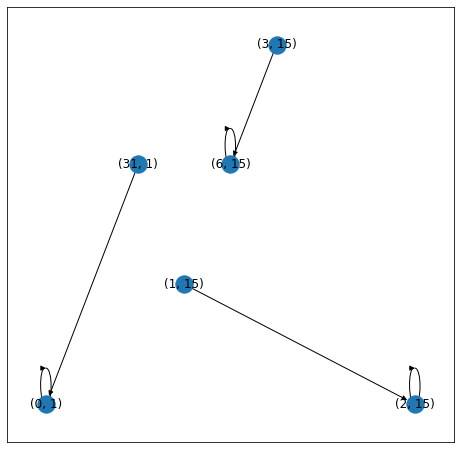

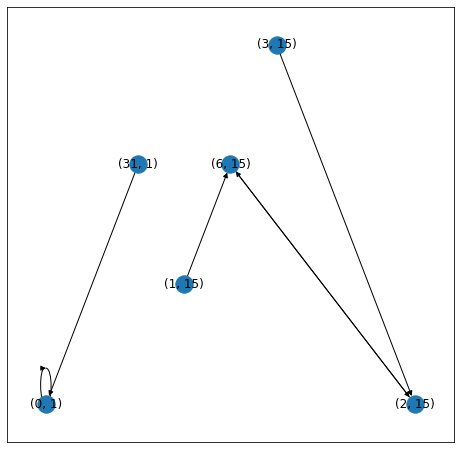


[(1,10),(2,7)],[(2,7),(1,10)]
[[0], [1, 7, 49, 67, 55, 40, 4, 28, 58, 61, 13, 22, 16, 43, 25, 37, 52, 19, 64, 34, 31, 10], [2, 14, 29, 65, 41, 11, 8, 56, 47, 53, 26, 44, 32, 17, 50, 5, 35, 38, 59, 68, 62, 20], [3, 21, 9, 63, 27, 51, 12, 15, 36, 45, 39, 66, 48, 60, 6, 42, 18, 57, 54, 33, 24, 30], [23], [46], [69]]

[(1,7),(2,10)],[(2,10),(1,7)]
[[0], [1, 10, 31, 34, 64, 19, 52, 37, 25, 43, 16, 22, 13, 61, 58, 28, 4, 40, 55, 67, 49, 7], [2, 20, 62, 68, 59, 38, 35, 5, 50, 17, 32, 44, 26, 53, 47, 56, 8, 11, 41, 65, 29, 14], [3, 30, 24, 33, 54, 57, 18, 42, 6, 60, 48, 66, 39, 45, 36, 15, 12, 51, 27, 63, 9, 21], [23], [46], [69]]


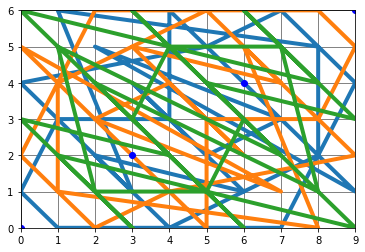

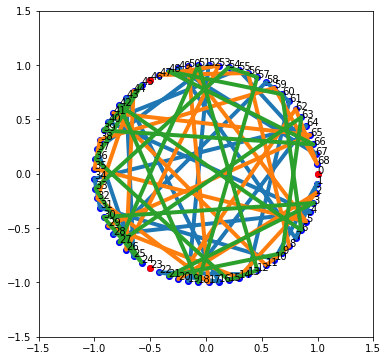

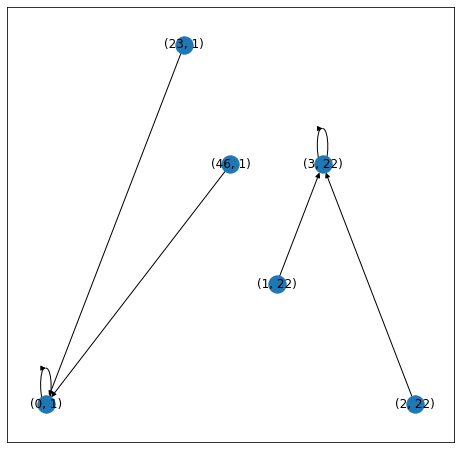

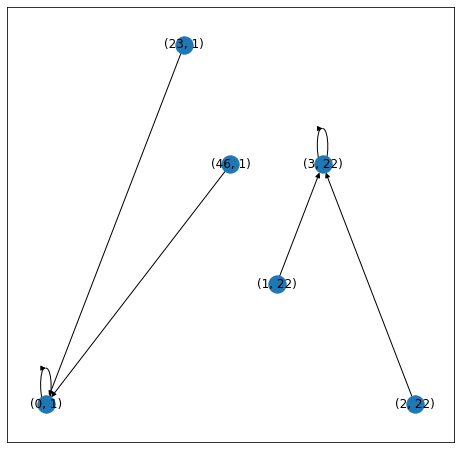


[(1,11),(2,7)],[(2,7),(1,11)]
[[0], [1, 7, 49, 39, 45, 11], [2, 14, 22], [3, 21, 71, 41, 59, 33], [4, 28, 44], [5, 35, 17, 43, 73, 55], [6, 42, 66], [8, 56, 12], [9, 63, 61, 47, 25, 23], [10, 70, 34], [13, 15, 29, 51, 53, 67], [16, 36, 24], [18, 50, 46], [19, 57], [20, 64, 68], [26, 30, 58], [27, 37, 31, 65, 75, 69], [32, 72, 48], [38], [40, 52, 60], [54, 74, 62], [76]]

[(1,7),(2,11)],[(2,11),(1,7)]
[[0], [1, 11, 45, 39, 49, 7], [2, 22, 14], [3, 33, 59, 41, 71, 21], [4, 44, 28], [5, 55, 73, 43, 17, 35], [6, 66, 42], [8, 12, 56], [9, 23, 25, 47, 61, 63], [10, 34, 70], [13, 67, 53, 51, 29, 15], [16, 24, 36], [18, 46, 50], [19, 57], [20, 68, 64], [26, 58, 30], [27, 69, 75, 65, 31, 37], [32, 48, 72], [38], [40, 60, 52], [54, 62, 74], [76]]


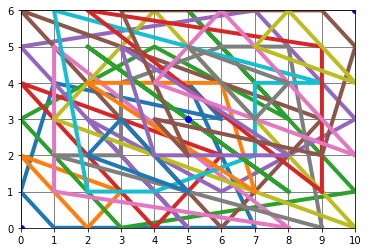

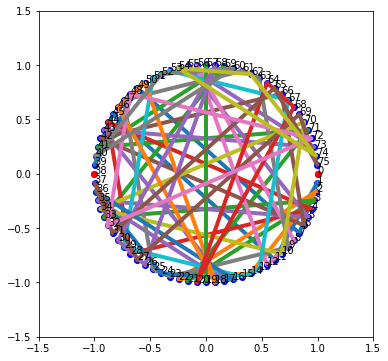

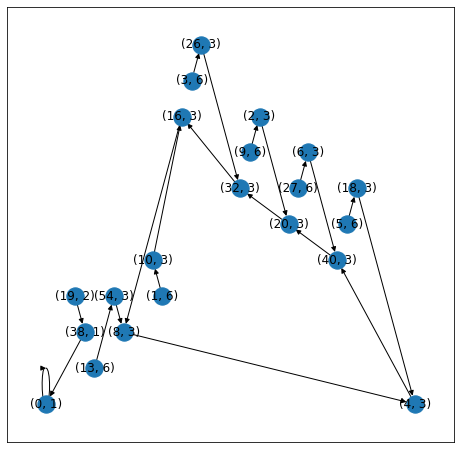

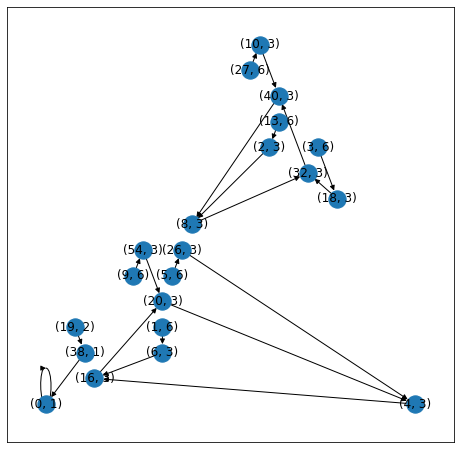


[(1,12),(2,7)],[(2,7),(1,12)]
[[0], [1, 7, 49, 11, 77, 41, 38, 17, 36, 3, 21, 64, 33, 65, 40, 31, 51, 25, 9, 63, 26, 16, 29, 37, 10, 70, 75, 27, 23, 78, 48, 4, 28, 30, 44, 59, 81, 69, 68, 61, 12], [2, 14, 15, 22, 71, 82, 76, 34, 72, 6, 42, 45, 66, 47, 80, 62, 19, 50, 18, 43, 52, 32, 58, 74, 20, 57, 67, 54, 46, 73, 13, 8, 56, 60, 5, 35, 79, 55, 53, 39, 24], [83]]

[(1,7),(2,12)],[(2,12),(1,7)]
[[0], [1, 12, 61, 68, 69, 81, 59, 44, 30, 28, 4, 48, 78, 23, 27, 75, 70, 10, 37, 29, 16, 26, 63, 9, 25, 51, 31, 40, 65, 33, 64, 21, 3, 36, 17, 38, 41, 77, 11, 49, 7], [2, 24, 39, 53, 55, 79, 35, 5, 60, 56, 8, 13, 73, 46, 54, 67, 57, 20, 74, 58, 32, 52, 43, 18, 50, 19, 62, 80, 47, 66, 45, 42, 6, 72, 34, 76, 82, 71, 22, 15, 14], [83]]


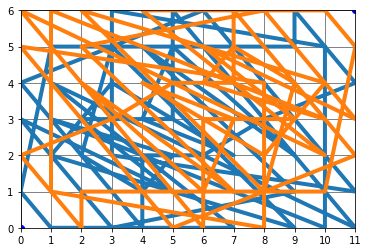

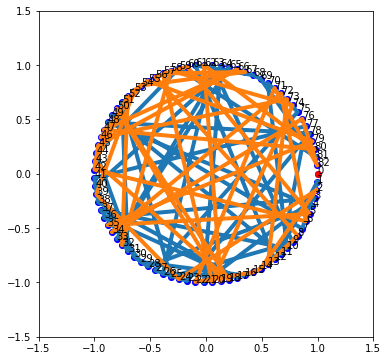

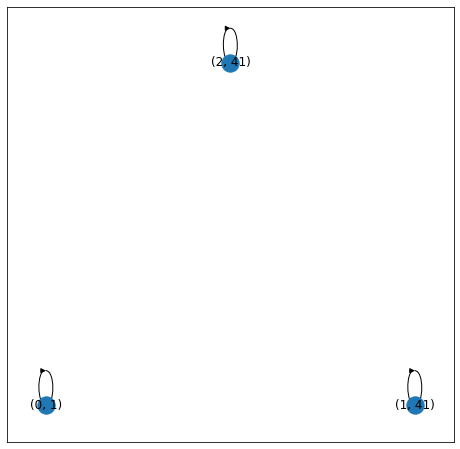

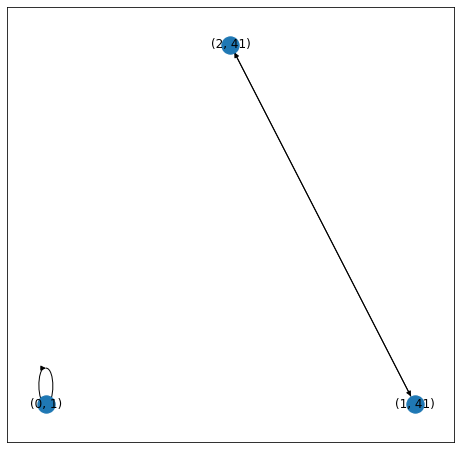


[(1,13),(2,7)],[(2,7),(1,13)]
[[0], [1, 7, 49, 73, 61, 67, 19, 43, 31, 37, 79, 13], [2, 14, 8, 56, 32, 44, 38, 86, 62, 74, 68, 26], [3, 21, 57, 39], [4, 28, 16, 22, 64, 88, 76, 82, 34, 58, 46, 52], [5, 35, 65], [6, 42, 24, 78], [9, 63, 81, 27], [10, 70, 40], [11, 77, 89, 83, 41, 17, 29, 23, 71, 47, 59, 53], [12, 84, 48, 66], [15], [18, 36, 72, 54], [20, 50, 80], [25, 85, 55], [30], [33, 51, 87, 69], [45], [60], [75], [90]]

[(1,7),(2,13)],[(2,13),(1,7)]
[[0], [1, 13, 79, 37, 31, 43, 19, 67, 61, 73, 49, 7], [2, 26, 68, 74, 62, 86, 38, 44, 32, 56, 8, 14], [3, 39, 57, 21], [4, 52, 46, 58, 34, 82, 76, 88, 64, 22, 16, 28], [5, 65, 35], [6, 78, 24, 42], [9, 27, 81, 63], [10, 40, 70], [11, 53, 59, 47, 71, 23, 29, 17, 41, 83, 89, 77], [12, 66, 48, 84], [15], [18, 54, 72, 36], [20, 80, 50], [25, 55, 85], [30], [33, 69, 87, 51], [45], [60], [75], [90]]


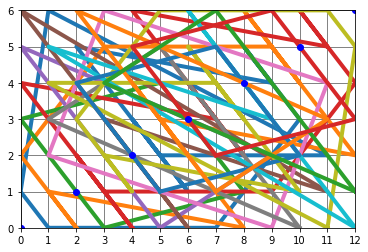

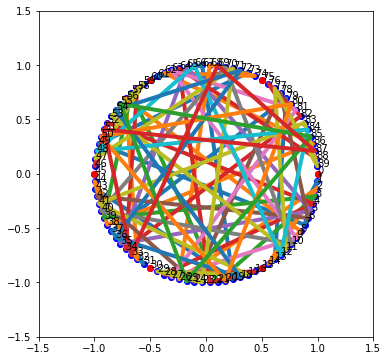

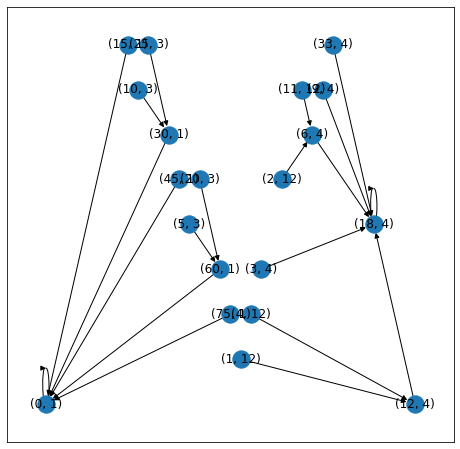

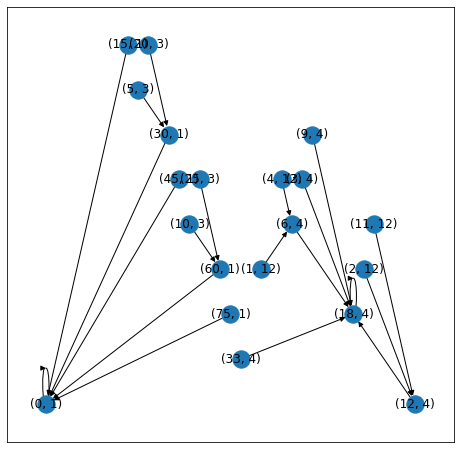


[(1,14),(2,7)],[(2,7),(1,14)]
[[0], [1, 7, 49, 52, 73, 26, 85, 13, 91, 55, 94, 76, 47, 38, 72, 19, 36, 58, 18, 29, 9, 63, 53, 80, 75, 40, 86, 20, 43, 10, 70, 5, 35, 51, 66, 74, 33, 37, 65, 67, 81, 82, 89, 41, 93, 69, 95, 83, 96, 90, 48, 45, 24, 71, 12, 84, 6, 42, 3, 21, 50, 59, 25, 78, 61, 39, 79, 68, 88, 34, 44, 17, 22, 57, 11, 77, 54, 87, 27, 92, 62, 46, 31, 23, 64, 60, 32, 30, 16, 15, 8, 56, 4, 28, 2, 14], [97]]

[(1,7),(2,14)],[(2,14),(1,7)]
[[0], [1, 14, 2, 28, 4, 56, 8, 15, 16, 30, 32, 60, 64, 23, 31, 46, 62, 92, 27, 87, 54, 77, 11, 57, 22, 17, 44, 34, 88, 68, 79, 39, 61, 78, 25, 59, 50, 21, 3, 42, 6, 84, 12, 71, 24, 45, 48, 90, 96, 83, 95, 69, 93, 41, 89, 82, 81, 67, 65, 37, 33, 74, 66, 51, 35, 5, 70, 10, 43, 20, 86, 40, 75, 80, 53, 63, 9, 29, 18, 58, 36, 19, 72, 38, 47, 76, 94, 55, 91, 13, 85, 26, 73, 52, 49, 7], [97]]


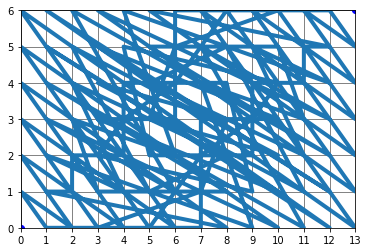

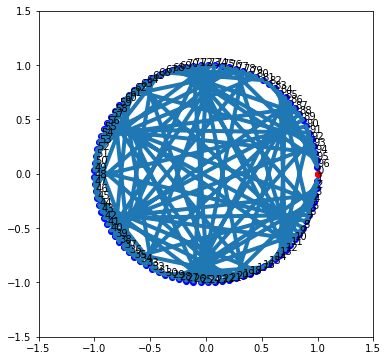

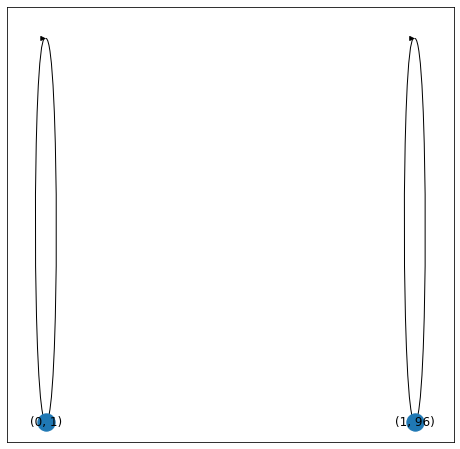

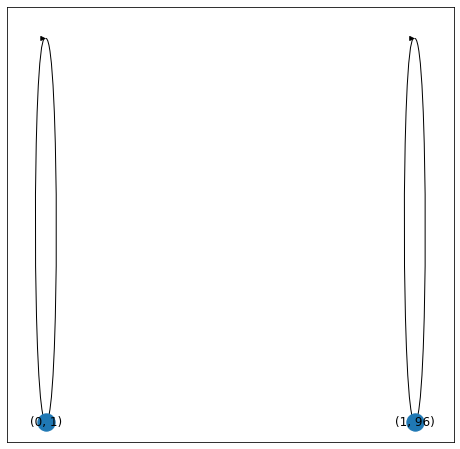


[(1,15),(2,7)],[(2,7),(1,15)]
[[0], [1, 7, 49, 31, 9, 63, 25, 71, 81, 47, 17, 15], [2, 14, 98, 62, 18, 22, 50, 38, 58, 94, 34, 30], [3, 21, 43, 93, 27, 85, 75, 5, 35, 37, 51, 45], [4, 28, 92, 20, 36, 44, 100, 76, 12, 84, 68, 60], [6, 42, 86, 82, 54, 66, 46, 10, 70, 74, 102, 90], [8, 56, 80, 40, 72, 88, 96, 48, 24, 64, 32, 16], [11, 77, 19, 29, 99, 69, 67, 53, 59, 101, 83, 61], [13, 91], [23, 57, 87, 89, 103, 97, 55, 73, 95, 41, 79, 33], [26, 78], [39, 65], [52], [104]]

[(1,7),(2,15)],[(2,15),(1,7)]
[[0], [1, 15, 17, 47, 81, 71, 25, 63, 9, 31, 49, 7], [2, 30, 34, 94, 58, 38, 50, 22, 18, 62, 98, 14], [3, 45, 51, 37, 35, 5, 75, 85, 27, 93, 43, 21], [4, 60, 68, 84, 12, 76, 100, 44, 36, 20, 92, 28], [6, 90, 102, 74, 70, 10, 46, 66, 54, 82, 86, 42], [8, 16, 32, 64, 24, 48, 96, 88, 72, 40, 80, 56], [11, 61, 83, 101, 59, 53, 67, 69, 99, 29, 19, 77], [13, 91], [23, 33, 79, 41, 95, 73, 55, 97, 103, 89, 87, 57], [26, 78], [39, 65], [52], [104]]


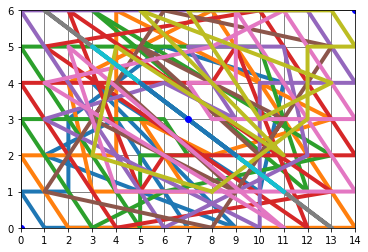

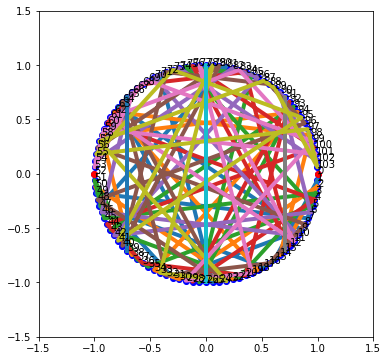

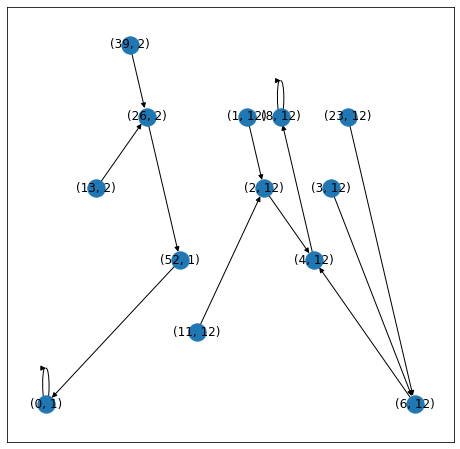

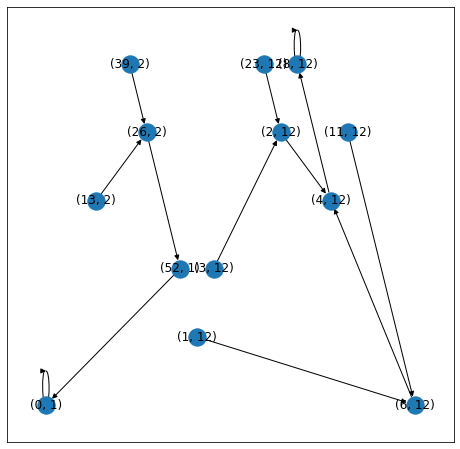


[(1,16),(2,7)],[(2,7),(1,16)]
[[0], [1, 7, 49, 10, 70, 46, 100, 34, 16], [2, 14, 98, 20, 29, 92, 89, 68, 32], [3, 21, 36, 30, 99, 27, 78, 102, 48], [4, 28, 85, 40, 58, 73, 67, 25, 64], [5, 35, 23, 50, 17, 8, 56, 59, 80], [6, 42, 72, 60, 87, 54, 45, 93, 96], [9, 63, 108, 90, 75, 81, 12, 84, 33], [11, 77, 95, 110, 104, 62, 101, 41, 65], [13, 91, 82, 19, 22, 43, 79, 109, 97], [15, 105, 69, 39, 51, 24, 57, 66, 18], [26, 71, 53, 38, 44, 86, 47, 107, 83], [31, 106, 76, 88, 61, 94, 103, 55, 52], [37], [74], [111]]

[(1,7),(2,16)],[(2,16),(1,7)]
[[0], [1, 16, 34, 100, 46, 70, 10, 49, 7], [2, 32, 68, 89, 92, 29, 20, 98, 14], [3, 48, 102, 78, 27, 99, 30, 36, 21], [4, 64, 25, 67, 73, 58, 40, 85, 28], [5, 80, 59, 56, 8, 17, 50, 23, 35], [6, 96, 93, 45, 54, 87, 60, 72, 42], [9, 33, 84, 12, 81, 75, 90, 108, 63], [11, 65, 41, 101, 62, 104, 110, 95, 77], [13, 97, 109, 79, 43, 22, 19, 82, 91], [15, 18, 66, 57, 24, 51, 39, 69, 105], [26, 83, 107, 47, 86, 44, 38, 53, 71], [31, 52, 55, 103, 94, 61, 88, 7

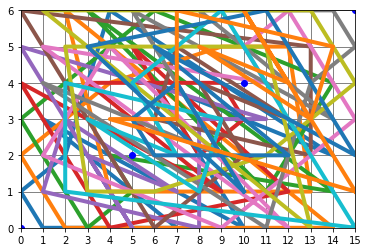

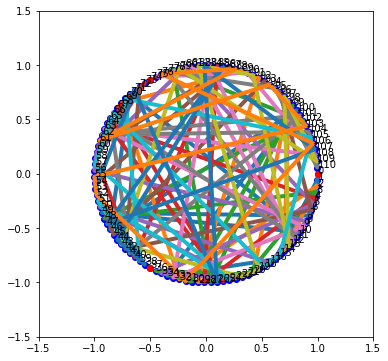

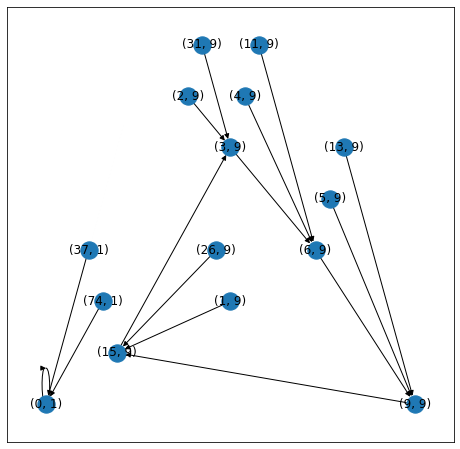

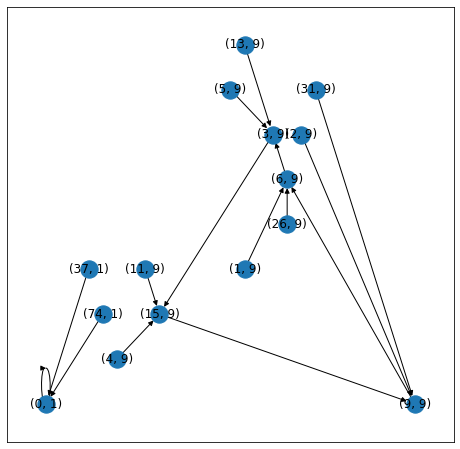


[(1,17),(2,7)],[(2,7),(1,17)]
[[0], [1, 7, 49, 107, 41, 51, 3, 21, 29, 85, 5, 35, 9, 63, 87, 19, 15, 105, 27, 71, 25, 57, 45, 79, 81, 95, 75, 53, 17], [2, 14, 98, 96, 82, 102, 6, 42, 58, 52, 10, 70, 18, 8, 56, 38, 30, 92, 54, 24, 50, 114, 90, 40, 44, 72, 32, 106, 34], [4, 28, 78, 74, 46, 86, 12, 84, 116, 104, 20, 22, 36, 16, 112, 76, 60, 66, 108, 48, 100, 110, 62, 80, 88, 26, 64, 94, 68], [11, 77, 67, 115, 97, 89, 33, 113, 83, 109, 55, 31, 99, 103, 13, 91, 47, 93, 61, 73, 39, 37, 23, 43, 65, 101, 117, 111, 69], [59], [118]]

[(1,7),(2,17)],[(2,17),(1,7)]
[[0], [1, 17, 53, 75, 95, 81, 79, 45, 57, 25, 71, 27, 105, 15, 19, 87, 63, 9, 35, 5, 85, 29, 21, 3, 51, 41, 107, 49, 7], [2, 34, 106, 32, 72, 44, 40, 90, 114, 50, 24, 54, 92, 30, 38, 56, 8, 18, 70, 10, 52, 58, 42, 6, 102, 82, 96, 98, 14], [4, 68, 94, 64, 26, 88, 80, 62, 110, 100, 48, 108, 66, 60, 76, 112, 16, 36, 22, 20, 104, 116, 84, 12, 86, 46, 74, 78, 28], [11, 69, 111, 117, 101, 65, 43, 23, 37, 39, 73, 61, 93, 47, 91, 13, 103, 99,

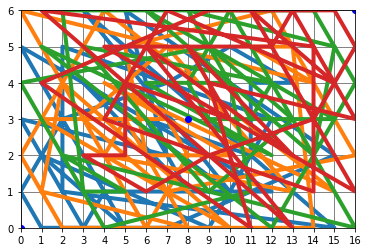

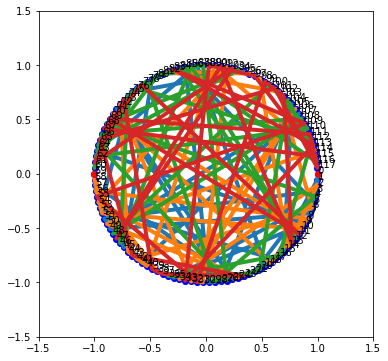

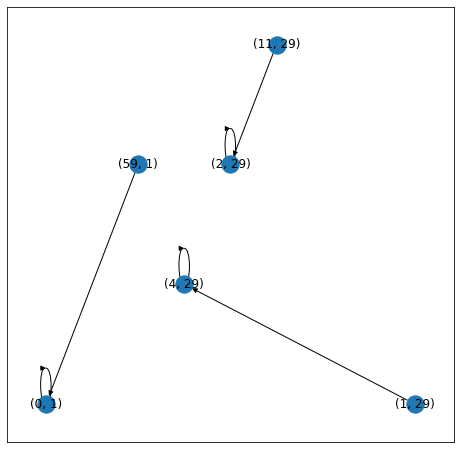

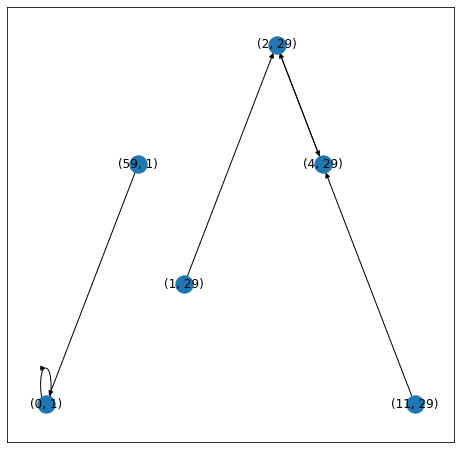


[(1,18),(2,7)],[(2,7),(1,18)]
[[0], [1, 7, 49, 93, 26, 57, 24, 43, 51, 107, 124, 118, 76, 32, 99, 68, 101, 82, 74, 18], [2, 14, 98, 61, 52, 114, 48, 86, 102, 89, 123, 111, 27, 64, 73, 11, 77, 39, 23, 36], [3, 21, 22, 29, 78, 46, 72, 4, 28, 71, 122, 104, 103, 96, 47, 79, 53, 121, 97, 54], [5, 35, 120, 90], [6, 42, 44, 58, 31, 92, 19, 8, 56, 17, 119, 83, 81, 67, 94, 33, 106, 117, 69, 108], [9, 63, 66, 87, 109, 13, 91, 12, 84, 88, 116, 62, 59, 38, 16, 112, 34, 113, 41, 37], [10, 70, 115, 55], [15, 105, 110, 20], [25, 50, 100, 75], [30, 85, 95, 40], [45, 65, 80, 60], [125]]

[(1,7),(2,18)],[(2,18),(1,7)]
[[0], [1, 18, 74, 82, 101, 68, 99, 32, 76, 118, 124, 107, 51, 43, 24, 57, 26, 93, 49, 7], [2, 36, 23, 39, 77, 11, 73, 64, 27, 111, 123, 89, 102, 86, 48, 114, 52, 61, 98, 14], [3, 54, 97, 121, 53, 79, 47, 96, 103, 104, 122, 71, 28, 4, 72, 46, 78, 29, 22, 21], [5, 90, 120, 35], [6, 108, 69, 117, 106, 33, 94, 67, 81, 83, 119, 17, 56, 8, 19, 92, 31, 58, 44, 42], [9, 37, 41, 113, 34, 112, 16, 

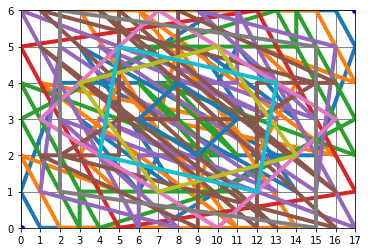

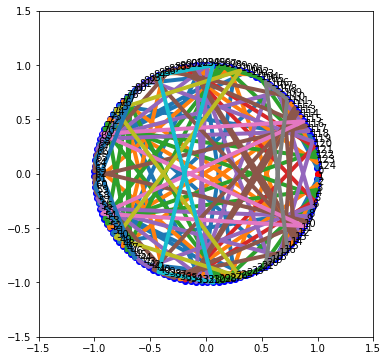

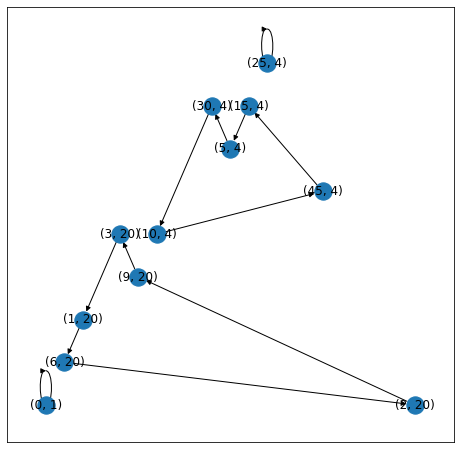

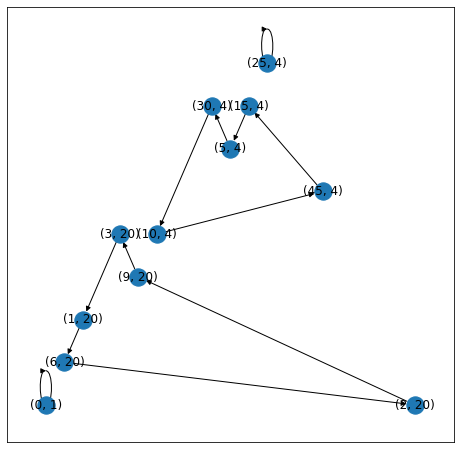


[(1,19),(2,7)],[(2,7),(1,19)]
[[0], [1, 7, 49, 79, 25, 43, 37, 127, 97, 19], [2, 14, 98, 26, 50, 86, 74, 122, 62, 38], [3, 21, 15, 105, 75, 129, 111, 117, 27, 57], [4, 28, 64, 52, 100, 40, 16, 112, 124, 76], [5, 35, 113, 131, 125, 83, 53, 107, 89, 95], [6, 42, 30, 78, 18, 126, 90, 102, 54, 114], [8, 56, 128, 104, 68, 80, 32, 92, 116, 20], [9, 63, 45, 51, 93, 123, 69, 87, 81, 39], [10, 70, 94, 130, 118, 34, 106, 82, 46, 58], [11, 77], [12, 84, 60, 24, 36, 120, 48, 72, 108, 96], [13, 91, 109, 103, 61, 31, 85, 67, 73, 115], [17, 119, 41, 23, 29, 71, 101, 47, 65, 59], [22], [33, 99], [44], [55, 121], [66], [88], [110], [132]]

[(1,7),(2,19)],[(2,19),(1,7)]
[[0], [1, 19, 97, 127, 37, 43, 25, 79, 49, 7], [2, 38, 62, 122, 74, 86, 50, 26, 98, 14], [3, 57, 27, 117, 111, 129, 75, 105, 15, 21], [4, 76, 124, 112, 16, 40, 100, 52, 64, 28], [5, 95, 89, 107, 53, 83, 125, 131, 113, 35], [6, 114, 54, 102, 90, 126, 18, 78, 30, 42], [8, 20, 116, 92, 32, 80, 68, 104, 128, 56], [9, 39, 81, 87, 69, 123, 93

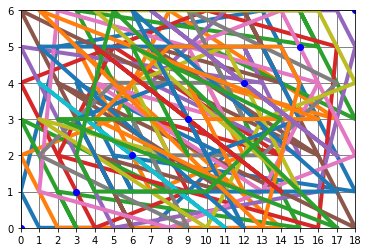

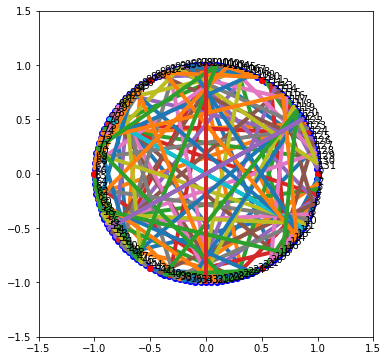

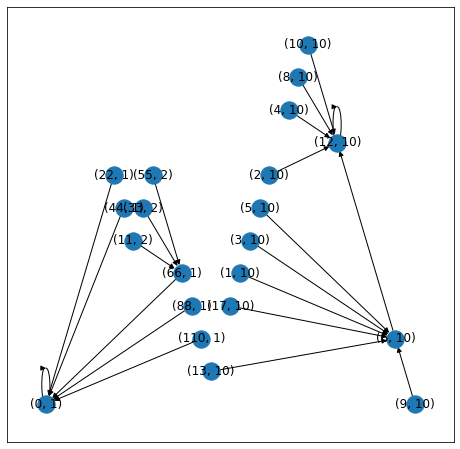

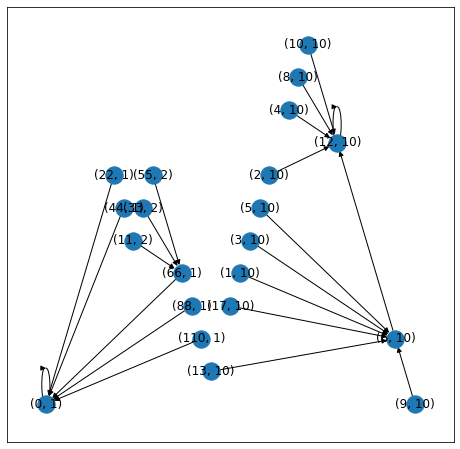

In [42]:
a=7
for b in range(2,20):
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,b,b,a))
    print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    print("")
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(b,a,a,b))
    print(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
    DirectedGraphWLen(list(Orbits([(1,b),(2,a)],[(2,a),(1,b)])))
    DirectedGraphWLen(list(Orbits([(2,a),(1,b)],[(1,b),(2,a)])))
    print("")

[(1,8),(2,3)],[(2,3),(1,8)]
[[0], [1, 3, 9, 4, 12, 13, 16, 2, 6, 18, 8], [5, 15, 22, 20, 14, 19, 11, 10, 7, 21, 17], [23]]


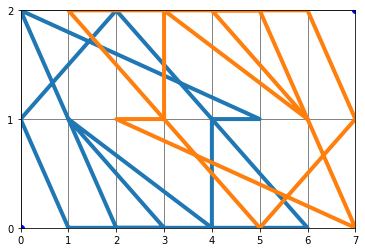

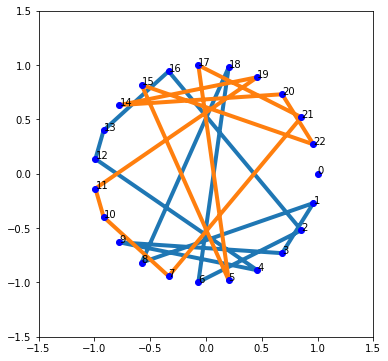


[(2,3),(1,8)],[(1,8),(2,3)]
[[0], [1, 8, 18, 6, 2, 16, 13, 12, 4, 9, 3], [5, 17, 21, 7, 10, 11, 19, 14, 20, 22, 15], [23]]


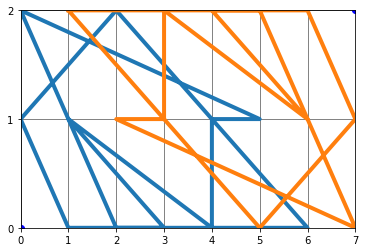

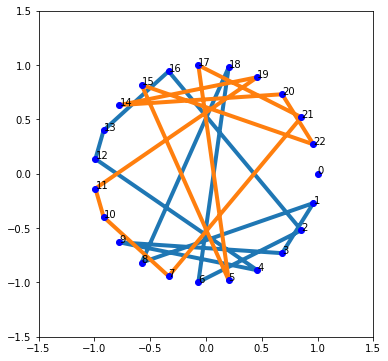

In [5]:
b=3
for a in range(8,9):
    print("[(1,{}),(2,3)],[(2,3),(1,{})]".format(a,a))
    print(list(Orbits([(1,a),(2,b)],[(2,b),(1,a)])))
    OrbitPictures([(1,a),(2,b)],[(2,b),(1,a)])
    RingPictures([(1,a),(2,b)],[(2,b),(1,a)])
    print("")
    print("[(2,3),(1,{})],[(1,{}),(2,3)]".format(a,a))
    print(list(Orbits([(2,b),(1,a)],[(1,a),(2,b)])))
    OrbitPictures([(2,b),(1,a)],[(1,a),(2,b)])
    RingPictures([(2,b),(1,a)],[(1,a),(2,b)])

[(1,2),(2,2)],[(2,2),(1,2)]
[[0], [1, 2], [3]]


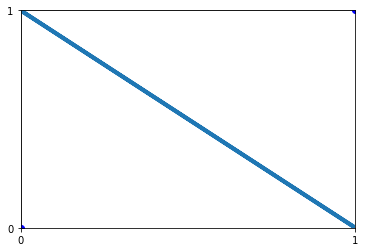

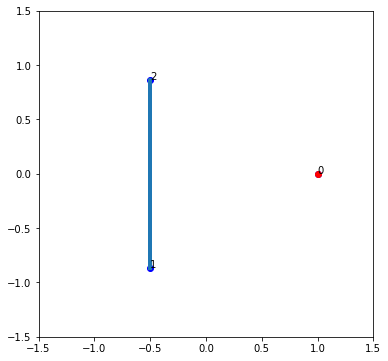


[(1,3),(2,3)],[(2,3),(1,3)]
[[0], [1, 3], [2, 6], [4], [5, 7], [8]]


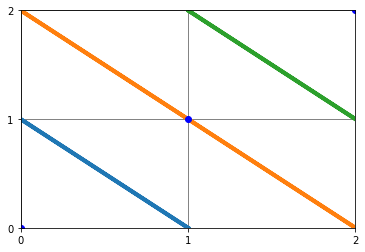

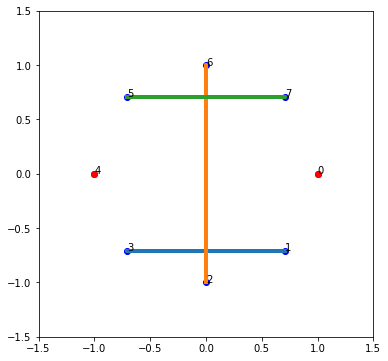


[(1,4),(2,4)],[(2,4),(1,4)]
[[0], [1, 4], [2, 8], [3, 12], [5], [6, 9], [7, 13], [10], [11, 14], [15]]


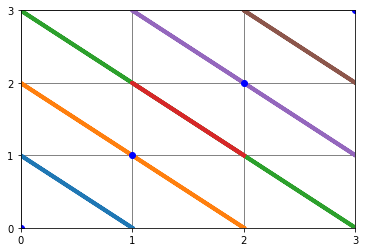

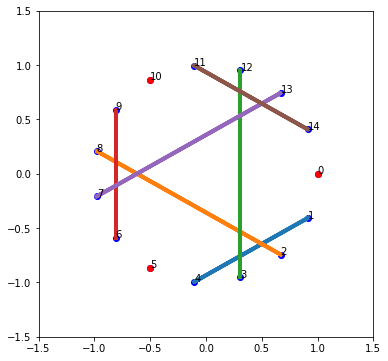


[(1,5),(2,5)],[(2,5),(1,5)]
[[0], [1, 5], [2, 10], [3, 15], [4, 20], [6], [7, 11], [8, 16], [9, 21], [12], [13, 17], [14, 22], [18], [19, 23], [24]]


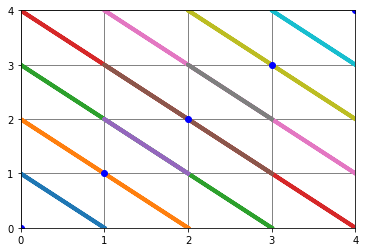

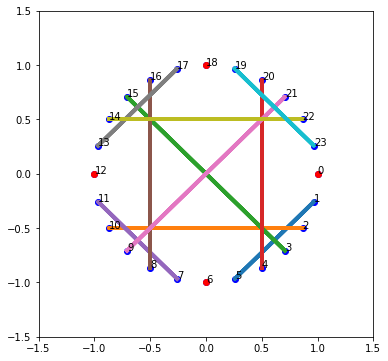


[(1,6),(2,6)],[(2,6),(1,6)]
[[0], [1, 6], [2, 12], [3, 18], [4, 24], [5, 30], [7], [8, 13], [9, 19], [10, 25], [11, 31], [14], [15, 20], [16, 26], [17, 32], [21], [22, 27], [23, 33], [28], [29, 34], [35]]


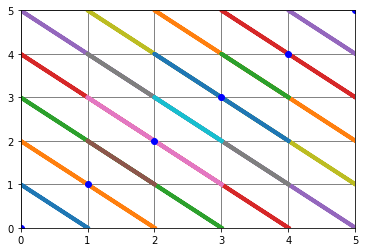

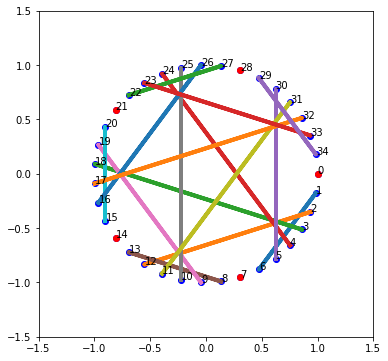


[(1,7),(2,7)],[(2,7),(1,7)]
[[0], [1, 7], [2, 14], [3, 21], [4, 28], [5, 35], [6, 42], [8], [9, 15], [10, 22], [11, 29], [12, 36], [13, 43], [16], [17, 23], [18, 30], [19, 37], [20, 44], [24], [25, 31], [26, 38], [27, 45], [32], [33, 39], [34, 46], [40], [41, 47], [48]]


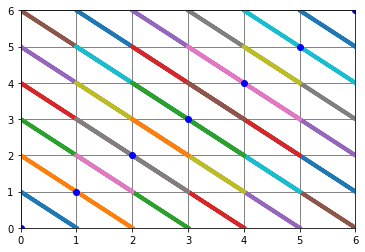

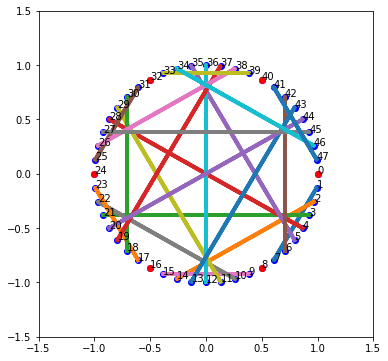


[(1,8),(2,8)],[(2,8),(1,8)]
[[0], [1, 8], [2, 16], [3, 24], [4, 32], [5, 40], [6, 48], [7, 56], [9], [10, 17], [11, 25], [12, 33], [13, 41], [14, 49], [15, 57], [18], [19, 26], [20, 34], [21, 42], [22, 50], [23, 58], [27], [28, 35], [29, 43], [30, 51], [31, 59], [36], [37, 44], [38, 52], [39, 60], [45], [46, 53], [47, 61], [54], [55, 62], [63]]


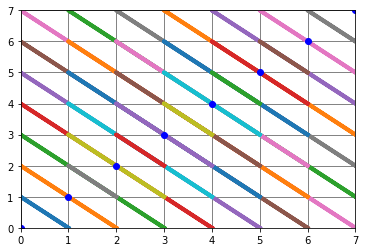

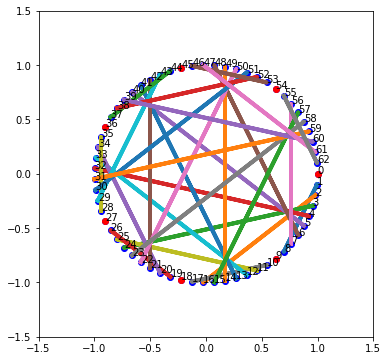


[(1,9),(2,9)],[(2,9),(1,9)]
[[0], [1, 9], [2, 18], [3, 27], [4, 36], [5, 45], [6, 54], [7, 63], [8, 72], [10], [11, 19], [12, 28], [13, 37], [14, 46], [15, 55], [16, 64], [17, 73], [20], [21, 29], [22, 38], [23, 47], [24, 56], [25, 65], [26, 74], [30], [31, 39], [32, 48], [33, 57], [34, 66], [35, 75], [40], [41, 49], [42, 58], [43, 67], [44, 76], [50], [51, 59], [52, 68], [53, 77], [60], [61, 69], [62, 78], [70], [71, 79], [80]]


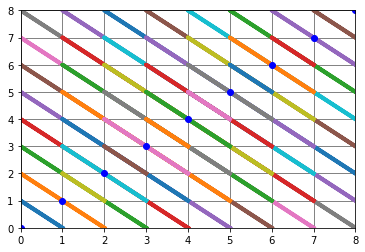

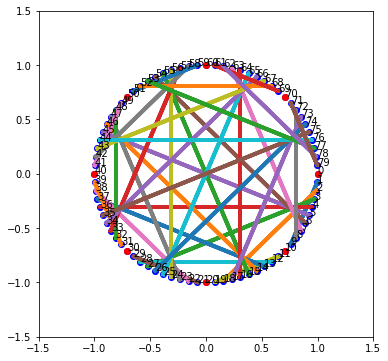


[(1,10),(2,10)],[(2,10),(1,10)]
[[0], [1, 10], [2, 20], [3, 30], [4, 40], [5, 50], [6, 60], [7, 70], [8, 80], [9, 90], [11], [12, 21], [13, 31], [14, 41], [15, 51], [16, 61], [17, 71], [18, 81], [19, 91], [22], [23, 32], [24, 42], [25, 52], [26, 62], [27, 72], [28, 82], [29, 92], [33], [34, 43], [35, 53], [36, 63], [37, 73], [38, 83], [39, 93], [44], [45, 54], [46, 64], [47, 74], [48, 84], [49, 94], [55], [56, 65], [57, 75], [58, 85], [59, 95], [66], [67, 76], [68, 86], [69, 96], [77], [78, 87], [79, 97], [88], [89, 98], [99]]


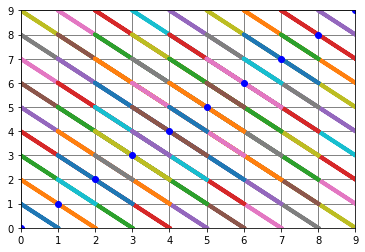

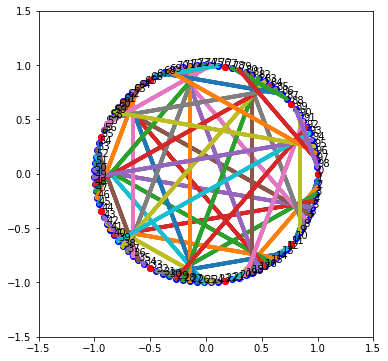


[(1,11),(2,11)],[(2,11),(1,11)]
[[0], [1, 11], [2, 22], [3, 33], [4, 44], [5, 55], [6, 66], [7, 77], [8, 88], [9, 99], [10, 110], [12], [13, 23], [14, 34], [15, 45], [16, 56], [17, 67], [18, 78], [19, 89], [20, 100], [21, 111], [24], [25, 35], [26, 46], [27, 57], [28, 68], [29, 79], [30, 90], [31, 101], [32, 112], [36], [37, 47], [38, 58], [39, 69], [40, 80], [41, 91], [42, 102], [43, 113], [48], [49, 59], [50, 70], [51, 81], [52, 92], [53, 103], [54, 114], [60], [61, 71], [62, 82], [63, 93], [64, 104], [65, 115], [72], [73, 83], [74, 94], [75, 105], [76, 116], [84], [85, 95], [86, 106], [87, 117], [96], [97, 107], [98, 118], [108], [109, 119], [120]]


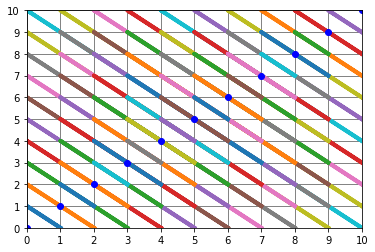

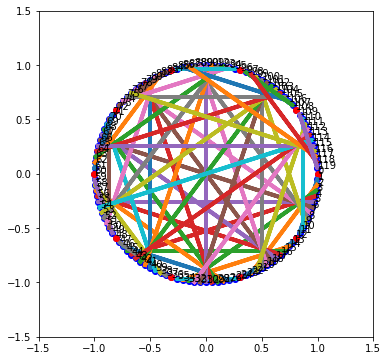

In [7]:
for a in range(2,12):
    print("[(1,{}),(2,{})],[(2,{}),(1,{})]".format(a,a,a,a))
    

    print(list(Orbits([(1,a),(2,a)],[(2,a),(1,a)])))
    OrbitPictures([(1,a),(2,a)],[(2,a),(1,a)])
    RingPictures([(1,a),(2,a)],[(2,a),(1,a)])
    
    #DirectedGraph(list(Orbits([(1,a),(2,a)],[(2,a),(1,a)])))
    print("")

[(1,2),(2,2),(1,2)],[(2,2),(1,4)]
[[0], [1, 2], [3], [4], [5, 6], [7]]


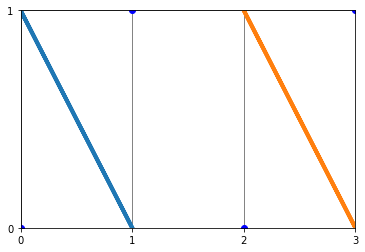

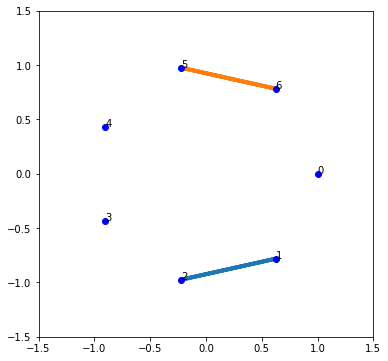

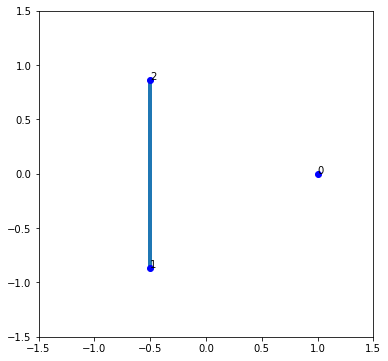


[(1,4),(2,2),(1,2)],[(2,2),(1,8)]
[[0], [1, 2, 4], [3, 6, 5], [7], [8], [9, 10, 12], [11, 14, 13], [15]]


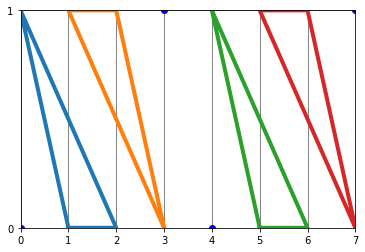

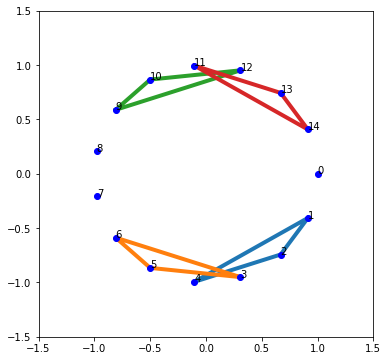

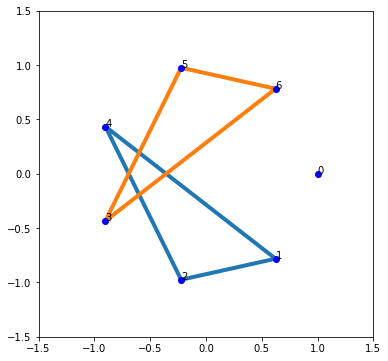


[(1,8),(2,2),(1,2)],[(2,2),(1,16)]
[[0], [1, 2, 4, 8], [3, 6, 12, 9], [5, 10], [7, 14, 13, 11], [15], [16], [17, 18, 20, 24], [19, 22, 28, 25], [21, 26], [23, 30, 29, 27], [31]]


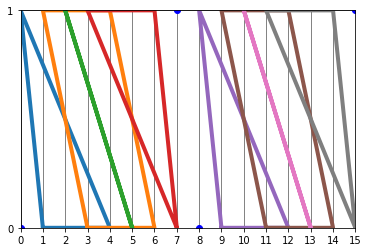

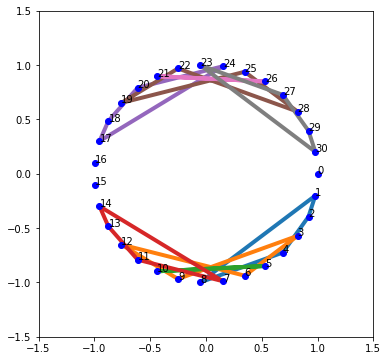

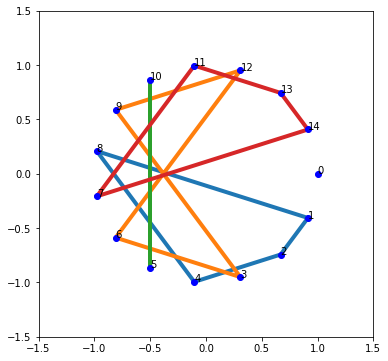


[(1,16),(2,2),(1,2)],[(2,2),(1,32)]
[[0], [1, 2, 4, 8, 16], [3, 6, 12, 24, 17], [5, 10, 20, 9, 18], [7, 14, 28, 25, 19], [11, 22, 13, 26, 21], [15, 30, 29, 27, 23], [31], [32], [33, 34, 36, 40, 48], [35, 38, 44, 56, 49], [37, 42, 52, 41, 50], [39, 46, 60, 57, 51], [43, 54, 45, 58, 53], [47, 62, 61, 59, 55], [63]]


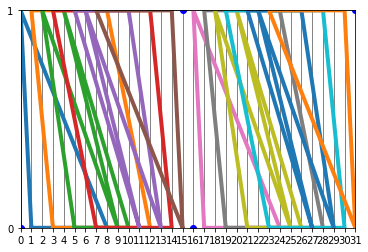

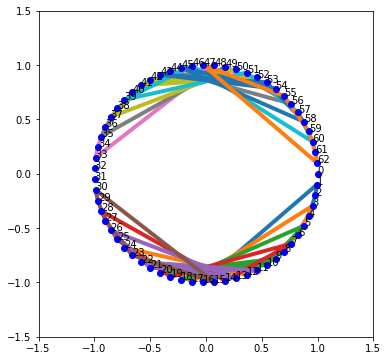

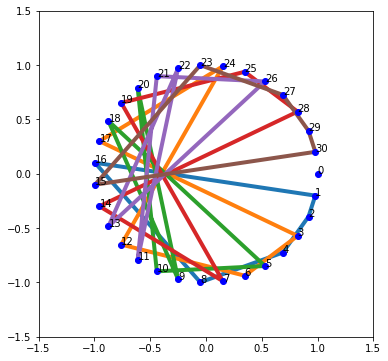


[(1,32),(2,2),(1,2)],[(2,2),(1,64)]
[[0], [1, 2, 4, 8, 16, 32], [3, 6, 12, 24, 48, 33], [5, 10, 20, 40, 17, 34], [7, 14, 28, 56, 49, 35], [9, 18, 36], [11, 22, 44, 25, 50, 37], [13, 26, 52, 41, 19, 38], [15, 30, 60, 57, 51, 39], [21, 42], [23, 46, 29, 58, 53, 43], [27, 54, 45], [31, 62, 61, 59, 55, 47], [63], [64], [65, 66, 68, 72, 80, 96], [67, 70, 76, 88, 112, 97], [69, 74, 84, 104, 81, 98], [71, 78, 92, 120, 113, 99], [73, 82, 100], [75, 86, 108, 89, 114, 101], [77, 90, 116, 105, 83, 102], [79, 94, 124, 121, 115, 103], [85, 106], [87, 110, 93, 122, 117, 107], [91, 118, 109], [95, 126, 125, 123, 119, 111], [127]]


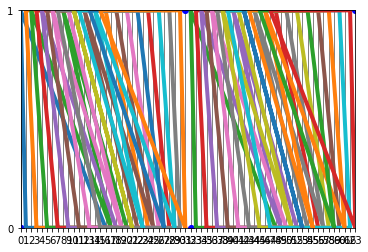

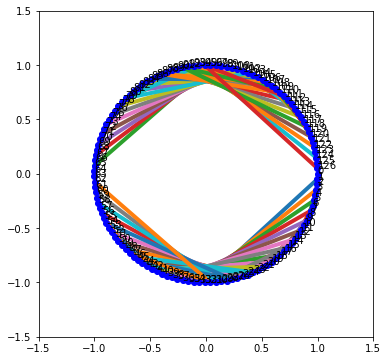

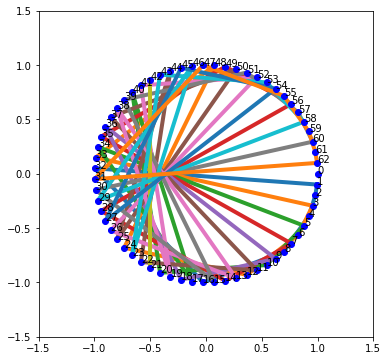


[(1,64),(2,2),(1,2)],[(2,2),(1,128)]
[[0], [1, 2, 4, 8, 16, 32, 64], [3, 6, 12, 24, 48, 96, 65], [5, 10, 20, 40, 80, 33, 66], [7, 14, 28, 56, 112, 97, 67], [9, 18, 36, 72, 17, 34, 68], [11, 22, 44, 88, 49, 98, 69], [13, 26, 52, 104, 81, 35, 70], [15, 30, 60, 120, 113, 99, 71], [19, 38, 76, 25, 50, 100, 73], [21, 42, 84, 41, 82, 37, 74], [23, 46, 92, 57, 114, 101, 75], [27, 54, 108, 89, 51, 102, 77], [29, 58, 116, 105, 83, 39, 78], [31, 62, 124, 121, 115, 103, 79], [43, 86, 45, 90, 53, 106, 85], [47, 94, 61, 122, 117, 107, 87], [55, 110, 93, 59, 118, 109, 91], [63, 126, 125, 123, 119, 111, 95], [127], [128], [129, 130, 132, 136, 144, 160, 192], [131, 134, 140, 152, 176, 224, 193], [133, 138, 148, 168, 208, 161, 194], [135, 142, 156, 184, 240, 225, 195], [137, 146, 164, 200, 145, 162, 196], [139, 150, 172, 216, 177, 226, 197], [141, 154, 180, 232, 209, 163, 198], [143, 158, 188, 248, 241, 227, 199], [147, 166, 204, 153, 178, 228, 201], [149, 170, 212, 169, 210, 165, 202], [151, 174, 220

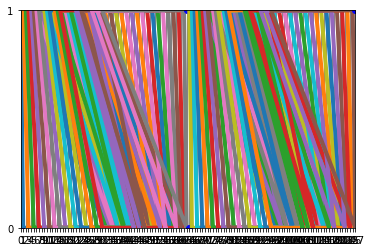

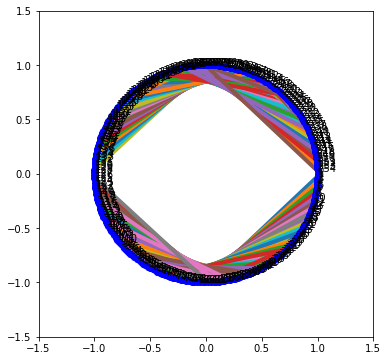

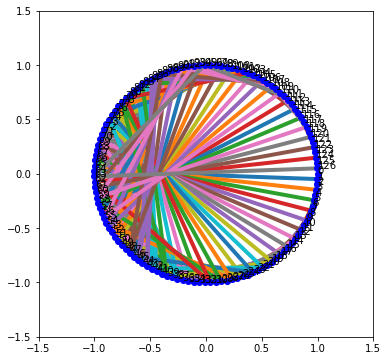

In [7]:
b=2
for a in range(2,8):
    print("[(1,{}),(2,2),(1,2)],[(2,2),(1,{})]".format(2**(a-1),2**a))
    print(list(Orbits([(1,2**(a-1)),(2,b),(1,2)],[(2,b),(1,2**a)])))
    OrbitPictures([(1,2**(a-1)),(2,b),(1,2)],[(2,b),(1,2**a)])
    RingPictures([(1,2**(a-1)),(2,b),(1,2)],[(2,b),(1,2**a)])
    RingPictures([(1,2**(a-1)),(2,b)],[(2,b),(1,2**(a-1))])
    print("")

[(1,2),(2,2),(1,2)],[(2,2),(1,4)]
[[0], [1, 2], [3], [4], [5, 6], [7]]


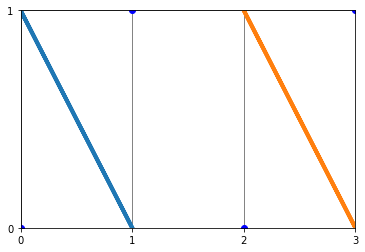

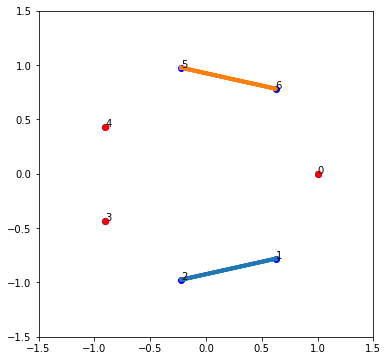

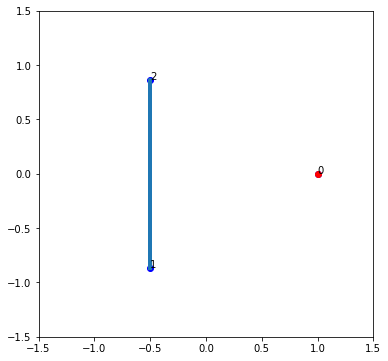


[(1,2),(2,2),(1,4)],[(2,2),(1,8)]
[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11], [12], [13, 14], [15]]


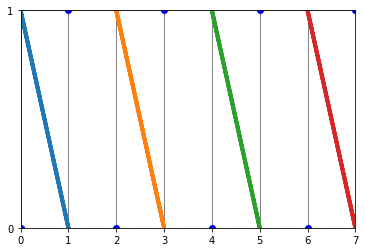

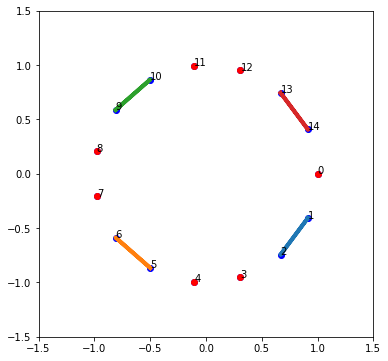

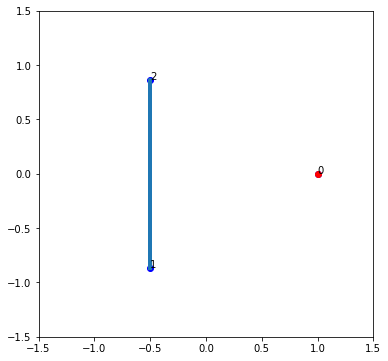


[(1,2),(2,2),(1,8)],[(2,2),(1,16)]
[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11], [12], [13, 14], [15], [16], [17, 18], [19], [20], [21, 22], [23], [24], [25, 26], [27], [28], [29, 30], [31]]


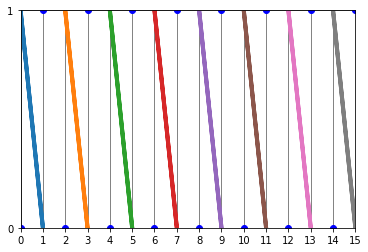

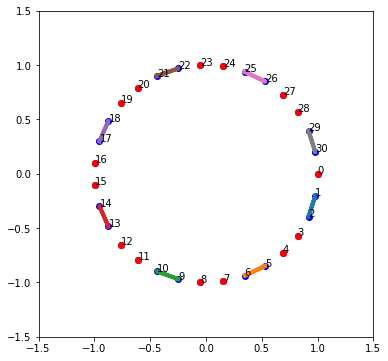

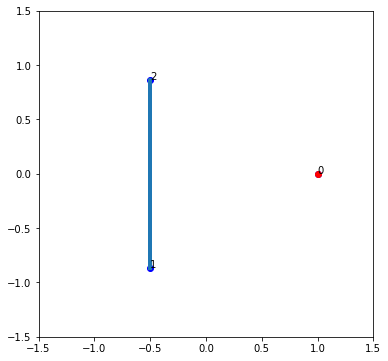


[(1,2),(2,2),(1,16)],[(2,2),(1,32)]
[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11], [12], [13, 14], [15], [16], [17, 18], [19], [20], [21, 22], [23], [24], [25, 26], [27], [28], [29, 30], [31], [32], [33, 34], [35], [36], [37, 38], [39], [40], [41, 42], [43], [44], [45, 46], [47], [48], [49, 50], [51], [52], [53, 54], [55], [56], [57, 58], [59], [60], [61, 62], [63]]


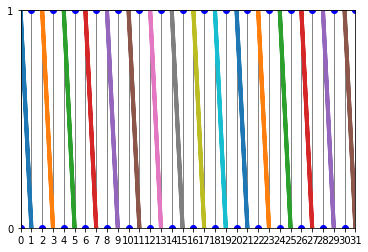

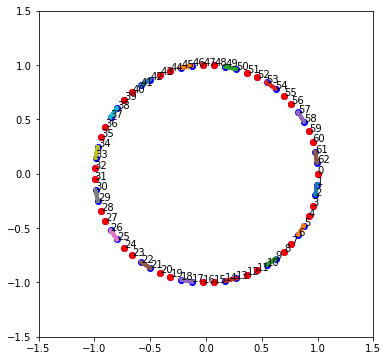

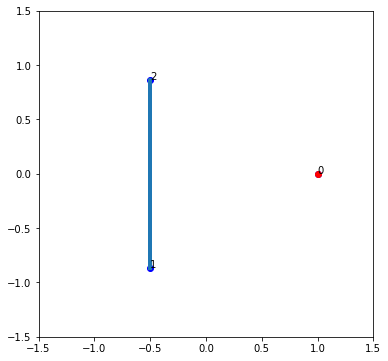


[(1,2),(2,2),(1,32)],[(2,2),(1,64)]
[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11], [12], [13, 14], [15], [16], [17, 18], [19], [20], [21, 22], [23], [24], [25, 26], [27], [28], [29, 30], [31], [32], [33, 34], [35], [36], [37, 38], [39], [40], [41, 42], [43], [44], [45, 46], [47], [48], [49, 50], [51], [52], [53, 54], [55], [56], [57, 58], [59], [60], [61, 62], [63], [64], [65, 66], [67], [68], [69, 70], [71], [72], [73, 74], [75], [76], [77, 78], [79], [80], [81, 82], [83], [84], [85, 86], [87], [88], [89, 90], [91], [92], [93, 94], [95], [96], [97, 98], [99], [100], [101, 102], [103], [104], [105, 106], [107], [108], [109, 110], [111], [112], [113, 114], [115], [116], [117, 118], [119], [120], [121, 122], [123], [124], [125, 126], [127]]


KeyboardInterrupt: 

In [31]:
b=2
for a in range(2,8):
    print("[(1,2),(2,2),(1,{})],[(2,2),(1,{})]".format(2**(a-1),2**a))
    print(list(Orbits([(1,2),(2,b),(1,2**(a-1))],[(2,b),(1,2**a)])))
    OrbitPictures([(1,2),(2,b),(1,2**(a-1))],[(2,b),(1,2**a)])
    RingPictures([(1,2),(2,b),(1,2**(a-1))],[(2,b),(1,2**a)])
    RingPictures([(1,2),(2,b)],[(2,b),(1,2)])
    print("")

In [3]:
from sympy import reduced_totient

def A002322(n):
    return reduced_totient(n)

In [56]:
collection=[i for i in range(4,10000)]
count=0
for p in collection:
    if len(prime_factors(p))==2:
        p1=prime_factors(p)[0]
        p2=prime_factors(p)[1]
        lengths=1
        current=p2
        while current!=1:
            current=current*p2%(p1*p2-1)
            lengths+=1
        if lengths!=A002322(p-1):
            mul=int(A002322(p-1)/lengths)
            print("{}: {}x{}".format(p,p1,p2),"\t","len: {}, CM: {}".format(lengths,A002322(p-1)),"\t mult:{}".format(mul))
            count+=1


49: 7x7 	 len: 2, CM: 4 	 mult:2
74: 2x37 	 len: 9, CM: 72 	 mult:8
77: 7x11 	 len: 6, CM: 18 	 mult:3
86: 2x43 	 len: 8, CM: 16 	 mult:2
94: 2x47 	 len: 10, CM: 30 	 mult:3
119: 7x17 	 len: 29, CM: 58 	 mult:2
121: 11x11 	 len: 2, CM: 4 	 mult:2
123: 3x41 	 len: 10, CM: 60 	 mult:6
158: 2x79 	 len: 52, CM: 156 	 mult:3
161: 7x23 	 len: 4, CM: 8 	 mult:2
169: 13x13 	 len: 2, CM: 6 	 mult:3
183: 3x61 	 len: 6, CM: 12 	 mult:2
194: 2x97 	 len: 96, CM: 192 	 mult:2
206: 2x103 	 len: 20, CM: 40 	 mult:2
218: 2x109 	 len: 15, CM: 30 	 mult:2
219: 3x73 	 len: 27, CM: 108 	 mult:4
259: 7x37 	 len: 6, CM: 42 	 mult:7
278: 2x139 	 len: 92, CM: 276 	 mult:3
289: 17x17 	 len: 2, CM: 24 	 mult:12
301: 7x43 	 len: 4, CM: 20 	 mult:5
303: 3x101 	 len: 50, CM: 150 	 mult:3
314: 2x157 	 len: 156, CM: 312 	 mult:2
319: 11x29 	 len: 26, CM: 52 	 mult:2
339: 3x113 	 len: 39, CM: 156 	 mult:4
358: 2x179 	 len: 24, CM: 48 	 mult:2
361: 19x19 	 len: 2, CM: 12 	 mult:6
382: 2x191 	 len: 14, CM: 126 	 mult:9


2098: 2x1049 	 len: 174, CM: 696 	 mult:4
2101: 11x191 	 len: 30, CM: 60 	 mult:2
2103: 3x701 	 len: 210, CM: 1050 	 mult:5
2117: 29x73 	 len: 253, CM: 506 	 mult:2
2123: 11x193 	 len: 530, CM: 1060 	 mult:2
2126: 2x1063 	 len: 200, CM: 400 	 mult:2
2138: 2x1069 	 len: 1068, CM: 2136 	 mult:2
2159: 17x127 	 len: 246, CM: 492 	 mult:2
2165: 5x433 	 len: 135, CM: 540 	 mult:4
2167: 11x197 	 len: 114, CM: 342 	 mult:3
2174: 2x1087 	 len: 260, CM: 520 	 mult:2
2177: 7x311 	 len: 16, CM: 32 	 mult:2
2182: 2x1091 	 len: 242, CM: 726 	 mult:3
2189: 11x199 	 len: 78, CM: 546 	 mult:7
2191: 7x313 	 len: 24, CM: 72 	 mult:3
2194: 2x1097 	 len: 56, CM: 336 	 mult:6
2199: 3x733 	 len: 78, CM: 156 	 mult:2
2201: 31x71 	 len: 10, CM: 20 	 mult:2
2209: 47x47 	 len: 2, CM: 88 	 mult:44
2215: 5x443 	 len: 180, CM: 360 	 mult:2
2217: 3x739 	 len: 138, CM: 276 	 mult:2
2218: 2x1109 	 len: 246, CM: 738 	 mult:3
2227: 17x131 	 len: 78, CM: 156 	 mult:2
2246: 2x1123 	 len: 224, CM: 448 	 mult:2
2263: 31x73 

3901: 47x83 	 len: 20, CM: 60 	 mult:3
3935: 5x787 	 len: 420, CM: 840 	 mult:2
3937: 31x127 	 len: 10, CM: 40 	 mult:4
3961: 17x233 	 len: 20, CM: 60 	 mult:3
3974: 2x1987 	 len: 476, CM: 952 	 mult:2
3977: 41x97 	 len: 14, CM: 210 	 mult:15
3983: 7x569 	 len: 60, CM: 180 	 mult:3
3997: 7x571 	 len: 18, CM: 36 	 mult:2
3998: 2x1999 	 len: 114, CM: 570 	 mult:5
4006: 2x2003 	 len: 132, CM: 264 	 mult:2
4031: 29x139 	 len: 30, CM: 60 	 mult:2
4034: 2x2017 	 len: 36, CM: 108 	 mult:3
4039: 7x577 	 len: 112, CM: 672 	 mult:6
4045: 5x809 	 len: 112, CM: 336 	 mult:3
4054: 2x2027 	 len: 96, CM: 192 	 mult:2
4058: 2x2029 	 len: 169, CM: 4056 	 mult:24
4069: 13x313 	 len: 168, CM: 336 	 mult:2
4078: 2x2039 	 len: 90, CM: 450 	 mult:5
4083: 3x1361 	 len: 78, CM: 156 	 mult:2
4097: 17x241 	 len: 256, CM: 1024 	 mult:4
4121: 13x317 	 len: 68, CM: 204 	 mult:3
4135: 5x827 	 len: 52, CM: 156 	 mult:3
4141: 41x101 	 len: 66, CM: 132 	 mult:2
4143: 3x1381 	 len: 54, CM: 108 	 mult:2
4151: 7x593 	 le

5789: 7x827 	 len: 482, CM: 1446 	 mult:3
5799: 3x1933 	 len: 222, CM: 444 	 mult:2
5833: 19x307 	 len: 162, CM: 486 	 mult:3
5837: 13x449 	 len: 729, CM: 1458 	 mult:2
5847: 3x1949 	 len: 234, CM: 468 	 mult:2
5873: 7x839 	 len: 122, CM: 732 	 mult:6
5905: 5x1181 	 len: 60, CM: 120 	 mult:2
5906: 2x2953 	 len: 236, CM: 1180 	 mult:5
5909: 19x311 	 len: 30, CM: 210 	 mult:7
5914: 2x2957 	 len: 54, CM: 216 	 mult:4
5921: 31x191 	 len: 4, CM: 72 	 mult:18
5933: 17x349 	 len: 741, CM: 1482 	 mult:2
5942: 2x2971 	 len: 228, CM: 456 	 mult:2
5947: 19x313 	 len: 495, CM: 990 	 mult:2
5963: 67x89 	 len: 135, CM: 270 	 mult:2
5965: 5x1193 	 len: 30, CM: 210 	 mult:7
5979: 3x1993 	 len: 210, CM: 420 	 mult:2
5983: 31x193 	 len: 166, CM: 996 	 mult:6
5993: 13x461 	 len: 106, CM: 318 	 mult:3
5998: 2x2999 	 len: 666, CM: 1998 	 mult:3
5999: 7x857 	 len: 1499, CM: 2998 	 mult:2
6002: 2x3001 	 len: 88, CM: 352 	 mult:4
6005: 5x1201 	 len: 117, CM: 234 	 mult:2
6019: 13x463 	 len: 116, CM: 464 	 mul

7421: 41x181 	 len: 52, CM: 156 	 mult:3
7423: 13x571 	 len: 412, CM: 1236 	 mult:3
7445: 5x1489 	 len: 31, CM: 1860 	 mult:60
7454: 2x3727 	 len: 112, CM: 1792 	 mult:16
7471: 31x241 	 len: 123, CM: 492 	 mult:4
7483: 7x1069 	 len: 42, CM: 84 	 mult:2
7495: 5x1499 	 len: 624, CM: 1248 	 mult:2
7509: 3x2503 	 len: 268, CM: 1876 	 mult:7
7513: 11x683 	 len: 78, CM: 312 	 mult:4
7522: 2x3761 	 len: 396, CM: 1188 	 mult:3
7538: 2x3769 	 len: 1256, CM: 7536 	 mult:6
7543: 19x397 	 len: 418, CM: 1254 	 mult:3
7558: 2x3779 	 len: 380, CM: 1140 	 mult:3
7571: 67x113 	 len: 108, CM: 756 	 mult:7
7586: 2x3793 	 len: 180, CM: 360 	 mult:2
7593: 3x2531 	 len: 12, CM: 72 	 mult:6
7597: 71x107 	 len: 10, CM: 210 	 mult:21
7601: 11x691 	 len: 60, CM: 180 	 mult:3
7609: 7x1087 	 len: 158, CM: 316 	 mult:2
7613: 23x331 	 len: 86, CM: 860 	 mult:10
7627: 29x263 	 len: 40, CM: 120 	 mult:3
7633: 17x449 	 len: 26, CM: 156 	 mult:6
7651: 7x1093 	 len: 48, CM: 240 	 mult:5
7655: 5x1531 	 len: 924, CM: 1848

9242: 2x4621 	 len: 2310, CM: 9240 	 mult:4
9253: 19x487 	 len: 256, CM: 768 	 mult:3
9259: 47x197 	 len: 514, CM: 1542 	 mult:3
9263: 59x157 	 len: 140, CM: 420 	 mult:3
9267: 3x3089 	 len: 112, CM: 560 	 mult:5
9271: 73x127 	 len: 68, CM: 204 	 mult:3
9274: 2x4637 	 len: 70, CM: 280 	 mult:4
9278: 2x4639 	 len: 3092, CM: 9276 	 mult:3
9289: 7x1327 	 len: 18, CM: 126 	 mult:7
9298: 2x4649 	 len: 258, CM: 1032 	 mult:4
9299: 17x547 	 len: 581, CM: 4648 	 mult:8
9301: 71x131 	 len: 30, CM: 60 	 mult:2
9313: 67x139 	 len: 32, CM: 96 	 mult:3
9335: 5x1867 	 len: 716, CM: 2148 	 mult:3
9346: 2x4673 	 len: 132, CM: 264 	 mult:2
9365: 5x1873 	 len: 1170, CM: 2340 	 mult:2
9379: 83x113 	 len: 780, CM: 1560 	 mult:2
9389: 41x229 	 len: 391, CM: 2346 	 mult:6
9395: 5x1879 	 len: 30, CM: 60 	 mult:2
9407: 23x409 	 len: 2351, CM: 4702 	 mult:2
9409: 97x97 	 len: 2, CM: 336 	 mult:168
9442: 2x4721 	 len: 786, CM: 3144 	 mult:4
9446: 2x4723 	 len: 472, CM: 1888 	 mult:4
9449: 11x859 	 len: 118, CM:

In [ ]:
######     GSEDFs WITH 3 SETS HOPEFULLY

In [49]:
def GSEDF3setsChecker(n,s1,s2,s3):
    for a in s1:
        if a in s2:
            return(["no: ",s1,s2,s3])
        if a in s3:
            return(["no: ",s1,s2,s3])
        
    for a in s2:
        if a in s3:
            return(["no: ",s1,s2,s3])
        
        
    total=[]
    for i in s1:
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s2:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s3:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
            
    if sorted(total)!=[i for i in range(1,n+1)]:
        return(["no: ",s1,s2,s3,sorted(total)])
    else:
        return(["yes: ",s1, s2,s3,sorted(total)])
    
    
    
    
    
def GSEDF3setsCheckerTotal(n,s1,s2,s3):
    for a in s1:
        if a in s2:
            return([])
        if a in s3:
            return([])
    for a in s2:
        if a in s3:
            return([])
    total=[]
    for i in s1:
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s2:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s3:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
            
    return(sorted(total))




def GSEDF3sets(n,s1,s2,s3):
    for a in s1:
        if a in s2:
            return([])
        if a in s3:
            return([])
    for a in s2:
        if a in s3:
            return([])
        
    total=[]
    for i in s1:
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s2:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s3:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
    
    for i in s3:
        for j in s1:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
        for j in s2:
            cur=i-j
            if i-j<0:
                cur=i-j+n+1
            total.append(cur)
            
    return(sorted(total))

In [ ]:
######## ORBITS:

In [18]:
done=[]
for i in BoJOF(20):
    for j in BoJOF(20):

        try:
            if list(Orbits(ForwardOrder(i),ReverseForwardOrder(j))) not in done:
                print(list(Orbits(ForwardOrder(i),ReverseForwardOrder(j))))
                done.append(list(Orbits(ForwardOrder(i),ReverseForwardOrder(j))))

        except:
            pass

[[0], [1, 2, 4, 8, 16, 13, 7, 14, 9, 18, 17, 15, 11, 3, 6, 12, 5, 10], [19]]
[[0], [1], [2, 4, 8, 16, 14, 10], [3, 5, 9, 17, 15, 11], [6, 12], [7, 13], [18], [19]]
[[0], [1], [2], [3], [4], [5, 10], [6, 11], [7, 12], [8, 13], [9, 14], [15], [16], [17], [18], [19]]
[[0], [1, 10, 5, 12, 6, 3, 11, 15, 17, 18, 9, 14, 7, 13, 16, 8, 4, 2], [19]]
[[0], [1, 5, 6, 11, 17, 9, 7, 16, 4], [2, 10, 12, 3, 15, 18, 14, 13, 8], [19]]
[[0], [1], [2, 10, 14, 16, 8, 4], [3, 11, 15, 17, 9, 5], [6, 12], [7, 13], [18], [19]]
[[0], [1, 4, 16, 7, 9, 17, 11, 6, 5], [2, 8, 13, 14, 18, 15, 3, 12, 10], [19]]
[[0], [1, 10, 7, 16, 4], [2, 5, 11, 17, 14, 8], [3, 15, 18, 9, 12], [6], [13], [19]]
[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11], [12], [13, 14], [15], [16], [17, 18], [19]]
[[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19]]
[[0], [1], [2, 5, 3, 6, 7, 8, 4], [9, 10], [11, 15, 17, 14, 16, 13, 12], [18], [19]]
[[0], [1, 4, 16, 7, 10], [2, 8,

In [22]:
a=("a",[(1, 7), (2, 3)])
b=("b",[(2, 3), (1, 7)])



orbit_list=[]

collection=[a,b]
for ta in collection:
    print("{}={}".format(ta[0],ta[1]))
print("")
for ia in collection:
    for ja in collection:
        print("{}{}".format(ia[0],ja[0]),ia[1],"-",ja[1],"		",list(Orbits(ia[1],ja[1])))
#         if list(Orbits(ia[1],ja[1])) not in orbit_list:
#             orbit_list.append(list(Orbits(ia[1],ja[1])))
            
#print(orbit_list)

a=[(1, 7), (2, 3)]
b=[(2, 3), (1, 7)]

aa [(1, 7), (2, 3)] - [(1, 7), (2, 3)] 		 [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20]]
ab [(1, 7), (2, 3)] - [(2, 3), (1, 7)] 		 [[0], [1, 3, 9, 7], [2, 6, 18, 14], [4, 12, 16, 8], [5, 15], [10], [11, 13, 19, 17], [20]]
ba [(2, 3), (1, 7)] - [(1, 7), (2, 3)] 		 [[0], [1, 7, 9, 3], [2, 14, 18, 6], [4, 8, 16, 12], [5, 15], [10], [11, 17, 19, 13], [20]]
bb [(2, 3), (1, 7)] - [(2, 3), (1, 7)] 		 [[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13], [14], [15], [16], [17], [18], [19], [20]]


In [23]:
def GenerateGroup(collection):
    the_set=[]
    collen=len(collection)
    newcollen=0
    while collen!=newcollen:
        collen=len(collection)
        for i in collection:
            for j in collection:
                if CodeViaCodeVsCode(i,j) not in collection:
                    collection.append(CodeViaCodeVsCode(i,j))
                    yield CodeViaCodeVsCode(i,j)
            newcollen=len(collection)

In [15]:
collection=[i for i in range(4,201)]
print("n:Rating p1xp2\t Carl\tMax Len\t Primes\t\t\tLengths")
for p in collection:
    if len(prime_factors(p))==1:
        pass
    if len(prime_factors(p))==2:
        j1=[(1,prime_factors(p)[0]),(2,prime_factors(p)[1])]
        j2=[(2,prime_factors(p)[1]),(1,prime_factors(p)[0])]
        lengths=[]
        for i in Orbits(j1,j2):
            lengths.append(len(i))
        lentot=-2
        for j in lengths:
            lentot+=j
        if reduced_totient(p-1)==lentot:
            print("{}:GG\t {}x{} \t {} \t{}\t{}\t\t\t{}".format(p,prime_factors(p)[0],prime_factors(p)[1],reduced_totient(p-1),lentot,prime_factors(p),lengths))
        if reduced_totient(p-1)!=lentot:
            print("{}:GB\t {}x{} \t {} \t{}\t{}\t\t\t{}".format(p,prime_factors(p)[0],prime_factors(p)[1],reduced_totient(p-1),lentot,prime_factors(p),lengths))
    else:
        for a in unordered_factors(p):
            if len(a)==2:
                j1=[(1,a[0]),(2,a[1])]
                j2=[(2,a[1]),(1,a[0])]
                lengths=[]
                for i in Orbits(j1,j2):
                    lengths.append(len(i))
                lentot=-2
                for j in lengths:
                    lentot+=j
                if reduced_totient(p-1)==lentot and len(lengths)==3:
                    print("{}:BG1\t {}x{} \t {} \t{}\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),lentot,prime_factors(p),lengths))
                elif reduced_totient(p-1)==lentot and len(lengths)!=3:
                    print("{}:BG2\t {}x{} \t {} \t{}\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),lentot,prime_factors(p),lengths))
                else:
                    print("{}:BB\t {}x{} \t {} \t{}\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),lentot,prime_factors(p),lengths))


n:Rating p1xp2	 Carl	Max Len	 Primes			Lengths
4:GG	 2x2 	 2 	2	[2, 2]			[1, 2, 1]
6:GG	 2x3 	 4 	4	[2, 3]			[1, 4, 1]
8:BG2	 2x4 	 6 	6	[2, 2, 2]			[1, 3, 3, 1]
9:GB	 3x3 	 2 	7	[3, 3]			[1, 2, 2, 1, 2, 1]
10:GB	 2x5 	 6 	8	[2, 5]			[1, 6, 2, 1]
12:BG1	 2x6 	 10 	10	[2, 2, 3]			[1, 10, 1]
12:BG2	 4x3 	 10 	10	[2, 2, 3]			[1, 5, 5, 1]
14:GG	 2x7 	 12 	12	[2, 7]			[1, 12, 1]
15:GB	 3x5 	 6 	13	[3, 5]			[1, 6, 6, 1, 1]
16:BB	 2x8 	 4 	14	[2, 2, 2, 2]			[1, 4, 4, 2, 4, 1]
16:BB	 4x4 	 4 	14	[2, 2, 2, 2]			[1, 2, 2, 2, 1, 2, 2, 1, 2, 1]
18:BG2	 2x9 	 16 	16	[2, 3, 3]			[1, 8, 8, 1]
18:BG1	 6x3 	 16 	16	[2, 3, 3]			[1, 16, 1]
20:BG1	 2x10 	 18 	18	[2, 2, 5]			[1, 18, 1]
20:BG2	 4x5 	 18 	18	[2, 2, 5]			[1, 9, 9, 1]
21:GB	 3x7 	 4 	19	[3, 7]			[1, 4, 4, 4, 2, 1, 4, 1]
22:GB	 2x11 	 6 	20	[2, 11]			[1, 6, 3, 6, 2, 3, 1]
24:BG2	 2x12 	 22 	22	[2, 2, 2, 3]			[1, 11, 11, 1]
24:BG2	 4x6 	 22 	22	[2, 2, 2, 3]			[1, 11, 11, 1]
24:BG2	 8x3 	 22 	22	[2, 2, 2, 3]			[1, 11, 11, 1]
25:GB	 5x5 	 2 	23	[5

96:BB	 8x12 	 36 	94	[2, 2, 2, 2, 2, 3]			[1, 12, 12, 12, 6, 12, 6, 12, 4, 6, 12, 1]
96:BB	 16x6 	 36 	94	[2, 2, 2, 2, 2, 3]			[1, 9, 9, 9, 9, 9, 9, 9, 9, 1, 9, 9, 1, 1, 1, 1]
96:BB	 32x3 	 36 	94	[2, 2, 2, 2, 2, 3]			[1, 36, 18, 36, 4, 1]
98:BG2	 2x49 	 96 	96	[2, 7, 7]			[1, 48, 48, 1]
98:BG1	 14x7 	 96 	96	[2, 7, 7]			[1, 96, 1]
99:BB	 3x33 	 42 	97	[3, 3, 11]			[1, 42, 42, 6, 6, 1, 1]
99:BB	 9x11 	 42 	97	[3, 3, 11]			[1, 21, 21, 21, 21, 3, 3, 3, 3, 1, 1]
100:BB	 2x50 	 30 	98	[2, 2, 5, 5]			[1, 30, 10, 30, 10, 6, 10, 2, 1]
100:BB	 4x25 	 30 	98	[2, 2, 5, 5]			[1, 15, 15, 5, 15, 5, 15, 5, 3, 5, 5, 5, 3, 1, 1, 1]
100:BB	 20x5 	 30 	98	[2, 2, 5, 5]			[1, 30, 30, 10, 10, 5, 6, 5, 2, 1]
100:BB	 10x10 	 30 	98	[2, 2, 5, 5]			[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1]
102:BG1	 2x51 	 100 	100	[2, 3, 17]			[1, 100, 1]
102:BG2	 6x17 	 100 	100	[2, 3, 17]			[1, 10, 10, 

KeyboardInterrupt: 

In [28]:
collection=[i for i in range(4,201)]
print("n:Rating p1xp2\t Carl\tMax Len\tTotal Len\t Primes\t\t\tLengths")
for p in collection:
    if len(prime_factors(p))==1:
        pass
        
    else:
        for a in unordered_factors(p):
            if len(a)==2:
                j1=[(1,a[0]),(2,a[1])]
                j2=[(2,a[1]),(1,a[0])]
                lengths=[]
                for i in Orbits(j1,j2):
                    lengths.append(len(i))
                maxlen=lengths[1]
                lentot=-2
                for j in lengths:
                    lentot+=j
                #print("{}:BB\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                
                if reduced_totient(p-1)==maxlen and reduced_totient(p-1)!=lentot:
                    print("{}:GG\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                    
                elif reduced_totient(p-1)==maxlen and reduced_totient(p-1)==lentot:
                    print("{}:GGp\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                
                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)==lentot:
                    print("{}:BG\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                
                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)!=lentot:
                    print("{}:BB\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                else:
                    print("{} is real bad".format(p))
                    
                    


n:Rating p1xp2	 Carl	Max Len	Total Len	 Primes			Lengths
4:GGp	 2x2 	 2	2 	2		[2, 2]			[1, 2, 1]
6:GGp	 2x3 	 4	4 	4		[2, 3]			[1, 4, 1]
8:BG	 2x4 	 6	3 	6		[2, 2, 2]			[1, 3, 3, 1]
9:GG	 3x3 	 2	2 	7		[3, 3]			[1, 2, 2, 1, 2, 1]
10:GG	 2x5 	 6	6 	8		[2, 5]			[1, 6, 2, 1]
12:GGp	 2x6 	 10	10 	10		[2, 2, 3]			[1, 10, 1]
12:BG	 4x3 	 10	5 	10		[2, 2, 3]			[1, 5, 5, 1]
14:GGp	 2x7 	 12	12 	12		[2, 7]			[1, 12, 1]
15:GG	 3x5 	 6	6 	13		[3, 5]			[1, 6, 6, 1, 1]
16:GG	 2x8 	 4	4 	14		[2, 2, 2, 2]			[1, 4, 4, 2, 4, 1]
16:BB	 4x4 	 4	2 	14		[2, 2, 2, 2]			[1, 2, 2, 2, 1, 2, 2, 1, 2, 1]
18:BG	 2x9 	 16	8 	16		[2, 3, 3]			[1, 8, 8, 1]
18:GGp	 6x3 	 16	16 	16		[2, 3, 3]			[1, 16, 1]
20:GGp	 2x10 	 18	18 	18		[2, 2, 5]			[1, 18, 1]
20:BG	 4x5 	 18	9 	18		[2, 2, 5]			[1, 9, 9, 1]
21:GG	 3x7 	 4	4 	19		[3, 7]			[1, 4, 4, 4, 2, 1, 4, 1]
22:GG	 2x11 	 6	6 	20		[2, 11]			[1, 6, 3, 6, 2, 3, 1]
24:BG	 2x12 	 22	11 	22		[2, 2, 2, 3]			[1, 11, 11, 1]
24:BG	 4x6 	 22	11 	22		[2, 2, 2, 3]			[1, 11, 11, 1]
24

92:BB	 4x23 	 12	6 	90		[2, 2, 23]			[1, 6, 6, 6, 6, 6, 6, 6, 3, 6, 6, 6, 6, 6, 6, 6, 3, 1]
93:GG	 3x31 	 22	22 	91		[3, 31]			[1, 22, 11, 11, 22, 11, 11, 2, 1, 1]
94:BB	 2x47 	 30	10 	92		[2, 47]			[1, 10, 5, 10, 10, 5, 10, 5, 10, 5, 10, 2, 5, 5, 1]
95:GG	 5x19 	 46	46 	93		[5, 19]			[1, 46, 46, 1, 1]
96:GG	 2x48 	 36	36 	94		[2, 2, 2, 2, 2, 3]			[1, 36, 18, 36, 4, 1]
96:BB	 4x24 	 36	18 	94		[2, 2, 2, 2, 2, 3]			[1, 18, 18, 9, 18, 9, 18, 2, 2, 1]
96:BB	 8x12 	 36	12 	94		[2, 2, 2, 2, 2, 3]			[1, 12, 12, 12, 6, 12, 6, 12, 4, 6, 12, 1]
96:BB	 16x6 	 36	9 	94		[2, 2, 2, 2, 2, 3]			[1, 9, 9, 9, 9, 9, 9, 9, 9, 1, 9, 9, 1, 1, 1, 1]
96:GG	 32x3 	 36	36 	94		[2, 2, 2, 2, 2, 3]			[1, 36, 18, 36, 4, 1]
98:BG	 2x49 	 96	48 	96		[2, 7, 7]			[1, 48, 48, 1]
98:GGp	 14x7 	 96	96 	96		[2, 7, 7]			[1, 96, 1]
99:GG	 3x33 	 42	42 	97		[3, 3, 11]			[1, 42, 42, 6, 6, 1, 1]
99:BB	 9x11 	 42	21 	97		[3, 3, 11]			[1, 21, 21, 21, 21, 3, 3, 3, 3, 1, 1]
100:GG	 2x50 	 30	30 	98		[2, 2, 5, 5]			[1, 30, 10, 30, 

144:BB	 48x3 	 60	15 	142		[2, 2, 2, 2, 3, 3]			[1, 15, 15, 15, 15, 15, 15, 3, 5, 15, 3, 5, 15, 3, 3, 1]
144:GG	 24x6 	 60	60 	142		[2, 2, 2, 2, 3, 3]			[1, 60, 60, 12, 10, 1]
144:BB	 12x12 	 60	2 	142		[2, 2, 2, 2, 3, 3]			[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1]
145:GG	 5x29 	 12	12 	143		[5, 29]			[1, 12, 6, 4, 6, 2, 12, 6, 4, 2, 12, 6, 6, 2, 12, 4, 2, 6, 4, 6, 1, 6, 4, 2, 2, 2, 4, 1, 2, 2, 1, 2, 1]
146:GG	 2x73 	 28	28 	144		[2, 73]			[1, 28, 28, 28, 28, 28, 4, 1]
147:BB	 3x49 	 72	12 	145		[3, 7, 7]			[1, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 1, 1]
147:BB	 21x7 	 72	24 	145		[3, 7, 7]			[1, 24, 24, 24, 24, 24, 24, 1, 1]
148:GG	 2x74 	 42	42 	146		[2, 2, 37]			[1, 42, 21, 42, 6, 21, 3, 6, 2, 3, 1]
148:BB	 4x37 	 42	21 	146		[2, 2, 37]			[1, 21, 21, 21, 21, 3, 21, 21, 3, 3, 3, 1, 3,

188:BB	 4x47 	 80	20 	186		[2, 2, 47]			[1, 20, 20, 20, 20, 20, 4, 20, 5, 4, 20, 20, 4, 5, 4, 1]
189:GG	 3x63 	 46	46 	187		[3, 3, 3, 7]			[1, 46, 23, 23, 46, 23, 23, 2, 1, 1]
189:BB	 9x21 	 46	23 	187		[3, 3, 3, 7]			[1, 23, 23, 23, 23, 23, 23, 23, 23, 1, 1, 1, 1]
189:GG	 27x7 	 46	46 	187		[3, 3, 3, 7]			[1, 46, 23, 23, 46, 23, 23, 2, 1, 1]
190:GG	 2x95 	 18	18 	188		[2, 5, 19]			[1, 18, 6, 18, 18, 6, 18, 18, 6, 6, 18, 3, 18, 6, 6, 6, 2, 6, 3, 6, 1]
190:BB	 10x19 	 18	6 	188		[2, 5, 19]			[1, 6, 6, 6, 6, 6, 6, 3, 6, 6, 6, 6, 3, 6, 6, 6, 6, 1, 6, 6, 6, 6, 6, 3, 6, 6, 3, 6, 1, 6, 6, 6, 3, 3, 1, 6, 6, 1, 1, 1, 1, 1, 1]
190:GG	 5x38 	 18	18 	188		[2, 5, 19]			[1, 18, 18, 6, 18, 6, 18, 18, 6, 6, 18, 6, 18, 6, 6, 6, 6, 6, 2, 1]
192:BG	 2x96 	 190	95 	190		[2, 2, 2, 2, 2, 2, 3]			[1, 95, 95, 1]
192:BG	 4x48 	 190	95 	190		[2, 2, 2, 2, 2, 2, 3]			[1, 95, 95, 1]
192:BG	 8x24 	 190	95 	190		[2, 2, 2, 2, 2, 2, 3]			[1, 95, 95, 1]
192:BG	 16x12 	 190	95 	190		[2, 2, 2, 2, 2, 2, 3]			[1, 95, 95, 

In [13]:
def OrbitsSimplist(n1,n2):
    N=n1*n2
    OGset=[b for b in range(N)]
    AllOrb=[[0]]
    done=[0]
    for c in range(1,N):
        if c not in done:
            orb=[c]
            new=(c*n2)%(N-1)
            if new==0:
                AllOrb.append(orb)
                done.append(c)
                break
            while new!=orb[0]:
                orb.append(new)
                new=(orb[-1]*n2)%(N-1)
            for d in orb:
                done.append(d)
            AllOrb.append(orb)
    yield(AllOrb)
    
def AllOrbits(n1,n2,line_width=0.1,size=9.8,dpi_val=100):
    orb=list(OrbitsSimplist(n1,n2))[0]
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    plt.title('((1,{}),(2,{})),     {}'.format(n1,n2,len(orb)-2))
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(n1*n2-1)) for x in i], [np.sin(2*np.pi*y/(n1*n2-1)) for y in i])
            count+=1
            
def GivenOrbits(orbit,line_width=0.1,size=9.8,dpi_val=100):
    orb=orbit
    N=0
    for a in orb:
        N+=len(a)
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    plt.title('Number of Orbits={}'.format(len(orb)))
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(N)) for x in i], [np.sin(2*np.pi*y/(N)) for y in i])
            count+=1

def GivenOrbitsWithN(orbit,N,line_width=0.1,size=9.8,dpi_val=100):
    orb=orbit
    num_lines=0
    for asd in orb:
        if len(asd)>1:
            num_lines+=1
    fig, ax = plt.subplots(figsize=(size,size),dpi=dpi_val)
    ax.set(xlim=(-1.1,1.1), ylim=(-1.1,1.1))
    plt.style.use('seaborn-bright')
    ax.set_facecolor('xkcd:black')
    plt.title('Number of Orbits={}'.format(len(orb)))
    lines = [ax.plot([], [], linewidth=line_width)[0] for _ in range(num_lines)]
    count=0
    for i in orb:
        if len(i)>1:
            i.append(i[0])
            lines[count].set_data([np.cos(2*np.pi*x/(N)) for x in i], [np.sin(2*np.pi*y/(N)) for y in i])
            count+=1
            


In [6]:
collection=[i for i in range(225,226)]
print("n:Rating p1xp2\t Carl\tMax \tLengths")
for p in collection:
    if len(prime_factors(p))==1:
        pass
        
    else:
        for a in unordered_factors(p):
            if len(a)==2:
                orb=list(OrbitsSimplist(a[0],a[1]))[0]
                lengths=[]
                for i in orb:
                    lengths.append(len(i))
                maxlen=lengths[1]
                lentot=p-2
                #print("{}:BB\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))
                
                if reduced_totient(p-1)==maxlen and reduced_totient(p-1)!=lentot:
                    print("{}:GG\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
                    
                elif reduced_totient(p-1)==maxlen and reduced_totient(p-1)==lentot:
                    print("{}:GGp\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
                
                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)==lentot:
                    print("{}:BG\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
                
                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)!=lentot:
                    print("{}:BB\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
                else:
                    print("{} is real bad".format(p))
                    
                    


n:Rating p1xp2	 Carl	Max 	Lengths
225:GG	 3x75 	 24-96	24 	[1, 24, 12, 6, 24, 8, 6, 12, 24, 4, 6, 6, 12, 2, 24, 6, 8, 6, 6, 2, 12, 4, 1, 6, 2, 1]
225:BB	 9x25 	 24-96	12 	[1, 12, 6, 12, 3, 12, 6, 4, 3, 6, 12, 3, 2, 12, 3, 12, 3, 4, 6, 3, 1, 12, 6, 12, 3, 6, 4, 3, 2, 3, 3, 4, 1, 6, 3, 6, 3, 2, 1, 3, 3, 2, 1, 3, 3, 1, 1, 1, 1]
225:GG	 45x5 	 24-96	24 	[1, 24, 12, 24, 6, 12, 8, 6, 24, 6, 4, 6, 24, 8, 12, 6, 2, 6, 12, 4, 6, 1, 6, 2, 1, 1, 1]
225:BB	 15x15 	 24-96	2 	[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1]


In [6]:
collection=[i for i in range(4,1001)]
print("n:Rating p1xp2\t Carl\tMax \tLengths")

targetnum=25

for p in collection:
    if len(prime_factors(p))==1:
        pass
        
    else:
        if p%targetnum==0:
            for a in unordered_factors(p):
                if len(a)==2 and targetnum in a:
                    for b in a:
                        if b!=targetnum:
                            if is_prime(b)==True:
                                orb=list(OrbitsSimplist(a[0],a[1]))[0]
                                lengths=[]
                                for i in orb:
                                    lengths.append(len(i))
                                maxlen=lengths[1]
                                lentot=p-2
                                #print("{}:BB\t {}x{} \t {}\t{} \t{}\t\t{}\t\t\t{}".format(p,a[0],a[1],reduced_totient(p-1),maxlen,lentot,prime_factors(p),lengths))

                                if reduced_totient(p-1)==maxlen and reduced_totient(p-1)!=lentot:
                                    print("{}:GG\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))

                                elif reduced_totient(p-1)==maxlen and reduced_totient(p-1)==lentot:
                                    print("{}:GGp\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))

                                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)==lentot:
                                    print("{}:BG\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))

                                elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)!=lentot:
                                    print("{}:BB\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
                                else:
                                    print("{} is real bad".format(p))

n:Rating p1xp2	 Carl	Max 	Lengths
50:BB	 2x25 	 42-42	21 	[1, 21, 21, 3, 3, 1]
75:BB	 3x25 	 36-36	18 	[1, 18, 18, 18, 18, 1, 1]
125:BB	 5x25 	 30-60	3 	[1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3, 3, 1, 3, 3, 1]
175:BB	 25x7 	 28-56	7 	[1, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 1, 7, 7, 7, 7, 7, 7, 1, 1, 1, 1, 1]
275:BB	 25x11 	 136-136	68 	[1, 68, 68, 68, 68, 1, 1]
325:BB	 25x13 	 54-108	27 	[1, 27, 27, 9, 27, 27, 9, 27, 27, 3, 27, 27, 9, 9, 3, 9, 9, 1, 9, 9, 3, 3, 1, 3, 3, 1, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1]
425:BB	 25x17 	 52-208	26 	[1, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 1, 1, 1, 1, 1, 1, 1, 1]
475:BB	 25x19 	 78-156	39 	[1, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 1, 1, 1, 1, 1, 1]
575:BB	 25x23 	 120-240	30 	[1, 30, 30, 30, 30, 30, 30, 10, 30, 30, 30, 30, 10, 30, 30, 30, 10, 30, 10, 30, 30, 10, 3, 10, 3, 10, 10, 3, 3, 1, 1]
725:BB	 25x29 	 180-360	15 	[1

In [4]:
def is_prime(n):
    for i in range(2,n):
        if (n%i) == 0:
            return(False)
    return(True)

In [22]:
collection=[i for i in range(4,1001)]
print("n:Rating p1xp2\t Carl\tMax \tLengths")

targetnum=25
targlist=[]
for p in [2,3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43, 47, 53, 59, 61, 67, 71, 73, 79, 83, 89, 97, 101, 103, 107, 109, 113, 127, 131, 137, 139, 149, 151, 157, 163, 167, 173, 179, 181, 191, 193, 197, 199, 211, 223, 227, 229, 233, 239, 241, 251, 257, 263, 269, 271]:
    for q in [2,3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43, 47, 53, 59, 61, 67, 71, 73, 79, 83, 89, 97, 101, 103, 107, 109, 113, 127, 131, 137, 139, 149, 151, 157, 163, 167, 173, 179, 181, 191, 193, 197, 199, 211, 223, 227, 229, 233, 239, 241, 251, 257, 263, 269, 271]:
        if p!=q and p*q<10000:
            targlist.append([p,q])
    targlist.append(["---"])
        
allbads=[]   
for a in targlist:
    if a!=["---"]:
        p=a[0]*a[1]
        orb=list(OrbitsSimplist(a[0],a[1]))[0]
        lengths=[]
        for i in orb:
            lengths.append(len(i))
        maxlen=lengths[1]
        lentot=p-2

        if reduced_totient(p-1)!=maxlen and reduced_totient(p-1)==lentot:
    #        print("{}:BG\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
            allbads.append([p,a[0],a[1]])

        elif reduced_totient(p-1)!=maxlen and reduced_totient(p-1)!=lentot:
    #        print("{}:BB\t {}x{} \t {}-{}\t{} \t{}".format(p,a[0],a[1],reduced_totient(p-1),totient(p-1),maxlen,lengths))
            allbads.append([p,a[0],a[1]])
    else:
        allbads.append(["---"])
for a in allbads:
    if a!=["---"]:
        print("{} \t {} x {}".format(a[0],a[1],a[2]))
    else:
        print(["---"])

n:Rating p1xp2	 Carl	Max 	Lengths
74 	 2 x 37
86 	 2 x 43
94 	 2 x 47
158 	 2 x 79
194 	 2 x 97
206 	 2 x 103
218 	 2 x 109
278 	 2 x 139
314 	 2 x 157
358 	 2 x 179
382 	 2 x 191
398 	 2 x 199
446 	 2 x 223
454 	 2 x 227
458 	 2 x 229
466 	 2 x 233
['---']
123 	 3 x 41
183 	 3 x 61
219 	 3 x 73
303 	 3 x 101
339 	 3 x 113
411 	 3 x 137
489 	 3 x 163
519 	 3 x 173
537 	 3 x 179
543 	 3 x 181
573 	 3 x 191
699 	 3 x 233
807 	 3 x 269
['---']
485 	 5 x 97
535 	 5 x 107
655 	 5 x 131
745 	 5 x 149
755 	 5 x 151
895 	 5 x 179
965 	 5 x 193
985 	 5 x 197
995 	 5 x 199
1055 	 5 x 211
1145 	 5 x 229
1195 	 5 x 239
['---']
77 	 7 x 11
119 	 7 x 17
161 	 7 x 23
259 	 7 x 37
301 	 7 x 43
497 	 7 x 71
623 	 7 x 89
679 	 7 x 97
707 	 7 x 101
889 	 7 x 127
959 	 7 x 137
1057 	 7 x 151
1141 	 7 x 163
1169 	 7 x 167
1253 	 7 x 179
1351 	 7 x 193
1393 	 7 x 199
1673 	 7 x 239
1687 	 7 x 241
1757 	 7 x 251
1799 	 7 x 257
['---']
77 	 11 x 7
319 	 11 x 29
451 	 11 x 41
517 	 11 x 47
583 	 11 x 53
671 	 

In [3]:
def CodeFromPermCollection(collection):
    count=1
    for b in collection:
        print(CodeViaPermutation(b))
    while count>0:
        count=0
        for i in collection:
            for j in collection:
                if PermutationViaPermVsPerm(i,j) not in collection:
                    collection.append(PermutationViaPermVsPerm(i,j))
                    print(CodeViaPermutation(PermutationViaPermVsPerm(i,j)))
                    count+=1


In [41]:
def CodeFromCodeCollection(collection):
    tot_len=0
    for a in collection[-1]:
        tot_len+=len(a)
    base=[i for i in range(tot_len)]
    count=1
    for b in collection:
        print(b)
    while count>0:
        count=0
        for i in enumerate(collection):
            for j in enumerate(collection):
                print(i[0],j[0])
                if CodeViaCodeVsCode(i[1],j[1]) not in collection:
                    collection.append(CodeViaCodeVsCode(i[1],j[1]))
                    print(CodeViaCodeVsCode(i[1],j[1]))
                    count+=1

In [5]:
def CodeViaCodeVsCode(code1,code2):
    cycle=[]
    done=[]
    length=0
    for i in code1:
        length+=len(i)
    perm1=PermutationViaCode([j for j in range(length)],code1)
    perm2=PermutationViaCode([j for j in range(length)],code2)
    for a in range(length):
        if a not in done:
            temp=[]
            currentn=a
            count=0
            while count==0:
                temp.append(currentn)
                done.append(currentn)
                currentn=perm2[perm1[currentn]]
                if currentn==a:
                    count+=1
            cycle.append(temp)
    return(cycle)

In [6]:
def SumSystemEntries(JOF):
    entries=[]
    sumcomp=[]
    for i in reversed(range(1,NumberOfAxis(JOF)+1)):
        sumcomp.append(SumSet(JOF,i))
#     for a in sumcomp[-1]:
#         for b in sumcomp[-2]:
#             for c in sumcomp[-3]:
#                 entries.append(a+b+c)
    return(MultiSetaddUnsorted(sumcomp))

In [7]:
SumSystemEntries([(1, 3), (2, 3)])

[0, 1, 2, 3, 4, 5, 6, 7, 8]

[(1, 4), (2, 4)] [(2, 4), (1, 4)]


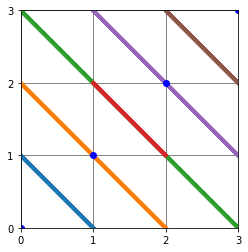

[(1, 4), (2, 4)] [(2, 2), (1, 4), (2, 2)]


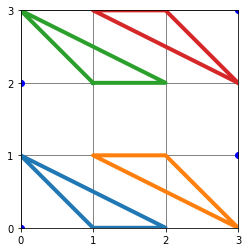

[(1, 4), (2, 4)] [(1, 2), (2, 4), (1, 2)]


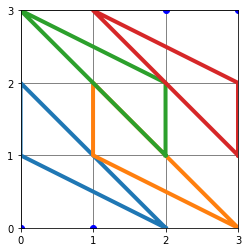

[(1, 4), (2, 4)] [(1, 2), (2, 2), (1, 2), (2, 2)]


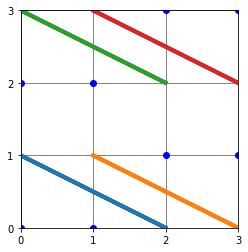

[(1, 4), (2, 4)] [(2, 2), (1, 2), (2, 2), (1, 2)]


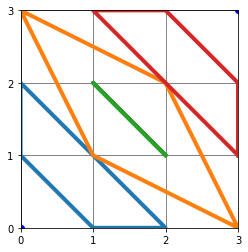

In [8]:
# i=[(1,8),(2,8)]
# for j in BoSDsquare(64,2):
#     if len(j)==3 or len(j)==2:
#         print(i,j)
#         OrbitPictures(i,j)
        

    
a=[(1,4),(2,4)]
b=[(2,4),(1,4)]
c=[(2,2),(1,4),(2,2)]
d=[(1,2),(2,4),(1,2)]
e=[(1,2),(2,2),(1,2),(2,2)]
f=[(2,2),(1,2),(2,2),(1,2)]

print(a,b)
OrbitPictures(a,b)
print(a,c)
OrbitPictures(a,c)
print(a,d)
OrbitPictures(a,d)
print(a,e)
OrbitPictures(a,e)
print(a,f)
OrbitPictures(a,f)

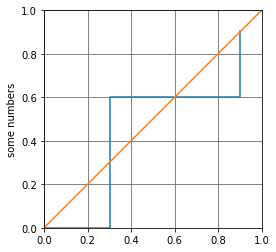

In [21]:
a=math.log(2,10)
b=math.log(4,10)

plt.grid(b=True, which='major', color='#666666', linestyle='-')
plt.plot([0, a, a,a+b,a+b], [0, 0, b,b,b+a])
plt.plot([0, 1], [0, 1])
plt.gca().set_aspect('equal', adjustable='box')
plt.axis([0, 1, 0, 1])
plt.show()

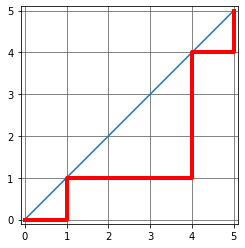

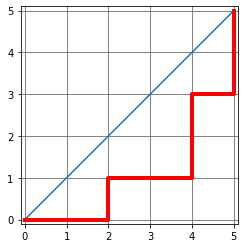

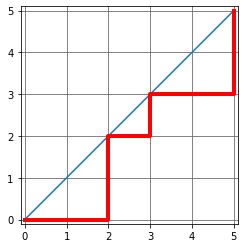

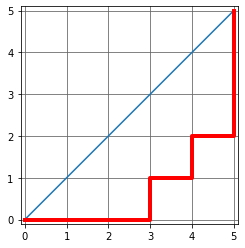

In [17]:
plt.grid(b=True, which='major', color='#666666', linestyle='-')
plt.plot([0, 5], [0, 5])
plt.plot([0, 1,1, 4,4,5,5], [0, 0,1, 1,4,4,5],lw=4,color='r')
plt.gca().set_aspect('equal', adjustable='box')
plt.axis([-0.1, 5.1, -0.1, 5.1])
plt.show()
plt.grid(b=True, which='major', color='#666666', linestyle='-')
plt.plot([0, 5], [0, 5])
plt.plot([0, 2,2, 4,4,5,5], [0, 0,1, 1,3,3,5],lw=4,color='r')
plt.gca().set_aspect('equal', adjustable='box')
plt.axis([-0.1, 5.1, -0.1, 5.1])
plt.show()
plt.grid(b=True, which='major', color='#666666', linestyle='-')
plt.plot([0, 5], [0, 5])
plt.plot([0, 2,2, 3,3,5,5], [0, 0,2, 2,3,3,5],lw=4,color='r')
plt.gca().set_aspect('equal', adjustable='box')
plt.axis([-0.1, 5.1, -0.1, 5.1])
plt.show()
plt.grid(b=True, which='major', color='#666666', linestyle='-')
plt.plot([0, 5], [0, 5])
plt.plot([0, 3,3, 4,4,5,5], [0, 0,1, 1,2,2,5],lw=4,color='r')
plt.gca().set_aspect('equal', adjustable='box')
plt.axis([-0.1, 5.1, -0.1, 5.1])
plt.show()

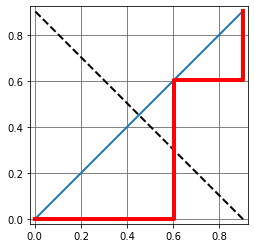

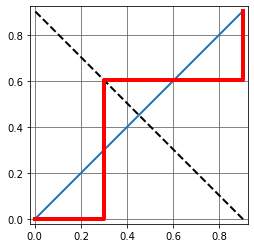

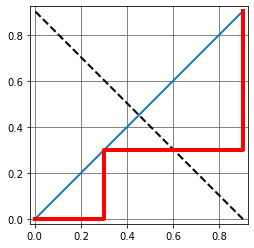

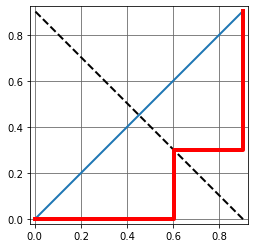

In [30]:
def JOFWalk2D_square(JOF):
    ends=1
    for j in JOF:
        if j[0]==1:
            ends=ends*j[1]
    xplot=[0]
    yplot=[0]
    for i in JOF:
        if i[0]==1:
            xplot.append(xplot[-1]+math.log(i[1],10))
            yplot.append(yplot[-1])
        if i[0]==2:
            xplot.append(xplot[-1])
            yplot.append(yplot[-1]+math.log(i[1],10))
    n=xplot[-1]
    plt.grid(b=True, which='major', color='#666666', linestyle='-')
    plt.plot([0, n], [0, n], linewidth=2)
    plt.plot([n, 0], [0, n], color='k', linestyle = 'dashed', linewidth=2)
    plt.plot(xplot, yplot, color='red', linewidth=4)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.axis([-0.02, math.log(ends,10)+0.02, -0.02, math.log(ends,10)+0.02])
    plt.show()

JOFWalk2D_square([(1,4),(2,4),(1,2),(2,2)]) 
JOFWalk2D_square([(1,2),(2,4),(1,4),(2,2)]) 
JOFWalk2D_square([(1,2),(2,2),(1,4),(2,4)]) 
JOFWalk2D_square([(1,4),(2,2),(1,2),(2,4)]) 

In [203]:
def SpacingSS(JOF):
    m=NumberOfAxis(JOF)
    SSsets=[]
    for i in range(1,m+1):
        SSsets.append(SumSet(JOF,i))
    spacing=[]
    for s in SSsets:
        if len(s)==1:
            spacing.append([0])
        else:
            current=[]
            nj=len(s)
            for j in range(0,nj-1):
                current.append(int(s[j+1]-s[j]))
            spacing.append(current)
    return(spacing)
print(SpacingSS([(1, 2), (2, 4), (1, 2), (2, 2)]))

[[1, 7, 1], [2, 2, 2, 10, 2, 2, 2]]


In [212]:
def TwinSpacing2DSS(n):
    joflist=[]
    for i in BoJOF(n):
        if NumberOfAxis(i)==2:
            joflist.append(i)
    spacinglist=[]
    counter=0
    for jof in joflist:
        spaceset=SpacingSS(jof)
        print(spaceset)
        rev=[spaceset[1],spaceset[0]]
        if rev in spacinglist:
            counter+=1
            print(n,jof,joflist[spacinglist.index(rev)],spaceset)
        spacinglist.append(spaceset)
    if counter==0:
        print(n,"no Spacing")
        
TwinSpacing2DSS(36)

[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [18]]
[[1], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]]
[[1, 1, 1], [4, 4, 4, 4, 4, 4, 4, 4]]
[[1, 1, 1, 1, 1, 1, 1, 1], [9, 9, 9]]
[[2], [1, 3, 1, 3, 1, 3, 1, 3, 1, 3, 1, 3, 1, 3, 1, 3, 1]]
[[2, 2, 2, 2, 2, 2, 2, 2], [1, 17, 1]]
[[9], [1, 1, 1, 1, 1, 1, 1, 1, 10, 1, 1, 1, 1, 1, 1, 1, 1]]
[[1, 1], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]]
[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], [12, 12]]
[[1, 1, 1, 1, 1], [6, 6, 6, 6, 6]]
[[3], [1, 1, 4, 1, 1, 4, 1, 1, 4, 1, 1, 4, 1, 1, 4, 1, 1]]
[[6], [1, 1, 1, 1, 1, 7, 1, 1, 1, 1, 1, 7, 1, 1, 1, 1, 1]]
[[2, 2], [1, 5, 1, 5, 1, 5, 1, 5, 1, 5, 1]]
[[2, 2, 2, 2, 2], [1, 11, 1, 11, 1]]
[[6, 6], [1, 1, 1, 1, 1, 13, 1, 1, 1, 1, 1]]
[[3, 3, 3, 3, 3], [1, 1, 16, 1, 1]]
[[3, 3, 3], [1, 1, 10, 1, 1, 10, 1, 1]]
[[4, 4], [1, 1, 1, 9, 1, 1, 1, 9, 1, 1, 1]]
[[3, 3], [1, 1, 7, 1, 1, 7, 1, 1, 7, 1, 1]]
[[1, 1, 4, 1, 1], [3, 9, 3, 9, 3]]
[[1, 3, 1, 3, 1], [2, 10, 2, 10, 2]]
[[1, 5, 1], [2, 2, 8, 2, 2, 8, 2, 2]]
[[1,

In [210]:
for n in range(10,50):
    TwinSpacing2DSS(n)

10 no Spacing
11 no Spacing
12 no Spacing
13 no Spacing
14 no Spacing
15 no Spacing
16 no Spacing
17 no Spacing
18 no Spacing
19 no Spacing
20 no Spacing
21 no Spacing
22 no Spacing
23 no Spacing
24 no Spacing
25 no Spacing
26 no Spacing
27 no Spacing
28 no Spacing
29 no Spacing
30 no Spacing
31 no Spacing
32 no Spacing
33 no Spacing
34 no Spacing
35 no Spacing
36 no Spacing
37 no Spacing
38 no Spacing
39 no Spacing
40 no Spacing
41 no Spacing
42 no Spacing
43 no Spacing
44 no Spacing
45 no Spacing
46 no Spacing
47 no Spacing
48 no Spacing
49 no Spacing


In [246]:
def SpacingSD(JOF):
    m=NumberOfAxis(JOF)
    SDsets=[]
    for i in range(1,m+1):
        SDsets.append(SDSet(JOF,i))
    spacing=[]
    for s in SDsets:
        if len(s)==1:
            spacing.append([0])
        else:
            current=[]
            nj=len(s)
            for j in range(0,nj-1):
                current.append(int(s[j+1]-s[j]))
            spacing.append(current)
    return(spacing)
print(SpacingSD([(1, 2), (2, 4), (1, 2), (3, 2)]))

[[1], [2], [0]]


In [219]:
def SDTwinSpacing2D(n):
    joflist=[]
    for i in BoJOF(n):
        if NumberOfAxis(i)==2:
            joflist.append(i)
    spacinglist=[]
    counter=0
    for jof in joflist:
        spaceset=SpacingSD(jof)
        rev=[spaceset[1],spaceset[0]]
        if rev in spacinglist:
            counter+=1
            print(n,jof,joflist[spacinglist.index(rev)],spaceset)
        spacinglist.append(spaceset)
    if counter==0:
        print(n,"no Spacing")
        
SDTwinSpacing2D(35)

35 no Spacing


In [224]:
for n in range(4,61):
    SDTwinSpacing2D(n)

4 no Spacing
5 no Spacing
6 [(1, 3), (2, 2)] [(1, 2), (2, 3)] [[0], [0]]
7 no Spacing
8 [(2, 2), (1, 2), (2, 2)] [(1, 4), (2, 2)] [[0], [1]]
9 no Spacing
10 no Spacing
11 no Spacing
12 [(2, 2), (1, 3), (2, 2)] [(1, 4), (2, 3)] [[0], [1]]
12 [(2, 3), (1, 2), (2, 2)] [(1, 6), (2, 2)] [[0], [1, 1]]
13 no Spacing
14 no Spacing
15 no Spacing
16 [(2, 4), (1, 2), (2, 2)] [(1, 8), (2, 2)] [[0], [1, 1, 1]]
16 [(1, 2), (2, 2), (1, 2), (2, 2)] [(2, 2), (1, 4), (2, 2)] [[1], [2]]
17 no Spacing
18 [(2, 3), (1, 3), (2, 2)] [(1, 6), (2, 3)] [[0], [1, 1]]
19 no Spacing
20 [(2, 5), (1, 2), (2, 2)] [(1, 10), (2, 2)] [[0], [1, 1, 1, 1]]
21 no Spacing
22 no Spacing
23 no Spacing
24 [(2, 6), (1, 2), (2, 2)] [(1, 12), (2, 2)] [[0], [1, 1, 1, 1, 1]]
24 [(2, 4), (1, 3), (2, 2)] [(1, 8), (2, 3)] [[0], [1, 1, 1]]
24 [(1, 2), (2, 3), (1, 2), (2, 2)] [(2, 2), (1, 6), (2, 2)] [[1], [2, 2]]
24 [(1, 3), (2, 2), (1, 2), (2, 2)] [(2, 3), (1, 4), (2, 2)] [[1, 1], [3]]
25 no Spacing
26 no Spacing
27 no Spacing
28 [(2, 7

In [240]:
def SDTwinSpacing2D_return(n):
    joflist=[]
    for i in BoJOF(n):
        if NumberOfAxis(i)==2:
            joflist.append(i)
    spacinglist=[]
    final=[]
    for jof in joflist:
        spaceset=SpacingSD(jof)
        rev=[spaceset[1],spaceset[0]]
        if rev in spacinglist:
            final.append([n,jof,joflist[spacinglist.index(rev)],spaceset])
        spacinglist.append(spaceset)
    return(final)

asd=SDTwinSpacing2D_return(32)
for a in asd:
    if a[2][-1][1]==2:
        n1=0.5
        n2=0.5
        for b in a[1]:
            if b[0]==1:
                n1*=b[1]
            if b[0]==2:
                n2*=b[1]
        print(n1,n2,n1*n2,n1*n2/2)
        print(SDSet(a[1],1),SDSet(a[1],2))
        print(SDSet(a[2],2),SDSet(a[2],1))
        print("")

1.0 8.0 8.0 4.0
[4] [4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5]
[8] [0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5]

2.0 4.0 8.0 4.0
[3.5, 4.5] [5, 7, 9, 11]
[7.5, 8.5] [1, 3, 5, 7]

4.0 2.0 8.0 4.0
[2.5, 3.5, 4.5, 5.5] [6, 10]
[6.5, 7.5, 8.5, 9.5] [2, 6]

2.0 4.0 8.0 4.0
[3, 5] [5.5, 6.5, 9.5, 10.5]
[7, 9] [1.5, 2.5, 5.5, 6.5]



In [201]:
for a5 in range(1,4):
    for a7 in range(0,4):
        for a11 in range(0,4):
            print("{},{},{}\t {}".format(a5,a7,a11,TwinSpacing2D((5**a5)*(7**a7)*(11**a11),2)))

1,0,0	 (5, 'no Spacing')
1,0,1	 (55, 'no Spacing')
1,0,2	 (605, 'no Spacing')
1,0,3	 (6655, 'no Spacing')
1,1,0	 (35, 'no Spacing')
1,1,1	 (385, 'no Spacing')
1,1,2	 (4235, 'no Spacing')
1,1,3	 (46585, 'no Spacing')
1,2,0	 (245, 'no Spacing')
1,2,1	 (2695, 'no Spacing')
1,2,2	 (29645, 'no Spacing')


KeyboardInterrupt: 

In [252]:
def TwinSpacing2Dlist(n,d):
    
    joflist=[]
    for i in BoJOF(n):
        if NumberOfAxis(i)==d:
            joflist.append(i)
    
    spacinglist=[]
    jofspacelist=[]
    for jof in joflist:
        spacings=SpacingSD(jof)
        lenspace=[]
        for s in spacings:
            lenspace.append(len(s))
        if spacings in spacinglist:
            print(spacings,jof,lenspace)
            jofspacelist.append([spacings,jof,lenspace])
        else:
            perms=list(permutations(spacings))
            for p in perms:
                spacinglist.append(list(p))
    
    
        
TwinSpacing2Dlist(64,3)

[[0], [1], [8, 8, 8]] [(2, 2), (1, 2), (2, 2), (3, 8)] [1, 1, 3]
[[0], [4, 4, 4], [1]] [(3, 2), (1, 2), (2, 8), (3, 2)] [1, 3, 1]
[[0], [1, 1, 1, 1, 1, 1, 1], [0]] [(2, 8), (1, 2), (2, 2), (3, 2)] [1, 7, 1]
[[0], [0], [1, 1, 1, 1, 1, 1, 1]] [(3, 8), (1, 2), (2, 2), (3, 2)] [1, 1, 7]
[[1, 1, 1], [0], [8]] [(1, 8), (3, 2), (2, 2), (3, 2)] [3, 1, 1]
[[2, 2, 2], [0], [1]] [(3, 2), (1, 8), (2, 2), (3, 2)] [3, 1, 1]
[[0], [0], [2, 2, 2, 2, 2, 2, 2]] [(1, 2), (3, 8), (2, 2), (3, 2)] [1, 1, 7]
[[0], [8], [1, 1, 1]] [(3, 4), (1, 2), (2, 4), (3, 2)] [1, 1, 3]
[[0], [1, 1, 1], [16]] [(2, 4), (1, 2), (2, 2), (3, 4)] [1, 3, 1]
[[4], [0], [1, 1, 1]] [(3, 4), (1, 4), (2, 2), (3, 2)] [1, 1, 3]
[[1], [0], [4, 4, 4]] [(1, 4), (3, 4), (2, 2), (3, 2)] [1, 1, 3]
[[1], [2], [16]] [(1, 2), (2, 2), (1, 2), (2, 2), (3, 4)] [1, 1, 1]
[[0], [1], [4, 12, 4]] [(2, 2), (1, 2), (3, 2), (2, 2), (3, 4)] [1, 1, 3]
[[0], [1], [2, 14, 2]] [(2, 2), (3, 2), (1, 2), (2, 2), (3, 4)] [1, 1, 3]
[[0], [2], [1, 15, 1]] [(3, 2), 

In [35]:
def TwinSpacingnD(n,d):
    
    joflist=[]
    for i in BoJOF(n):
        if NumberOfAxis(i)==d:
            joflist.append(i)
    spacinglist=[[0]]
    
    for j in joflist:
#         print("")
#         print("j is",j)
#         print("spacinglist is",spacinglist,len(spacinglist))
#         print("Spacing(j) is",Spacing(j))
#         print("sorted(Spacing(j)) is",sorted(Spacing(j)))
#         if Spacing(j) in spacinglist:
#             pass
        counter2=0
        for i in spacinglist:
#             print("i is",i)
            
            if sorted(Spacing(j)) == i[0]:
                i.append(j)
                break
            else:
                counter2+=1
            if counter2==len(spacinglist):
                spacinglist.append([sorted(Spacing(j)),j])
                break
    
    for i in spacinglist:
        if len(i)>2:
            print(n,i)

In [228]:
j1=
jof1=[(2,int(n/6)),(1,2),(2,2)]
jof2=[(1,int(n/3)),(1,2),(2,2)]
print(SDSet(jof1,1),SDSet(jof1,2))
print(SDSet(jof2,2),SDSet(jof2,1))

[6] [6.5, 7.5, 8.5, 9.5, 10.5, 11.5]
[12] [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]


In [296]:
N=24
e=4
mod=N+e
u=5
t1=0
t2=0
T=(t1+t2)%mod

JOF=[(1,4),(2,3),(1,2)]
print("JOF=",JOF)
n1=1
n2=1
for p in JOF:
    if p[0]==1:
        n1*=p[1]
    if p[0]==2:
        n2*=p[1]

asd=[(i+T)%mod for i in range(0,N)]
temp=[]
for a in asd:
    temp.append( (a*u)%mod )
print(temp)
print("")

A1=SumSet(JOF,1)
A2=SumSet(JOF,2)
D1=[ (u*(a1+t1))%mod for a1 in A1 ]
D2=[ (u*(a2+t2))%mod for a2 in A2 ]
print(A1,"  ", (u*(A1[-1]+2*t1))%mod)
print(A2)
print("-----")
print(D1)
print(D2)

rows=[]
for i in D2:
    ro=[]
    for j in D1:
        ro.append( (i+j)%mod )
    rows.append(ro)
print("")
print(np.array(rows))
# print("")
# print("")

# t1=7
# t2=4+mod-7
# T=(t1+t2)%mod
# A1=SumSet(JOF,1)
# A2=SumSet(JOF,2)
# D1=[ (u*(a1+t1))%mod for a1 in A1 ]
# D2=[ (u*(a2+t2))%mod for a2 in A2 ]
# print(A1,"  ", (u*(A1[-1]+2*t1))%mod)
# print(A2)
# print("-----")
# print(D1)
# print(D2)

# rows=[]
# for i in D2:
#     ro=[]
#     for j in D1:
#         ro.append( (i+j)%mod )
#     rows.append(ro)
# print("")
# print(np.array(rows))




JOF= [(1, 4), (2, 3), (1, 2)]
[0, 5, 10, 15, 20, 25, 2, 7, 12, 17, 22, 27, 4, 9, 14, 19, 24, 1, 6, 11, 16, 21, 26, 3]

[0, 1, 2, 3, 12, 13, 14, 15]    19
[0, 4, 8]
-----
[0, 5, 10, 15, 4, 9, 14, 19]
[0, 20, 12]

[[ 0  5 10 15  4  9 14 19]
 [20 25  2  7 24  1  6 11]
 [12 17 22 27 16 21 26  3]]


In [294]:
N=24
e=-1
mod=N+e
u=3
t1=0
t2=0
T=(t1+t2)%mod

JOF=[(1,8),(2,3)]
print("JOF=",JOF)
n1=1
n2=1
for p in JOF:
    if p[0]==1:
        n1*=p[1]
    if p[0]==2:
        n2*=p[1]

asd=[(i+T)%mod for i in range(0,N)]
temp=[]
for a in asd:
    temp.append( (a*u)%mod )
print(temp)
# prc=[temp[b*n1:b*n1+n1] for b in range(0,int(N/n1))]
# print(np.array(prc))
print("")

A1=SumSet(JOF,1)
A2=SumSet(JOF,2)
D1=[ (u*(a1+t1))%mod for a1 in A1 ]
D2=[ (u*(a2+t2))%mod for a2 in A2 ]
print(A1,"  ", (u*(A1[-1]+2*t1))%mod)
print(A2)
print("-----")
print(D1)
print(D2)

rows=[]
for i in D2:
    ro=[]
    for j in D1:
        ro.append( (i+j)%mod )
    rows.append(ro)
print("")
print(np.array(rows))
print("")
print("")

t1=7
t2=4+mod-7
T=(t1+t2)%mod
A1=SumSet(JOF,1)
A2=SumSet(JOF,2)
D1=[ (u*(a1+t1))%mod for a1 in A1 ]
D2=[ (u*(a2+t2))%mod for a2 in A2 ]
print(A1,"  ", (u*(A1[-1]+2*t1))%mod)
print(A2)
print("-----")
print(D1)
print(D2)

rows=[]
for i in D2:
    ro=[]
    for j in D1:
        ro.append( (i+j)%mod )
    rows.append(ro)
print("")
print(np.array(rows))




JOF= [(1, 8), (2, 3)]
[0, 3, 6, 9, 12, 15, 18, 21, 1, 4, 7, 10, 13, 16, 19, 22, 2, 5, 8, 11, 14, 17, 20, 0]

[0, 1, 2, 3, 4, 5, 6, 7]    21
[0, 8, 16]
-----
[0, 3, 6, 9, 12, 15, 18, 21]
[0, 1, 2]

[[ 0  3  6  9 12 15 18 21]
 [ 1  4  7 10 13 16 19 22]
 [ 2  5  8 11 14 17 20  0]]


[0, 1, 2, 3, 4, 5, 6, 7]    17
[0, 8, 16]
-----
[21, 1, 4, 7, 10, 13, 16, 19]
[14, 15, 16]

[[12 15 18 21  1  4  7 10]
 [13 16 19 22  2  5  8 11]
 [14 17 20  0  3  6  9 12]]


In [ ]:
JOF2=[(2,2),(1,6),(2,2)]

A1=SumSet(JOF2,1)
A2=SumSet(JOF2,2)
D1=[ (u*(a1+t1))%mod for a1 in A1 ]
D2=[ (u*(a2+t2))%mod for a2 in A2 ]
print(A1,"  ", (u*(A1[-1]+2*t1))%mod)
print(A2,"  ", (u*(A2[-1]+2*t2))%mod)
print("-----")
print(D1)
print(D2)

rows=[]
for i in D2:
    ro=[]
    for j in D1:
        ro.append( (i+j)%mod )
    rows.append(ro)
print("")
print(np.array(rows))

In [284]:
mod=13
counter1=1
counter2=0
counter3=0
counter4=0
for t1 in range(0,mod):
    for t2 in range(0,mod):
        if (t1+t2)%mod==0:
            counter2+=1
        for t3 in range(0,mod):
            if (t1+t2+t3)%mod==0:
                counter3+=1
            for t4 in range(0,mod):
                if (t1+t2+t3+t4)%mod==0:
                    counter4+=1
print(counter1)
print(counter2)
print(counter3)
print(counter4)

1
13
169
2197


In [301]:
N=72
e=0
mod=N+e
u=5
t1=0
t2=0
t3=0
T=(t1+t2+t3)%mod

JOF=[(1,3),(2,2),(1,2),(3,3),(2,2)]
print("JOF=",JOF)
n1=1
n2=1
n3=1
for p in JOF:
    if p[0]==1:
        n1*=p[1]
    if p[0]==2:
        n2*=p[1]
    if p[0]==3:
        n3*=p[1]

A1=SumSet(JOF,1)
A2=SumSet(JOF,2)
A3=SumSet(JOF,3)
D1=[ (u*(a1+t1))%mod for a1 in A1 ]
D2=[ (u*(a2+t2))%mod for a2 in A2 ]
D3=[ (u*(a3+t3))%mod for a3 in A3 ]
print(A1)
print(A2)
print(A3)
print("-----")
print(D1)
print(D2)
print(D3)

rows=[]
for i in D2:
    ro=[]
    for j in D1:
        ro.append( (i+j)%mod )
    rows.append(ro)
print("")
print(np.array(rows))

for k in D3[1:]:
    newrows=[]
    for ro in rows:
        temp=[]
        for r in ro:
            temp.append( (r+k)%mod )
        newrows.append(temp)
    print("")
    print(np.array(newrows))


JOF= [(1, 3), (2, 2), (1, 2), (3, 3), (2, 2)]
[0, 1, 2, 6, 7, 8]
[0, 3, 36, 39]
[0, 12, 24]
-----
[0, 5, 10, 30, 35, 40]
[0, 15, 36, 51]
[0, 60, 48]

[[ 0  5 10 30 35 40]
 [15 20 25 45 50 55]
 [36 41 46 66 71  4]
 [51 56 61  9 14 19]]

[[60 65 70 18 23 28]
 [ 3  8 13 33 38 43]
 [24 29 34 54 59 64]
 [39 44 49 69  2  7]]

[[48 53 58  6 11 16]
 [63 68  1 21 26 31]
 [12 17 22 42 47 52]
 [27 32 37 57 62 67]]


In [298]:
asd=[0,1,2,3]
print(asd[1:])

[1, 2, 3]


In [9]:
dicelen2=[]
dicelen4=[]
dicelen5=[]
dicelen10=[]
dicelen20=[]
dicelen25=[]
dicelen50=[]

for i in list(BoJOF(100)):
    if len(i)>1:
        for j in range(1,NumberOfAxis(i)+1):
            if len(SumSet(i,j))==2:
                if SumSet(i,j) not in dicelen2:
                    dicelen2.append(SumSet(i,j))
            
            if len(SumSet(i,j))==4:
                if SumSet(i,j) not in dicelen4:
                    dicelen4.append(SumSet(i,j))
            
            if len(SumSet(i,j))==5:
                if SumSet(i,j) not in dicelen5:
                    dicelen5.append(SumSet(i,j))
            
            if len(SumSet(i,j))==10:
                if SumSet(i,j) not in dicelen10:
                    dicelen10.append(SumSet(i,j))
            
            if len(SumSet(i,j))==20:
                if SumSet(i,j) not in dicelen20:
                    dicelen20.append(SumSet(i,j))
            
            if len(SumSet(i,j))==25:
                if SumSet(i,j) not in dicelen25:
                    dicelen25.append(SumSet(i,j))
                    
            if len(SumSet(i,j))==50:
                if SumSet(i,j) not in dicelen50:
                    dicelen50.append(SumSet(i,j))
            

print(sorted(dicelen2))
print(sorted(dicelen4))
print(sorted(dicelen5))
print(sorted(dicelen10))
print(sorted(dicelen20))
print(sorted(dicelen25))
print(sorted(dicelen50))

print(len(sorted(dicelen2)))
print(len(sorted(dicelen4)))
print(len(sorted(dicelen5)))
print(len(sorted(dicelen10)))
print(len(sorted(dicelen20)))
print(len(sorted(dicelen25)))
print(len(sorted(dicelen50)))

[[0, 1], [0, 2], [0, 5], [0, 10], [0, 25], [0, 50]]
[[0, 1, 2, 3], [0, 1, 10, 11], [0, 1, 50, 51], [0, 5, 10, 15], [0, 5, 50, 55], [0, 25, 50, 75]]
[[0, 1, 2, 3, 4], [0, 2, 4, 6, 8], [0, 4, 8, 12, 16], [0, 5, 10, 15, 20], [0, 10, 20, 30, 40], [0, 20, 40, 60, 80]]
[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [0, 1, 2, 3, 4, 10, 11, 12, 13, 14], [0, 1, 2, 3, 4, 25, 26, 27, 28, 29], [0, 1, 2, 3, 4, 50, 51, 52, 53, 54], [0, 1, 4, 5, 8, 9, 12, 13, 16, 17], [0, 1, 10, 11, 20, 21, 30, 31, 40, 41], [0, 1, 20, 21, 40, 41, 60, 61, 80, 81], [0, 2, 4, 6, 8, 10, 12, 14, 16, 18], [0, 2, 4, 6, 8, 50, 52, 54, 56, 58], [0, 2, 20, 22, 40, 42, 60, 62, 80, 82], [0, 5, 10, 15, 20, 25, 30, 35, 40, 45], [0, 5, 10, 15, 20, 50, 55, 60, 65, 70], [0, 5, 20, 25, 40, 45, 60, 65, 80, 85], [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]]
[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59], [0, 1, 2, 3, 4, 25, 26, 27, 28, 29, 50, 51, 52, 53, 54, 

In [11]:
d12=["e","r","r2","r3","r4","r5","s","sr","sr2","sr3","sr4","sr5"]

set1=["e"]
set2=["e"]
count=0
for i in d12[1:]:
    for j in d12[d12.index(i)+1:]:
        for k in d12[d12.index(j)+1:]:
            print("")
            print("")
            for a in d12[1:]:
                if a!=i and a!=j and a!=k:
                    for b in d12[d12.index(a)+1:]:
                        if b!=i and b!=j and b!=k:
                            print(["e,{},{},{}".format(i,j,k)],"  and  ",["e,{},{}".format(a,b)])
                            count+=1
print(count)



['e,r,r2,r3']   and   ['e,r4,r5']
['e,r,r2,r3']   and   ['e,r4,s']
['e,r,r2,r3']   and   ['e,r4,sr']
['e,r,r2,r3']   and   ['e,r4,sr2']
['e,r,r2,r3']   and   ['e,r4,sr3']
['e,r,r2,r3']   and   ['e,r4,sr4']
['e,r,r2,r3']   and   ['e,r4,sr5']
['e,r,r2,r3']   and   ['e,r5,s']
['e,r,r2,r3']   and   ['e,r5,sr']
['e,r,r2,r3']   and   ['e,r5,sr2']
['e,r,r2,r3']   and   ['e,r5,sr3']
['e,r,r2,r3']   and   ['e,r5,sr4']
['e,r,r2,r3']   and   ['e,r5,sr5']
['e,r,r2,r3']   and   ['e,s,sr']
['e,r,r2,r3']   and   ['e,s,sr2']
['e,r,r2,r3']   and   ['e,s,sr3']
['e,r,r2,r3']   and   ['e,s,sr4']
['e,r,r2,r3']   and   ['e,s,sr5']
['e,r,r2,r3']   and   ['e,sr,sr2']
['e,r,r2,r3']   and   ['e,sr,sr3']
['e,r,r2,r3']   and   ['e,sr,sr4']
['e,r,r2,r3']   and   ['e,sr,sr5']
['e,r,r2,r3']   and   ['e,sr2,sr3']
['e,r,r2,r3']   and   ['e,sr2,sr4']
['e,r,r2,r3']   and   ['e,sr2,sr5']
['e,r,r2,r3']   and   ['e,sr3,sr4']
['e,r,r2,r3']   and   ['e,sr3,sr5']
['e,r,r2,r3']   and   ['e,sr4,sr5']


['e,r,r2,r4']   and   [

In [133]:
def Sum2dimMatrix(JOF):
    rows=[]
    numofrows=len(SumSet(JOF,2))
    numofcol=len(SumSet(JOF,1))
    for i in range(numofrows):
        rows.append([])
    rows[0]=SumSet(JOF,1)
    for j in enumerate(rows):
        if j[0]==0:
            pass
        else:
            for t in SumSet(JOF,1):
                rows[j[0]].append(SumSet(JOF,2)[j[0]]+t)
    return(np.array(rows))

In [23]:
s=14
for r in range(1,s):
    for t in range(0,s):
        print("{}(A+{})(mod {})".format(r,t,s))
        daset=(r*(Sum2dimMatrix([(1,3),(2,2),(1,2)])+np.array([[t,t,t,t,t,t],[t,t,t,t,t,t]]))%s)
        print(daset)
        tot=[]
        for i in daset:
            for j in i:
                tot.append(j)
        missing=[]
        for k in range(0,s):
            if k not in tot:
                missing.append(k)
        print(missing)
        print("")
    print("")
    print("--------------------------------")
    print("")

1(A+0)(mod 14)
[[ 0  1  2  6  7  8]
 [ 3  4  5  9 10 11]]
[12, 13]

1(A+1)(mod 14)
[[ 1  2  3  7  8  9]
 [ 4  5  6 10 11 12]]
[0, 13]

1(A+2)(mod 14)
[[ 2  3  4  8  9 10]
 [ 5  6  7 11 12 13]]
[0, 1]

1(A+3)(mod 14)
[[ 3  4  5  9 10 11]
 [ 6  7  8 12 13  0]]
[1, 2]

1(A+4)(mod 14)
[[ 4  5  6 10 11 12]
 [ 7  8  9 13  0  1]]
[2, 3]

1(A+5)(mod 14)
[[ 5  6  7 11 12 13]
 [ 8  9 10  0  1  2]]
[3, 4]

1(A+6)(mod 14)
[[ 6  7  8 12 13  0]
 [ 9 10 11  1  2  3]]
[4, 5]

1(A+7)(mod 14)
[[ 7  8  9 13  0  1]
 [10 11 12  2  3  4]]
[5, 6]

1(A+8)(mod 14)
[[ 8  9 10  0  1  2]
 [11 12 13  3  4  5]]
[6, 7]

1(A+9)(mod 14)
[[ 9 10 11  1  2  3]
 [12 13  0  4  5  6]]
[7, 8]

1(A+10)(mod 14)
[[10 11 12  2  3  4]
 [13  0  1  5  6  7]]
[8, 9]

1(A+11)(mod 14)
[[11 12 13  3  4  5]
 [ 0  1  2  6  7  8]]
[9, 10]

1(A+12)(mod 14)
[[12 13  0  4  5  6]
 [ 1  2  3  7  8  9]]
[10, 11]

1(A+13)(mod 14)
[[13  0  1  5  6  7]
 [ 2  3  4  8  9 10]]
[11, 12]


--------------------------------

2(A+0)(mod 14)
[[ 0  2  4 12 

In [21]:
def gcd(p,q):
# Create the gcd of two positive integers.
    while q != 0:
        p, q = q, p%q
    return p
def is_coprime(x, y):
    return gcd(x, y) == 1
s=13
for r in range(1,s):
    if is_coprime(r,s)==1:
        for t in range(0,s):
            print("{}(A+{})(mod {})".format(r,t,s))
            daset=(r*(Sum2dimMatrix([(1,3),(2,2),(1,2)])+np.array([[t,t,t,t,t,t],[t,t,t,t,t,t]]))%s)
            print(daset)
            tot=[]
            for i in daset:
                for j in i:
                    tot.append(j)
            for k in range(0,13):
                if k not in tot:
                    print(k)
                    break
            print("")

1(A+0)(mod 14)
[[ 0  1  2  6  7  8]
 [ 3  4  5  9 10 11]]
[12, 13]

1(A+1)(mod 14)
[[ 1  2  3  7  8  9]
 [ 4  5  6 10 11 12]]
[0, 13]

1(A+2)(mod 14)
[[ 2  3  4  8  9 10]
 [ 5  6  7 11 12 13]]
[0, 1]

1(A+3)(mod 14)
[[ 3  4  5  9 10 11]
 [ 6  7  8 12 13  0]]
[1, 2]

1(A+4)(mod 14)
[[ 4  5  6 10 11 12]
 [ 7  8  9 13  0  1]]
[2, 3]

1(A+5)(mod 14)
[[ 5  6  7 11 12 13]
 [ 8  9 10  0  1  2]]
[3, 4]

1(A+6)(mod 14)
[[ 6  7  8 12 13  0]
 [ 9 10 11  1  2  3]]
[4, 5]

1(A+7)(mod 14)
[[ 7  8  9 13  0  1]
 [10 11 12  2  3  4]]
[5, 6]

1(A+8)(mod 14)
[[ 8  9 10  0  1  2]
 [11 12 13  3  4  5]]
[6, 7]

1(A+9)(mod 14)
[[ 9 10 11  1  2  3]
 [12 13  0  4  5  6]]
[7, 8]

1(A+10)(mod 14)
[[10 11 12  2  3  4]
 [13  0  1  5  6  7]]
[8, 9]

1(A+11)(mod 14)
[[11 12 13  3  4  5]
 [ 0  1  2  6  7  8]]
[9, 10]

1(A+12)(mod 14)
[[12 13  0  4  5  6]
 [ 1  2  3  7  8  9]]
[10, 11]

1(A+13)(mod 14)
[[13  0  1  5  6  7]
 [ 2  3  4  8  9 10]]
[11, 12]


--------------------------------


----------------------------

In [74]:
def gcd(p,q):
# Create the gcd of two positive integers.
    while q != 0:
        p, q = q, p%q
    return p
def is_coprime(x, y):
    return gcd(x, y) == 1
s=17
for r in range(1,s):
    if is_coprime(r,s)==1:
        for t in range(0,s):

            print("{}(A+{})(mod {})".format(r,t,s))
            daset=(r*(Sum2dimMatrix([(1,2),(2,2),(1,2),(2,2)])+np.array([[t,t,t,t],[t,t,t,t],[t,t,t,t],[t,t,t,t]]))%s)
            print(daset)
            tot=[]
            for i in daset:
                for j in i:
                    tot.append(j)
            for k in range(0,17):
                if k not in tot:
                    print(k)
                    break
            print("")

1(A+0)(mod 17)
[[ 0  1  4  5]
 [ 2  3  6  7]
 [ 8  9 12 13]
 [10 11 14 15]]
16

1(A+1)(mod 17)
[[ 1  2  5  6]
 [ 3  4  7  8]
 [ 9 10 13 14]
 [11 12 15 16]]
0

1(A+2)(mod 17)
[[ 2  3  6  7]
 [ 4  5  8  9]
 [10 11 14 15]
 [12 13 16  0]]
1

1(A+3)(mod 17)
[[ 3  4  7  8]
 [ 5  6  9 10]
 [11 12 15 16]
 [13 14  0  1]]
2

1(A+4)(mod 17)
[[ 4  5  8  9]
 [ 6  7 10 11]
 [12 13 16  0]
 [14 15  1  2]]
3

1(A+5)(mod 17)
[[ 5  6  9 10]
 [ 7  8 11 12]
 [13 14  0  1]
 [15 16  2  3]]
4

1(A+6)(mod 17)
[[ 6  7 10 11]
 [ 8  9 12 13]
 [14 15  1  2]
 [16  0  3  4]]
5

1(A+7)(mod 17)
[[ 7  8 11 12]
 [ 9 10 13 14]
 [15 16  2  3]
 [ 0  1  4  5]]
6

1(A+8)(mod 17)
[[ 8  9 12 13]
 [10 11 14 15]
 [16  0  3  4]
 [ 1  2  5  6]]
7

1(A+9)(mod 17)
[[ 9 10 13 14]
 [11 12 15 16]
 [ 0  1  4  5]
 [ 2  3  6  7]]
8

1(A+10)(mod 17)
[[10 11 14 15]
 [12 13 16  0]
 [ 1  2  5  6]
 [ 3  4  7  8]]
9

1(A+11)(mod 17)
[[11 12 15 16]
 [13 14  0  1]
 [ 2  3  6  7]
 [ 4  5  8  9]]
10

1(A+12)(mod 17)
[[12 13 16  0]
 [14 15  1  2]
 [

In [185]:
import timeit

start = timeit.default_timer()

list(AllJOF(256))

stop = timeit.default_timer()

print('a Time: ', stop - start)

a Time:  238.62033329900078


In [50]:
averagetime(SDSet,SDSet3,[(1,6),(2,2),(1,2),(2,2),(1,4),(2,2),(1,4),(2,2)],1)

(0.24890434002827533, 0.22592756999983976)

In [96]:
import timeit


def averagetime(f1,f2,*arg,t=100):
    timelist1=[]
    timelist2=[]
    for i in range(t):
        start = timeit.default_timer()

        f1(*arg)

        stop = timeit.default_timer()

        timelist1.append((stop - start)*1000)
    for i2 in range(t):
        start = timeit.default_timer()

        f2(*arg)

        stop = timeit.default_timer()

        timelist2.append((stop - start)*1000)
    
    r1=0
    for j in timelist1:
        r1+=j
    r11=r1/t
    
    r2=0
    for j in timelist2:
        r2+=j
    r22=r2/t
    return(r11,r22)


In [76]:
jkl=[[1,0,0,1,2],[2,2,1,0,0],[1,1,0,0,2],[0,0,0,0,1],[0,1,1,1,1]]

averagetime(bleh1,bleh2,jkl)

11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 10
11 1

(0.04713999922387302, 0.032714997651055455)

In [101]:
averagetime(NumberOfAxis,NumberOfAxis2,JOF,t=10000)

(0.0020964398281648755, 0.0018066500197164714)

In [43]:
from functools import reduce
from math import sqrt
def factors2(n):
        step = 2 if n%2 else 1
        return set(reduce(list.__add__,
                    ([i, n//i] for i in range(1, int(sqrt(n))+1, step) if n % i == 0)))

In [191]:
import timeit

start = timeit.default_timer()

All_BOJFs_for_vector_n([10])
All_BOJFs_for_vector_n([2,5])
All_BOJFs_for_vector_n([5,2])

stop = timeit.default_timer()

print('a Time: ', stop - start)




start2 = timeit.default_timer()

BoJOF(10)

stop2 = timeit.default_timer()

print('b Time: ', stop2 - start2)

a Time:  0.0001545000122860074
b Time:  5.64999645575881e-05


In [30]:
import timeit
    

start = timeit.default_timer()


print(expanded_bojf_permutation_checker([[1],[1],[2],[1],[2],[2],[3],[4],[1],[2],[1],[2],[2],[3]]))


stop = timeit.default_timer()

print('a Time: ', stop - start)




start2 = timeit.default_timer()


print(expanded_bojf_permutation_checker2([[1],[1],[2],[1],[2],[2],[3],[4],[1],[2],[1],[2],[2],[3]]))

stop2 = timeit.default_timer()

print('b Time: ', stop2 - start2)



# start3 = timeit.default_timer()

# zeros=sum([j.count(0) for j in jkl])
# ones=sum([j.count(1) for j in jkl])
# print(zeros,ones)

# stop3 = timeit.default_timer()

# print('c Time: ', stop3 - start3)

False
a Time:  0.0003435999999510386
False
b Time:  0.00013139999998657004


In [122]:
print(timeit.timeit(stmt='Num_BOJFs_p_powers([3,2,2,2])', globals=globals(), number=1000))
print(timeit.timeit(stmt='Num_BOJFs_p_powers2([3,2,2,2])', globals=globals(), number=1000))

0.0019035999994230224
0.0023552000002382556


In [ ]:
jof=[[1],[1],[2],[1],[2],[2],[3],[4],[1],[2],[1],[2],[2],[3]]
jseq=[]
for ell in jof:
    jseq.append()

In [8]:
import timeit 


start = timeit.default_timer()

perms=[[[1,2],[2,2],[3,2],[4,2],[1,3],[2,3],[3,3],[4,3]]]

got=[]
for p in perms:
    temp=[]
    axis=p[0][0]
    prod=p[0][1]
    for i in range(1,9):
        if i==8:
            temp.append([axis,prod])
        elif p[i][0]==axis:
            prod*=p[i][1]
        else:
            temp.append([axis,prod])
            axis=p[i][0]
            prod=p[i][1]
    if temp not in got:
        got.append(temp)

mtx_got=[]


for perm in got:
    mtx=OverLapMtx(perm)
    rows=mtx.tolist()
    if rows not in mtx_got:
        mtx_got.append(rows)
        
print(len(mtx_got))
stop = timeit.default_timer()

print('a Time: ', stop - start)

1
a Time:  0.0013951999999335385


[(1, 3), (2, 2), (1, 5)]


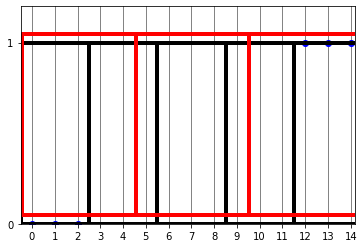

None


In [2]:
p1=3
p2=5


# primes=[3, 5, 7, 11, 13, 17, 19, 23, 29, 31, 37, 41, 43, 47, 53, 59, 61, 67, 71]
# for i in primes:
#     print([(1,p1),(2,i),(1,p2)])
#     print(OrbitSinglePicturesBoxesForp1p2p3(p1,i,p2))
for i in range(2,3):
    print([(1,p1),(2,i),(1,p2)])
    print(OrbitSinglePicturesBoxesForp1p2p3(p1,i,p2))

In [86]:
a=[[0], [1], [2], [3], [4], [5], [6], [7], [8], [9], [10], [11]]
b=[[0], [1, 2], [3], [4], [5, 6], [7], [8], [9, 10], [11]]
c=[[0], [1], [2], [3, 6], [4, 7], [5, 8], [9], [10], [11]]
d=[[0], [1], [2, 3, 4], [5, 6], [7, 9, 8], [10], [11]]
e=[[0], [1], [2, 4, 3], [5, 6], [7, 8, 9], [10], [11]]
f=[[0], [1, 3, 4, 2], [5], [6], [7, 9, 10, 8], [11]]
g=[[0], [1, 2, 4, 3], [5], [6], [7, 8, 10, 9], [11]]
h=[[0], [1], [2, 4, 8, 6], [3, 5, 9, 7], [10], [11]]
i=[[0], [1], [2, 6, 8, 4], [3, 7, 9, 5], [10], [11]]
j=[[0], [1, 6, 3, 7, 9, 10, 5, 8, 4, 2], [11]]
k=[[0], [1, 2, 4, 8, 5, 10, 9, 7, 3, 6], [11]]

collection=[a,b,c,d,e,f,g,h,i,j,k]

for x in collection:
    print("")
    PermMatrix(x)



[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0